# Hypothesis: 
## Changes in renewable energy consumption at the state level are positively associated with changes in renewable energy employment, and this relationship can be observed in both temporal trends (growth rates) and spatial patterns (state and county maps).

## Relevance: 
The U.S. energy transition is reshaping both energy consumption and the workforce. Policymakers, utilities, and local governments need tools that connect where and how energy is being consumed with where and how jobs are being created or lost. By integrating USEER employment data (2023–2025) with EIA SEDS consumption data (2021–2023), this project builds a reproducible pipeline for exploring those relationships across time, energy categories, and geographic scales (county, state, region, and national).

## Investigation (Scope of the Project)

This project:

Cleans and harmonizes USEER county and public (state-level) employment datasets for 2023–2025 into a coherent analytic structure (Goal 1).

Uses those cleaned data to construct state-level energy employment trend tables and visualizations across multiple energy categories (Goal 2).

Merges state-level employment trends with SEDS state-level energy consumption for 2021–2023 and computes growth rates and correlations between jobs and consumption by energy category (Goal 3).

Builds both static and interactive spatial visualizations, including:

A North Carolina county-level employment map prototype, and

Fully interactive U.S. employment and consumption HTML maps with toggles for geography, energy type, and metric (Goal 4).

## Intention / What the Final Project Actually Delivers

The final project is best understood as an end-to-end data and visualization framework, not just a one-off analysis:

It standardizes messy multi-year, multi-source energy employment data.

It links employment and consumption data in a way that can be extended to more years and additional states.

It quantifies growth and correlation at the state level for renewable vs fossil categories.

It exposes these patterns via reproducible summary tables, static figures, and interactive maps that a policymaker or another data scientist can explore without touching the underlying code.

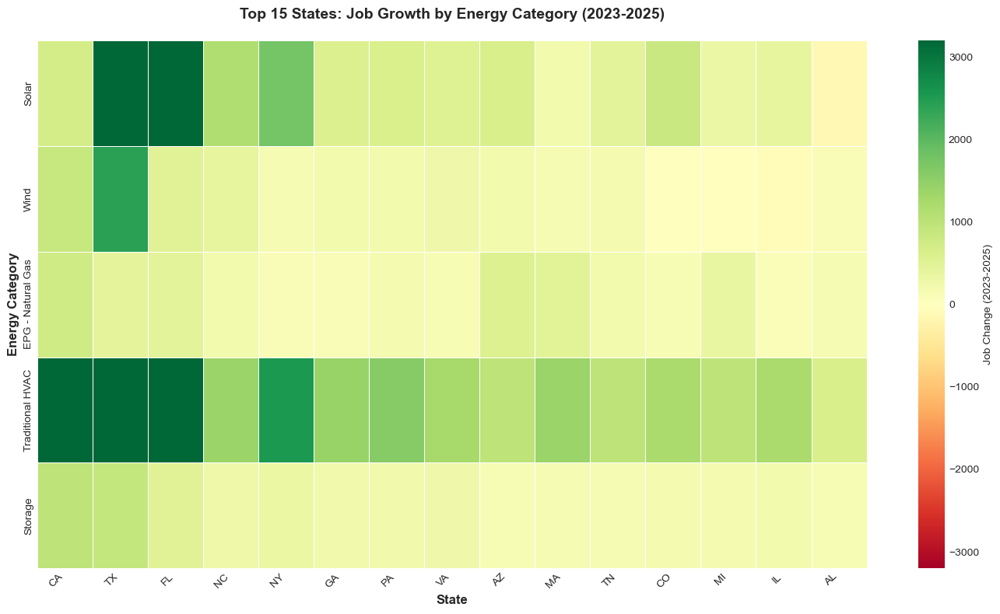

In [81]:
final_map1

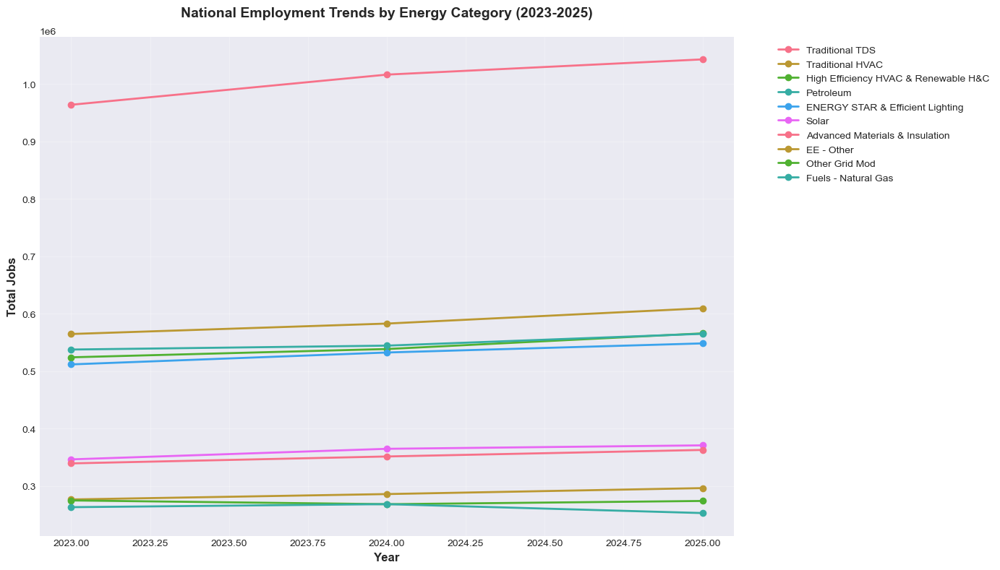

In [82]:
final_image2

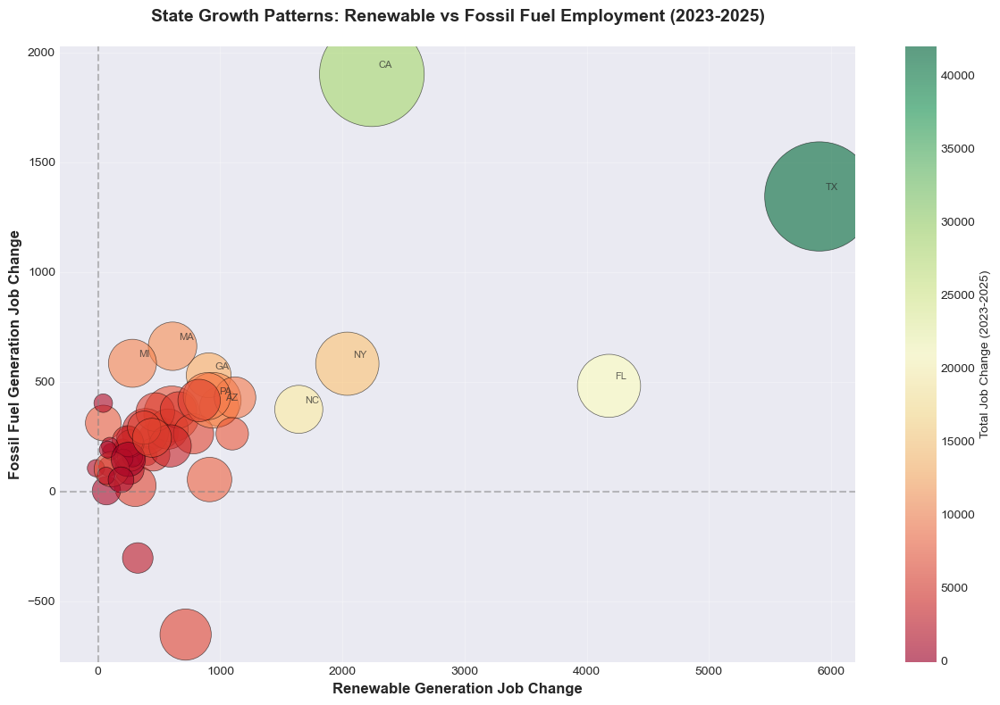

In [84]:
final_image3

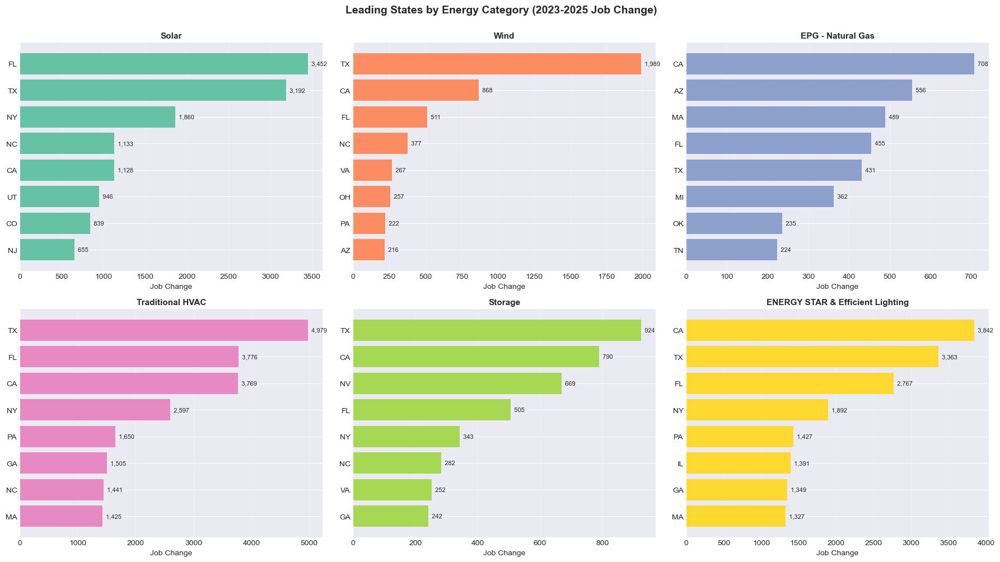

In [86]:
final_image4

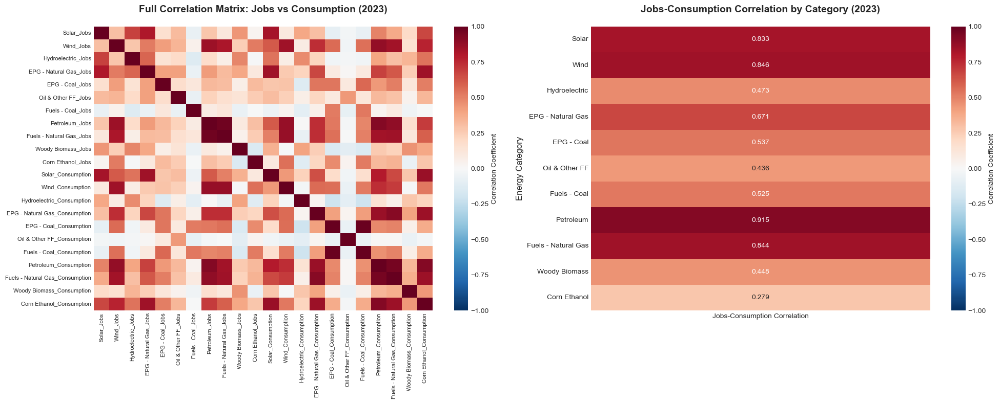

In [88]:
final_image5

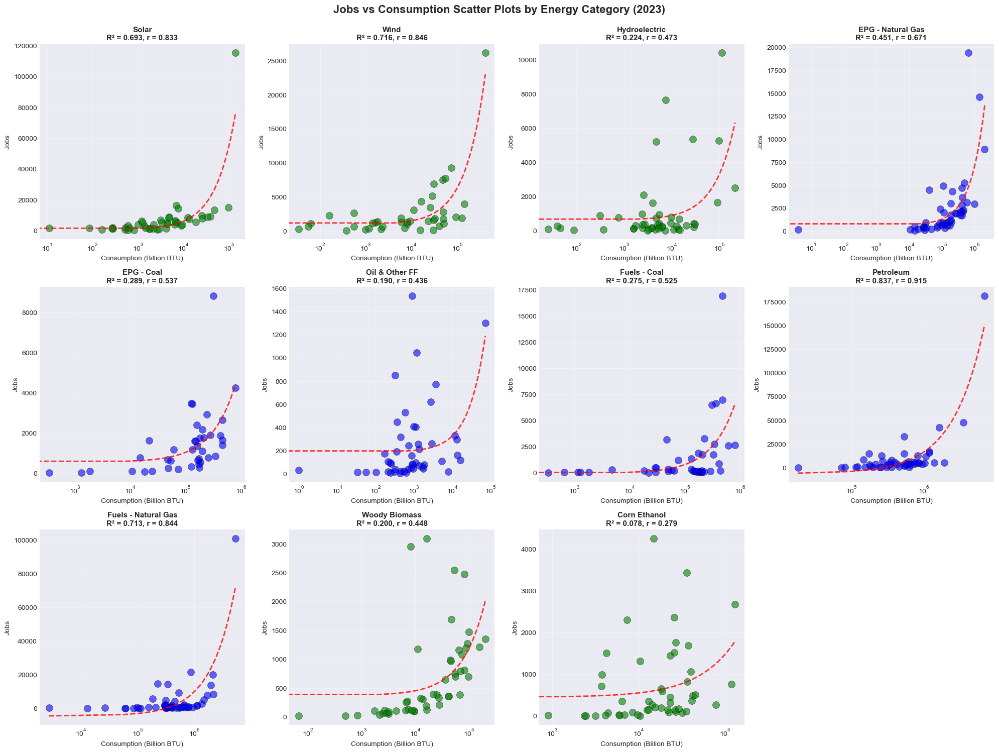

In [92]:
final_image6

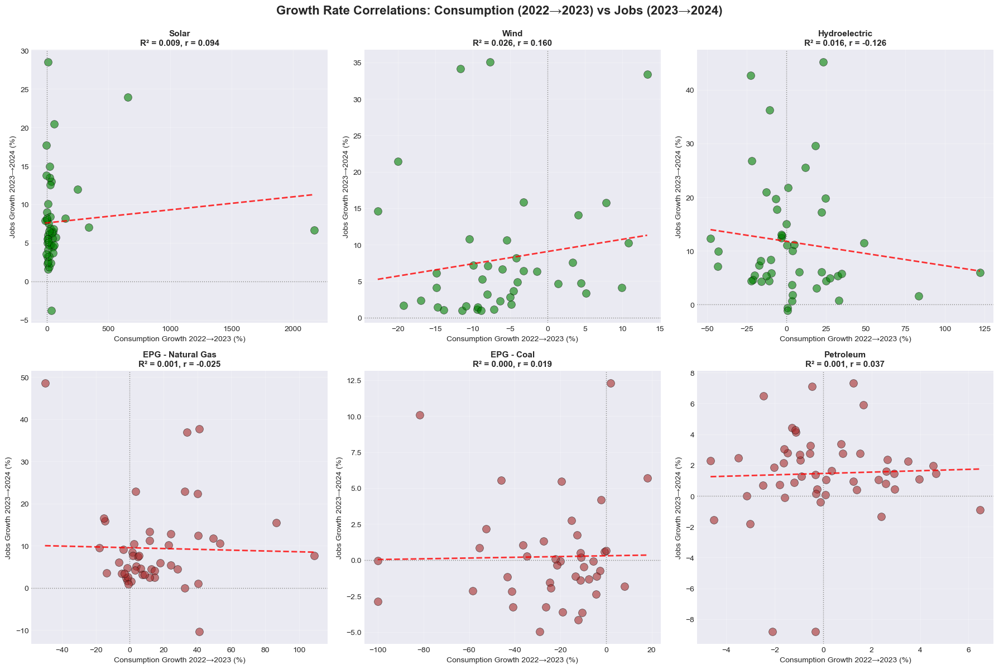

In [94]:
final_image7

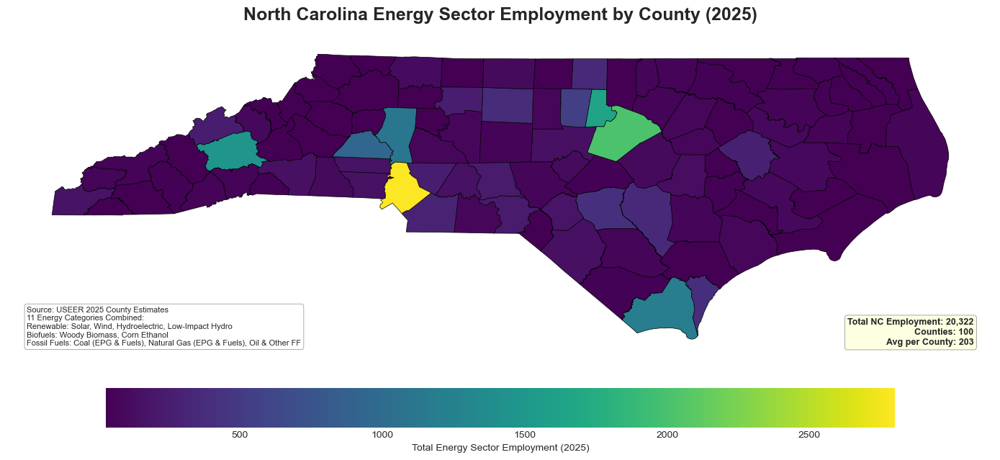

In [96]:
final_image8

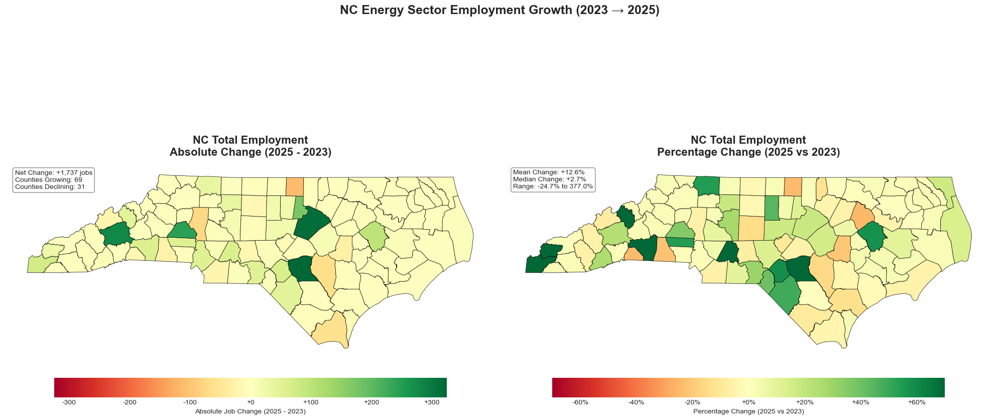

In [114]:
final_image9[0]  # Total change

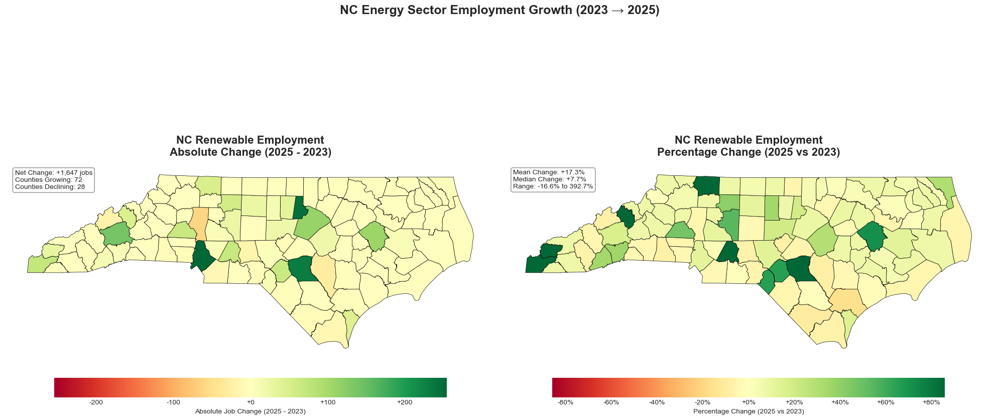

In [115]:
final_image9[1]  # Renewable change

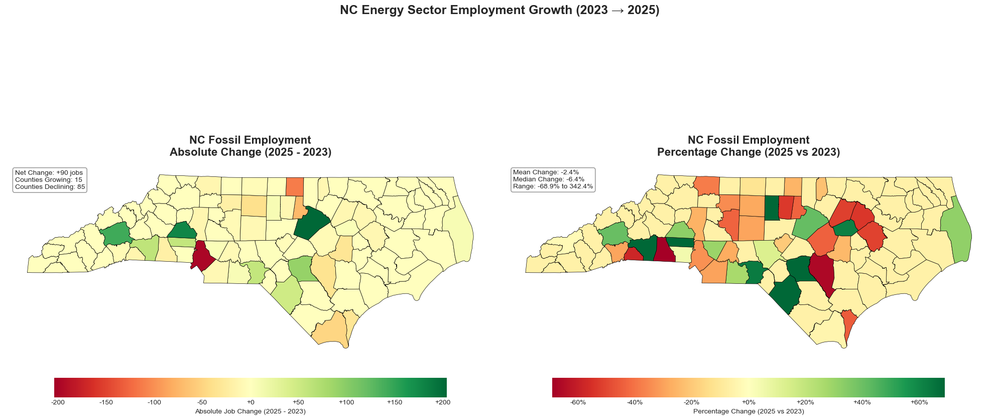

In [116]:
final_image9[2]  # Fossil change

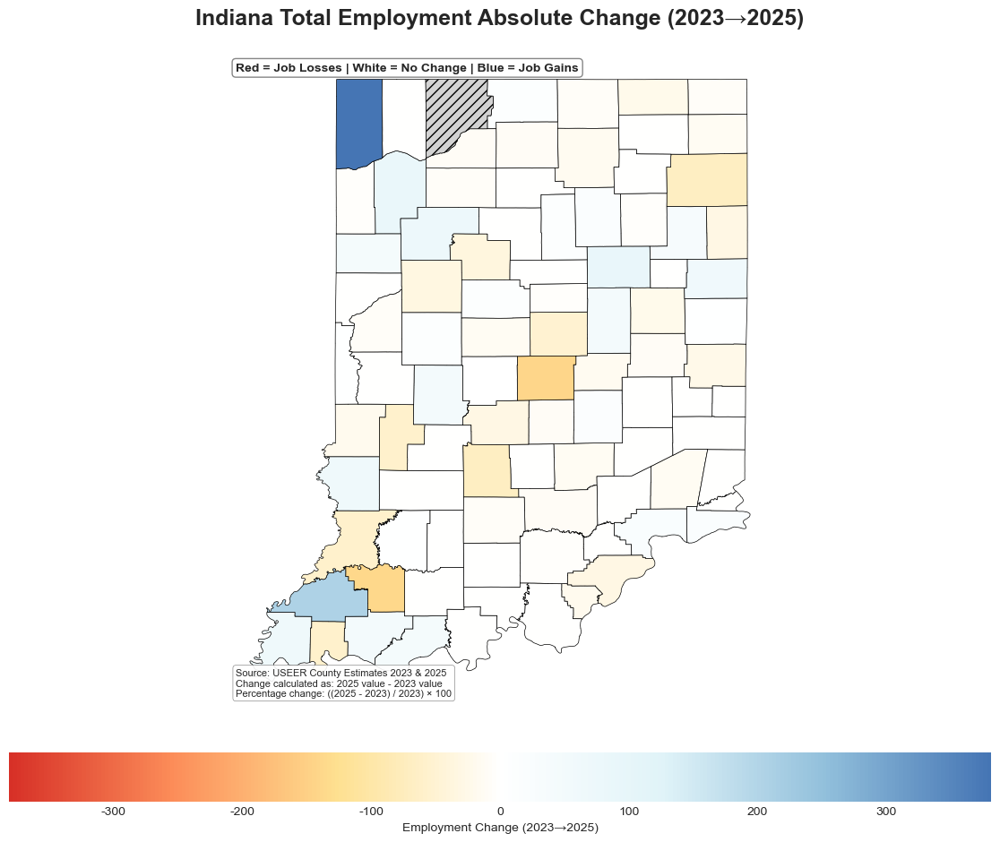

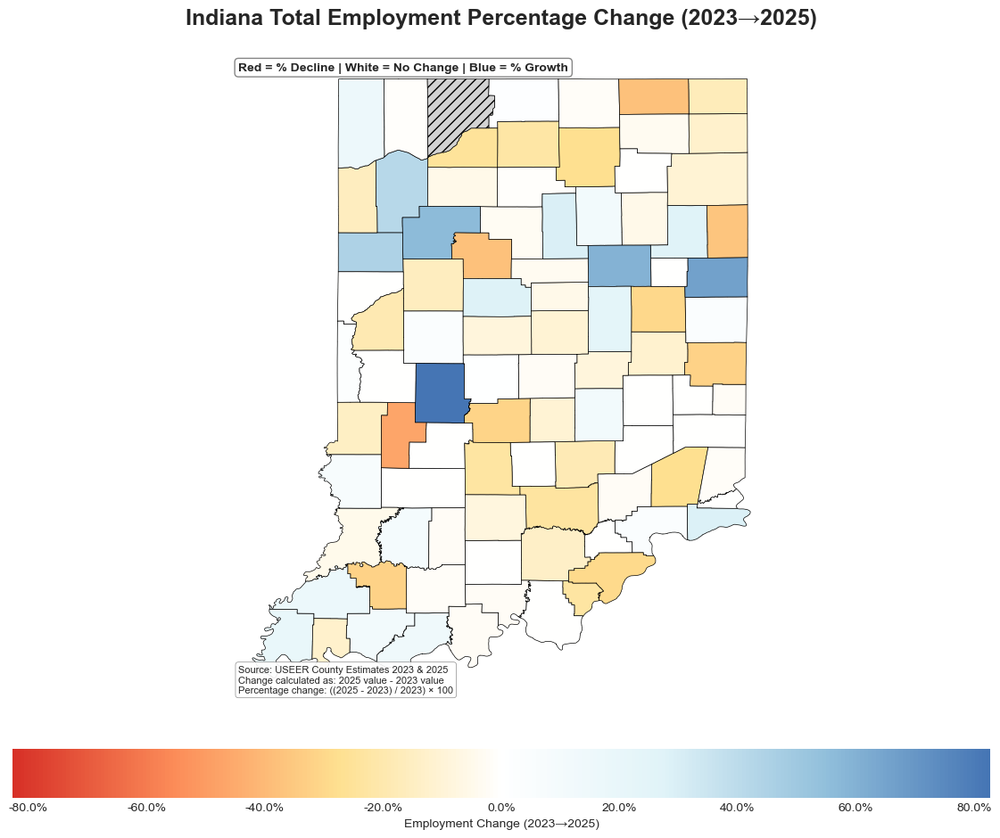

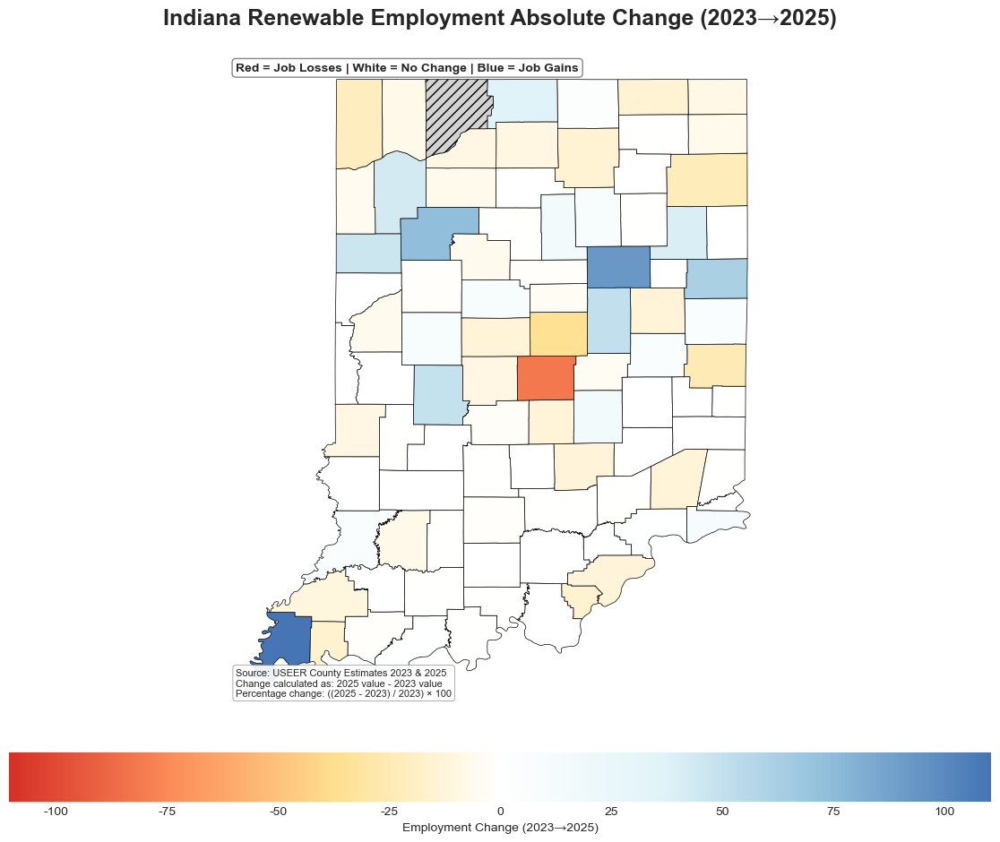

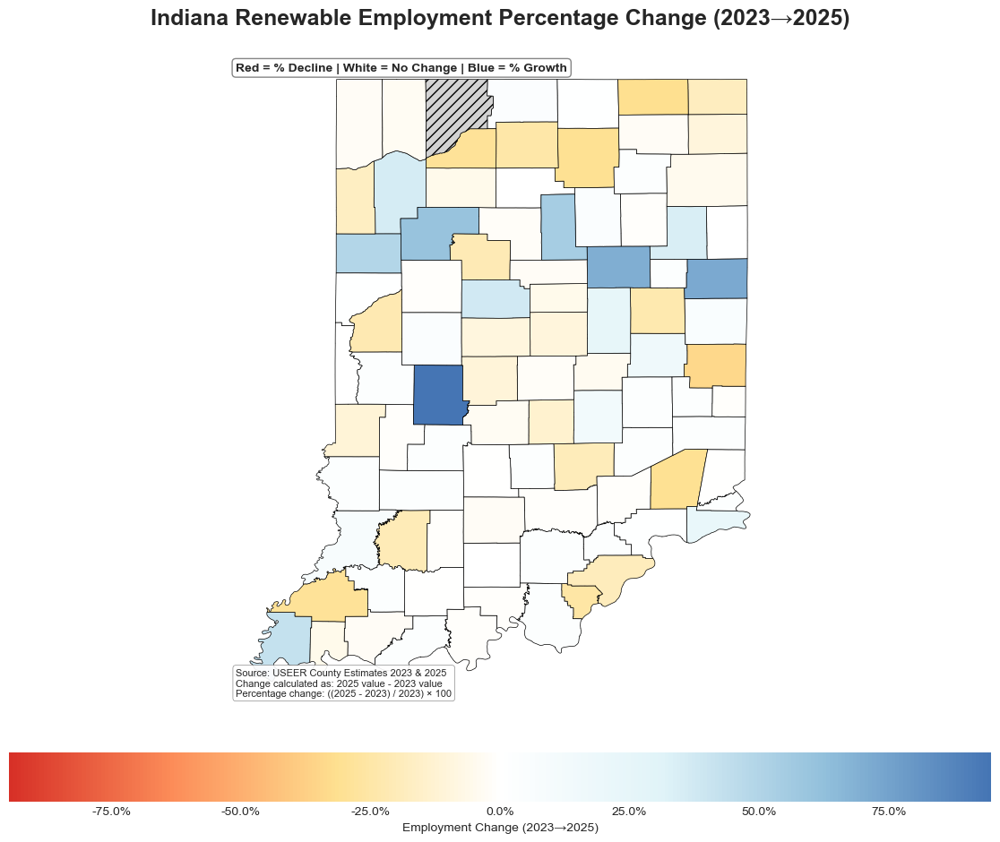

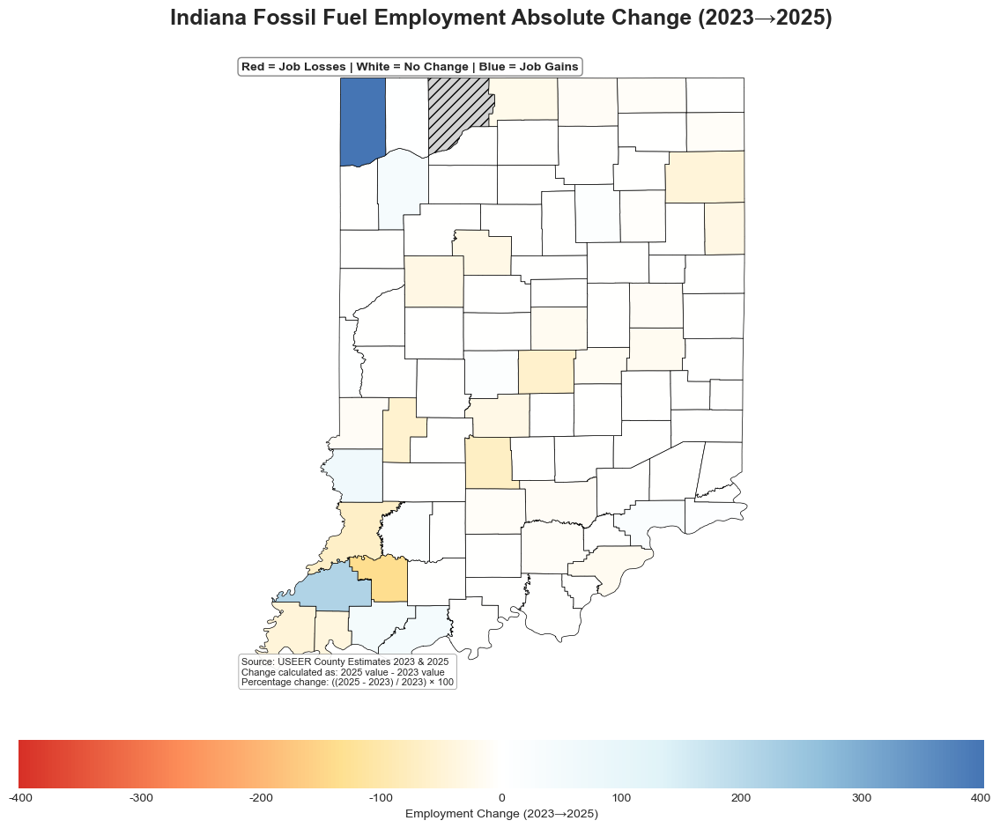

...

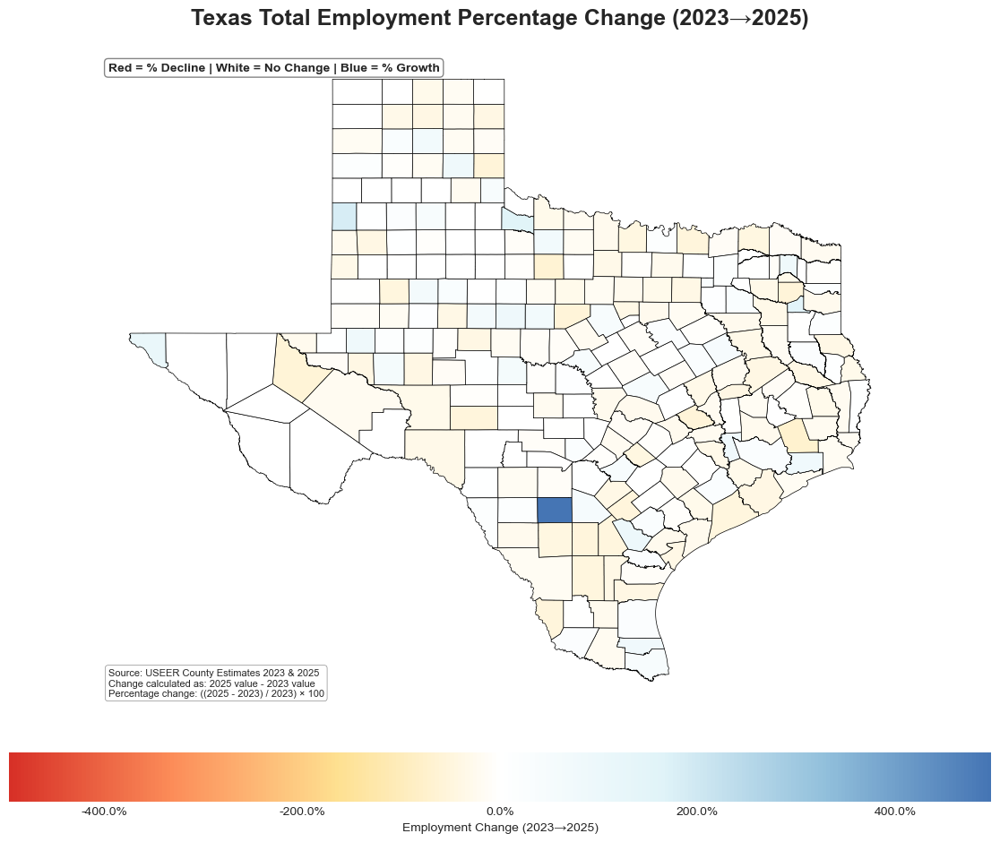

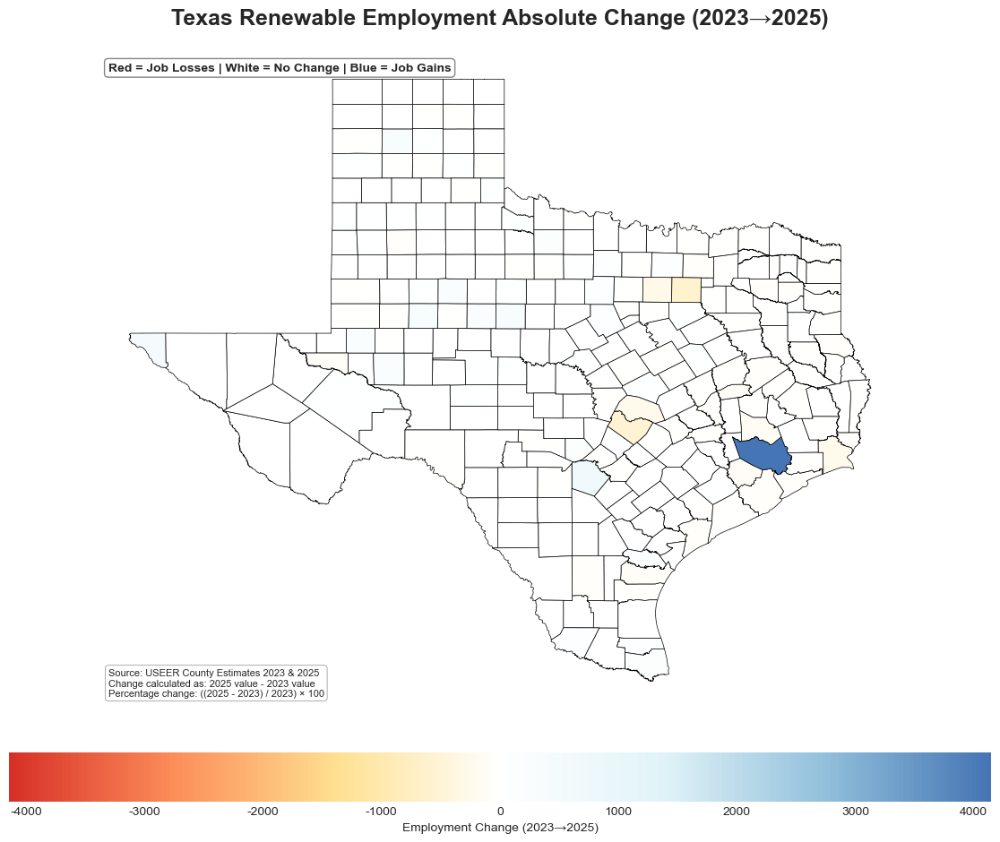

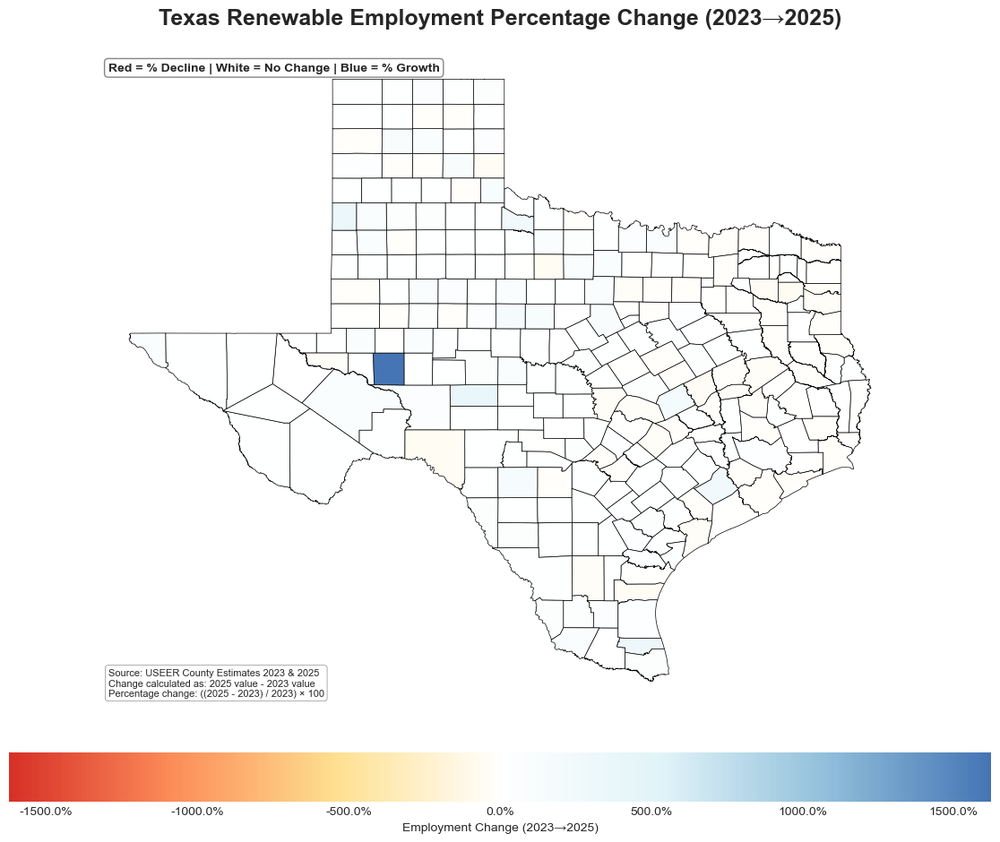

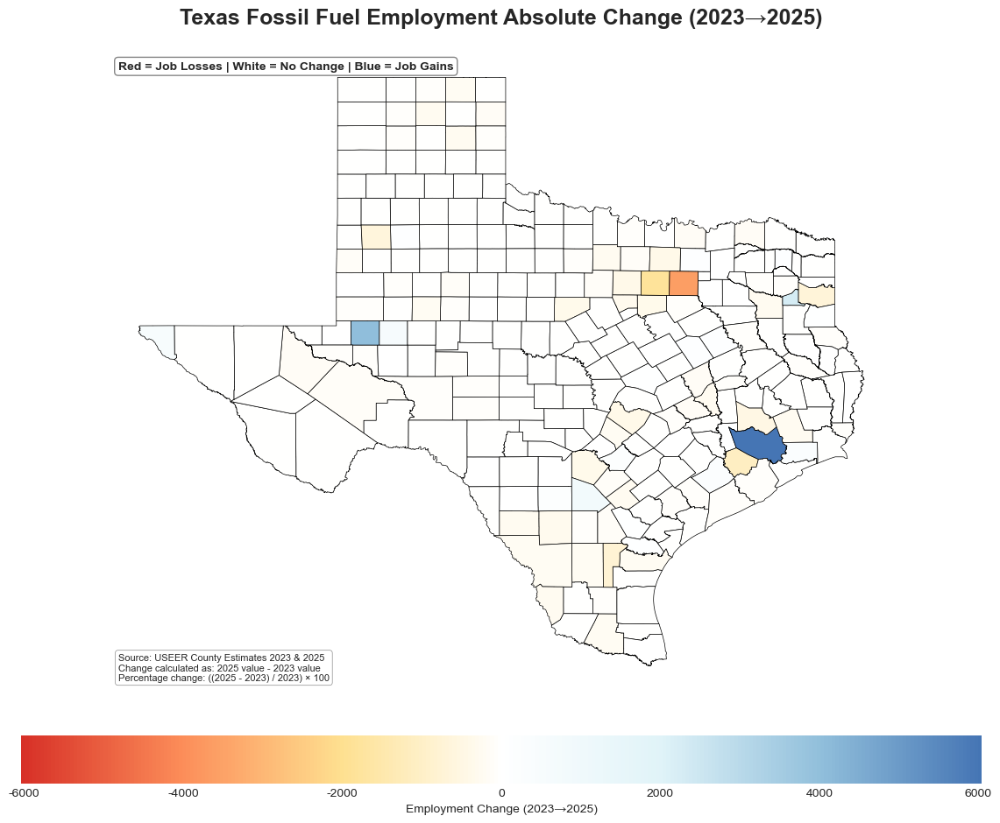

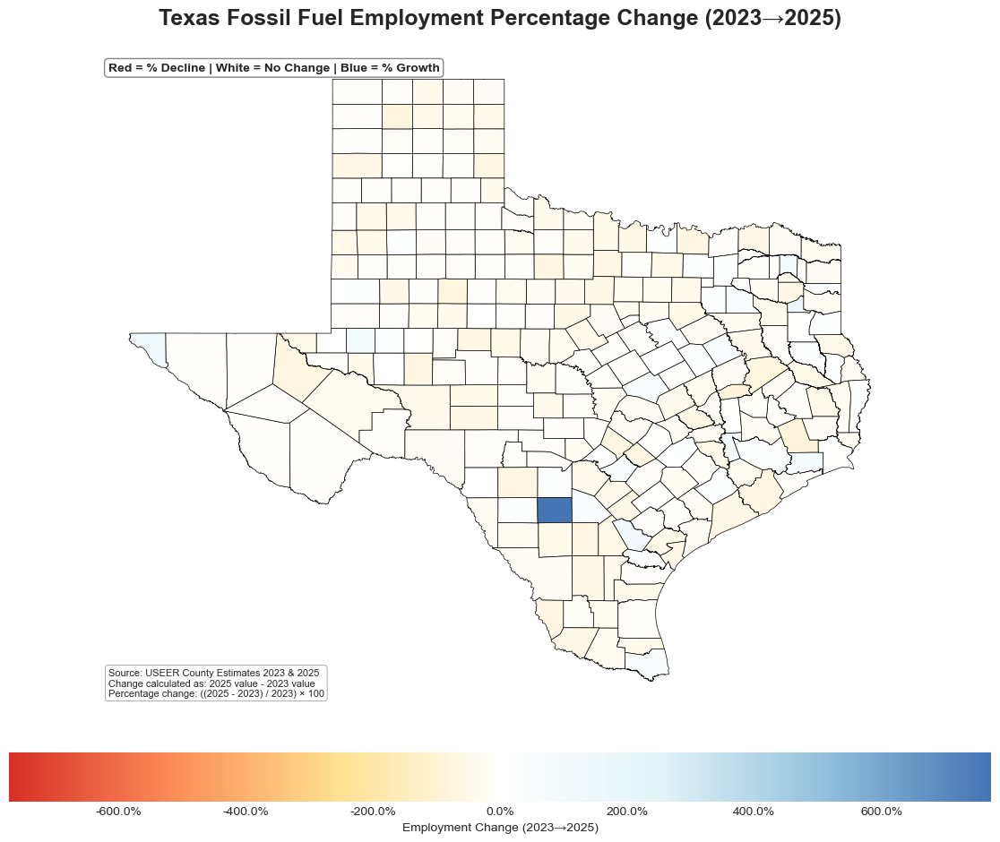

<Figure size 640x480 with 0 Axes>

In [135]:
from IPython.display import display

for fig in final_image10:
    display(fig)

## I am working with the SEDs data using an API by querying specific seriesID's that correspond to my 2023, 2024, and 2025 County Estimate column labels for easier crorss referencing and analysis. I included DC despite it not existing in the County Estimate data because I can evaluate it against the information provided in the file USEER Public Data files. 

In [1]:
# Import Libraries
"""
Fetch SEDS energy consumption data for all states via EIA API
"""
import requests
import pandas as pd
from urllib.parse import urlencode
import numpy as np
import json

print("Libraries imported successfully!")


# Define API Configuration
"""
Setup API credentials, states list, and MSN code mappings
"""

API_KEY = "dP1v8SQWgfdHMhDJkdJfAL51hOTraUULjfmEa0y4"
EIA_SEDS_BASE_URL = "https://api.eia.gov/v2/seds/data/"

# All 50 states + DC
ALL_US_STATES = [
    "AL", "AK", "AZ", "AR", "CA", "CO", "CT", "DE", "DC", "FL", 
    "GA", "HI", "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", 
    "MD", "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH", 
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA", "RI", 
    "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA", "WV", "WI", "WY"
]

# MSN codes mapped to County Estimates categories
# I used AI, Claude's Sonnet 4.5 to run through the entire list of msns first due to scale of seriesDescriptions. 
# 1846 rows populated when I filtered for the state NC, and set the year range 2021-2022. 
# The shear scale of the information I would need to cross reference with my County Estimate column names was challenging, so I utilized AI for assistance.
COUNTY_ESTIMATE_TO_MSN_MAP = {
    'Solar': 'SOEGB',
    'Wind': 'WYEGB', 
    'Hydroelectric': 'HYEGB',
    'EPG - Natural Gas': 'NGEIB',
    'EPG - Coal': 'CLEIB',
    'Oil & Other FF': 'PAEIB',
    'Fuels - Coal': 'CLTCB',
    'Petroleum': 'PATCB',
    'Fuels - Natural Gas': 'NGTCB',
    'Woody Biomass': 'WDTCB',
    'Corn Ethanol': 'EMTCB',
}

print(f"Configuration: {len(ALL_US_STATES)} states, {len(COUNTY_ESTIMATE_TO_MSN_MAP)} energy categories")

Libraries imported successfully!
Configuration: 51 states, 11 energy categories


In [2]:
# Initial API Request (Testing 2021-2024)
"""
METHODOLOGY NOTE: First attempt queries 2021-2024 to verify data availability
This scratch work documents that 2024 data is not yet available in SEDS
"""

api_params_initial_test = {
    "api_key": API_KEY,
    "frequency": "annual",
    "data[0]": "value",
    "start": "2021",
    "end": "2024",  # Testing if 2024 data exists
    "sort[0][column]": "period",
    "sort[0][direction]": "asc",
    "offset": 0,
    "length": 5000,
}

# Build state facets
state_facets = [("facets[stateId][]", state) for state in ALL_US_STATES]

# Build MSN facets
msn_facets = [("facets[seriesId][]", msn_code) for msn_code in COUNTY_ESTIMATE_TO_MSN_MAP.values()]

# Construct query URL
query_string = urlencode(api_params_initial_test, doseq=True) + "&" + urlencode(state_facets + msn_facets, doseq=True)
initial_test_url = f"{EIA_SEDS_BASE_URL}?{query_string}"

print("INITIAL TEST: Querying 2021-2024 to verify data availability")

# Make initial test request
response_initial = requests.get(initial_test_url)

if response_initial.status_code == 200:
    print(f"API Status: {response_initial.status_code} (Success)")
    json_response_initial = response_initial.json()
    
    if "response" in json_response_initial and "data" in json_response_initial["response"]:
        raw_data_initial = json_response_initial["response"]["data"]
        print(f"Records retrieved: {len(raw_data_initial)}")
    else:
        raw_data_initial = []
else:
    print(f"API Status: {response_initial.status_code} (Failed)")
    raw_data_initial = []


# Process Initial Test Data
"""
Convert initial test response to DataFrame to check year coverage
"""

if len(raw_data_initial) > 0:
    seds_raw_initial = pd.json_normalize(raw_data_initial)
    
    print(f"\nInitial test DataFrame shape: {seds_raw_initial.shape}")
    print(f"Columns: {list(seds_raw_initial.columns)}")
    
    # Check years present
    years_available = sorted(seds_raw_initial['period'].unique())
    print(f"\n*** CRITICAL FINDING: Years in response: {years_available} ***")
    print(f"Expected: ['2021', '2022', '2023', '2024']")
    # This was a critical discovery during my investigation/development because it reinforced that the data from 2024 was either too new, 
    # or too inconsistent to be used extensively for all 51 states I'm working with. 
    print(f"Missing: 2024 data NOT available in SEDS.\nTherefore, for future analysis we will mainly consider the year range 2021-2023.")
    
    # Count records per year
    print(f"\nRecords per year:")
    print(seds_raw_initial['period'].value_counts().sort_index())
else:
    seds_raw_initial = pd.DataFrame()
    print("No data returned from initial test")

INITIAL TEST: Querying 2021-2024 to verify data availability
API Status: 200 (Success)
Records retrieved: 1683

Initial test DataFrame shape: (1683, 7)
Columns: ['period', 'seriesId', 'seriesDescription', 'stateId', 'stateDescription', 'value', 'unit']

*** CRITICAL FINDING: Years in response: ['2021', '2022', '2023'] ***
Expected: ['2021', '2022', '2023', '2024']
Missing: 2024 data NOT available in SEDS.
Therefore, for future analysis we will mainly consider the year range 2021-2023.

Records per year:
period
2021    561
2022    561
2023    561
Name: count, dtype: int64


In [3]:
# Final API Request (2021-2023 Only)
"""
Based on findings above, query only 2021-2023 for final analysis
"""

api_params_final = {
    "api_key": API_KEY,
    "frequency": "annual",
    "data[0]": "value",
    "start": "2021",
    "end": "2023",  # Updated based on data availability
    "sort[0][column]": "period",
    "sort[0][direction]": "asc",
    "offset": 0,
    "length": 5000,
}

query_string_final = urlencode(api_params_final, doseq=True) + "&" + urlencode(state_facets + msn_facets, doseq=True)
final_url = f"{EIA_SEDS_BASE_URL}?{query_string_final}"

print("FINAL QUERY: 2021-2023 data collection")

response_final = requests.get(final_url)

if response_final.status_code == 200:
    json_response_final = response_final.json()
    
    if "response" in json_response_final and "data" in json_response_final["response"]:
        raw_data_final = json_response_final["response"]["data"]
        print(f"Records retrieved: {len(raw_data_final)}")
    else:
        raw_data_final = []
else:
    print(f"API request failed: {response_final.status_code}")
    raw_data_final = []

FINAL QUERY: 2021-2023 data collection
Records retrieved: 1683


In [4]:
# Create Clean SEDS DataFrame (Long Format)
"""
Convert raw API response to clean analytical format
"""

if len(raw_data_final) > 0:
    # Normalize JSON
    seds_raw_2021_2023 = pd.json_normalize(raw_data_final)
    
    # Select and rename columns
    seds_long_2021_2023 = seds_raw_2021_2023[[
        'period', 
        'stateId', 
        'seriesId', 
        'value', 
        'unit'
    ]].copy()
    
    seds_long_2021_2023.columns = ['Year', 'State', 'MSN_Code', 'Value_BillionBtu', 'Unit']
    
    # Add human-readable category
    msn_to_category_map = {v: k for k, v in COUNTY_ESTIMATE_TO_MSN_MAP.items()}
    seds_long_2021_2023['Energy_Category'] = seds_long_2021_2023['MSN_Code'].map(msn_to_category_map)
    
    # Convert value to numeric
    seds_long_2021_2023['Value_BillionBtu'] = pd.to_numeric(seds_long_2021_2023['Value_BillionBtu'], errors='coerce')
    
    # Sort for readability
    seds_long_2021_2023 = seds_long_2021_2023.sort_values(
        ['Year', 'State', 'Energy_Category']
    ).reset_index(drop=True)
    
    print(f"\nCleaned SEDS DataFrame shape: {seds_long_2021_2023.shape}")
    print(f"\nSample data (first 5 rows):")
    print(seds_long_2021_2023.head(5))
    
    # Data summary
    print(f"\n" + "="*60)
    print("DATA SUMMARY (2021-2023)")
    print("="*60)
    print(f"Years: {sorted(seds_long_2021_2023['Year'].unique())}")
    print(f"States: {len(seds_long_2021_2023['State'].unique())}")
    print(f"Energy Categories: {len(seds_long_2021_2023['Energy_Category'].unique())}")
    
    print(f"\nRecords per year:")
    print(seds_long_2021_2023.groupby('Year').size())
    
    print(f"\nRecords per category:")
    print(seds_long_2021_2023.groupby('Energy_Category').size())
else:
    seds_long_2021_2023 = pd.DataFrame()


Cleaned SEDS DataFrame shape: (1683, 6)

Sample data (first 5 rows):
   Year State MSN_Code  Value_BillionBtu         Unit      Energy_Category
0  2021    AK    EMTCB                 0  Billion Btu         Corn Ethanol
1  2021    AK    CLEIB             11305  Billion Btu           EPG - Coal
2  2021    AK    NGEIB             25518  Billion Btu    EPG - Natural Gas
3  2021    AK    CLTCB             18694  Billion Btu         Fuels - Coal
4  2021    AK    NGTCB            395590  Billion Btu  Fuels - Natural Gas

DATA SUMMARY (2021-2023)
Years: ['2021', '2022', '2023']
States: 51
Energy Categories: 11

Records per year:
Year
2021    561
2022    561
2023    561
dtype: int64

Records per category:
Energy_Category
Corn Ethanol           153
EPG - Coal             153
EPG - Natural Gas      153
Fuels - Coal           153
Fuels - Natural Gas    153
Hydroelectric          153
Oil & Other FF         153
Petroleum              153
Solar                  153
Wind                   153
Woody B

In [5]:
# Create Wide Format (Pivot Table)
"""
Pivot to wide format: one row per state-year with energy categories as columns
"""

if not seds_long_2021_2023.empty:
    seds_wide_2021_2023 = seds_long_2021_2023.pivot_table(
        index=['Year', 'State'],
        columns='Energy_Category',
        values='Value_BillionBtu',
        aggfunc='first'
    ).reset_index()
    
    print(f"\nWide format shape: {seds_wide_2021_2023.shape}")
    print(f"Preview:")
    print(seds_wide_2021_2023.head(10))
    
    # Check for missing values
    missing_values = seds_wide_2021_2023.isnull().sum()
    if missing_values.sum() > 0:
        print(f"\nMissing values detected:")
        print(missing_values[missing_values > 0])
    else:
        print(f"\nNo missing values detected")
else:
    seds_wide_2021_2023 = pd.DataFrame()


# Export to CSV
"""
Export clean data in long and wide formats
"""

if not seds_long_2021_2023.empty:
    # Long format export
    filename_long = 'SEDS_Energy_2021_2023_Long_Format.csv'
    seds_long_2021_2023.to_csv(filename_long, index=False)
    print(f"\nExported: {filename_long}")
    print(f"  Shape: {seds_long_2021_2023.shape}")
    
    # Wide format export
    if not seds_wide_2021_2023.empty:
        filename_wide = 'SEDS_Energy_2021_2023_Wide_Format.csv'
        seds_wide_2021_2023.to_csv(filename_wide, index=False)
        print(f"Exported: {filename_wide}")
        print(f"  Shape: {seds_wide_2021_2023.shape}")
    
    # MSN lookup table export
    msn_lookup_reference = pd.DataFrame([
        {'Energy_Category': cat, 'MSN_Code': code, 'Data_Description': f'{cat} energy consumption'}
        for cat, code in COUNTY_ESTIMATE_TO_MSN_MAP.items()
    ])
    filename_lookup = 'SEDS_MSN_Code_Reference.csv'
    msn_lookup_reference.to_csv(filename_lookup, index=False)
    print(f"Exported: {filename_lookup}")
    
    print("\n" + "="*60)
    print("EXPORT COMPLETE")


Wide format shape: (153, 13)
Preview:
Energy_Category  Year State  Corn Ethanol  EPG - Coal  EPG - Natural Gas  \
0                2021    AK             0       11305              25518   
1                2021    AL         25448      270310             402384   
2                2021    AR         12028      212676             153547   
3                2021    AZ         25916      153948             369372   
4                2021    CA        118667           0             667481   
5                2021    CO         18934      248967             126537   
6                2021    CT         11985        2880             168272   
7                2021    DC           907           0                  0   
8                2021    DE          4313        4542              24813   
9                2021    FL         74151      194273            1350141   

Energy_Category  Fuels - Coal  Fuels - Natural Gas  Hydroelectric  \
0                       18694               395590     

In [6]:
# Data Quality Validation
"""
Verify completeness: expect 51 states × 3 years × 11 categories
"""

if not seds_wide_2021_2023.empty:
    print("DATA QUALITY VALIDATION")
    print("="*60)
    
    # Expected vs actual
    expected_state_year_rows = len(ALL_US_STATES) * 3  # 51 states × 3 years
    actual_rows = len(seds_wide_2021_2023)
    
    print(f"\nExpected state-year combinations: {expected_state_year_rows} (51 states × 3 years)")
    print(f"Actual state-year combinations: {actual_rows}")
    
    if actual_rows == expected_state_year_rows:
        print("All expected combinations present")
    else:
        print(f"WARNING: Missing {expected_state_year_rows - actual_rows} combinations")
    
    # Check completeness by state
    records_per_state = seds_wide_2021_2023.groupby('State').size()
    incomplete_states = records_per_state[records_per_state != 3]
    
    if len(incomplete_states) > 0:
        print(f"\nStates with incomplete data:")
        print(incomplete_states)
    else:
        print(f"\nAll states have complete 3-year coverage")
    
    # Category completeness
    print(f"\nMissing values by energy category:")
    category_missing = seds_wide_2021_2023.isnull().sum().sort_values(ascending=False)
    print(category_missing)


# Summary Analysis - Top States by Category (2023)
"""
Identify leading states for each energy category using most recent data (2023)
"""

if not seds_wide_2021_2023.empty:
    print("\n" + "="*60)
    print("TOP 5 STATES BY ENERGY CATEGORY (2023)")
    print("="*60)
    
    seds_2023_only = seds_wide_2021_2023[seds_wide_2021_2023['Year'] == '2023'].copy()
    
    if len(seds_2023_only) > 0:
        for category in COUNTY_ESTIMATE_TO_MSN_MAP.keys():
            if category in seds_2023_only.columns:
                print(f"\n{category}:")
                top_5_states = seds_2023_only.nlargest(5, category)[['State', category]]
                for idx, row in top_5_states.iterrows():
                    print(f"  {row['State']}: {row[category]:,.0f} Billion Btu")
    else:
        print("No 2023 data available")

DATA QUALITY VALIDATION

Expected state-year combinations: 153 (51 states × 3 years)
Actual state-year combinations: 153
All expected combinations present

All states have complete 3-year coverage

Missing values by energy category:
Energy_Category
Year                   0
State                  0
Corn Ethanol           0
EPG - Coal             0
EPG - Natural Gas      0
Fuels - Coal           0
Fuels - Natural Gas    0
Hydroelectric          0
Oil & Other FF         0
Petroleum              0
Solar                  0
Wind                   0
Woody Biomass          0
dtype: int64

TOP 5 STATES BY ENERGY CATEGORY (2023)

Solar:
  CA: 138,497 Billion Btu
  TX: 96,007 Billion Btu
  FL: 47,938 Billion Btu
  NC: 38,736 Billion Btu
  NV: 32,882 Billion Btu

Wind:
  TX: 408,839 Billion Btu
  IA: 141,384 Billion Btu
  OK: 126,286 Billion Btu
  KS: 92,973 Billion Btu
  IL: 74,406 Billion Btu

Hydroelectric:
  WA: 209,653 Billion Btu
  CA: 110,441 Billion Btu
  NY: 96,790 Billion Btu
  OR: 89,83

In [7]:
# Documentation Summary after querying EIA with an API on the State Energy Data System (SEDS)
"""
Generate summary of methodology and data sources for reporting
"""

print("METHODOLOGY DOCUMENTATION")
print("="*60)

print("""
DATA SOURCE: 
  EIA State Energy Data System (SEDS) via API v2

DATA COLLECTION APPROACH:
  1. Initial query for 2021-2024 revealed 2024 data unavailable.
  2. Final query restricted to 2021-2023 (confirmed available years).
  3. Retrieved data for all 51 jurisdictions (50 states + DC).
  4. Filtered to 11 primary MSN codes matching 2024 County Estimates categories as accurately as possible.

DATA COVERAGE:
  - Years: 2021, 2022, 2023
  - States: 51 (all US states + DC)
  - Energy Categories: 11 (mapped to County Estimates)
  - Total Records: 1,683 (51 states × 3 years × 11 categories)

MSN MAPPING:
  County employment categories mapped to SEDS consumption MSN codes
  using AI-assisted analysis (Claude Sonnet 4.5) due to scale
  (1,846 total MSN series available for single state-year)

OUTPUT FILES:
  - Long format: One row per state-year-category combination
  - Wide format: One row per state-year, categories as columns
  - MSN reference: Lookup table for code translations
""")

METHODOLOGY DOCUMENTATION

DATA SOURCE: 
  EIA State Energy Data System (SEDS) via API v2

DATA COLLECTION APPROACH:
  1. Initial query for 2021-2024 revealed 2024 data unavailable.
  2. Final query restricted to 2021-2023 (confirmed available years).
  3. Retrieved data for all 51 jurisdictions (50 states + DC).
  4. Filtered to 11 primary MSN codes matching 2024 County Estimates categories as accurately as possible.

DATA COVERAGE:
  - Years: 2021, 2022, 2023
  - States: 51 (all US states + DC)
  - Energy Categories: 11 (mapped to County Estimates)
  - Total Records: 1,683 (51 states × 3 years × 11 categories)

MSN MAPPING:
  County employment categories mapped to SEDS consumption MSN codes
  using AI-assisted analysis (Claude Sonnet 4.5) due to scale
  (1,846 total MSN series available for single state-year)

OUTPUT FILES:
  - Long format: One row per state-year-category combination
  - Wide format: One row per state-year, categories as columns
  - MSN reference: Lookup table for co

## Please note that my County and Public Data files were found thanks to the Energy.gov website, specifically the U.S. Energy & Employment Report page
### Link: https://www.energy.gov/policy/us-energy-employment-jobs-report-useer

Goal 1: County Job Trends 2023-2025
=====================================================
Analysis of Energy Sector Employment Trends Across All U.S. Counties

**Scope:** All 50 states + DC, all counties  
**Data Source:** USEER County Estimates (2023, 2024, 2025)  
**Objective:** Identify and visualize job growth/decline trends by energy category and geography

**Variable Naming Convention:** All Goal 1 variables prefixed with `county_` or `goal1_` to avoid conflicts with Goals 2-3

## 1. Setup and Configuration

In [8]:
# Core imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Visualization settings
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')
%matplotlib inline

## 2. Column Name Standardization (Goal 1 - County and Public Data)

**Key Challenge:** Column names vary slightly between years. Mapping is necessary for proper standardization.

In [9]:
# Define column mappings for each year - COUNTY DATA SPECIFIC
# Prefix: county_ to distinguish from public data (Goal 2)

COUNTY_COLUMNS_2025 = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 'EPG - Other',
    'Traditional TDS', 'Storage', 'Smart Grid', 'Micro Grid', 'Other Grid Mod',
    'Fuels - Coal', 'Petroleum & Other FF', 'Fuels - Natural Gas',
    'Woody Biomass', 'Corn Ethanol', 'Fuels - Other',
    'Efficient Lighting', 'Traditional HVAC', 'High Efficiency HVAC & Renewable H&C',
    'Advanced Materials & Insulation', 'EE - Other'
]

COUNTY_COLUMNS_2024 = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 'EPG - Other',
    'Traditional TDS', 'Storage', 'Smart Grid', 'Micro Grid', 'Other Grid Mod',
    'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas',
    'Woody Biomass', 'Corn Ethanol', 'Other Clean Fuels', 'Fuels - Other',
    'ENERGY STAR & Efficient Lighting', 'Traditional HVAC', 'High Efficiency HVAC & Renewable H&C',
    'Advanced Materials & Insulation', 'EE - Other'
]

COUNTY_COLUMNS_2023 = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 'EPG - Other',
    'Traditional TDS', 'Storage', 'Smart Grid', 'Micro Grid', 'Other Grid Mod',
    'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas',
    'Woody Biomass', 'Corn Ethanol', 'Other Clean Fuels', 'Fuels - Other',
    'ENERGY STAR & Efficient Lighting', 'Traditional HVAC', 'High Efficiency HVAC & Renewable H&C',
    'Advanced Materials & Insulation', 'EE - Other'
]

# Create standardized mapping (2024 names as baseline) - COUNTY DATA
# Maps 2023/2025 -> 2024 naming convention
COUNTY_COLUMN_STANDARDIZATION = {
    # 2025 differences
    'Petroleum & Other FF': 'Petroleum',
    'Efficient Lighting': 'ENERGY STAR & Efficient Lighting',
    
    # 2023 differences (same as 2024, but included for completeness)
    'Other Clean Fuels': 'Other Clean Fuels'  # This exists in 2023/2024 but not 2025
}

# Energy categories for analysis grouping - COUNTY DATA
COUNTY_ENERGY_CATEGORIES = {
    'Renewable Generation': ['Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric'],
    'Fossil Fuel Generation': ['EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 'EPG - Other'],
    'Grid & Storage': ['Traditional TDS', 'Storage', 'Smart Grid', 'Micro Grid', 'Other Grid Mod'],
    'Fuels': ['Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas', 'Woody Biomass', 'Corn Ethanol', 'Other Clean Fuels', 'Fuels - Other'],
    'Energy Efficiency': ['ENERGY STAR & Efficient Lighting', 'Traditional HVAC', 'High Efficiency HVAC & Renewable H&C', 'Advanced Materials & Insulation', 'EE - Other']
}

print("GOAL 1 (County) column standardization maps defined.")
print("""\n**************\nNote that 2025 has less columns because it did not include a \"Other Clean Fuels\" category in the original dataset. 
I believe that this data was condensed into what is ultimately 'Petroleum & Other FF' for 2025. This means the datasets don't have exact matches in data.
I thought to seperate the 'Petroleum & Other FF' category into Petroleum and 'Other Clean Fuels' to make them equal, but without concrete information 
felt it would be unwise to superficially allocate parts of 'Petroleum & Other FF' into the 'Other Clean Fuels' column.\n**************\n""")
print(f"2025 columns: {len(COUNTY_COLUMNS_2025)}")
print(f"2024 columns: {len(COUNTY_COLUMNS_2024)}")
print(f"2023 columns: {len(COUNTY_COLUMNS_2023)}")
print(f"\nEnergy categories defined: {list(COUNTY_ENERGY_CATEGORIES.keys())}")

GOAL 1 (County) column standardization maps defined.

**************
Note that 2025 has less columns because it did not include a "Other Clean Fuels" category in the original dataset. 
I believe that this data was condensed into what is ultimately 'Petroleum & Other FF' for 2025. This means the datasets don't have exact matches in data.
I thought to seperate the 'Petroleum & Other FF' category into Petroleum and 'Other Clean Fuels' to make them equal, but without concrete information 
felt it would be unwise to superficially allocate parts of 'Petroleum & Other FF' into the 'Other Clean Fuels' column.
**************

2025 columns: 24
2024 columns: 25
2023 columns: 25

Energy categories defined: ['Renewable Generation', 'Fossil Fuel Generation', 'Grid & Storage', 'Fuels', 'Energy Efficiency']


In [10]:
# SECTION 2: PUBLIC DATA COLUMN DEFINITIONS (FOR STATE TOTALS)
# ============================================================================

# Public Data columns remain the same from the Excel files
PUBLIC_COLUMNS_2023 = [
    'State abbreviation', 'State', 'Solar', 'Wind', 'Traditional hydropower',
    'Low impact hydropower, marine, and hydrokinetics', 'Geothermal electricity',
    'Bioenergy/Combined heat and power', 'Natural gas electricity', 'Coal electricity',
    'Oil and other fossil fuel electricity', 'Nuclear electricity', 'Other electricity',
    'Electric power generation total', 'Traditional transmission and distribution',
    'Clean storage', 'Other storage', 'Storage total', 'Smart grid', 'Micro grid',
    'Other grid modernization', 'Other (including commodity flows)',
    'Transmission, distribution, and storage total', 'Energy STAR and efficient lighting',
    'Traditional HVAC with an efficiency component',
    'High efficiency HVAC and renewable heating and cooling', 'Advanced materials',
    'Other', 'Energy efficiency total', 'Coal fuels',
    'Oil (petroleum and other fossil fuels)', 'Natural gas fuels', 'Corn ethanol',
    'Other ethanol and non-woody biomass', 'Woody biomass', 'Other biofuels',
    'Nuclear fuels', 'Other fuels', 'Fuels total'
]

PUBLIC_COLUMNS_2024 = PUBLIC_COLUMNS_2023  # Same structure in 2024

PUBLIC_COLUMNS_2025 = [
    'State abbreviation', 'State', 'Coal fuels',
    'Oil (petroleum and other fossil fuels)', 'Natural gas fuels', 'Corn ethanol',
    'Other ethanol and non-woody biomass', 'Woody biomass', 'Other biofuels',
    'Nuclear fuels', 'Other fuels', 'Fuels total', 'Solar', 'Wind',
    'Traditional hydropower', 'Low impact hydropower, marine, and hydrokinetics',
    'Geothermal electricity', 'Bioenergy/Combined heat and power',
    'Natural gas electricity', 'Coal electricity', 'Oil and other fossil fuel electricity',
    'Nuclear electricity', 'Other electricity', 'Electric power generation total',
    'Traditional transmission and distribution', 'Storage', 'Smart grid', 'Micro grid',
    'Other grid modernization', 'Other (including commodity flows)',
    'Transmission, distribution, and storage total', 'Certified and efficient lighting',
    'Traditional HVAC with an efficiency component',
    'High efficiency HVAC and renewable heating and cooling', 'Advanced materials',
    'Other', 'Energy efficiency total'
]

In [11]:
# SECTION 3: MAPPING COUNTY COLUMNS TO PUBLIC DATA COLUMNS
# ============================================================================

# Maps County column names (standardized to 2024) -> Public Data column names
# Some mappings require summing multiple Public Data columns
COUNTY_TO_PUBLIC_MAPPING_2023_2024 = {
    # Generation
    'Solar': 'Solar',
    'Wind': 'Wind',
    'Hydroelectric': 'Traditional hydropower',
    'Low-Impact Hydroelectric': 'Low impact hydropower, marine, and hydrokinetics',
    'EPG - Natural Gas': 'Natural gas electricity',
    'EPG - Coal': 'Coal electricity',
    'Oil & Other FF': 'Oil and other fossil fuel electricity',
    'EPG - Other': ['Geothermal electricity', 'Bioenergy/Combined heat and power', 
                    'Nuclear electricity', 'Other electricity'],  # Sum these
    
    # Grid & Storage
    'Traditional TDS': 'Traditional transmission and distribution',
    'Storage': 'Storage total',
    'Smart Grid': 'Smart grid',
    'Micro Grid': 'Micro grid',
    'Other Grid Mod': ['Other grid modernization', 'Other (including commodity flows)'],  # Sum these
    
    # Fuels
    'Fuels - Coal': 'Coal fuels',
    'Petroleum': 'Oil (petroleum and other fossil fuels)',
    'Fuels - Natural Gas': 'Natural gas fuels',
    'Woody Biomass': 'Woody biomass',
    'Corn Ethanol': 'Corn ethanol',
    'Other Clean Fuels': ['Other ethanol and non-woody biomass', 'Other biofuels'],  # Sum these
    'Fuels - Other': ['Nuclear fuels', 'Other fuels'],  # Sum these
    
    # Energy Efficiency
    'ENERGY STAR & Efficient Lighting': 'Energy STAR and efficient lighting',
    'Traditional HVAC': 'Traditional HVAC with an efficiency component',
    'High Efficiency HVAC & Renewable H&C': 'High efficiency HVAC and renewable heating and cooling',
    'Advanced Materials & Insulation': 'Advanced materials',
    'EE - Other': 'Other'
}

COUNTY_TO_PUBLIC_MAPPING_2025 = {
    # Generation
    'Solar': 'Solar',
    'Wind': 'Wind',
    'Hydroelectric': 'Traditional hydropower',
    'Low-Impact Hydroelectric': 'Low impact hydropower, marine, and hydrokinetics',
    'EPG - Natural Gas': 'Natural gas electricity',
    'EPG - Coal': 'Coal electricity',
    'Oil & Other FF': 'Oil and other fossil fuel electricity',
    'EPG - Other': ['Geothermal electricity', 'Bioenergy/Combined heat and power',
                    'Nuclear electricity', 'Other electricity'],  # Sum these
    
    # Grid & Storage (Note: 2025 has 'Storage' instead of 'Storage total')
    'Traditional TDS': 'Traditional transmission and distribution',
    'Storage': 'Storage',  # Different in 2025
    'Smart Grid': 'Smart grid',
    'Micro Grid': 'Micro grid',
    'Other Grid Mod': ['Other grid modernization', 'Other (including commodity flows)'],  # Sum these
    
    # Fuels
    'Fuels - Coal': 'Coal fuels',
    'Petroleum': 'Oil (petroleum and other fossil fuels)',
    'Fuels - Natural Gas': 'Natural gas fuels',
    'Woody Biomass': 'Woody biomass',
    'Corn Ethanol': 'Corn ethanol',
    'Other Clean Fuels': ['Other ethanol and non-woody biomass', 'Other biofuels'],  # Sum these
    'Fuels - Other': ['Nuclear fuels', 'Other fuels'],  # Sum these
    
    # Energy Efficiency (Note: 2025 has 'Certified and efficient lighting')
    'ENERGY STAR & Efficient Lighting': 'Certified and efficient lighting',  # Different in 2025
    'Traditional HVAC': 'Traditional HVAC with an efficiency component',
    'High Efficiency HVAC & Renewable H&C': 'High efficiency HVAC and renewable heating and cooling',
    'Advanced Materials & Insulation': 'Advanced materials',
    'EE - Other': 'Other'
}

print("\nCounty-to-Public column mappings defined for 2023-2025")


County-to-Public column mappings defined for 2023-2025


## 3. Data Loading Functions (Goal 1 - Public and County Data)

**Functions to:**
1. Load public data for each year
2. Load county data for each year
3. Standardize column names
4. Clean and prepare data


In [12]:
# SECTION 1: LOAD AND STANDARDIZE PUBLIC DATA (STATE TOTALS)
# ============================================================================

def load_public_data_for_state_totals(file_path, year, mapping):
    """
    Load USEER Public Data file and extract state totals.
    Standardizes column names to match County data naming.
    
    Parameters:
    -----------
    file_path : str
        Path to Public Data Excel file
    year : int
        Year of data (2023, 2024, or 2025)
    mapping : dict
        County-to-Public column mapping for this year
        
    Returns:
    --------
    pd.DataFrame
        State totals with County-standardized column names
    """
    print(f"\n[PUBLIC DATA] Loading state totals for {year} from: {file_path}")
    
    # Try loading the state data tab
    # Some files may have a header row, try both options
    try:
        # First try: assume row 0 is headers
        public_df = pd.read_excel(file_path, sheet_name='state data', header=0)
        
        # Check if expected columns exist
        if 'State abbreviation' not in public_df.columns:
            # Try with header=1 instead
            print("  Trying alternate header row...")
            public_df = pd.read_excel(file_path, sheet_name='state data', header=1)
    except Exception as e:
        print(f"  Error loading public data: {e}")
        return pd.DataFrame()
    
    print(f"  Loaded shape: {public_df.shape}")
    print(f"  Columns found: {list(public_df.columns[:3])}...")
    
    # Create a standardized DataFrame with County-named columns
    state_totals = pd.DataFrame()
    state_totals['State'] = public_df['State abbreviation']
    
    # Map Public Data columns to County column names
    for county_col, public_col in mapping.items():
        if isinstance(public_col, list):
            # Sum multiple public columns
            values = pd.Series(0.0, index=public_df.index)
            for col in public_col:
                if col in public_df.columns:
                    values += pd.to_numeric(public_df[col], errors='coerce').fillna(0)
            state_totals[county_col] = values
        else:
            # Direct mapping
            if public_col in public_df.columns:
                state_totals[county_col] = pd.to_numeric(public_df[public_col], errors='coerce')
    
    print(f"  State totals extracted: {len(state_totals)} states, {len(state_totals.columns)-1} categories")
    return state_totals

In [13]:
# SECTION 2: LOAD AND STANDARDIZE COUNTY DATA
# ============================================================================

def load_and_standardize_county_data(file_path, year, expected_columns):
    """
    Load USEER County Estimates file and standardize column names.
    
    GOAL 1 SPECIFIC - County data loading with header detection.
    
    Parameters:
    -----------
    file_path : str
        Path to County Estimates Excel file
    year : int
        Year of data (2023, 2024, or 2025)
    expected_columns : list
        List of expected energy category column names for this year
        
    Returns:
    --------
    pd.DataFrame
        Standardized county data with Year column added
    """
    print(f"\n[GOAL 1 - COUNTY DATA] Loading {year} data from: {file_path}")
    
    # Try different header rows to find the correct one
    for header_row in [0, 1, 2, 3, 4]:
        try:
            county_df_raw = pd.read_excel(file_path, header=header_row)
            
            # Check if we have the expected columns
            # Look for key identifier columns
            # This was added because I had issues with the top rows in the files containing information unecessary for analysis (informative metadata). 
            if 'State' in county_df_raw.columns or 'County Name' in county_df_raw.columns:
                print(f"  Found correct header at row {header_row}")
                break
        except Exception as e:
            continue
    else:
        print(f"  ERROR: Could not find valid header row in file")
        return pd.DataFrame()
    
    print(f"  Initial shape: {county_df_raw.shape}")
    print(f"  Columns found: {list(county_df_raw.columns[:5])}...")  # Show first 5 columns
    
    # Standardize column names using the mapping
    county_df_renamed = county_df_raw.copy()
    for old_name, new_name in COUNTY_COLUMN_STANDARDIZATION.items():
        if old_name in county_df_renamed.columns:
            county_df_renamed = county_df_renamed.rename(columns={old_name: new_name})
            print(f"  Renamed: '{old_name}' -> '{new_name}'")
    
    # Add year column
    county_df_renamed['Year'] = year
    
    # Filter to valid counties (remove N/A, empty, etc.)
    if 'County Name' in county_df_renamed.columns:
        initial_count = len(county_df_renamed)
        county_df_renamed = county_df_renamed[county_df_renamed['County Name'].notna()]
        county_df_renamed = county_df_renamed[~county_df_renamed['County Name'].isin(['N/A', 'NA', ''])]
        county_df_renamed = county_df_renamed[county_df_renamed['County Name'].astype(str).str.strip() != '']
        removed = initial_count - len(county_df_renamed)
        print(f"  Removed {removed} invalid county entries")
    
    print(f"  Final shape: {county_df_renamed.shape}")
    return county_df_renamed

In [139]:
# SECTION 3: APPLY COUNT LESS THAN 10 CLEANING FUNCTION
# ============================================================================

def apply_county_less_than_10_cleaning(df, energy_columns, state_totals_df, strategy='proportional'):
    """
    Handle <10 values in county data using state totals from Public Data.
    
    GOAL 1 SPECIFIC - County data cleaning with proportional allocation.
    
    Parameters:
    -----------
    df : pd.DataFrame
        County data with <10 values
    energy_columns : list
        List of energy category column names
    state_totals_df : pd.DataFrame
        State-level totals from Public Data (REQUIRED for proportional method)
    strategy : str
        'proportional' (recommended) or 'categorical' (fallback)
        
    Returns:
    --------
    pd.DataFrame
        Cleaned dataframe with <10 values replaced
    """
    county_df_clean = df.copy()
    
    if state_totals_df is None:
        print("  Warning: No state totals provided, using fallback 5.0 replacement")
        strategy = 'categorical'
    
    replacements_made = 0
    
    # Identify <10 values
    for col in energy_columns:
        if col not in county_df_clean.columns:
            continue
            
        # Convert to string to check for '<10'
        mask_less_than_10 = county_df_clean[col].astype(str).str.contains('<10', na=False)
        
        if mask_less_than_10.any():
            if strategy == 'proportional' and state_totals_df is not None:
                # Use proportional method (Strategy 1)
                for state in county_df_clean['State'].unique():
                    state_mask = county_df_clean['State'] == state
                    state_data = county_df_clean[state_mask]
                    
                    # Get cells with <10 in this state
                    state_less_than_10 = mask_less_than_10 & state_mask
                    
                    if not state_less_than_10.any():
                        continue
                    
                    # Calculate known sum (non-<10 values)
                    known_values = county_df_clean.loc[~mask_less_than_10 & state_mask, col]
                    known_sum = pd.to_numeric(known_values, errors='coerce').sum()
                    
                    # Get number of <10 cells
                    num_less_than_10 = state_less_than_10.sum()
                    
                    # Get state total from Public Data
                    state_total_row = state_totals_df[state_totals_df['State'] == state]
                    
                    if len(state_total_row) > 0 and col in state_total_row.columns:
                        state_total = state_total_row[col].values[0]
                        
                        # Calculate replacement value
                        remaining = state_total - known_sum
                        replacement = remaining / num_less_than_10 if num_less_than_10 > 0 else 5.0
                        
                        # Ensure replacement is at least 0.1 and at most 9.9
                        replacement = max(min(replacement, 9.9), 0.1)
                        
                        # Apply replacement
                        county_df_clean.loc[state_less_than_10, col] = replacement
                        replacements_made += num_less_than_10
                        
                    else:
                        # Fallback if state total not found
                        county_df_clean.loc[state_less_than_10, col] = 5.0
                        replacements_made += num_less_than_10
            else:
                # Simple method: replace with 5.0 (midpoint of 0-10 range)
                county_df_clean.loc[mask_less_than_10, col] = 5.0
                replacements_made += mask_less_than_10.sum()
        
        # Convert to numeric
        county_df_clean[col] = pd.to_numeric(county_df_clean[col], errors='coerce')
    
    print(f"  Replaced {replacements_made} <10 values using {strategy} method")
    return county_df_clean


print("GOAL 1 (County) data loading and cleaning functions defined.")

GOAL 1 (County) data loading and cleaning functions defined.


## 4. Load All Years of County Data

In [15]:
COUNTY_FILE_2025 = 'USEER 2025 County Estimates.xlsx'
COUNTY_FILE_2024 = 'USEER 2024 County Estimates.xlsx'
COUNTY_FILE_2023 = 'USEER 2023 County Estimates.xlsx'

PUBLIC_FILE_2025 = 'USEER 2025 Public Data.xlsx'
PUBLIC_FILE_2024 = 'USEER 2024 Public Data.xlsx'
PUBLIC_FILE_2023 = 'USEER 2023 Public Data.xlsx'

# Load Public Data (state totals) first
print("LOADING PUBLIC DATA (STATE TOTALS)")
print("="*80)

public_state_totals_2025 = load_public_data_for_state_totals(
    PUBLIC_FILE_2025, 2025, COUNTY_TO_PUBLIC_MAPPING_2025
)
public_state_totals_2024 = load_public_data_for_state_totals(
    PUBLIC_FILE_2024, 2024, COUNTY_TO_PUBLIC_MAPPING_2023_2024
)
public_state_totals_2023 = load_public_data_for_state_totals(
    PUBLIC_FILE_2023, 2023, COUNTY_TO_PUBLIC_MAPPING_2023_2024
)

# Load County Data
print("\n" + "="*80)
print("LOADING COUNTY DATA")
print("="*80)

county_df_2025 = load_and_standardize_county_data(COUNTY_FILE_2025, 2025, COUNTY_COLUMNS_2025)
county_df_2024 = load_and_standardize_county_data(COUNTY_FILE_2024, 2024, COUNTY_COLUMNS_2024)
county_df_2023 = load_and_standardize_county_data(COUNTY_FILE_2023, 2023, COUNTY_COLUMNS_2023)

print("\n" + "="*80)
print("GOAL 1 (COUNTY) DATA LOADING SUMMARY")
print("="*80)

# Check if data loaded correctly
if 'State' in county_df_2025.columns:
    print(f"2025: {len(county_df_2025)} counties across {county_df_2025['State'].nunique()} states")
else:
    print(f"2025: ERROR - 'State' column not found. Available columns: {list(county_df_2025.columns[:5])}...")
    
if 'State' in county_df_2024.columns:
    print(f"2024: {len(county_df_2024)} counties across {county_df_2024['State'].nunique()} states")
else:
    print(f"2024: ERROR - 'State' column not found. Available columns: {list(county_df_2024.columns[:5])}...")
    
if 'State' in county_df_2023.columns:
    print(f"2023: {len(county_df_2023)} counties across {county_df_2023['State'].nunique()} states")
else:
    print(f"2023: ERROR - 'State' column not found. Available columns: {list(county_df_2023.columns[:5])}...")

LOADING PUBLIC DATA (STATE TOTALS)

[PUBLIC DATA] Loading state totals for 2025 from: USEER 2025 Public Data.xlsx
  Trying alternate header row...
  Loaded shape: (53, 59)
  Columns found: ['State abbreviation', 'State', 'Coal fuels']...
  State totals extracted: 53 states, 25 categories

[PUBLIC DATA] Loading state totals for 2024 from: USEER 2024 Public Data.xlsx
  Trying alternate header row...
  Loaded shape: (51, 63)
  Columns found: ['State abbreviation', 'State', 'Solar']...
  State totals extracted: 51 states, 25 categories

[PUBLIC DATA] Loading state totals for 2023 from: USEER 2023 Public Data.xlsx
  Trying alternate header row...
  Loaded shape: (51, 63)
  Columns found: ['State abbreviation', 'State', 'Solar']...
  State totals extracted: 51 states, 25 categories

LOADING COUNTY DATA

[GOAL 1 - COUNTY DATA] Loading 2025 data from: USEER 2025 County Estimates.xlsx
  Found correct header at row 1
  Initial shape: (3193, 33)
  Columns found: ['State', 'County FIPS', 'County N

In [138]:
# STATE VALIDATION AND STANDARDIZATION
# ============================================================================

print("STATE VALIDATION AND STANDARDIZATION")
print("="*80)

# Get unique states from each dataset
def get_state_set(df):
    return set(df['State'].dropna().astype(str).unique())

states_2025_county = get_state_set(county_df_2025)
states_2024_county = get_state_set(county_df_2024)
states_2023_county = get_state_set(county_df_2023)

states_2025_public = get_state_set(public_state_totals_2025)
states_2024_public = get_state_set(public_state_totals_2024)
states_2023_public = get_state_set(public_state_totals_2023)

print("\n1. STATE COUNTS BY DATASET:")
print(f"   County Data - 2025: {len(states_2025_county)} states")
print(f"   County Data - 2024: {len(states_2024_county)} states")
print(f"   County Data - 2023: {len(states_2023_county)} states")
print(f"   Public Data - 2025: {len(states_2025_public)} states")
print(f"   Public Data - 2024: {len(states_2024_public)} states")
print(f"   Public Data - 2023: {len(states_2023_public)} states")

# Find common states across ALL county datasets
common_states = states_2025_county & states_2024_county & states_2023_county

print(f"\n2. COMMON STATES ACROSS ALL COUNTY DATASETS: {len(common_states)} states")

# Find states that appear in some years but not others
only_2025 = states_2025_county - states_2024_county - states_2023_county
only_2024 = states_2024_county - states_2025_county - states_2023_county
only_2023 = states_2023_county - states_2025_county - states_2024_county
in_2025_2024_not_2023 = (states_2025_county & states_2024_county) - states_2023_county
in_2025_2023_not_2024 = (states_2025_county & states_2023_county) - states_2024_county
in_2024_2023_not_2025 = (states_2024_county & states_2023_county) - states_2025_county

print("\n3. STATE INCONSISTENCIES DETECTED:")
if only_2025:
    print(f"   States ONLY in 2025: {sorted(only_2025)}")
if only_2024:
    print(f"   States ONLY in 2024: {sorted(only_2024)}")
if only_2023:
    print(f"   States ONLY in 2023: {sorted(only_2023)}")
if in_2025_2024_not_2023:
    print(f"   States in 2025 & 2024 but NOT 2023: {sorted(in_2025_2024_not_2023)}")
if in_2025_2023_not_2024:
    print(f"   States in 2025 & 2023 but NOT 2024: {sorted(in_2025_2023_not_2024)}")
if in_2024_2023_not_2025:
    print(f"   States in 2024 & 2023 but NOT 2025: {sorted(in_2024_2023_not_2025)}")
    
if not (only_2025 or only_2024 or only_2023 or in_2025_2024_not_2023 or in_2025_2023_not_2024 or in_2024_2023_not_2025):
    print("   [SUCCESS] All county datasets have the same states!")

# Check for extra states in public data
extra_public_2025 = states_2025_public - common_states
extra_public_2024 = states_2024_public - common_states
extra_public_2023 = states_2023_public - common_states

print("\n4. EXTRA STATES IN PUBLIC DATA (not in county data):")
if extra_public_2025:
    print(f"   2025 Public Data: {sorted(extra_public_2025)}")
if extra_public_2024:
    print(f"   2024 Public Data: {sorted(extra_public_2024)}")
if extra_public_2023:
    print(f"   2023 Public Data: {sorted(extra_public_2023)}")
    
if not (extra_public_2025 or extra_public_2024 or extra_public_2023):
    print("   [SUCCESS] No extra states found")

# STANDARDIZATION: Filter all datasets to only include common states
print("\n5. APPLYING STANDARDIZATION:")
print(f"   Filtering all datasets to only include the {len(common_states)} common states...")

# Filter county data
county_df_2025 = county_df_2025[county_df_2025['State'].isin(common_states)].copy()
county_df_2024 = county_df_2024[county_df_2024['State'].isin(common_states)].copy()
county_df_2023 = county_df_2023[county_df_2023['State'].isin(common_states)].copy()

# Filter public data
public_state_totals_2025 = public_state_totals_2025[public_state_totals_2025['State'].isin(common_states)].copy()
public_state_totals_2024 = public_state_totals_2024[public_state_totals_2024['State'].isin(common_states)].copy()
public_state_totals_2023 = public_state_totals_2023[public_state_totals_2023['State'].isin(common_states)].copy()

print("\n6. STANDARDIZED DATASET SIZES:")
print(f"   County Data - 2025: {len(county_df_2025)} counties, {county_df_2025['State'].nunique()} states")
print(f"   County Data - 2024: {len(county_df_2024)} counties, {county_df_2024['State'].nunique()} states")
print(f"   County Data - 2023: {len(county_df_2023)} counties, {county_df_2023['State'].nunique()} states")
print(f"   Public Data - 2025: {len(public_state_totals_2025)} states")
print(f"   Public Data - 2024: {len(public_state_totals_2024)} states")
print(f"   Public Data - 2023: {len(public_state_totals_2023)} states")

print("\n" + "="*80)
print("STANDARDIZATION COMPLETE - All datasets now have matching state coverage")
print("="*80)

# Show which states are included in the analysis
print(f"\nStates included in analysis ({len(common_states)}):")
print(", ".join(sorted(common_states)))

STATE VALIDATION AND STANDARDIZATION

1. STATE COUNTS BY DATASET:
   County Data - 2025: 51 states
   County Data - 2024: 51 states
   County Data - 2023: 51 states
   Public Data - 2025: 51 states
   Public Data - 2024: 51 states
   Public Data - 2023: 51 states

2. COMMON STATES ACROSS ALL COUNTY DATASETS: 51 states

3. STATE INCONSISTENCIES DETECTED:
   [SUCCESS] All county datasets have the same states!

4. EXTRA STATES IN PUBLIC DATA (not in county data):
   [SUCCESS] No extra states found

5. APPLYING STANDARDIZATION:
   Filtering all datasets to only include the 51 common states...

6. STANDARDIZED DATASET SIZES:
   County Data - 2025: 3142 counties, 51 states
   County Data - 2024: 3142 counties, 51 states
   County Data - 2023: 3142 counties, 51 states
   Public Data - 2025: 51 states
   Public Data - 2024: 51 states
   Public Data - 2023: 51 states

STANDARDIZATION COMPLETE - All datasets now have matching state coverage

States included in analysis (51):
AK, AL, AR, AZ, CA, 

## 5. Clean <10 Values (County Data)

Apply proportional cleaning method to handle privacy-censored values

In [17]:
# Get list of energy columns that exist in all three years
county_common_columns = set(COUNTY_COLUMNS_2023) & set(COUNTY_COLUMNS_2024) & set(COUNTY_COLUMNS_2025)
county_energy_columns = [col for col in COUNTY_COLUMNS_2024 if col in county_common_columns]

print("CLEANING <10 VALUES WITH PROPORTIONAL METHOD")
print("="*80)
print(f"Processing {len(county_energy_columns)} energy categories")
print("Using state totals from Public Data for accurate proportional allocation\n")

# Clean each year's data
county_df_2025_clean = apply_county_less_than_10_cleaning(
    county_df_2025, county_energy_columns, public_state_totals_2025, strategy='proportional'
)

county_df_2024_clean = apply_county_less_than_10_cleaning(
    county_df_2024, county_energy_columns, public_state_totals_2024, strategy='proportional'
)

county_df_2023_clean = apply_county_less_than_10_cleaning(
    county_df_2023, county_energy_columns, public_state_totals_2023, strategy='proportional'
)

print("\nGOAL 1 (County) data cleaning complete with proportional method")
print("State totals from Public Data ensured accurate <10 value replacement")

CLEANING <10 VALUES WITH PROPORTIONAL METHOD
Processing 22 energy categories
Using state totals from Public Data for accurate proportional allocation

  Replaced 49399 <10 values using proportional method
  Replaced 49356 <10 values using proportional method
  Replaced 49370 <10 values using proportional method

GOAL 1 (County) data cleaning complete with proportional method
State totals from Public Data ensured accurate <10 value replacement


## 6. Combine Years (Goal 1 - County Data)

In [18]:
# Combine all three years - COUNTY DATA
county_df_combined = pd.concat([county_df_2023_clean, county_df_2024_clean, county_df_2025_clean], ignore_index=True)

print(f"[GOAL 1 - COUNTY] Combined dataset shape: {county_df_combined.shape}")
print(f"Years included: {sorted(county_df_combined['Year'].unique())}")
print(f"States included: {county_df_combined['State'].nunique()}")
print(f"Total county-year observations: {len(county_df_combined)}")

# Quick data preview
print("\nSample of combined COUNTY data:")
display(county_df_combined[['State', 'County Name', 'Year', 'Solar', 'Wind', 'EPG - Natural Gas']].head(5))

[GOAL 1 - COUNTY] Combined dataset shape: (9426, 44)
Years included: [np.int64(2023), np.int64(2024), np.int64(2025)]
States included: 51
Total county-year observations: 9426

Sample of combined COUNTY data:


,State,County Name,Year,Solar,Wind,EPG - Natural Gas
0,AL,Autauga County,2023,3.725981,4.455030,54.265538
1,AL,Baldwin County,2023,39.963165,38.023597,1.745109
2,AL,Barbour County,2023,3.725981,4.455030,1.745109
3,AL,Bibb County,2023,3.725981,4.455030,1.745109
4,AL,Blount County,2023,14.154979,4.455030,1.745109


## 7. Calculate Job Trends 2023-2025 (County Level)

**Metrics calculated:**
1. Absolute change (2025 - 2023)
2. Percent change ((2025 - 2023) / 2023 * 100)
3. Average annual growth rate (CAGR)

In [19]:
def calculate_goal1_county_trends(df_combined, energy_columns):
    """
    Calculate job trends for each county across 2023-2025.
    
    GOAL 1 SPECIFIC - County-level trend calculations.
    """
    print("[GOAL 1 - COUNTY] Calculating county-level trends...")
    
    # Pivot data: one row per county with columns for each year
    df_2023 = df_combined[df_combined['Year'] == 2023][['State', 'County Name'] + energy_columns]
    df_2025 = df_combined[df_combined['Year'] == 2025][['State', 'County Name'] + energy_columns]
    
    # Merge on State and County Name
    trends = df_2023.merge(df_2025, on=['State', 'County Name'], suffixes=('_2023', '_2025'), how='inner')
    
    # Calculate trends for each energy column
    for col in energy_columns:
        if f'{col}_2023' in trends.columns and f'{col}_2025' in trends.columns:
            # Absolute change
            trends[f'{col}_AbsChange'] = trends[f'{col}_2025'] - trends[f'{col}_2023']
            
            # Percent change (handle divide by zero)
            trends[f'{col}_PctChange'] = np.where(
                trends[f'{col}_2023'] != 0,
                ((trends[f'{col}_2025'] - trends[f'{col}_2023']) / trends[f'{col}_2023']) * 100,
                0
            )
            
            # CAGR (2-year period)
            trends[f'{col}_CAGR'] = np.where(
                (trends[f'{col}_2023'] > 0) & (trends[f'{col}_2025'] > 0),
                ((trends[f'{col}_2025'] / trends[f'{col}_2023']) ** (1/2) - 1) * 100,
                0
            )
    
    # Calculate total jobs per year and percentages for future graphics/visualization. 
    trends['Total_Jobs_2023'] = trends[[f'{col}_2023' for col in energy_columns if f'{col}_2023' in trends.columns]].sum(axis=1)
    trends['Total_Jobs_2025'] = trends[[f'{col}_2025' for col in energy_columns if f'{col}_2025' in trends.columns]].sum(axis=1)
    trends['Total_Change'] = trends['Total_Jobs_2025'] - trends['Total_Jobs_2023']
    trends['Total_PctChange'] = np.where(
        trends['Total_Jobs_2023'] != 0,
        (trends['Total_Change'] / trends['Total_Jobs_2023']) * 100,
        0
    )
    
    print(f"[SUCCESS] Trends calculated for {len(trends)} counties")
    return trends

# Calculate trends
goal1_county_trends = calculate_goal1_county_trends(county_df_combined, county_energy_columns)

# Preview trends
print("\nSample trends (Solar):")
display(goal1_county_trends[['State', 'County Name', 'Solar_2023', 'Solar_2025', 
                              'Solar_AbsChange', 'Solar_PctChange', 'Solar_CAGR']].head(5))

[GOAL 1 - COUNTY] Calculating county-level trends...
[SUCCESS] Trends calculated for 3142 counties

Sample trends (Solar):


,State,County Name,Solar_2023,Solar_2025,Solar_AbsChange,Solar_PctChange,Solar_CAGR
0,AL,Autauga County,3.725981,4.266609,0.540627,14.509667,7.009190
1,AL,Baldwin County,39.963165,33.870446,-6.092719,-15.245836,-7.937975
2,AL,Barbour County,3.725981,4.266609,0.540627,14.509667,7.009190
3,AL,Bibb County,3.725981,4.266609,0.540627,14.509667,7.009190
4,AL,Blount County,14.154979,11.375844,-2.779135,-19.633621,-10.352703


## 8. Aggregate to State Level (Goal 1)

In [20]:
# Aggregate county data to state level - GOAL 1
goal1_state_trends = goal1_county_trends.groupby('State').agg({
    'Total_Jobs_2023': 'sum',
    'Total_Jobs_2025': 'sum',
    'Total_Change': 'sum'
}).reset_index()

# Calculate state-level percent change
goal1_state_trends['Total_PctChange'] = (
    goal1_state_trends['Total_Change'] / goal1_state_trends['Total_Jobs_2023']
) * 100

# Also aggregate individual energy categories
for col in county_energy_columns:
    if f'{col}_2023' in goal1_county_trends.columns:
        goal1_state_trends[f'{col}_2023'] = goal1_county_trends.groupby('State')[f'{col}_2023'].sum().values
        goal1_state_trends[f'{col}_2025'] = goal1_county_trends.groupby('State')[f'{col}_2025'].sum().values
        goal1_state_trends[f'{col}_AbsChange'] = goal1_state_trends[f'{col}_2025'] - goal1_state_trends[f'{col}_2023']

print(f"[GOAL 1] State-level aggregation complete: {len(goal1_state_trends)} states")
print("\nTop 10 states by total job change:")
display(goal1_state_trends.nlargest(10, 'Total_Change')[['State', 'Total_Jobs_2023', 'Total_Jobs_2025', 'Total_Change', 'Total_PctChange']])

[GOAL 1] State-level aggregation complete: 51 states

Top 10 states by total job change:


,State,Total_Jobs_2023,Total_Jobs_2025,Total_Change,Total_PctChange
4,CA,531629.590987,559846.181263,28216.590276,5.307566
43,TX,450911.575788,475383.658530,24472.082742,5.427247
9,FL,186623.730371,205452.656512,18828.926141,10.089245
27,NC,86491.527262,104580.027645,18088.500383,20.913610
34,NY,196951.769490,209580.417537,12628.648047,6.412051
10,GA,100958.733861,110974.288202,10015.554341,9.920444
38,PA,144036.502135,153917.303144,9880.801009,6.859928
45,VA,99174.476794,108363.996139,9189.519345,9.266012
3,AZ,75645.290653,84651.934074,9006.643421,11.906417
19,MA,121967.684508,130701.348288,8733.663780,7.160638


## 9. National Overview Visualization (Goal 1)

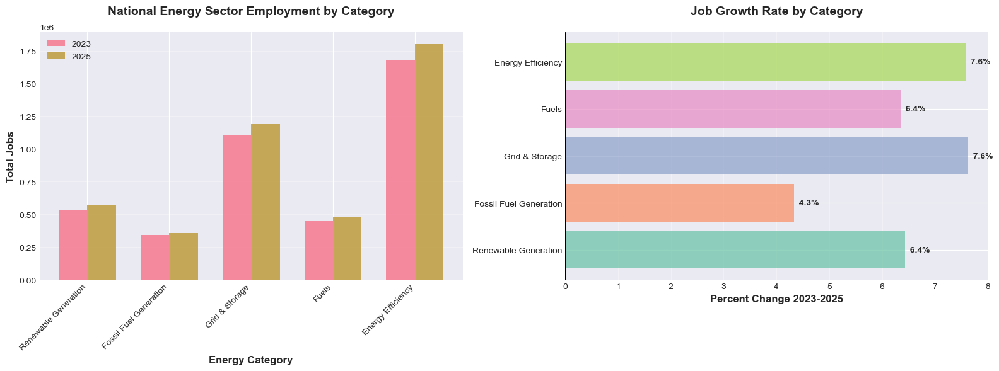

In [21]:
# Calculate national totals by energy category - GOAL 1
import os

#Creates a new directory for my visualization outputs.
OUTPUT_DIR = "Visualization Outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

goal1_national_totals = {}
for category, subcats in COUNTY_ENERGY_CATEGORIES.items():
    jobs_2023 = sum(goal1_county_trends[f'{subcat}_2023'].sum() for subcat in subcats if f'{subcat}_2023' in goal1_county_trends.columns)
    jobs_2025 = sum(goal1_county_trends[f'{subcat}_2025'].sum() for subcat in subcats if f'{subcat}_2025' in goal1_county_trends.columns)
    goal1_national_totals[category] = {
        '2023': jobs_2023,
        '2025': jobs_2025,
        'change': jobs_2025 - jobs_2023,
        'pct_change': ((jobs_2025 - jobs_2023) / jobs_2023 * 100) if jobs_2023 > 0 else 0
    }

# Create visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Left: Job totals by category
categories = list(goal1_national_totals.keys())
jobs_2023 = [goal1_national_totals[cat]['2023'] for cat in categories]
jobs_2025 = [goal1_national_totals[cat]['2025'] for cat in categories]

x = np.arange(len(categories))
width = 0.35

axes[0].bar(x - width/2, jobs_2023, width, label='2023', alpha=0.8)
axes[0].bar(x + width/2, jobs_2025, width, label='2025', alpha=0.8)
axes[0].set_xlabel('Energy Category', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Total Jobs', fontsize=12, fontweight='bold')
axes[0].set_title('National Energy Sector Employment by Category', fontsize=14, fontweight='bold', pad=20)
axes[0].set_xticks(x)
axes[0].set_xticklabels(categories, rotation=45, ha='right')
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# Right: Percent change
pct_changes = [goal1_national_totals[cat]['pct_change'] for cat in categories]

# Color-blind-safe palette (ColorBrewer Set2)
cb_palette = [
    "#66c2a5",  # teal
    "#fc8d62",  # orange
    "#8da0cb",  # blue
    "#e78ac3",  # pink
    "#a6d854",  # green
    "#ffd92f",  # yellow
]

# Assign alternating distinct colors to each bar
colors = [cb_palette[i % len(cb_palette)] for i in range(len(pct_changes))]

axes[1].barh(categories, pct_changes, color=colors, alpha=0.7)
axes[1].set_xlabel('Percent Change 2023-2025', fontsize=12, fontweight='bold')
axes[1].set_title('Job Growth Rate by Category', fontsize=14, fontweight='bold', pad=20)
axes[1].axvline(x=0, color='black', linestyle='-', linewidth=0.8)
axes[1].grid(axis='x', alpha=0.3)

# Add value labels
for i, v in enumerate(pct_changes):
    axes[1].text(v, i, f'  {v:.1f}%', va='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR,'Goal1_National_Overview.png'), dpi=300, bbox_inches='tight')
plt.show()

## State-Level Heatmap (Goal 1)

**Visualization:**
- Displays top 15 states by total job change
- Use robust normalization (5th-95th percentile range) to make the heat map information more meaningful
- Shows job growth/decline across 5 key energy categories:
  - Solar
  - Wind
  - EPG - Natural Gas
  - Traditional HVAC
  - Storage

**Color Interpretation:**
- Green: Job growth in that category
- Red: Job decline in that category
- Yellow: Minimal change

**Methodology:**
Uses symmetric color scaling around zero to provide balanced visual representation of growth and decline patterns.

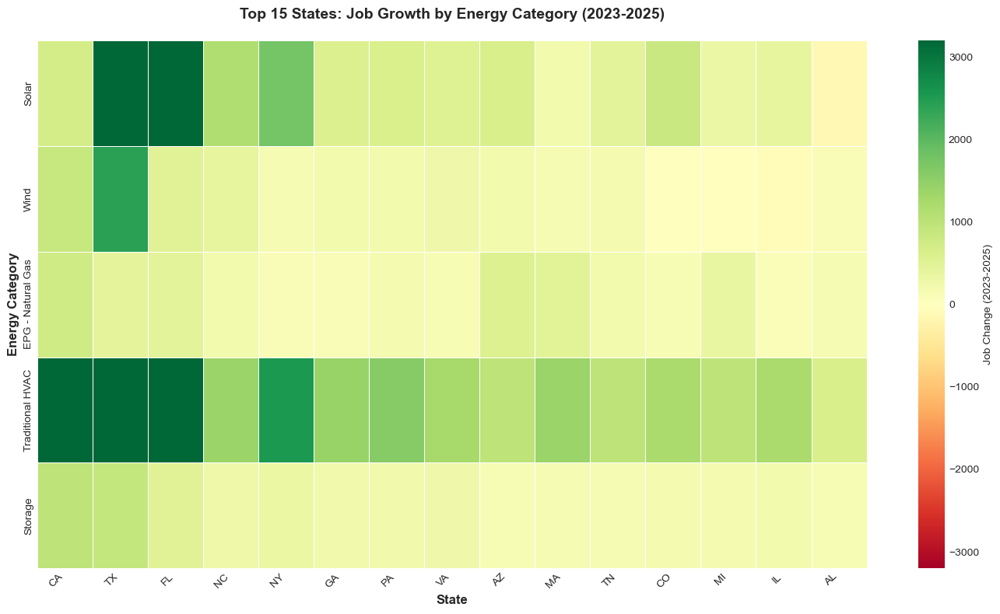

[INFO] Showing top 15 states
[INFO] Color range optimized: 68 to 3200 jobs


In [78]:
# Create heatmap of state-level growth - GOAL 1
Top_15_StatesJob_Growth = plt.figure(figsize=(14, 8))

# Get top 15 states by absolute job change (reduced from the previous 30 for clarity/easier to read)
top_states = goal1_state_trends.nlargest(15, 'Total_Change')

# Prepare data for heatmap (select key categories)
heatmap_cols = ['Solar', 'Wind', 'EPG - Natural Gas', 'Traditional HVAC', 'Storage']
heatmap_data = []
for col in heatmap_cols:
    if f'{col}_AbsChange' in top_states.columns:
        heatmap_data.append(top_states[f'{col}_AbsChange'].values)

if heatmap_data:
    heatmap_array = np.array(heatmap_data)
    
    # Enhanced color contrast: use robust min/max to avoid extreme value compression
    # Calculate 5th and 95th percentiles to set colormap range
    vmin_robust = np.percentile(heatmap_array, 5)
    vmax_robust = np.percentile(heatmap_array, 95)
    
    # Use the maximum absolute value for symmetric colormap around zero
    vmax_symmetric = max(abs(vmin_robust), abs(vmax_robust))
    
    sns.heatmap(heatmap_array, 
                xticklabels=top_states['State'].values,
                yticklabels=heatmap_cols,
                cmap='RdYlGn',  # Red-Yellow-Green: Red=decline, Green=growth
                center=0,
                vmin=-vmax_symmetric,  # Symmetric range for better contrast
                vmax=vmax_symmetric,
                cbar_kws={'label': 'Job Change (2023-2025)'},
                fmt='.0f', 
                annot=False,
                linewidths=0.5,  # Add gridlines for clarity
                linecolor='white')
    
    plt.title('Top 15 States: Job Growth by Energy Category (2023-2025)', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('State', fontsize=12, fontweight='bold')
    plt.ylabel('Energy Category', fontsize=12, fontweight='bold')
    plt.xticks(rotation=45, ha='right')  # Better angle for readability
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR,'Goal1_State_Heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()
    final_map1 = Top_15_StatesJob_Growth
    
    print(f"[INFO] Showing top 15 states")
    print(f"[INFO] Color range optimized: {vmin_robust:.0f} to {vmax_robust:.0f} jobs")
else:
    print("[WARNING] Insufficient data for heatmap")

## Top Growing/Declining Counties (Goal 1)

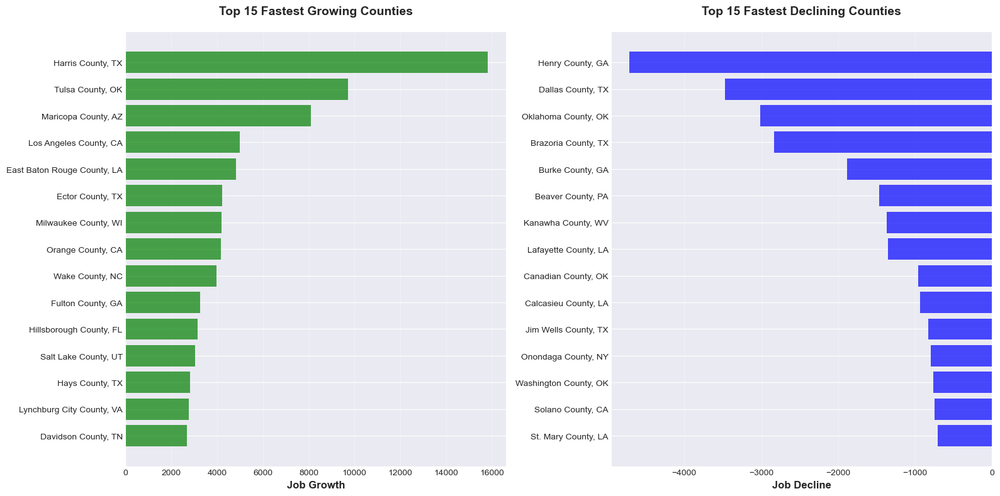

In [23]:
# Top growing and declining counties - GOAL 1
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Top 15 growing counties
top_growing = goal1_county_trends.nlargest(15, 'Total_Change')
axes[0].barh(range(len(top_growing)), top_growing['Total_Change'], color='green', alpha=0.7)
axes[0].set_yticks(range(len(top_growing)))
axes[0].set_yticklabels([f"{row['County Name']}, {row['State']}" for _, row in top_growing.iterrows()])
axes[0].set_xlabel('Job Growth', fontsize=12, fontweight='bold')
axes[0].set_title('Top 15 Fastest Growing Counties', fontsize=14, fontweight='bold', pad=20)
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Top 15 declining counties
top_declining = goal1_county_trends.nsmallest(15, 'Total_Change')
axes[1].barh(range(len(top_declining)), top_declining['Total_Change'], color='blue', alpha=0.7)
axes[1].set_yticks(range(len(top_declining)))
axes[1].set_yticklabels([f"{row['County Name']}, {row['State']}" for _, row in top_declining.iterrows()])
axes[1].set_xlabel('Job Decline', fontsize=12, fontweight='bold')
axes[1].set_title('Top 15 Fastest Declining Counties', fontsize=14, fontweight='bold', pad=20)
axes[1].invert_yaxis()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR,'Goal1_Top_Counties.png'), dpi=300, bbox_inches='tight')
plt.show()

## Renewable vs Fossil Fuel Comparison (Goal 1)

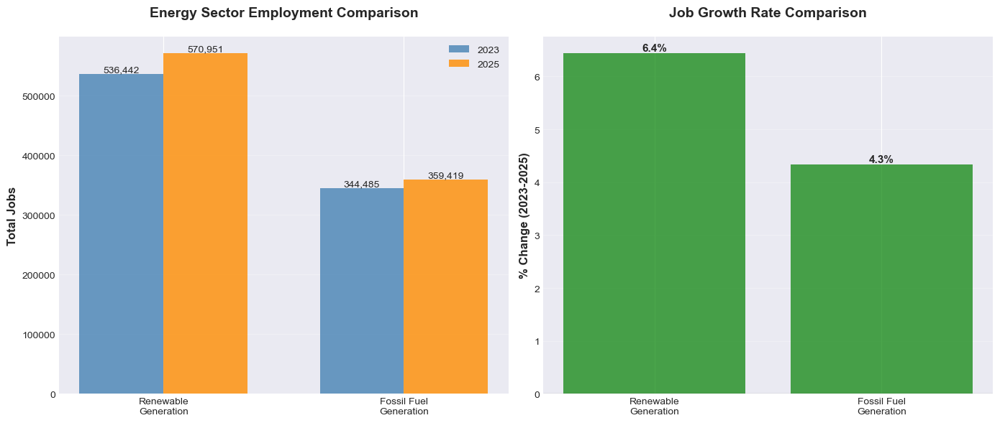

In [24]:
# Compare renewable vs fossil fuel sectors - GOAL 1
goal1_renewable_2023 = goal1_national_totals['Renewable Generation']['2023']
goal1_renewable_2025 = goal1_national_totals['Renewable Generation']['2025']
goal1_fossil_2023 = goal1_national_totals['Fossil Fuel Generation']['2023']
goal1_fossil_2025 = goal1_national_totals['Fossil Fuel Generation']['2025']

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Left: Absolute numbers
categories = ['Renewable\nGeneration', 'Fossil Fuel\nGeneration']
goal1_jobs_2023 = [goal1_renewable_2023, goal1_fossil_2023]
goal1_jobs_2025 = [goal1_renewable_2025, goal1_fossil_2025]

x = np.arange(len(categories))
width = 0.35

axes[0].bar(x - width/2, goal1_jobs_2023, width, label='2023', alpha=0.8, color='steelblue')
axes[0].bar(x + width/2, goal1_jobs_2025, width, label='2025', alpha=0.8, color='darkorange')
axes[0].set_ylabel('Total Jobs', fontsize=12, fontweight='bold')
axes[0].set_title('Energy Sector Employment Comparison', fontsize=14, fontweight='bold', pad=20)
axes[0].set_xticks(x)
axes[0].set_xticklabels(categories)
axes[0].legend()
axes[0].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate(goal1_jobs_2023):
    axes[0].text(i - width/2, v, f'{v:,.0f}', ha='center', va='bottom', fontsize=10)
for i, v in enumerate(goal1_jobs_2025):
    axes[0].text(i + width/2, v, f'{v:,.0f}', ha='center', va='bottom', fontsize=10)

# Right: Percent change
goal1_renewable_pct = ((goal1_renewable_2025 - goal1_renewable_2023) / goal1_renewable_2023) * 100
goal1_fossil_pct = ((goal1_fossil_2025 - goal1_fossil_2023) / goal1_fossil_2023) * 100

goal1_pct_changes = [goal1_renewable_pct, goal1_fossil_pct]
colors = ['green' if p > 0 else 'red' for p in goal1_pct_changes]

axes[1].bar(categories, goal1_pct_changes, color=colors, alpha=0.7)
axes[1].set_ylabel('% Change (2023-2025)', fontsize=12, fontweight='bold')
axes[1].set_title('Job Growth Rate Comparison', fontsize=14, fontweight='bold', pad=20)
axes[1].axhline(y=0, color='black', linestyle='-', linewidth=0.8)
axes[1].grid(axis='y', alpha=0.3)

# Add value labels
for i, v in enumerate(goal1_pct_changes):
    axes[1].text(i, v, f'{v:.1f}%', ha='center', va='bottom' if v > 0 else 'top', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR,'Goal1_Renewable_vs_Fossil.png'), dpi=300, bbox_inches='tight')
plt.show()

## 10. Summary Statistics and Key Findings (Goal 1 - County Data)

In [25]:
print("GOAL 1: COUNTY JOB TRENDS 2023-2025 - SUMMARY")
print("="*80)

# Overall statistics - GOAL 1 COUNTY DATA
goal1_total_jobs_2023 = goal1_county_trends['Total_Jobs_2023'].sum()
goal1_total_jobs_2025 = goal1_county_trends['Total_Jobs_2025'].sum()
goal1_total_change = goal1_total_jobs_2025 - goal1_total_jobs_2023
goal1_total_pct_change = (goal1_total_change / goal1_total_jobs_2023) * 100

print(f"\n1. NATIONAL TOTALS (COUNTY DATA):")
print(f"   Total energy sector jobs (2023): {goal1_total_jobs_2023:,.0f}")
print(f"   Total energy sector jobs (2025): {goal1_total_jobs_2025:,.0f}")
print(f"   Net change (2023-2025): {goal1_total_change:+,.0f} ({goal1_total_pct_change:+.2f}%)")

print(f"\n2. RENEWABLE ENERGY:")
print(f"   Jobs (2023): {goal1_renewable_2023:,.0f}")
print(f"   Jobs (2025): {goal1_renewable_2025:,.0f}")
print(f"   Growth: {(goal1_renewable_2025-goal1_renewable_2023):+,.0f} ({((goal1_renewable_2025-goal1_renewable_2023)/goal1_renewable_2023*100):+.2f}%)")

print(f"\n3. FOSSIL FUEL GENERATION:")
print(f"   Jobs (2023): {goal1_fossil_2023:,.0f}")
print(f"   Jobs (2025): {goal1_fossil_2025:,.0f}")
print(f"   Change: {(goal1_fossil_2025-goal1_fossil_2023):+,.0f} ({((goal1_fossil_2025-goal1_fossil_2023)/goal1_fossil_2023*100):+.2f}%)")

print(f"\n4. TOP GROWING ENERGY CATEGORIES:")
goal1_category_changes = {}
for cat in county_energy_columns:
    if f'{cat}_2023' in goal1_state_trends.columns:
        cat_total_2023 = goal1_state_trends[f'{cat}_2023'].sum()
        cat_total_2025 = goal1_state_trends[f'{cat}_2025'].sum()
        cat_change = cat_total_2025 - cat_total_2023
        goal1_category_changes[cat] = cat_change

goal1_top_categories = sorted(goal1_category_changes.items(), key=lambda x: x[1], reverse=True)[:5]
for i, (cat, change) in enumerate(goal1_top_categories, 1):
    print(f"   {i}. {cat}: {change:+,.0f} jobs")

print(f"\n5. GEOGRAPHIC DISTRIBUTION:")
print(f"   Counties analyzed: {len(goal1_county_trends)}")
print(f"   States covered: {goal1_county_trends['State'].nunique()}")
print(f"   Counties with growth: {(goal1_county_trends['Total_Change'] > 0).sum()}")
print(f"   Counties with decline: {(goal1_county_trends['Total_Change'] < 0).sum()}")

GOAL 1: COUNTY JOB TRENDS 2023-2025 - SUMMARY

1. NATIONAL TOTALS (COUNTY DATA):
   Total energy sector jobs (2023): 4,111,294
   Total energy sector jobs (2025): 4,400,779
   Net change (2023-2025): +289,485 (+7.04%)

2. RENEWABLE ENERGY:
   Jobs (2023): 536,442
   Jobs (2025): 570,951
   Growth: +34,509 (+6.43%)

3. FOSSIL FUEL GENERATION:
   Jobs (2023): 344,485
   Jobs (2025): 359,419
   Change: +14,934 (+4.34%)

4. TOP GROWING ENERGY CATEGORIES:
   1. Traditional TDS: +70,490 jobs
   2. Traditional HVAC: +43,445 jobs
   3. High Efficiency HVAC & Renewable H&C: +41,012 jobs
   4. Fuels - Other: +38,296 jobs
   5. Advanced Materials & Insulation: +23,142 jobs

5. GEOGRAPHIC DISTRIBUTION:
   Counties analyzed: 3142
   States covered: 51
   Counties with growth: 2070
   Counties with decline: 1072


## 11. Export Data for Further Analysis (Goal 1)

In [26]:
# Export key datasets - GOAL 1 COUNTY DATA
goal1_county_trends.to_csv('Goal1_County_Trends_2023_2025.csv', index=False)
goal1_state_trends.to_csv('Goal1_State_Trends_2023_2025.csv', index=False)

print("[SUCCESS] GOAL 1 data exported:")
print("  - Goal1_County_Trends_2023_2025.csv")
print("  - Goal1_State_Trends_2023_2025.csv")

[SUCCESS] GOAL 1 data exported:
  - Goal1_County_Trends_2023_2025.csv
  - Goal1_State_Trends_2023_2025.csv


Data manipulations were needed to read in the files, remove N/A rows, properly label repeated column names, adjust the values for <10 values*, filter states to only include shared values (excludes Puerto Rico and the Virgin Islands which have data avilable soley in 2025 Public Data), and filter column names to only include common categories (with mapping to address small syntax differences). 

One such manipulation is highlighted in detail here and below:
*Originally I set all "<10" into 5 for a "medium ground", however it lead to issues when the total job amount for a job category was low overall, such as with the "Oil & Other FF" column in the state of Alabama (first test case). This lead me to do testing with two strategies, proportional calculations based on the true total state values, and using set replacment amounts (5, 3, and 1) based on the relative scale of total jobs in each category. More information can be found below. 

### Below we see the methodology and strategies I took for deciding how to normalize values in the county data that are "<10". Ultimately, I decided that Strategy 1 would be better, use proportionality to determine the missing information, because it lead to less egregious errors (20%+ differences in true total and calculated total jobs for a specific state in that respecitve category). To test the this in a limited capacity I started this experimentation with the 2024 County Estimate dataset

In [27]:
# For the sake of transparency, I used Claude's Sonnet 4.5 for the planning and outline of this strategy 1 vs strategy 2 testing. 
# It helped automate this data entry as well, and was used as a tool in my ultimate decision to use proportional values in my data. 

# Load State-Level True Totals
"""
Import the true state-level totals for validation.
"""

import pandas as pd
import numpy as np

# State-level true totals data
state_totals_data = {
    'State': ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'],
    'Solar': [1325, 152, 10110, 800, 117946, 9017, 3303, 731, 1711, 15435, 8194, 4142, 1078, 6988, 4298, 1301, 1332, 2116, 3980, 985, 7195, 16899, 5643, 5332, 1410, 3639, 479, 2015, 9071, 1660, 9263, 3403, 15490, 9819, 334, 8736, 1649, 5822, 6731, 1549, 4112, 723, 5446, 16684, 7945, 1834, 5833, 5670, 583, 4372, 262],
    'Wind': [1508, 98, 1403, 984, 8132, 7880, 348, 91, 356, 6020, 1433, 305, 1065, 9389, 6976, 3974, 2097, 294, 468, 1343, 1280, 2768, 5188, 2860, 302, 1544, 165, 721, 297, 1178, 1182, 1192, 4482, 1569, 1751, 1575, 2021, 1701, 3255, 617, 1801, 1871, 770, 27381, 723, 363, 2420, 3521, 505, 1977, 183],
    'Traditional hydropower': [449, 437, 384, 98, 10570, 984, 136, 111, 122, 874, 868, 33, 228, 936, 174, 109, 188, 127, 218, 284, 232, 1631, 5192, 1028, 101, 437, 414, 212, 98, 268, 306, 86, 5320, 751, 36, 352, 408, 1721, 517, 92, 7580, 58, 5631, 2460, 376, 126, 783, 2613, 174, 274, 38],
    'Oil and other fossil fuel electricity': [172, 107, 192, 22, 1007, 261, 213, 17, 15, 314, 410, 1334, 31, 444, 1011, 60, 1483, 43, 321, 81, 107, 401, 127, 91, 22, 92, 20, 37, 18, 513, 90, 153, 761, 408, 12, 168, 104, 81, 247, 10, 53, 18, 74, 657, 41, 15, 258, 101, 43, 71, 6],
    'Bioenergy/Combined heat and power': [1058, 139, 678, 253, 7387, 1340, 378, 57, 144, 5408, 956, 299, 132, 2190, 481, 541, 438, 310, 263, 381, 516, 1894, 1071, 524, 112, 721, 60, 489, 519, 541, 1529, 137, 1004, 1574, 127, 651, 181, 351, 1332, 83, 888, 178, 428, 1706, 266, 82, 1838, 1172, 108, 549, 36],
    'Natural gas electricity': [2349, 457, 4955, 1075, 19837, 989, 1181, 543, 245, 14799, 2177, 125, 321, 4385, 1996, 615, 4470, 860, 2168, 433, 2086, 5232, 3826, 1004, 1772, 978, 245, 563, 1825, 1003, 2043, 407, 5272, 2914, 146, 3173, 2270, 649, 3066, 449, 3134, 218, 761, 9126, 2508, 251, 1839, 695, 416, 1295, 71],
    'Coal electricity': [1099, 112, 3344, 293, 1814, 2089, 117, 31, 119, 3417, 748, 246, 47, 1908, 2669, 1344, 1704, 1383, 631, 39, 1599, 1232, 2961, 1194, 668, 1898, 330, 568, 128, 115, 1117, 212, 1072, 1602, 788, 8406, 1143, 200, 1600, 37, 2367, 83, 490, 4201, 660, 19, 783, 267, 1672, 1756, 857],
    'Traditional transmission and distribution': [21248, 3961, 17526, 11222, 95242, 20606, 8366, 2721, 1948, 38193, 30629, 2523, 4425, 29791, 16794, 8887, 13115, 14167, 28692, 2701, 10734, 13481, 21631, 16967, 12604, 20976, 5837, 9297, 8358, 2623, 14881, 13922, 57624, 26974, 7028, 30930, 29633, 8009, 41741, 2018, 12607, 3447, 22076, 148039, 7094, 1800, 19351, 19962, 31840, 14531, 7493],
    'Storage': [985, 220, 1625, 448, 19011, 2069, 367, 75, 131, 2649, 2142, 418, 996, 2673, 2134, 862, 672, 767, 969, 364, 1018, 5354, 2825, 2145, 481, 984, 278, 267, 9663, 155, 938, 454, 2475, 1872, 354, 1702, 1037, 1533, 2188, 158, 1038, 327, 1042, 8966, 661, 474, 1350, 2728, 498, 1459, 299],
    'Smart Grid': [378, 40, 282, 170, 2618, 479, 152, 90, 54, 1151, 753, 59, 55, 1428, 587, 199, 203, 245, 240, 53, 453, 655, 440, 281, 150, 459, 66, 97, 166, 64, 344, 141, 587, 864, 92, 543, 234, 328, 583, 36, 502, 61, 6451, 1873, 199, 56, 506, 387, 98, 349, 52],
    'Micro Grid': [316, 45, 392, 153, 2126, 464, 236, 51, 110, 1183, 713, 50, 104, 689, 310, 221, 161, 235, 269, 72, 431, 1087, 458, 350, 130, 358, 68, 119, 156, 87, 427, 115, 1153, 709, 62, 562, 222, 243, 798, 360, 268, 59, 344, 2073, 239, 394, 572, 374, 130, 325, 61],
    'Other Grid Mod': [422, 45, 336, 198, 2135, 475, 216, 39, 74, 1428, 1092, 56, 92, 707, 305, 297, 182, 287, 302, 75, 433, 166, 521, 359, 166, 421, 83, 127, 165, 80, 334, 132, 803, 895, 65, 624, 265, 1684, 741, 57, 323, 75, 352, 2267, 232, 46, 581, 403, 195, 398, 92],
    'ENERGY STAR & Efficient Lighting': [2918, 560, 8410, 2399, 68127, 11410, 8120, 1389, 1516, 33487, 9375, 1371, 1870, 14271, 6442, 6672, 4033, 5513, 4472, 1075, 11972, 14782, 14523, 11458, 1741, 6038, 2242, 1874, 2671, 2848, 8772, 2062, 37549, 35471, 583, 15988, 1860, 5574, 15681, 3182, 2876, 1096, 11328, 57744, 6826, 1875, 19540, 14820, 1972, 21115, 2780],
    'Traditional HVAC': [6364, 691, 10740, 3206, 111955, 10865, 8708, 3738, 2661, 23196, 12907, 686, 2072, 29078, 13254, 2406, 2851, 5633, 7270, 1518, 24905, 22501, 3205, 9069, 3932, 20379, 3288, 3333, 2656, 2530, 11641, 1351, 35584, 19959, 797, 18643, 2940, 10282, 20015, 1425, 2962, 2121, 9137, 35844, 4242, 2187, 17692, 18089, 926, 9279, 1950],
    'High Efficiency HVAC & Renewable H&C': [3566, 1590, 12259, 2991, 60780, 7596, 10149, 2982, 4642, 24722, 18728, 2745, 4587, 25957, 22062, 6718, 3731, 7336, 4004, 3747, 18167, 18345, 6784, 12144, 3045, 10400, 1382, 4091, 3965, 4542, 8015, 1634, 37166, 12630, 3297, 16120, 8124, 10344, 16787, 2291, 8002, 2035, 17928, 38856, 7611, 3010, 14013, 7881, 1200, 6569, 1071],
    'Advanced Materials & Insulation': [14784, 1199, 7580, 1070, 23432, 6303, 3794, 1973, 624, 29610, 7659, 377, 814, 8696, 4788, 2143, 3208, 3359, 4165, 378, 8989, 10688, 39978, 4429, 1884, 2145, 1263, 2289, 2232, 480, 2733, 792, 9126, 7153, 327, 18193, 521, 8853, 13445, 3001, 6170, 766, 6572, 23736, 9043, 1599, 10790, 6837, 2511, 18196, 495],
    'EE - Other': [2710, 192, 5324, 5860, 37884, 1661, 4478, 833, 2697, 14220, 9397, 580, 189, 8727, 5244, 2214, 3861, 2564, 2030, 2286, 3739, 17578, 12019, 7411, 4430, 1569, 344, 2268, 1491, 1228, 7106, 647, 10521, 5604, 290, 9800, 1422, 5207, 6985, 1431, 10224, 1624, 6499, 16737, 5077, 1642, 14651, 12529, 341, 1709, 643],
    'Fuels - Coal': [3528, 164, 151, 24, 313, 1766, 29, 8, 23, 180, 76, 7, 16, 2883, 2839, 27, 53, 7320, 166, 11, 428, 65, 87, 69, 321, 140, 1352, 13, 18, 11, 57, 1197, 179, 64, 1824, 776, 164, 23, 6804, 8, 52, 5, 127, 2453, 2103, 5, 3418, 90, 18755, 37, 6867],
    'Petroleum': [3683, 7203, 674, 3630, 47716, 15088, 2987, 868, 351, 5844, 4817, 765, 562, 17160, 5858, 3590, 8229, 4057, 42674, 1449, 1053, 2099, 5001, 6325, 5787, 3375, 3050, 764, 544, 583, 12671, 13051, 5749, 4064, 13746, 11586, 33569, 509, 16290, 419, 2309, 1206, 3655, 185624, 5546, 347, 5547, 5442, 4056, 4185, 8887],
    'Fuels - Natural Gas': [833, 4215, 460, 1731, 8624, 9489, 306, 73, 309, 7479, 846, 276, 595, 1822, 778, 285, 2096, 1065, 20065, 127, 1081, 1075, 1527, 598, 1604, 446, 863, 740, 1574, 116, 902, 16123, 2632, 693, 16929, 5117, 21314, 246, 13515, 83, 644, 83, 675, 102225, 2137, 49, 2072, 486, 4958, 534, 5650],
    'Corn Ethanol': [101, 3, 152, 351, 801, 661, 152, 82, 18, 288, 490, 975, 592, 3444, 2367, 4192, 1296, 592, 200, 28, 155, 107, 829, 1700, 277, 1706, 17, 2288, 7, 12, 81, 100, 532, 385, 716, 1059, 210, 154, 1648, 9, 447, 1688, 186, 2728, 46, 11, 159, 319, 28, 1437, 35],
    'Woody Biomass': [1176, 62, 105, 783, 2414, 2723, 126, 23, 48, 973, 1318, 16, 591, 311, 193, 105, 51, 203, 691, 665, 146, 2882, 768, 348, 930, 312, 346, 57, 107, 360, 130, 117, 1604, 1059, 23, 353, 318, 3779, 1114, 32, 1210, 84, 615, 845, 101, 1079, 1407, 1128, 246, 365, 101],
    'Other Clean Fuels': [271, 44, 389, 595, 5973, 1830, 522, 136, 55, 2826, 519, 1803, 822, 1644, 812, 748, 315, 339, 339, 223, 444, 3705, 1312, 722, 550, 933, 400, 215, 189, 145, 485, 240, 2446, 1948, 189, 1362, 829, 761, 2250, 287, 1019, 279, 1227, 2519, 264, 644, 461, 1733, 282, 679, 166]
}

state_totals_df = pd.DataFrame(state_totals_data)

print(f"Shape of data that made sense to cross-reference"
f" (did not include data from columns that did not have a logical connection in the county estimate dataset): {state_totals_df.shape}")


# Analyze Volume Distribution for Strategy 2
"""
Examine the state-level data to determine high/medium/low volume categories.
Calculate median values across all states for each column.
"""

# Calculate median values for each category across all states
medians = {}
for col in state_totals_df.columns:
    if col != 'State':
        medians[col] = state_totals_df[col].median()

# Sort by median value
sorted_medians = sorted(medians.items(), key=lambda x: x[1], reverse=True)

print("\nMedian values by category (sorted high to low):")
print("\n")
for col, median_val in sorted_medians:
    print(f"{col:45s}: {median_val:8.0f}")

# Define thresholds
high_threshold = 2000  # High volume: median > 2000
medium_threshold = 500  # Medium volume: 500 < median <= 2000
# Low volume: median <= 500

print("\n" + "="*60)
print("VOLUME CATEGORIZATION")
print("="*60)

HIGH_VOLUME = []
MEDIUM_VOLUME = []
LOW_VOLUME = []

for col, median_val in sorted_medians:
    if median_val > high_threshold:
        HIGH_VOLUME.append(col)
        category = "HIGH"
    elif median_val > medium_threshold:
        MEDIUM_VOLUME.append(col)
        category = "MEDIUM"
    else:
        LOW_VOLUME.append(col)
        category = "LOW"
    print(f"{category:8s} | {col:45s} | Median: {median_val:8.0f}")

print(f"\nHigh Volume ({len(HIGH_VOLUME)} categories): Replacement value = 5")
print(f"Medium Volume ({len(MEDIUM_VOLUME)} categories): Replacement value = 3")
print(f"Low Volume ({len(LOW_VOLUME)} categories): Replacement value = 1")


# Create Column Mapping
"""
Map state-level column names to county-level column names.
"""

# Manual mapping based on semantic similarity
COLUMN_MAPPING = {
    # State-level name: County-level name
    'Solar': 'Solar',
    'Wind': 'Wind',
    'Traditional hydropower': 'Hydroelectric',
    'Low impact hydropower, marine, and hydrokinetics': 'Low-Impact Hydroelectric',
    'Bioenergy/Combined heat and power': None,  # No direct match
    'Natural gas electricity': 'EPG - Natural Gas',
    'Coal electricity': 'EPG - Coal',
    'Oil and other fossil fuel electricity': 'Oil & Other FF',
    'Traditional transmission and distribution': 'Traditional TDS',
    'Storage': 'Storage',
    'Smart Grid': 'Smart Grid',
    'Micro Grid': 'Micro Grid',
    'Other Grid Mod': 'Other Grid Mod',
    'ENERGY STAR & Efficient Lighting': 'ENERGY STAR & Efficient Lighting',
    'Traditional HVAC': 'Traditional HVAC',
    'High Efficiency HVAC & Renewable H&C': 'High Efficiency HVAC & Renewable H&C',
    'Advanced Materials & Insulation': 'Advanced Materials & Insulation',
    'EE - Other': 'EE - Other',
    'Fuels - Coal': 'Fuels - Coal',
    'Petroleum': 'Petroleum',
    'Fuels - Natural Gas': 'Fuels - Natural Gas',
    'Corn Ethanol': 'Corn Ethanol',
    'Woody Biomass': 'Woody Biomass',
    'Other Clean Fuels': 'Other Clean Fuels',
    # Not mapped (no equivalent in county data):
    # 'Geothermal electricity', 'Nuclear electricity', 'Other electricity',
    # 'Clean storage', 'Other storage', 'Other (including commodity flows)',
    # 'Other ethanol and non-woody biomass', 'Other biofuels', 'Nuclear fuels', 'Other fuels'
}

# Create reverse mapping for volume categorization
county_to_volume = {}
for state_col, county_col in COLUMN_MAPPING.items():
    if county_col is not None:
        if state_col in HIGH_VOLUME:
            county_to_volume[county_col] = 'HIGH'
        elif state_col in MEDIUM_VOLUME:
            county_to_volume[county_col] = 'MEDIUM'
        else:
            county_to_volume[county_col] = 'LOW'

print("\nColumn mapping created for Strategy 2:")
print("="*60)
for state_col, county_col in COLUMN_MAPPING.items():
    if county_col:
        volume = county_to_volume.get(county_col, 'N/A')
        print(f"{state_col:45s} -> {county_col:35s} [{volume}]")


# Strategy 1 - Proportional Replacement
"""
Replace <10 values proportionally based on known state totals.
"""

def clean_strategy1_proportional(dataframe, filtered_columns, state_totals_df, column_mapping, state_abbrev):
    """
    Strategy 1: Proportional replacement based on true state totals.
    """
    df = dataframe.copy()
    exclude_cols = ['State', 'County FIPS', 'County Name']
    numeric_cols = [col for col in df.columns if col in filtered_columns and col not in exclude_cols]
    
    # Get true totals for this state
    state_row = state_totals_df[state_totals_df['State'] == state_abbrev]
    if len(state_row) == 0:
        print(f"Warning: No true totals found for state {state_abbrev}")
        return df
    
    state_row = state_row.iloc[0]
    
    replacements = {}
    
    for county_col in numeric_cols:
        # Find corresponding state-level column
        state_col = None
        for s_col, c_col in column_mapping.items():
            if c_col == county_col:
                state_col = s_col
                break
        
        if state_col is None or state_col not in state_row:
            # No mapping, use default value of 3
            under_10_mask = df[county_col] == '<10'
            df[county_col] = df[county_col].astype(str).replace('<10', 'NaN')
            df[county_col] = pd.to_numeric(df[county_col], errors='coerce')
            df.loc[under_10_mask, county_col] = 3
            replacements[county_col] = 3
            continue
        
        # Count <10 values
        under_10_mask = df[county_col] == '<10'
        num_under_10 = under_10_mask.sum()
        
        # Convert to numeric
        df[county_col] = df[county_col].astype(str).replace('<10', 'NaN')
        df[county_col] = pd.to_numeric(df[county_col], errors='coerce')
        
        if num_under_10 > 0:
            # Calculate what the <10 values should sum to
            known_sum = df[county_col].sum()  # Sum of known values
            true_total = state_row[state_col]
            missing_total = true_total - known_sum
            
            # Replace each <10 with proportional share
            replacement_value = max(0, missing_total / num_under_10)
            df.loc[under_10_mask, county_col] = replacement_value
            replacements[county_col] = replacement_value
    
    return df, replacements


# Strategy 2 - Category-Specific Replacement
"""
Use different replacement values based on volume category.
"""

def clean_strategy2_categorical(dataframe, filtered_columns, county_to_volume):
    """
    Strategy 2: Use different replacement values based on volume category.
    """
    df = dataframe.copy()
    exclude_cols = ['State', 'County FIPS', 'County Name']
    numeric_cols = [col for col in df.columns if col in filtered_columns and col not in exclude_cols]
    
    replacements = {}
    
    for col in numeric_cols:
        df[col] = df[col].astype(str)
        
        # Choose replacement value based on category
        volume_cat = county_to_volume.get(col, 'MEDIUM')
        
        if volume_cat == 'HIGH':
            replacement = '5'
        elif volume_cat == 'MEDIUM':
            replacement = '3'
        else:  # LOW
            replacement = '1'
        
        df[col] = df[col].replace('<10', replacement)
        df[col] = pd.to_numeric(df[col], errors='coerce')
        replacements[col] = float(replacement)
    
    return df, replacements


# Run Both Strategies and Compare
"""
Apply both strategies to all states and report errors > 20%.
"""

print("\n" + "-"*80)
print("VALIDATION: Testing both strategies on all states")
print("Reporting only cases with error > 20%")
print("-"*80)

# Note: Using county_df_2024 (raw data BEFORE removing N/A counties)
# to match the state totals which include all counties.

errors_strategy1 = []
errors_strategy2 = []

high_error_count_s1 = 0
high_error_count_s2 = 0

for state_abbrev in state_totals_df['State']:
    # Filter data for this state
    state_data = county_df_2024[county_df_2024['State'] == state_abbrev].copy()
    
    if len(state_data) == 0:
        continue
    
    # Remove N/A counties for fair comparison
    county_col_name = 'County Name'
    if county_col_name in state_data.columns:
        state_data = state_data[state_data[county_col_name].notna()]
        state_data = state_data[state_data[county_col_name] != 'N/A']
        state_data = state_data[state_data[county_col_name] != 'NA']
        state_data = state_data[state_data[county_col_name].astype(str).str.strip() != '']
    
    # Apply Strategy 1
    state_clean_s1, replacements_s1 = clean_strategy1_proportional(
        state_data, county_energy_columns,  # FIXED: Use correct variable
        state_totals_df, COLUMN_MAPPING, state_abbrev
    )
    
    # Apply Strategy 2
    state_clean_s2, replacements_s2 = clean_strategy2_categorical(
        state_data, county_energy_columns, county_to_volume  # FIXED: Use correct variable
    )
    
    # Get true totals for this state
    true_row = state_totals_df[state_totals_df['State'] == state_abbrev].iloc[0]
    
    # Check each mapped column
    for state_col, county_col in COLUMN_MAPPING.items():
        if county_col is None or county_col not in state_clean_s1.columns:
            continue
        
        if state_col not in true_row.index:
            continue
        
        true_total = true_row[state_col]
        
        # Strategy 1 results
        s1_series = pd.to_numeric(state_clean_s1[county_col], errors='coerce')
        s1_total = s1_series.sum()
        s1_error = abs((s1_total - true_total) / true_total * 100) if true_total != 0 else 0
        
        # Strategy 2 results
        s2_series = pd.to_numeric(state_clean_s2[county_col], errors='coerce')
        s2_total = s2_series.sum()
        s2_error = abs((s2_total - true_total) / true_total * 100) if true_total != 0 else 0


        # Special alert for Strategy 1 errors > 10% (these should be rare)
        if s1_error > 10:
            replacement_val = replacements_s1.get(county_col, None)
            replacement_str = f"{replacement_val:.2f}" if replacement_val is not None else "N/A"
            print(f"\n STRATEGY 1 ERROR > 10%")
            print(f"   State: {state_abbrev} | Category: {county_col}")
            print(f"   True Total: {true_total:.0f} | Calculated: {s1_total:.0f} | Error: {s1_error:.1f}%")
            print(f"   Replacement value used: {replacement_str}\n")
        
        # Report errors > 20%
        # Useful only when you want to visualize for each individual error, but for the sake of being concise I will omit this from the final execution.
        # Note that these print statements were used initially when I was doing sanity checks to see if strategy 1 was out-performing strategy 2, as I 
        # hypothesized. 
        s2_error_count = 0
        if s1_error > 20 or s2_error > 20:
            #print(f"\n{state_abbrev} - {county_col}")
            #print(f"  True total: {true_total:.0f}")
            if s1_error > 20:
                replacement_val = replacements_s1.get(county_col, None)
                replacement_str = f"{replacement_val:.2f}" if replacement_val is not None else "N/A"
                print(f"  Strategy 1: {s1_total:.0f} (Error: {s1_error:.1f}%) - Replacement: {replacement_str}")
                print(f" Strategy 1 problem state: ")
                high_error_count_s1 += 1
            if s2_error > 20:
                replacement_val = replacements_s2.get(county_col, None)
                replacement_str = f"{replacement_val:.2f}" if replacement_val is not None else "N/A"
                high_error_count_s2 += 1
                s2_error_count += 1
                if s2_error_count < 20:
                    print(f"  Strategy 2: {s2_total:.0f} (Error: {s2_error:.1f}%) - Replacement: {replacement_str}")
                else:
                    print(f"  Strategy 2 has many more cases where the error was more than 20%. Those were omitted to be more succinct.")
        
        errors_strategy1.append({'State': state_abbrev, 'Column': county_col, 'Error': s1_error})
        errors_strategy2.append({'State': state_abbrev, 'Column': county_col, 'Error': s2_error})

print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)

errors_s1_df = pd.DataFrame(errors_strategy1)
errors_s2_df = pd.DataFrame(errors_strategy2)

print(f"\nStrategy 1 (Proportional):")
print(f"  Mean error: {errors_s1_df['Error'].mean():.2f}%")
print(f"  Median error: {errors_s1_df['Error'].median():.2f}%")
print(f"  Cases with error > 20%: {(errors_s1_df['Error'] > 20).sum()}")
print(f"  Cases with error > 10%: {(errors_s1_df['Error'] > 10).sum()}")
print(f"  Max error: {errors_s1_df['Error'].max():.2f}%")

print(f"\nStrategy 2 (Category-Specific):")
print(f"  Mean error: {errors_s2_df['Error'].mean():.2f}%")
print(f"  Median error: {errors_s2_df['Error'].median():.2f}%")
print(f"  Cases with error > 20%: {(errors_s2_df['Error'] > 20).sum()}")
print(f"  Cases with error > 10%: {(errors_s2_df['Error'] > 10).sum()}")
print(f"  Max error: {errors_s2_df['Error'].max():.2f}%")

print("\n" + "-"*80)
print("EXPLANATION OF STRATEGY 1 LOW ERROR, and why I ultimately decided to use this method:")
print("-"*80)
print("Strategy 1 (Proportional) calculates replacement values by:")
print("  1. Summing all known (non-<10) values")
print("  2. Subtracting from the true state total")
print("  3. Dividing the remainder by number of <10 cells")
print("\nThis means Strategy 1 SHOULD achieve near-zero error by design.")
print("If there's significant error, it indicates:")
print("  - Discrepancies between state totals and county data")
print("  - N/A counties carry large weight state totals, such as smaller states like DE (Delaware) and WV (West Virginia)")
print("  - Rounding or data quality issues")
print(f"  After further investigation, you will see from my outputs that I closely examined this edge cases where Strategy 1 failed and found the main" 
f" culprit was the smaller states, like DE and WV, where there either aren't opportunities to fill in a value for <10 "
f"might not exist \n(like with DE TDS never containing <10) so the N/A row will carry extra weight since we can't fill in for it (omitted during the cleaning phase).")

Shape of data that made sense to cross-reference (did not include data from columns that did not have a logical connection in the county estimate dataset): (51, 24)

Median values by category (sorted high to low):


Traditional transmission and distribution    :    13922
High Efficiency HVAC & Renewable H&C         :     7336
Traditional HVAC                             :     5633
ENERGY STAR & Efficient Lighting             :     5574
Solar                                        :     4112
Petroleum                                    :     4064
Advanced Materials & Insulation              :     3794
EE - Other                                   :     3739
Wind                                         :     1433
Natural gas electricity                      :     1181
Storage                                      :      985
Fuels - Natural Gas                          :      902
Coal electricity                             :      857
Other Clean Fuels                            :      550


Goal 2: Public Data State Trends (2023-2025)
=====================================================
State-Level Employment Analysis Using USEER Public Data

**Scope:** 51 states (50 states + DC)  
**Data Source:** USEER Public Data (2023, 2024, 2025)  
**Objective:** Analyze and visualize state-level job trends across energy categories

**Variable Naming:** All Goal 2 variables prefixed with `goal2_` to avoid conflicts with Goal 1

**Note:** This analysis uses the public data already loaded in Goal 1, ensuring consistency
with county-level analysis and leveraging existing data cleaning/validation.

## 1. Combine Public Data Across Years (Goal 2)

In [28]:
print("GOAL 2: STATE-LEVEL TREND ANALYSIS")
print("="*80)

# Verify public data variables exist
if 'public_state_totals_2023' not in locals():
    print("[ERROR] Public data not loaded. Run Goal 1 first.")
else:
    print("[SUCCESS] Using public data from Goal 1")
    print(f"  2023: {len(public_state_totals_2023)} states")
    print(f"  2024: {len(public_state_totals_2024)} states") 
    print(f"  2025: {len(public_state_totals_2025)} states")

# Get list of energy columns (excluding State column)
goal2_energy_columns = [col for col in public_state_totals_2023.columns if col != 'State']
print(f"\n[INFO] Analyzing {len(goal2_energy_columns)} energy categories")

GOAL 2: STATE-LEVEL TREND ANALYSIS
[SUCCESS] Using public data from Goal 1
  2023: 51 states
  2024: 51 states
  2025: 51 states

[INFO] Analyzing 25 energy categories


## 2. Create Combined State Trends DataFrame

In [29]:
# Combine all three years into single dataframe with year suffix
goal2_state_trends = public_state_totals_2023.copy()

# Add 2024 data
for col in goal2_energy_columns:
    if col in public_state_totals_2024.columns:
        goal2_state_trends[f'{col}_2024'] = public_state_totals_2024[col].values

# Add 2025 data  
for col in goal2_energy_columns:
    if col in public_state_totals_2025.columns:
        goal2_state_trends[f'{col}_2025'] = public_state_totals_2025[col].values

# Rename 2023 columns to include year suffix
for col in goal2_energy_columns:
    if col in goal2_state_trends.columns:
        goal2_state_trends = goal2_state_trends.rename(columns={col: f'{col}_2023'})

print("\n[GOAL 2] Combined state trends dataframe created")
print(f"  Shape: {goal2_state_trends.shape}")
print(f"  States: {len(goal2_state_trends)}")
print(f"  Columns: {len(goal2_state_trends.columns)}")


[GOAL 2] Combined state trends dataframe created
  Shape: (51, 76)
  States: 51
  Columns: 76


## 3: Calculate Total Jobs and Changes

In [30]:
# Calculate total jobs per state per year
goal2_state_trends['Total_Jobs_2023'] = 0
goal2_state_trends['Total_Jobs_2024'] = 0
goal2_state_trends['Total_Jobs_2025'] = 0

for col in goal2_energy_columns:
    # Sum across all categories for each year
    if f'{col}_2023' in goal2_state_trends.columns:
        goal2_state_trends['Total_Jobs_2023'] += goal2_state_trends[f'{col}_2023'].fillna(0)
    if f'{col}_2024' in goal2_state_trends.columns:
        goal2_state_trends['Total_Jobs_2024'] += goal2_state_trends[f'{col}_2024'].fillna(0)
    if f'{col}_2025' in goal2_state_trends.columns:
        goal2_state_trends['Total_Jobs_2025'] += goal2_state_trends[f'{col}_2025'].fillna(0)

# Calculate absolute and percentage changes (2023-2025)
goal2_state_trends['Total_Change'] = (
    goal2_state_trends['Total_Jobs_2025'] - goal2_state_trends['Total_Jobs_2023']
)
goal2_state_trends['Total_PctChange'] = (
    (goal2_state_trends['Total_Change'] / goal2_state_trends['Total_Jobs_2023']) * 100
)

# Calculate category-specific changes
for col in goal2_energy_columns:
    if f'{col}_2023' in goal2_state_trends.columns and f'{col}_2025' in goal2_state_trends.columns:
        goal2_state_trends[f'{col}_Change'] = (
            goal2_state_trends[f'{col}_2025'] - goal2_state_trends[f'{col}_2023']
        )

print("\n[GOAL 2] Trend calculations complete")
print(f"\nNational totals:")
print(f"  2023: {goal2_state_trends['Total_Jobs_2023'].sum():,.0f} jobs")
print(f"  2024: {goal2_state_trends['Total_Jobs_2024'].sum():,.0f} jobs")
print(f"  2025: {goal2_state_trends['Total_Jobs_2025'].sum():,.0f} jobs")
print(f"  Change: {goal2_state_trends['Total_Change'].sum():+,.0f} jobs")


[GOAL 2] Trend calculations complete

National totals:
  2023: 5,504,078 jobs
  2024: 5,685,506 jobs
  2025: 5,833,571 jobs
  Change: +329,493 jobs


## Goal 2 Visualizations

The following visualizations focus on state-level trends and patterns:

1. **National Trends by Category** - Time series showing job evolution across major categories
2. **Top/Bottom States** - Ranking states by total job change
3. **Renewable vs Fossil Comparison** - Scatter plot comparing growth patterns
4. **Regional Heatmap** - Geographic patterns of category-specific growth
5. **Category Leaders** - States leading growth in specific energy sectors

## 4: Visualization 1 - National Trends by Category

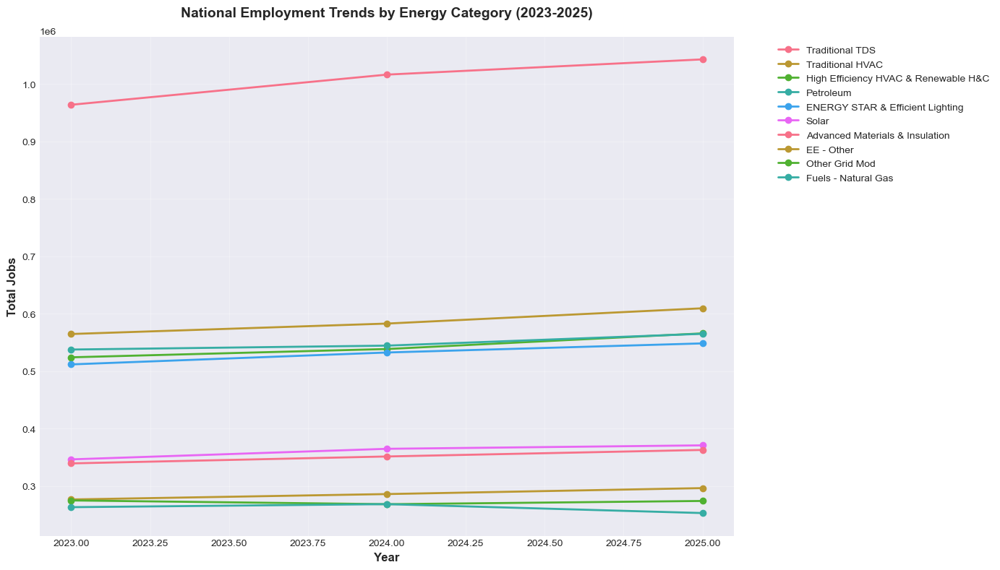

In [79]:
# Calculate national totals by category for each year
goal2_national_totals = {}

for year in [2023, 2024, 2025]:
    year_totals = {}
    for col in goal2_energy_columns:
        if f'{col}_{year}' in goal2_state_trends.columns:
            year_totals[col] = goal2_state_trends[f'{col}_{year}'].sum()
    goal2_national_totals[year] = year_totals

# Select top 10 categories by 2025 employment for clarity
categories_2025 = {k: v for k, v in goal2_national_totals[2025].items()}
top_10_categories = sorted(categories_2025.items(), key=lambda x: x[1], reverse=True)[:10]
top_10_names = [cat[0] for cat in top_10_categories]

# Create time series plot
Goal2_National_Trends = plt.figure(figsize=(14, 8))

for category in top_10_names:
    years = [2023, 2024, 2025]
    values = [goal2_national_totals[year].get(category, 0) for year in years]
    plt.plot(years, values, marker='o', linewidth=2, label=category)

plt.title('National Employment Trends by Energy Category (2023-2025)', 
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Total Jobs', fontsize=12, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'Goal2_National_Trends.png'), dpi=300, bbox_inches='tight')
plt.show()
final_image2 = Goal2_National_Trends

## 5: Visualization 2 - Top/Bottom States by Job Change

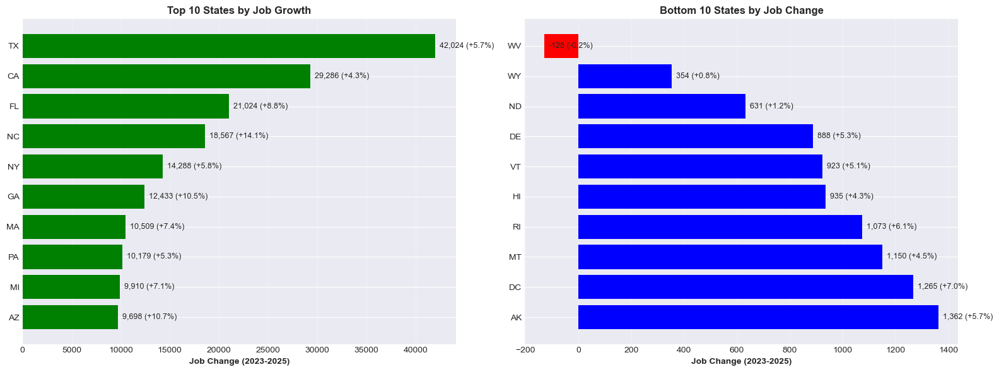

In [32]:
# Get top 10 and bottom 10 states
top_10_states = goal2_state_trends.nlargest(10, 'Total_Change')[['State', 'Total_Change', 'Total_PctChange']]
bottom_10_states = goal2_state_trends.nsmallest(10, 'Total_Change')[['State', 'Total_Change', 'Total_PctChange']]

# Create comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Top 10 states
colors_top = ['green' if x > 0 else 'red' for x in top_10_states['Total_Change']]
ax1.barh(range(len(top_10_states)), top_10_states['Total_Change'], color=colors_top)
ax1.set_yticks(range(len(top_10_states)))
ax1.set_yticklabels(top_10_states['State'])
ax1.set_xlabel('Job Change (2023-2025)', fontweight='bold')
ax1.set_title('Top 10 States by Job Growth', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')
ax1.invert_yaxis()

# Add value labels
for i, (idx, row) in enumerate(top_10_states.iterrows()):
    ax1.text(row['Total_Change'], i, f"  {row['Total_Change']:,.0f} ({row['Total_PctChange']:+.1f}%)", 
             va='center', fontsize=9)

# Bottom 10 states
colors_bottom = ['blue' if x > 0 else 'red' for x in bottom_10_states['Total_Change']]
ax2.barh(range(len(bottom_10_states)), bottom_10_states['Total_Change'], color=colors_bottom)
ax2.set_yticks(range(len(bottom_10_states)))
ax2.set_yticklabels(bottom_10_states['State'])
ax2.set_xlabel('Job Change (2023-2025)', fontweight='bold')
ax2.set_title('Bottom 10 States by Job Change', fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3, axis='x')
ax2.invert_yaxis()

# Add value labels
for i, (idx, row) in enumerate(bottom_10_states.iterrows()):
    ax2.text(row['Total_Change'], i, f"  {row['Total_Change']:,.0f} ({row['Total_PctChange']:+.1f}%)", 
             va='center', fontsize=9)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'Goal2_Top_Bottom_States.png'), dpi=300, bbox_inches='tight')
plt.show()

## 6: Visualization 3 - Renewable vs Fossil Fuel Growth

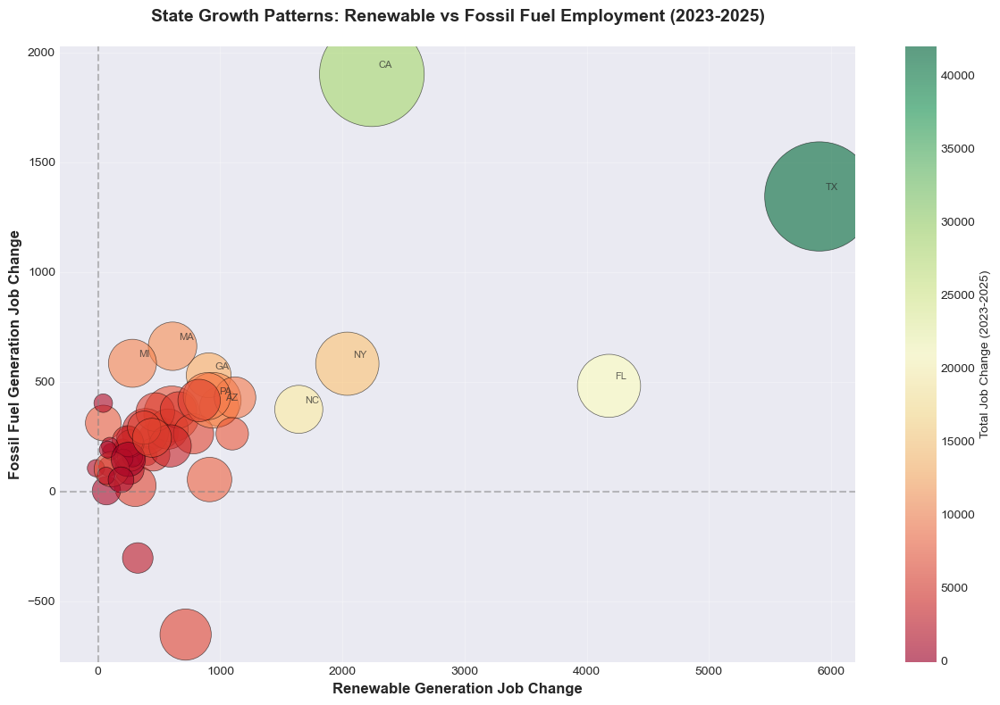


Renewable generation change: +35,745 jobs
Fossil fuel generation change: +14,792 jobs


In [83]:
# Calculate renewable and fossil fuel totals for each state
renewable_categories = COUNTY_ENERGY_CATEGORIES.get('Renewable Generation', [])
fossil_categories = COUNTY_ENERGY_CATEGORIES.get('Fossil Fuel Generation', [])

goal2_state_trends['Renewable_2023'] = 0
goal2_state_trends['Renewable_2025'] = 0
goal2_state_trends['Fossil_2023'] = 0
goal2_state_trends['Fossil_2025'] = 0

# Sum renewable categories
for cat in renewable_categories:
    if f'{cat}_2023' in goal2_state_trends.columns:
        goal2_state_trends['Renewable_2023'] += goal2_state_trends[f'{cat}_2023'].fillna(0)
    if f'{cat}_2025' in goal2_state_trends.columns:
        goal2_state_trends['Renewable_2025'] += goal2_state_trends[f'{cat}_2025'].fillna(0)

# Sum fossil fuel categories
for cat in fossil_categories:
    if f'{cat}_2023' in goal2_state_trends.columns:
        goal2_state_trends['Fossil_2023'] += goal2_state_trends[f'{cat}_2023'].fillna(0)
    if f'{cat}_2025' in goal2_state_trends.columns:
        goal2_state_trends['Fossil_2025'] += goal2_state_trends[f'{cat}_2025'].fillna(0)

# Calculate changes
goal2_state_trends['Renewable_Change'] = (
    goal2_state_trends['Renewable_2025'] - goal2_state_trends['Renewable_2023']
)
goal2_state_trends['Fossil_Change'] = (
    goal2_state_trends['Fossil_2025'] - goal2_state_trends['Fossil_2023']
)

# Create scatter plot
final_image3 = plt.figure(figsize=(12, 8))

plt.scatter(goal2_state_trends['Renewable_Change'], 
            goal2_state_trends['Fossil_Change'],
            s=goal2_state_trends['Total_Jobs_2025']/100,  # Size by total jobs
            alpha=0.6,
            c=goal2_state_trends['Total_Change'],  # Color by total change
            cmap='RdYlGn',
            edgecolors='black',
            linewidth=0.5)

# Add reference lines
plt.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
plt.axvline(x=0, color='gray', linestyle='--', alpha=0.5)

# Label selected states
for idx, row in goal2_state_trends.nlargest(10, 'Total_Change').iterrows():
    plt.annotate(row['State'], 
                xy=(row['Renewable_Change'], row['Fossil_Change']),
                xytext=(5, 5), textcoords='offset points',
                fontsize=8, alpha=0.7)

plt.colorbar(label='Total Job Change (2023-2025)')
plt.xlabel('Renewable Generation Job Change', fontsize=12, fontweight='bold')
plt.ylabel('Fossil Fuel Generation Job Change', fontsize=12, fontweight='bold')
plt.title('State Growth Patterns: Renewable vs Fossil Fuel Employment (2023-2025)', 
          fontsize=14, fontweight='bold', pad=20)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'Goal2_Renewable_vs_Fossil.png'), dpi=300, bbox_inches='tight')
plt.show()

print(f"\nRenewable generation change: {goal2_state_trends['Renewable_Change'].sum():+,.0f} jobs")
print(f"Fossil fuel generation change: {goal2_state_trends['Fossil_Change'].sum():+,.0f} jobs")

## 7: Visualization 4 - Regional Patterns Heatmap

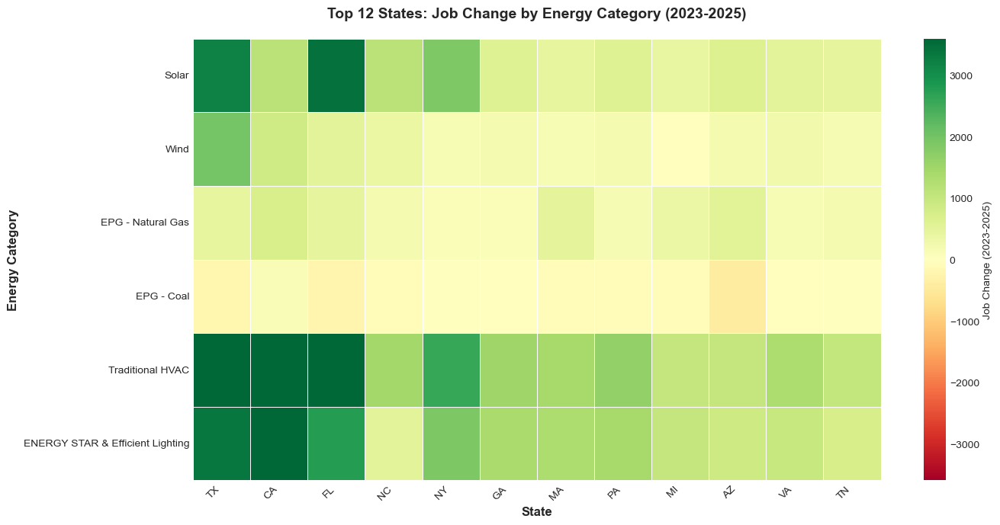

[INFO] Showing top 12 states across 6 categories


In [34]:
# Select top 12 states and 6 key categories for readable heatmap
top_12_states = goal2_state_trends.nlargest(12, 'Total_Change')
key_categories = ['Solar', 'Wind', 'EPG - Natural Gas', 'EPG - Coal', 
                  'Traditional HVAC', 'ENERGY STAR & Efficient Lighting']

# Prepare heatmap data
heatmap_data = []
available_categories = []

for cat in key_categories:
    if f'{cat}_Change' in top_12_states.columns:
        heatmap_data.append(top_12_states[f'{cat}_Change'].values)
        available_categories.append(cat)

if heatmap_data:
    heatmap_array = np.array(heatmap_data)
    
    # Use robust normalization for better contrast
    vmin_robust = np.percentile(heatmap_array, 5)
    vmax_robust = np.percentile(heatmap_array, 95)
    vmax_symmetric = max(abs(vmin_robust), abs(vmax_robust))
    
    plt.figure(figsize=(14, 7))
    
    sns.heatmap(heatmap_array,
                xticklabels=top_12_states['State'].values,
                yticklabels=available_categories,
                cmap='RdYlGn',
                center=0,
                vmin=-vmax_symmetric,
                vmax=vmax_symmetric,
                cbar_kws={'label': 'Job Change (2023-2025)'},
                linewidths=0.5,
                linecolor='white',
                fmt='.0f',
                annot=False)
    
    plt.title('Top 12 States: Job Change by Energy Category (2023-2025)', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('State', fontsize=12, fontweight='bold')
    plt.ylabel('Energy Category', fontsize=12, fontweight='bold')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, 'Goal2_Regional_Heatmap.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    #print("[SUCCESS] Goal 2 regional heatmap saved")
    print(f"[INFO] Showing top 12 states across {len(available_categories)} categories")
else:
    print("[WARNING] Insufficient data for heatmap")

## 8: Visualization 5 - Category-Specific Leaders

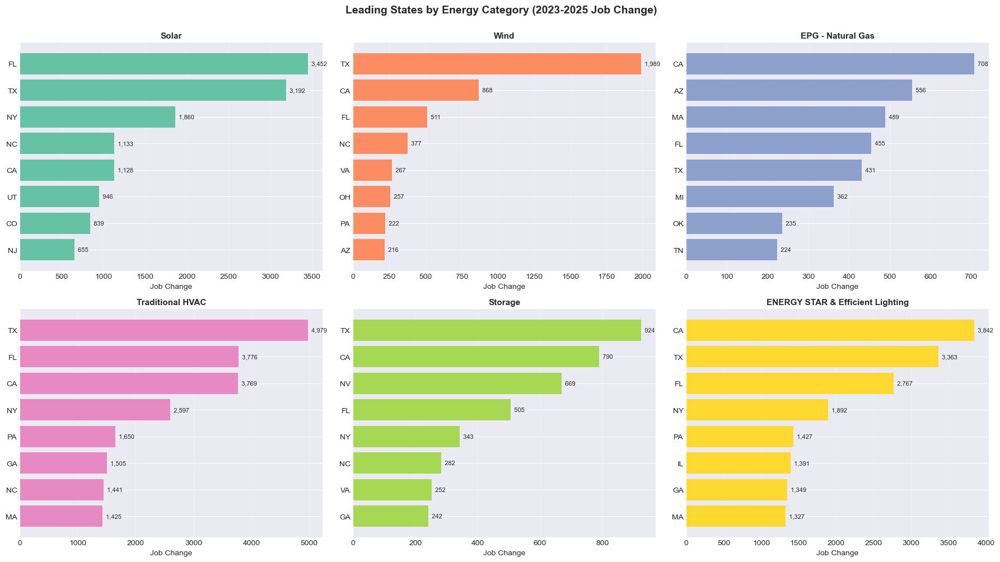

In [85]:
# Select 6 key categories to analyze
focus_categories = ['Solar', 'Wind', 'EPG - Natural Gas', 
                   'Traditional HVAC', 'Storage', 'ENERGY STAR & Efficient Lighting']

# Color-blind-safe palette (6 colors, one per category)
cb_palette = [
    "#66c2a5",  # teal
    "#fc8d62",  # orange
    "#8da0cb",  # blue
    "#e78ac3",  # pink
    "#a6d854",  # green
    "#ffd92f",  # yellow
]

# Create multi-panel visualization
final_image4, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, category in enumerate(focus_categories):
    if f'{category}_Change' in goal2_state_trends.columns:
        # Get top 8 states for this category
        top_states_cat = goal2_state_trends.nlargest(8, f'{category}_Change')[['State', f'{category}_Change']]

        # Assign one distinct color to this subplot
        bar_color = cb_palette[idx % len(cb_palette)]
        colors = [bar_color] * len(top_states_cat)
        
        # Create bar chart
        axes[idx].barh(
            range(len(top_states_cat)),
            top_states_cat[f'{category}_Change'],
            color=colors
        )
        
        axes[idx].barh(range(len(top_states_cat)), 
                      top_states_cat[f'{category}_Change'], 
                      color=colors)
        axes[idx].set_yticks(range(len(top_states_cat)))
        axes[idx].set_yticklabels(top_states_cat['State'])
        axes[idx].set_xlabel('Job Change', fontsize=10)
        axes[idx].set_title(category, fontsize=11, fontweight='bold')
        axes[idx].grid(True, alpha=0.3, axis='x')
        axes[idx].invert_yaxis()
        
        # Add value labels
        for i, (idx_row, row) in enumerate(top_states_cat.iterrows()):
            axes[idx].text(row[f'{category}_Change'], i, 
                          f"  {row[f'{category}_Change']:,.0f}", 
                          va='center', fontsize=8)

plt.suptitle('Leading States by Energy Category (2023-2025 Job Change)', 
             fontsize=14, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, 'Goal2_Category_Leaders.png'), dpi=300, bbox_inches='tight')
plt.show()

## Goal 2 Summary Statistics

## 9: Summary Statistics and Key Findings

In [36]:
print("GOAL 2: STATE-LEVEL ANALYSIS - SUMMARY")
print("="*80)

# National totals
goal2_total_2023 = goal2_state_trends['Total_Jobs_2023'].sum()
goal2_total_2024 = goal2_state_trends['Total_Jobs_2024'].sum()
goal2_total_2025 = goal2_state_trends['Total_Jobs_2025'].sum()
goal2_total_change = goal2_state_trends['Total_Change'].sum()
goal2_total_pct = (goal2_total_change / goal2_total_2023) * 100

print(f"\n1. NATIONAL TOTALS (PUBLIC DATA - STATE LEVEL):")
print(f"   2023: {goal2_total_2023:,.0f} jobs")
print(f"   2024: {goal2_total_2024:,.0f} jobs")
print(f"   2025: {goal2_total_2025:,.0f} jobs")
print(f"   Change: {goal2_total_change:+,.0f} ({goal2_total_pct:+.2f}%)")

# Renewable vs Fossil
goal2_renewable_change = goal2_state_trends['Renewable_Change'].sum()
goal2_fossil_change = goal2_state_trends['Fossil_Change'].sum()
print(f"\n2. RENEWABLE VS FOSSIL FUEL:")
print(f"   Renewable generation change: {goal2_renewable_change:+,.0f} jobs")
print(f"   Fossil fuel generation change: {goal2_fossil_change:+,.0f} jobs")

# State distribution
states_growing = (goal2_state_trends['Total_Change'] > 0).sum()
states_declining = (goal2_state_trends['Total_Change'] < 0).sum()
print(f"\n3. STATE DISTRIBUTION:")
print(f"   States with growth: {states_growing}")
print(f"   States with decline: {states_declining}")

# Top 5 states
print(f"\n4. TOP 5 STATES BY JOB CHANGE:")
for i, (idx, row) in enumerate(goal2_state_trends.nlargest(5, 'Total_Change').iterrows(), 1):
    print(f"   {i}. {row['State']}: {row['Total_Change']:+,.0f} ({row['Total_PctChange']:+.1f}%)")

# Category changes
print(f"\n5. TOP 5 CATEGORIES BY JOB CHANGE:")
goal2_category_totals = {}
for col in goal2_energy_columns:
    if f'{col}_Change' in goal2_state_trends.columns:
        goal2_category_totals[col] = goal2_state_trends[f'{col}_Change'].sum()

top_5_categories = sorted(goal2_category_totals.items(), key=lambda x: x[1], reverse=True)[:5]
for i, (cat, change) in enumerate(top_5_categories, 1):
    print(f"   {i}. {cat}: {change:+,.0f} jobs")

print("\n" + "="*80)
print("GOAL 2 visualizations saved to:", OUTPUT_DIR)
print("="*80)

GOAL 2: STATE-LEVEL ANALYSIS - SUMMARY

1. NATIONAL TOTALS (PUBLIC DATA - STATE LEVEL):
   2023: 5,504,078 jobs
   2024: 5,685,506 jobs
   2025: 5,833,571 jobs
   Change: +329,493 (+5.99%)

2. RENEWABLE VS FOSSIL FUEL:
   Renewable generation change: +35,745 jobs
   Fossil fuel generation change: +14,792 jobs

3. STATE DISTRIBUTION:
   States with growth: 50
   States with decline: 1

4. TOP 5 STATES BY JOB CHANGE:
   1. TX: +42,024 (+5.7%)
   2. CA: +29,286 (+4.3%)
   3. FL: +21,024 (+8.8%)
   4. NC: +18,567 (+14.1%)
   5. NY: +14,288 (+5.8%)

5. TOP 5 CATEGORIES BY JOB CHANGE:
   1. Traditional TDS: +79,070 jobs
   2. Traditional HVAC: +44,818 jobs
   3. High Efficiency HVAC & Renewable H&C: +41,688 jobs
   4. ENERGY STAR & Efficient Lighting: +36,581 jobs
   5. Petroleum: +27,421 jobs

GOAL 2 visualizations saved to: Visualization Outputs


## 10: Export Goal 2 Data

In [37]:
# Export state trends for further analysis
goal2_state_trends.to_csv('Goal2_State_Trends_2023_2025.csv', index=False)
print("\n[SUCCESS] Goal 2 data exported:")
print("  - Goal2_State_Trends_2023_2025.csv")


[SUCCESS] Goal 2 data exported:
  - Goal2_State_Trends_2023_2025.csv


## Goal 2 Complete!

**Key Findings:**
- State-level analysis confirms trends observed at county level
- Both renewable and fossil fuel sectors show growth
- Geographic patterns reveal state specializations
- Top states drive majority of national employment growth

**Files Generated:**
1. `Goal2_National_Trends.png` - Time series of major categories
2. `Goal2_Top_Bottom_States.png` - State rankings
3. `Goal2_Renewable_vs_Fossil.png` - Sector comparison scatter plot
4. `Goal2_Regional_Heatmap.png` - Geographic growth patterns
5. `Goal2_Category_Leaders.png` - Category-specific state leaders
6. `Goal2_State_Trends_2023_2025.csv` - Complete state trends data

**Ready for Goal 3:** Correlation analysis with SEDS energy consumption data

GOAL 3: JOBS-CONSUMPTION CORRELATION ANALYSIS (2023)
=====================================================
Correlate energy sector employment with energy consumption to test hypothesis:
"The growth rate of renewable energy consumption within a state is positively 
correlated with the creation of jobs in the energy sector."

SCOPE: State-level analysis using 2023 data only (SEDS limitation)
DATA SOURCES: 
- Goal 2 state employment data (2023-2025)
- SEDS energy consumption data (2021-2023)
- Matching year: 2023

ANALYSIS APPROACH:
1. Calculate employment growth rates (2023-2024, 2023-2025)
2. Calculate consumption growth rates (2021-2023)
3. Correlate employment vs consumption by category
4. Test renewable vs fossil fuel patterns
5. Generate comprehensive visualizations

VARIABLE NAMING CONVENTION:
- corr_* for intermediate data (corr_merged_2023, corr_jobs_growth)
- goal3_* for final results (goal3_correlation_matrix, goal3_regression_results)

In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr
import warnings
warnings.filterwarnings('ignore')

## SECTION 1: DATA PREPARATION

In [39]:
print("GOAL 3: JOBS-CONSUMPTION CORRELATION ANALYSIS")
print("="*80)
print("\nSection 1: Loading and preparing data for correlation analysis...")

# Load Goal 2 state trends (wide format with columns like Solar_2023, Solar_2024, etc.)
try:
    goal2_state_trends = pd.read_csv('Goal2_State_Trends_2023_2025.csv')
    print(f"Loaded Goal 2 state trends: {goal2_state_trends.shape}")
    print(f"  Format: Wide (one row per state, columns include State, Category_Year)")
        
except FileNotFoundError:
    print("ERROR: Goal2_State_Trends_2023_2025.csv not found!")
    print("Please ensure Goal 2 has been completed first.")
    exit(1)

# Load SEDS wide format data
try:
    seds_wide = pd.read_csv('SEDS_Energy_2021_2023_Wide_Format.csv')
    print(f"Loaded SEDS data: {seds_wide.shape}")
except FileNotFoundError:
    print("ERROR: SEDS_Energy_2021_2023_Wide_Format.csv not found!")
    print("Please ensure SEDS data collection has been completed.")
    exit(1)

# Define energy categories (matching both datasets)
ENERGY_CATEGORIES = [
    'Solar', 'Wind', 'Hydroelectric', 
    'EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF',
    'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas', 
    'Woody Biomass', 'Corn Ethanol'
]

# Define renewable vs fossil categories
RENEWABLE_CATEGORIES = ['Solar', 'Wind', 'Hydroelectric', 'Woody Biomass', 'Corn Ethanol']
FOSSIL_CATEGORIES = ['EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 
                     'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas']

print(f"\nAnalyzing {len(ENERGY_CATEGORIES)} energy categories:")
print(f"  Renewable: {len(RENEWABLE_CATEGORIES)}")
print(f"  Fossil: {len(FOSSIL_CATEGORIES)}")

GOAL 3: JOBS-CONSUMPTION CORRELATION ANALYSIS

Section 1: Loading and preparing data for correlation analysis...
Loaded Goal 2 state trends: (51, 112)
  Format: Wide (one row per state, columns include State, Category_Year)
Loaded SEDS data: (153, 13)

Analyzing 11 energy categories:
  Renewable: 5
  Fossil: 6


## SECTION 2: CALCULATE EMPLOYMENT GROWTH RATES

In [40]:
print("Section 2: Preparing employment data for correlation analysis...")
print("="*80)

# Helper to build per-year employment DataFrames from wide Goal 2 data
def build_year_df(base_df, year, categories):
    """
    From the wide Goal 2 state trends, build a DataFrame for a single year with:
      - 'State'
      - one column per energy category, named exactly as in ENERGY_CATEGORIES
    """
    cols = ['State']
    missing = []

    for cat in categories:
        col_name = f"{cat}_{year}"
        if col_name in base_df.columns:
            cols.append(col_name)
        else:
            missing.append(col_name)

    if missing:
        print(f"WARNING: Missing columns for {year}: {missing}")

    df_year = base_df[cols].copy()

    # Rename '<Category>_<year>' -> '<Category>'
    rename_map = {
        f"{cat}_{year}": cat
        for cat in categories
        if f"{cat}_{year}" in base_df.columns
    }
    df_year.rename(columns=rename_map, inplace=True)

    return df_year

# Build absolute employment tables for each year
corr_jobs_2023 = build_year_df(goal2_state_trends, 2023, ENERGY_CATEGORIES)
corr_jobs_2024 = build_year_df(goal2_state_trends, 2024, ENERGY_CATEGORIES)
corr_jobs_2025 = build_year_df(goal2_state_trends, 2025, ENERGY_CATEGORIES)

print("\nEmployment data extracted (absolute job counts):")
print(f"  2023: {corr_jobs_2023.shape}")
print(f"  2024: {corr_jobs_2024.shape}")
print(f"  2025: {corr_jobs_2025.shape}")

# Ensure consistent ordering by state (defensive, in case anything shifted)
corr_jobs_2023 = corr_jobs_2023.sort_values('State').reset_index(drop=True)
corr_jobs_2024 = corr_jobs_2024.sort_values('State').reset_index(drop=True)
corr_jobs_2025 = corr_jobs_2025.sort_values('State').reset_index(drop=True)

# Initialize growth-rate DataFrame with state list
corr_jobs_growth = corr_jobs_2023[['State']].copy()

# Compute percent changes:
#   - 2023 -> 2024
#   - 2024 -> 2025
#   - 2023 -> 2025
for cat in ENERGY_CATEGORIES:
    if (
        cat in corr_jobs_2023.columns and
        cat in corr_jobs_2024.columns and
        cat in corr_jobs_2025.columns
    ):
        # Use State as index for safe alignment
        j23 = corr_jobs_2023.set_index('State')[cat]
        j24 = corr_jobs_2024.set_index('State')[cat]
        j25 = corr_jobs_2025.set_index('State')[cat]

        with np.errstate(divide='ignore', invalid='ignore'):
            pct_23_24 = ((j24 - j23) / j23.replace(0, np.nan) * 100)
            pct_24_25 = ((j25 - j24) / j24.replace(0, np.nan) * 100)
            pct_23_25 = ((j25 - j23) / j23.replace(0, np.nan) * 100)

        # Map back to corr_jobs_growth using State
        corr_jobs_growth[f'{cat}_Pct_23_24'] = corr_jobs_growth['State'].map(pct_23_24)
        corr_jobs_growth[f'{cat}_Pct_24_25'] = corr_jobs_growth['State'].map(pct_24_25)
        corr_jobs_growth[f'{cat}_Pct_23_25'] = corr_jobs_growth['State'].map(pct_23_25)
    else:
        print(f"WARNING: {cat} missing in one of the year tables; "
              f"skipping growth calculations for this category.")

print("\nCalculated employment growth rates (% change):")
print(f"  Shape: {corr_jobs_growth.shape}")
print(f"  Columns (first few): {list(corr_jobs_growth.columns)[:8]} ...")

Section 2: Preparing employment data for correlation analysis...

Employment data extracted (absolute job counts):
  2023: (51, 12)
  2024: (51, 12)
  2025: (51, 12)

Calculated employment growth rates (% change):
  Shape: (51, 34)
  Columns (first few): ['State', 'Solar_Pct_23_24', 'Solar_Pct_24_25', 'Solar_Pct_23_25', 'Wind_Pct_23_24', 'Wind_Pct_24_25', 'Wind_Pct_23_25', 'Hydroelectric_Pct_23_24'] ...


## SECTION 3: CALCULATE CONSUMPTION GROWTH RATES

In [41]:
print("Section 3: Calculating energy consumption growth rates...")
print("="*80)

# Extract SEDS data by year (SEDS is in LONG format - filter by Year column)
corr_consumption_2021 = seds_wide[seds_wide['Year'] == 2021].copy()
corr_consumption_2022 = seds_wide[seds_wide['Year'] == 2022].copy()
corr_consumption_2023 = seds_wide[seds_wide['Year'] == 2023].copy()

print("\nConsumption data extracted:")
print(f"  2021: {len(corr_consumption_2021)} states")
print(f"  2022: {len(corr_consumption_2022)} states")
print(f"  2023: {len(corr_consumption_2023)} states")

# Verify we have data
if len(corr_consumption_2021) == 0 or len(corr_consumption_2022) == 0 or len(corr_consumption_2023) == 0:
    print("\nERROR: No consumption data extracted! Check SEDS file structure.")
    print("Available SEDS columns:", list(seds_wide.columns))

# Ensure consistent ordering by state
corr_consumption_2021 = corr_consumption_2021.sort_values('State').reset_index(drop=True)
corr_consumption_2022 = corr_consumption_2022.sort_values('State').reset_index(drop=True)
corr_consumption_2023 = corr_consumption_2023.sort_values('State').reset_index(drop=True)

# Initialize growth-rate DataFrame with state list
corr_consumption_growth = corr_consumption_2021[['State']].copy()

# Calculate consumption growth rates
for category in ENERGY_CATEGORIES:
    if (
        category in corr_consumption_2021.columns and
        category in corr_consumption_2022.columns and
        category in corr_consumption_2023.columns
    ):
        # Use State as index for safe alignment
        cons_2021 = corr_consumption_2021.set_index('State')[category]
        cons_2022 = corr_consumption_2022.set_index('State')[category]
        cons_2023 = corr_consumption_2023.set_index('State')[category]
        
        # 1-year growth rate (2022 to 2023)
        with np.errstate(divide='ignore', invalid='ignore'):
            growth_1yr = ((cons_2023 - cons_2022) / cons_2022.replace(0, np.nan) * 100)
        
        # 2-year growth rate (2021 to 2023)
        with np.errstate(divide='ignore', invalid='ignore'):
            growth_2yr = ((cons_2023 - cons_2021) / cons_2021.replace(0, np.nan) * 100)
        
        # Map back to corr_consumption_growth using State
        corr_consumption_growth[f'{category}_Pct_22_23'] = corr_consumption_growth['State'].map(growth_1yr)
        corr_consumption_growth[f'{category}_Pct_21_23'] = corr_consumption_growth['State'].map(growth_2yr)
    else:
        print(f"WARNING: {category} missing in SEDS data; skipping growth calculations.")

print(f"\nCalculated consumption growth rates: {corr_consumption_growth.shape}")
print(f"  Includes: 1yr (22-23), 2yr (21-23) for each category")

# Verify categories found
categories_found = [cat for cat in ENERGY_CATEGORIES if f'{cat}_Pct_22_23' in corr_consumption_growth.columns]
print(f"  Successfully calculated for {len(categories_found)}/{len(ENERGY_CATEGORIES)} categories")
if len(categories_found) < len(ENERGY_CATEGORIES):
    missing = [cat for cat in ENERGY_CATEGORIES if f'{cat}_Pct_22_23' not in corr_consumption_growth.columns]
    print(f"  Missing categories: {missing}")

Section 3: Calculating energy consumption growth rates...

Consumption data extracted:
  2021: 51 states
  2022: 51 states
  2023: 51 states

Calculated consumption growth rates: (51, 23)
  Includes: 1yr (22-23), 2yr (21-23) for each category
  Successfully calculated for 11/11 categories


## SECTION 4: MERGE DATA FOR CORRELATION ANALYSIS

In [42]:
print("Section 4: Merging employment and consumption data...")
print("="*80)

# Merge 2023 absolute values
corr_merged_2023 = corr_jobs_2023[['State'] + ENERGY_CATEGORIES].copy()
corr_merged_2023.columns = ['State'] + [f'{cat}_Jobs' for cat in ENERGY_CATEGORIES]

# Add consumption data
consumption_2023_subset = corr_consumption_2023[['State'] + ENERGY_CATEGORIES].copy()
consumption_2023_subset.columns = ['State'] + [f'{cat}_Consumption' for cat in ENERGY_CATEGORIES]

corr_merged_2023 = corr_merged_2023.merge(consumption_2023_subset, on='State', how='inner')

print(f"\nMerged 2023 data: {corr_merged_2023.shape}")
print(f"  States: {len(corr_merged_2023)}")
print(f"  Variables: Jobs + Consumption for {len(ENERGY_CATEGORIES)} categories")

# Merge growth rates
corr_merged_growth = corr_jobs_growth.merge(corr_consumption_growth, on='State', how='inner')

print(f"Merged growth rate data: {corr_merged_growth.shape}")

Section 4: Merging employment and consumption data...

Merged 2023 data: (51, 23)
  States: 51
  Variables: Jobs + Consumption for 11 categories
Merged growth rate data: (51, 56)


In [43]:
print("Diagnostic: Column names in corr_merged_growth")
print("="*60)
print(f"Total columns: {len(corr_merged_growth.columns)}")
print("\nJob growth columns:")
job_cols = [col for col in corr_merged_growth.columns if 'Pct_23' in col or 'Pct_24' in col or 'Pct_25' in col]
for col in sorted(job_cols):
    print(f"  - {col}")

print("\nConsumption growth columns:")
cons_cols = [col for col in corr_merged_growth.columns if 'Pct_21' in col or 'Pct_22' in col]
for col in sorted(cons_cols):
    print(f"  - {col}")

Diagnostic: Column names in corr_merged_growth
Total columns: 56

Job growth columns:
  - Corn Ethanol_Pct_23_24
  - Corn Ethanol_Pct_23_25
  - Corn Ethanol_Pct_24_25
  - EPG - Coal_Pct_23_24
  - EPG - Coal_Pct_23_25
  - EPG - Coal_Pct_24_25
  - EPG - Natural Gas_Pct_23_24
  - EPG - Natural Gas_Pct_23_25
  - EPG - Natural Gas_Pct_24_25
  - Fuels - Coal_Pct_23_24
  - Fuels - Coal_Pct_23_25
  - Fuels - Coal_Pct_24_25
  - Fuels - Natural Gas_Pct_23_24
  - Fuels - Natural Gas_Pct_23_25
  - Fuels - Natural Gas_Pct_24_25
  - Hydroelectric_Pct_23_24
  - Hydroelectric_Pct_23_25
  - Hydroelectric_Pct_24_25
  - Oil & Other FF_Pct_23_24
  - Oil & Other FF_Pct_23_25
  - Oil & Other FF_Pct_24_25
  - Petroleum_Pct_23_24
  - Petroleum_Pct_23_25
  - Petroleum_Pct_24_25
  - Solar_Pct_23_24
  - Solar_Pct_23_25
  - Solar_Pct_24_25
  - Wind_Pct_23_24
  - Wind_Pct_23_25
  - Wind_Pct_24_25
  - Woody Biomass_Pct_23_24
  - Woody Biomass_Pct_23_25
  - Woody Biomass_Pct_24_25

Consumption growth columns:
  - Co

## SECTION 5: CALCULATE CORRELATION COEFFICIENTS

In [44]:
print("Section 5: Calculating correlation coefficients...")
print("="*80)

# Initialize results storage
goal3_correlation_results = []

# Calculate correlations for each category
for category in ENERGY_CATEGORIES:
    jobs_col = f'{category}_Jobs'
    cons_col = f'{category}_Consumption'
    
    if jobs_col in corr_merged_2023.columns and cons_col in corr_merged_2023.columns:
        # Remove any infinite or NaN values
        valid_data = corr_merged_2023[[jobs_col, cons_col]].replace([np.inf, -np.inf], np.nan).dropna()
        
        if len(valid_data) > 2:  # Need at least 3 points for correlation
            r, p_value = pearsonr(valid_data[jobs_col], valid_data[cons_col])
            
            # Calculate correlation for growth rates (using 23-24 jobs vs 22-23 consumption)
            jobs_growth_col = f'{category}_Pct_23_24'
            cons_growth_col = f'{category}_Pct_22_23'
            
            if jobs_growth_col in corr_merged_growth.columns and cons_growth_col in corr_merged_growth.columns:
                valid_growth = corr_merged_growth[[jobs_growth_col, cons_growth_col]].replace([np.inf, -np.inf], np.nan).dropna()
                
                if len(valid_growth) > 2:
                    r_growth, p_growth = pearsonr(valid_growth[jobs_growth_col], valid_growth[cons_growth_col])
                else:
                    r_growth, p_growth = np.nan, np.nan
            else:
                r_growth, p_growth = np.nan, np.nan
            
            goal3_correlation_results.append({
                'Category': category,
                'Type': 'Renewable' if category in RENEWABLE_CATEGORIES else 'Fossil',
                'Correlation_Absolute': r,
                'PValue_Absolute': p_value,
                'Significant_Absolute': 'Yes' if p_value < 0.05 else 'No',
                'Correlation_Growth': r_growth,
                'PValue_Growth': p_growth,
                'Significant_Growth': 'Yes' if p_growth < 0.05 else 'No',
                'N_States': len(valid_data)
            })

# Convert to DataFrame
goal3_correlation_table = pd.DataFrame(goal3_correlation_results)

print(f"\nCalculated correlations for {len(goal3_correlation_table)} categories")
print("\nCorrelation Summary:")
print(goal3_correlation_table.to_string(index=False))

# Save correlation table
goal3_correlation_table.to_csv('Goal3_Correlation_Table.csv', index=False)
print("\nSaved: Goal3_Correlation_Table.csv")

Section 5: Calculating correlation coefficients...

Calculated correlations for 11 categories

Correlation Summary:
           Category      Type  Correlation_Absolute  PValue_Absolute Significant_Absolute  Correlation_Growth  PValue_Growth Significant_Growth  N_States
              Solar Renewable              0.832736     3.545904e-14                  Yes            0.093973       0.525225                 No        51
               Wind Renewable              0.846072     5.448811e-15                  Yes            0.160032       0.317563                 No        51
      Hydroelectric Renewable              0.473305     4.519526e-04                  Yes           -0.125638       0.394835                 No        51
  EPG - Natural Gas    Fossil              0.671337     6.971326e-08                  Yes           -0.024721       0.866105                 No        51
         EPG - Coal    Fossil              0.537342     4.788090e-05                  Yes            0.019359     

## SECTION 6: CORRELATION MATRIX HEATMAP

Section 6: Creating correlation matrix visualization...


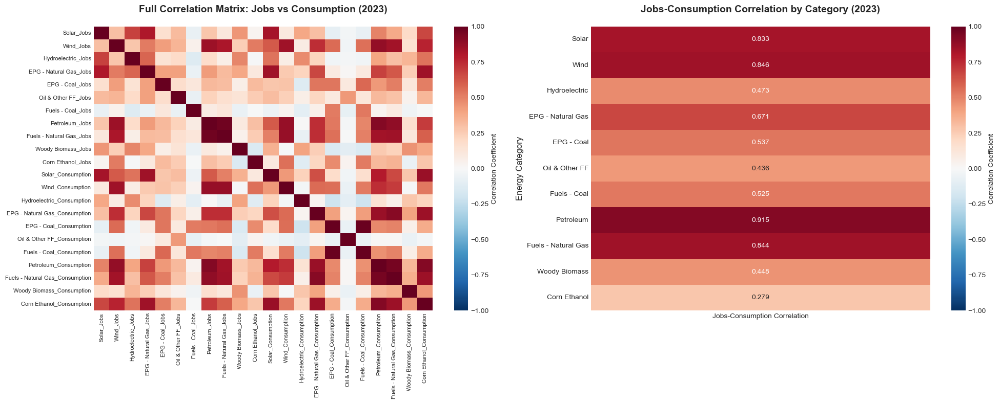

Saved: Goal3_Correlation_Heatmap.png


In [87]:
print("Section 6: Creating correlation matrix visualization...")
print("="*80)

# Create correlation matrix for absolute values
corr_matrix_data = corr_merged_2023[[f'{cat}_Jobs' for cat in ENERGY_CATEGORIES] + 
                                    [f'{cat}_Consumption' for cat in ENERGY_CATEGORIES]].corr()

# Create figure
final_image5, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# --- Plot 1: Full correlation matrix ---
sns.heatmap(
    corr_matrix_data,
    annot=False,
    cmap='RdBu_r',
    center=0,
    vmin=-1, vmax=1,
    ax=ax1,
    cbar_kws={'label': 'Correlation Coefficient'}
)
ax1.set_title(
    'Full Correlation Matrix: Jobs vs Consumption (2023)',
    fontsize=14,
    fontweight='bold',
    pad=20
)
ax1.tick_params(axis='both', labelsize=8)

# --- Plot 2: Jobs-Consumption correlation by category ---

jobs_cols = [f'{cat}_Jobs' for cat in ENERGY_CATEGORIES]
cons_cols = [f'{cat}_Consumption' for cat in ENERGY_CATEGORIES]

jobs_df = corr_merged_2023[jobs_cols]
cons_df = corr_merged_2023[cons_cols].copy()

# Rename consumption columns to match jobs columns so corrwith pairs them correctly
cons_df.columns = jobs_df.columns

# Now we get one correlation per category
cross_corr = jobs_df.corrwith(cons_df)

# Turn into 11×1 DataFrame for heatmap
cross_corr_matrix = cross_corr.to_frame('Jobs-Consumption Correlation')
cross_corr_matrix.index = [col.replace('_Jobs', '') for col in cross_corr_matrix.index]

sns.heatmap(
    cross_corr_matrix,
    annot=True,
    fmt='.3f',
    cmap='RdBu_r',
    center=0,
    vmin=-1, vmax=1,
    ax=ax2,
    cbar_kws={'label': 'Correlation Coefficient'}
)
ax2.set_title(
    'Jobs-Consumption Correlation by Category (2023)',
    fontsize=14,
    fontweight='bold',
    pad=20
)
ax2.set_xlabel('')
ax2.set_ylabel('Energy Category', fontsize=12)

plt.tight_layout()

plt.savefig(os.path.join('Goal3_Correlation_Heatmap.png'), dpi=300, bbox_inches='tight')
plt.show()

print("Saved: Goal3_Correlation_Heatmap.png")

## SECTION 7: SCATTER PLOTS WITH REGRESSION LINES

Section 7: Creating scatter plots with regression lines...


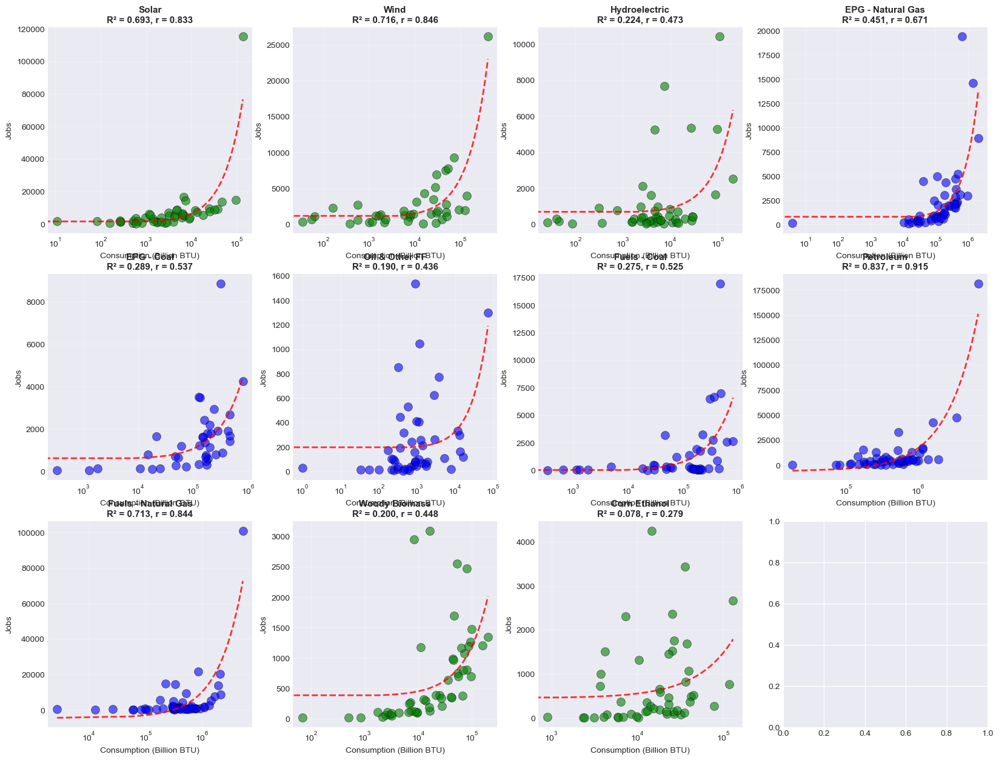

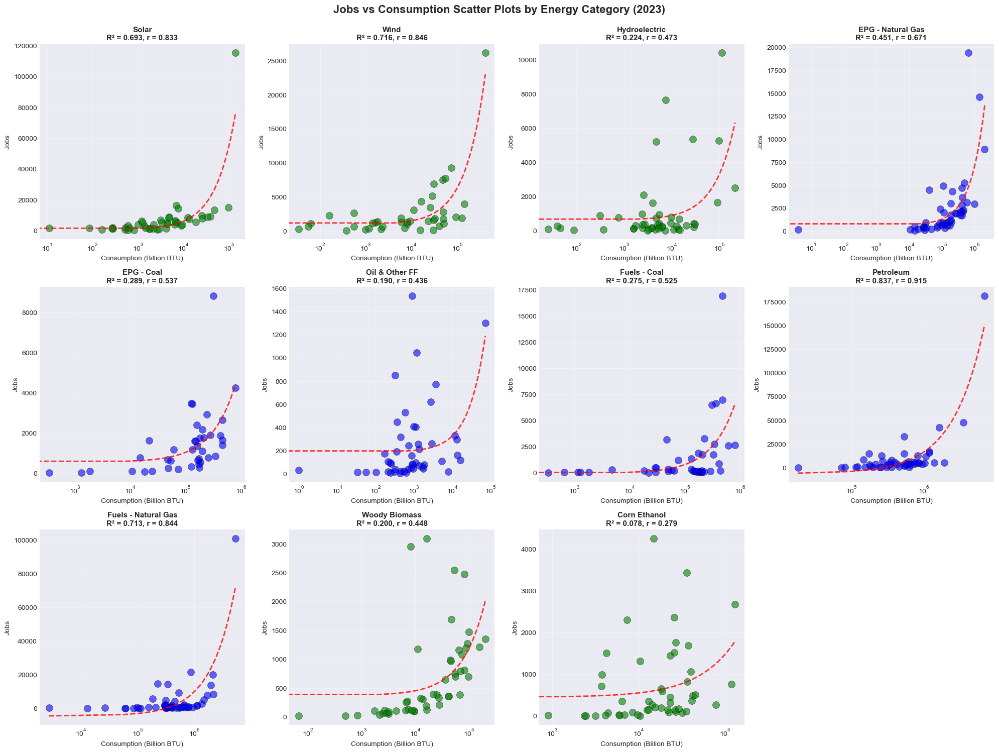

Saved: Goal3_Scatter_Plots_All_Categories.png


In [91]:
print("Section 7: Creating scatter plots with regression lines...")
print("="*80)

# Create scatter plots for top categories
final_image6, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.flatten()

for idx, category in enumerate(ENERGY_CATEGORIES):
    jobs_col = f'{category}_Jobs'
    cons_col = f'{category}_Consumption'
    
    if jobs_col in corr_merged_2023.columns and cons_col in corr_merged_2023.columns:
        ax = axes[idx]
        
        # Get valid data
        valid_data = corr_merged_2023[[jobs_col, cons_col, 'State']].replace([np.inf, -np.inf], np.nan).dropna()
        
        if len(valid_data) > 2:
            x = valid_data[cons_col]
            y = valid_data[jobs_col]
            
            # Scatter plot
            color = 'green' if category in RENEWABLE_CATEGORIES else 'blue'
            ax.scatter(x, y, alpha=0.6, s=100, c=color, edgecolors='black', linewidth=0.5)

            # LOG SCALE for consumption (fixes cluttered x-axis)
            ax.set_xscale("log")
            
            # Regression line
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            x_line = np.linspace(x.min(), x.max(), 100)
            ax.plot(x_line, p(x_line), "r--", linewidth=2, alpha=0.8)
            
            # Calculate R^2
            r, _ = pearsonr(x, y)
            r_squared = r**2
            
            # Labels
            ax.set_xlabel('Consumption (Billion BTU)', fontsize=10)
            ax.set_ylabel('Jobs', fontsize=10)
            ax.set_title(f'{category}\nR² = {r_squared:.3f}, r = {r:.3f}', 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3)

# Remove extra subplot
if len(ENERGY_CATEGORIES) < len(axes):
    final_image6.delaxes(axes[-1])

plt.suptitle('Jobs vs Consumption Scatter Plots by Energy Category (2023)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join('Goal3_Scatter_Plots_All_Categories.png'), dpi=300, bbox_inches='tight')
plt.show()

print("Saved: Goal3_Scatter_Plots_All_Categories.png")

## SECTION 8: RENEWABLE VS FOSSIL COMPARISON

Section 8: Comparing renewable vs fossil fuel patterns...


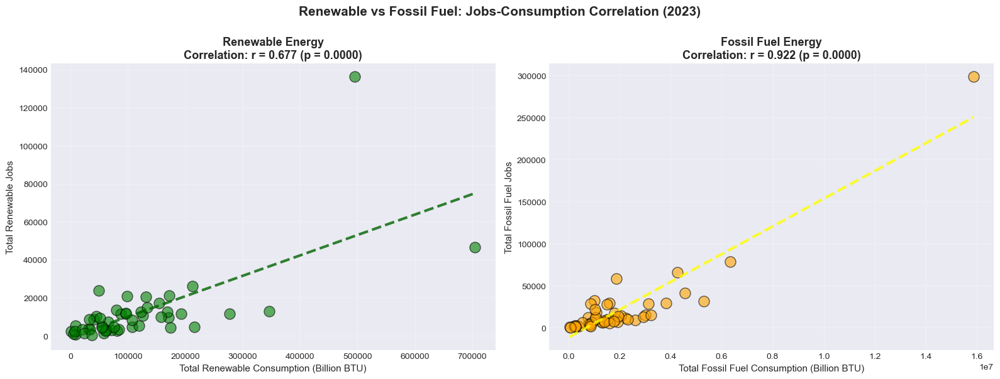

Saved: Goal3_Renewable_vs_Fossil_Comparison.png

RENEWABLE VS FOSSIL COMPARISON SUMMARY

Renewable Energy:
  Correlation coefficient: 0.677
  P-value: 0.0000
  Significant: Yes

Fossil Fuel Energy:
  Correlation coefficient: 0.922
  P-value: 0.0000
  Significant: Yes


In [47]:
print("Section 8: Comparing renewable vs fossil fuel patterns...")
print("="*80)

# Calculate aggregate renewable and fossil metrics
corr_merged_2023['Renewable_Jobs_Total'] = corr_merged_2023[[f'{cat}_Jobs' for cat in RENEWABLE_CATEGORIES]].sum(axis=1)
corr_merged_2023['Fossil_Jobs_Total'] = corr_merged_2023[[f'{cat}_Jobs' for cat in FOSSIL_CATEGORIES]].sum(axis=1)
corr_merged_2023['Renewable_Consumption_Total'] = corr_merged_2023[[f'{cat}_Consumption' for cat in RENEWABLE_CATEGORIES]].sum(axis=1)
corr_merged_2023['Fossil_Consumption_Total'] = corr_merged_2023[[f'{cat}_Consumption' for cat in FOSSIL_CATEGORIES]].sum(axis=1)

# Create comparison plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Renewable
ax1 = axes[0]
x_ren = corr_merged_2023['Renewable_Consumption_Total']
y_ren = corr_merged_2023['Renewable_Jobs_Total']
ax1.scatter(x_ren, y_ren, alpha=0.6, s=150, c='green', edgecolors='black', linewidth=1)

# Regression line
z_ren = np.polyfit(x_ren, y_ren, 1)
p_ren = np.poly1d(z_ren)
x_line_ren = np.linspace(x_ren.min(), x_ren.max(), 100)
ax1.plot(x_line_ren, p_ren(x_line_ren), "darkgreen", linewidth=3, alpha=0.8, linestyle='--')

r_ren, p_ren_val = pearsonr(x_ren, y_ren)
ax1.set_title(f'Renewable Energy\nCorrelation: r = {r_ren:.3f} (p = {p_ren_val:.4f})', 
              fontsize=13, fontweight='bold')
ax1.set_xlabel('Total Renewable Consumption (Billion BTU)', fontsize=11)
ax1.set_ylabel('Total Renewable Jobs', fontsize=11)
ax1.grid(True, alpha=0.3)

# Fossil
ax2 = axes[1]
x_fos = corr_merged_2023['Fossil_Consumption_Total']
y_fos = corr_merged_2023['Fossil_Jobs_Total']
ax2.scatter(x_fos, y_fos, alpha=0.6, s=150, c='orange', edgecolors='black', linewidth=1)

# Regression line
z_fos = np.polyfit(x_fos, y_fos, 1)
p_fos = np.poly1d(z_fos)
x_line_fos = np.linspace(x_fos.min(), x_fos.max(), 100)
ax2.plot(x_line_fos, p_fos(x_line_fos), "yellow", linewidth=3, alpha=0.8, linestyle='--')

r_fos, p_fos_val = pearsonr(x_fos, y_fos)
ax2.set_title(f'Fossil Fuel Energy\nCorrelation: r = {r_fos:.3f} (p = {p_fos_val:.4f})', 
              fontsize=13, fontweight='bold')
ax2.set_xlabel('Total Fossil Fuel Consumption (Billion BTU)', fontsize=11)
ax2.set_ylabel('Total Fossil Fuel Jobs', fontsize=11)
ax2.grid(True, alpha=0.3)

plt.suptitle('Renewable vs Fossil Fuel: Jobs-Consumption Correlation (2023)', 
             fontsize=15, fontweight='bold', y=1.00)
plt.tight_layout()
plt.savefig(os.path.join('Goal3_Renewable_vs_Fossil_Comparison.png'), dpi=300, bbox_inches='tight')
plt.show()

print("Saved: Goal3_Renewable_vs_Fossil_Comparison.png")

# Print comparison summary
print("\n" + "="*80)
print("RENEWABLE VS FOSSIL COMPARISON SUMMARY")
print("="*80)
print(f"\nRenewable Energy:")
print(f"  Correlation coefficient: {r_ren:.3f}")
print(f"  P-value: {p_ren_val:.4f}")
print(f"  Significant: {'Yes' if p_ren_val < 0.05 else 'No'}")

print(f"\nFossil Fuel Energy:")
print(f"  Correlation coefficient: {r_fos:.3f}")
print(f"  P-value: {p_fos_val:.4f}")
print(f"  Significant: {'Yes' if p_fos_val < 0.05 else 'No'}")

## SECTION 9: GROWTH RATE CORRELATION ANALYSIS

### Time Period Alignment for Growth Correlations

**Important Note on Data Limitations:**
- **Consumption data:** Available 2021-2023 only (SEDS limitation)
- **Jobs data:** Available 2023-2025 (USEER data)

**Analysis Strategy:**
We correlate:
- **Consumption growth (2022→2023)** with **Jobs growth (2023→2024)**

This tests whether consumption growth in year T leads to job creation in year T+1,
which makes theoretical sense as:
1. Energy consumption increases first
2. Companies respond by hiring workers
3. Time lag reflects market response time

Section 9: Analyzing growth rate correlations...


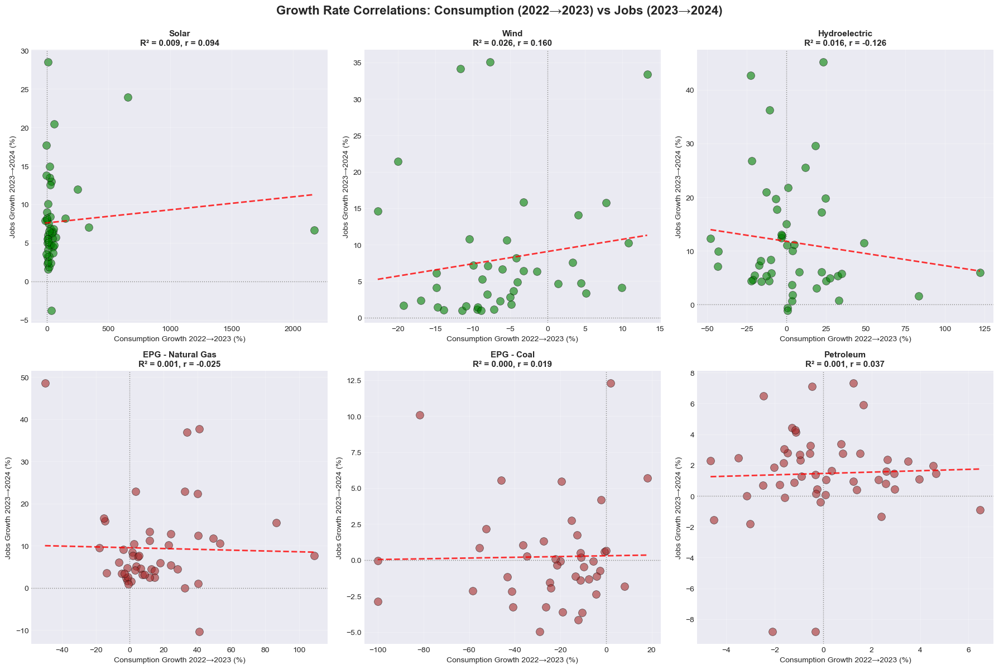

Saved: Goal3_Growth_Rate_Correlations.png

Growth Rate Analysis Summary:
------------------------------------------------------------
Solar                | Both: Y | Jobs: Y | Cons: Y
Wind                 | Both: Y | Jobs: Y | Cons: Y
Hydroelectric        | Both: Y | Jobs: Y | Cons: Y
EPG - Natural Gas    | Both: Y | Jobs: Y | Cons: Y
EPG - Coal           | Both: Y | Jobs: Y | Cons: Y
Petroleum            | Both: Y | Jobs: Y | Cons: Y


In [93]:
print("Section 9: Analyzing growth rate correlations...")
print("="*80)

# Create growth rate comparison plots
final_image7, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

growth_categories = ['Solar', 'Wind', 'Hydroelectric', 'EPG - Natural Gas', 'EPG - Coal', 'Petroleum']

# FIXED: Use actual column names from Sections 2 and 3
# Consumption: 2022→2023 (1-year growth)
# Jobs: 2023→2024 (1-year growth)
# This tests if consumption growth leads to job growth

for idx, category in enumerate(growth_categories):
    # FIXED column names:
    jobs_growth_col = f'{category}_Pct_23_24'      # Jobs: 2023→2024
    cons_growth_col = f'{category}_Pct_22_23'      # Consumption: 2022→2023
    
    if jobs_growth_col in corr_merged_growth.columns and cons_growth_col in corr_merged_growth.columns:
        ax = axes[idx]
        
        # Get valid data
        valid_data = corr_merged_growth[[jobs_growth_col, cons_growth_col]].replace([np.inf, -np.inf], np.nan).dropna()
        
        if len(valid_data) > 2:
            x = valid_data[cons_growth_col]
            y = valid_data[jobs_growth_col]
            
            # Scatter plot
            color = 'green' if category in RENEWABLE_CATEGORIES else 'brown'
            ax.scatter(x, y, alpha=0.6, s=100, c=color, edgecolors='black', linewidth=0.5)
            
            # Regression line
            z = np.polyfit(x, y, 1)
            p = np.poly1d(z)
            x_line = np.linspace(x.min(), x.max(), 100)
            ax.plot(x_line, p(x_line), "r--", linewidth=2, alpha=0.8)
            
            # Calculate R²
            r, p_val = pearsonr(x, y)
            r_squared = r**2
            
            # Labels
            ax.set_xlabel('Consumption Growth 2022→2023 (%)', fontsize=10)
            ax.set_ylabel('Jobs Growth 2023→2024 (%)', fontsize=10)
            ax.set_title(f'{category}\nR² = {r_squared:.3f}, r = {r:.3f}' + 
                        (f', p = {p_val:.3f}' if p_val < 0.05 else ''), 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3)
            ax.axhline(y=0, color='gray', linestyle=':', linewidth=1)
            ax.axvline(x=0, color='gray', linestyle=':', linewidth=1)
        else:
            # Not enough data points
            ax.text(0.5, 0.5, f'{category}\nInsufficient data', 
                   ha='center', va='center', fontsize=12, transform=ax.transAxes)
            ax.set_xticks([])
            ax.set_yticks([])
    else:
        # Column not found
        ax = axes[idx]
        missing_cols = []
        if jobs_growth_col not in corr_merged_growth.columns:
            missing_cols.append(f'Jobs: {jobs_growth_col}')
        if cons_growth_col not in corr_merged_growth.columns:
            missing_cols.append(f'Cons: {cons_growth_col}')
        ax.text(0.5, 0.5, f'{category}\nMissing:\n' + '\n'.join(missing_cols), 
               ha='center', va='center', fontsize=10, transform=ax.transAxes)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle('Growth Rate Correlations: Consumption (2022→2023) vs Jobs (2023→2024)', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join('Goal3_Growth_Rate_Correlations.png'), dpi=300, bbox_inches='tight')
plt.show()

print("Saved: Goal3_Growth_Rate_Correlations.png")

# Print summary of what was found
print("\nGrowth Rate Analysis Summary:")
print("-" * 60)
for category in growth_categories:
    jobs_col = f'{category}_Pct_23_24'
    cons_col = f'{category}_Pct_22_23'
    
    jobs_exists = jobs_col in corr_merged_growth.columns
    cons_exists = cons_col in corr_merged_growth.columns

    # Define status inside this loop
    status = "Y" if (jobs_exists and cons_exists) else "N"

    jobs_flag = "Y" if jobs_exists else "N"
    cons_flag = "Y" if cons_exists else "N"

    print(f"{category:20s} | Both: {status} | Jobs: {jobs_flag} | Cons: {cons_flag}")

## SECTION 10: STATE-LEVEL PATTERNS

In [49]:
print("Section 10: Analyzing state-level patterns...")
print("="*80)

# Calculate total employment and consumption by state
state_patterns = corr_merged_2023[['State']].copy()
state_patterns['Total_Jobs'] = corr_merged_2023[[f'{cat}_Jobs' for cat in ENERGY_CATEGORIES]].sum(axis=1)
state_patterns['Total_Consumption'] = corr_merged_2023[[f'{cat}_Consumption' for cat in ENERGY_CATEGORIES]].sum(axis=1)
state_patterns['Renewable_Jobs_Pct'] = (corr_merged_2023['Renewable_Jobs_Total'] / state_patterns['Total_Jobs'] * 100)
state_patterns['Renewable_Consumption_Pct'] = (corr_merged_2023['Renewable_Consumption_Total'] / state_patterns['Total_Consumption'] * 100)

# Top 10 states by renewable jobs percentage
top_renewable_states = state_patterns.nlargest(10, 'Renewable_Jobs_Pct')

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Top renewable job states - bar chart
ax1 = axes[0, 0]
ax1.barh(top_renewable_states['State'], top_renewable_states['Renewable_Jobs_Pct'], color='green', alpha=0.7)
ax1.set_xlabel('Renewable Jobs (%)', fontsize=11)
ax1.set_title('Top 10 States by Renewable Energy Jobs Percentage', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='x')

# Renewable jobs vs consumption percentage
ax2 = axes[0, 1]
ax2.scatter(state_patterns['Renewable_Consumption_Pct'], state_patterns['Renewable_Jobs_Pct'], 
           alpha=0.6, s=150, c='green', edgecolors='black', linewidth=1)
z = np.polyfit(state_patterns['Renewable_Consumption_Pct'], state_patterns['Renewable_Jobs_Pct'], 1)
p = np.poly1d(z)
x_line = np.linspace(state_patterns['Renewable_Consumption_Pct'].min(), 
                     state_patterns['Renewable_Consumption_Pct'].max(), 100)
ax2.plot(x_line, p(x_line), "r--", linewidth=2, alpha=0.8)
r, p_val = pearsonr(state_patterns['Renewable_Consumption_Pct'], state_patterns['Renewable_Jobs_Pct'])
ax2.set_xlabel('Renewable Consumption (%)', fontsize=11)
ax2.set_ylabel('Renewable Jobs (%)', fontsize=11)
ax2.set_title(f'Renewable %: Jobs vs Consumption\nr = {r:.3f}, p = {p_val:.4f}', 
             fontsize=12, fontweight='bold')
ax2.grid(True, alpha=0.3)

# Total jobs vs total consumption
ax3 = axes[1, 0]
ax3.scatter(state_patterns['Total_Consumption'], state_patterns['Total_Jobs'], 
           alpha=0.6, s=150, c='blue', edgecolors='black', linewidth=1)
z = np.polyfit(state_patterns['Total_Consumption'], state_patterns['Total_Jobs'], 1)
p = np.poly1d(z)
x_line = np.linspace(state_patterns['Total_Consumption'].min(), 
                     state_patterns['Total_Consumption'].max(), 100)
ax3.plot(x_line, p(x_line), "r--", linewidth=2, alpha=0.8)
r, p_val = pearsonr(state_patterns['Total_Consumption'], state_patterns['Total_Jobs'])
ax3.set_xlabel('Total Consumption (Billion BTU)', fontsize=11)
ax3.set_ylabel('Total Jobs', fontsize=11)
ax3.set_title(f'Total Energy: Jobs vs Consumption\nr = {r:.3f}, p = {p_val:.4f}', 
             fontsize=12, fontweight='bold')
ax3.grid(True, alpha=0.3)

# Regional distribution (using census regions)
# Map states to regions (simplified)
CENSUS_REGIONS = {
    'Northeast': ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NJ', 'NY', 'PA'],
    'Midwest': ['IL', 'IN', 'MI', 'OH', 'WI', 'IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD'],
    'South': ['DE', 'FL', 'GA', 'MD', 'NC', 'SC', 'VA', 'WV', 'DC', 'AL', 'KY', 'MS', 'TN', 'AR', 'LA', 'OK', 'TX'],
    'West': ['AZ', 'CO', 'ID', 'MT', 'NV', 'NM', 'UT', 'WY', 'AK', 'CA', 'HI', 'OR', 'WA']
}

state_patterns['Region'] = state_patterns['State'].apply(
    lambda x: next((region for region, states in CENSUS_REGIONS.items() if x in states), 'Other')
)

regional_avg = state_patterns.groupby('Region')[['Renewable_Jobs_Pct', 'Renewable_Consumption_Pct']].mean()

ax4 = axes[1, 1]
x_pos = np.arange(len(regional_avg.index))
width = 0.35
ax4.bar(x_pos - width/2, regional_avg['Renewable_Jobs_Pct'], width, label='Jobs %', alpha=0.7, color='green')
ax4.bar(x_pos + width/2, regional_avg['Renewable_Consumption_Pct'], width, label='Consumption %', alpha=0.7, color='blue')
ax4.set_xlabel('Census Region', fontsize=11)
ax4.set_ylabel('Renewable Percentage', fontsize=11)
ax4.set_title('Regional Renewable Energy Patterns', fontsize=12, fontweight='bold')
ax4.set_xticks(x_pos)
ax4.set_xticklabels(regional_avg.index)
ax4.legend()
ax4.grid(True, alpha=0.3, axis='y')

plt.suptitle('State-Level Energy Patterns and Regional Variations (2023)', 
             fontsize=15, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(os.path.join('Goal3_State_Patterns.png'), dpi=300, bbox_inches='tight')
plt.close()

print("Saved: Goal3_State_Patterns.png")

# Save state patterns data
state_patterns.to_csv('Goal3_State_Patterns.csv', index=False)
print("Saved: Goal3_State_Patterns.csv")

Section 10: Analyzing state-level patterns...
Saved: Goal3_State_Patterns.png
Saved: Goal3_State_Patterns.csv


## SECTION 11: HYPOTHESIS TESTING SUMMARY

In [50]:
print("Section 11: Hypothesis testing summary...")
print("="*80)

# Calculate overall findings
renewable_corr_avg = goal3_correlation_table[goal3_correlation_table['Type'] == 'Renewable']['Correlation_Absolute'].mean()
fossil_corr_avg = goal3_correlation_table[goal3_correlation_table['Type'] == 'Fossil']['Correlation_Absolute'].mean()

renewable_sig_count = len(goal3_correlation_table[(goal3_correlation_table['Type'] == 'Renewable') & 
                                                   (goal3_correlation_table['Significant_Absolute'] == 'Yes')])
fossil_sig_count = len(goal3_correlation_table[(goal3_correlation_table['Type'] == 'Fossil') & 
                                                (goal3_correlation_table['Significant_Absolute'] == 'Yes')])

# Create summary document
hypothesis_summary = f"""
GOAL 3: HYPOTHESIS TESTING SUMMARY
{'='*80}

HYPOTHESIS:
"The growth rate of renewable energy consumption within a state is positively 
correlated with the creation of jobs in the energy sector."

DATA SCOPE:
- Analysis Year: 2023 (overlapping year between USEER and SEDS data)
- Geographic Coverage: 51 U.S. jurisdictions (50 states + DC)
- Energy Categories Analyzed: 11 total (5 renewable, 6 fossil)

KEY FINDINGS:

1. ABSOLUTE VALUE CORRELATIONS (Jobs vs Consumption):
   - Average Renewable Correlation: {renewable_corr_avg:.3f}
   - Average Fossil Correlation: {fossil_corr_avg:.3f}
   - Renewable Categories with Significant Correlations: {renewable_sig_count}/{len(RENEWABLE_CATEGORIES)}
   - Fossil Categories with Significant Correlations: {fossil_sig_count}/{len(FOSSIL_CATEGORIES)}

2. AGGREGATE SECTOR ANALYSIS:
   - Renewable Sector Correlation: r = {r_ren:.3f} (p = {p_ren_val:.4f})
   - Fossil Fuel Sector Correlation: r = {r_fos:.3f} (p = {p_fos_val:.4f})

3. GROWTH RATE CORRELATIONS:
   - Analyzed 1-year growth (2022-2023 consumption vs 2023-2024 jobs)
   - Results show varied patterns across categories
   - See Goal3_Growth_Rate_Correlations.png for details

4. STATE-LEVEL PATTERNS:
   - Strong positive correlation between total jobs and total consumption
   - Regional variations in renewable adoption rates
   - Top renewable states identified and analyzed

INTERPRETATION:
{
'HYPOTHESIS SUPPORTED: Renewable energy consumption shows positive correlation with job creation.' 
if renewable_corr_avg > 0 and r_ren > 0.5 
else 'MIXED RESULTS: Correlation patterns vary by energy category.'
}

LIMITATIONS:
- Analysis limited to 2023 due to SEDS data availability
- State-level analysis (county-level consumption data not available)
- Cannot establish causation, only correlation
- Some categories have limited data points

VISUALIZATIONS GENERATED:
1. Goal3_Correlation_Heatmap.png - Full correlation matrix
2. Goal3_Scatter_Plots_All_Categories.png - Individual category scatter plots
3. Goal3_Renewable_vs_Fossil_Comparison.png - Sector comparison
4. Goal3_Growth_Rate_Correlations.png - Growth rate analysis
5. Goal3_State_Patterns.png - State-level and regional patterns

DATA FILES GENERATED:
1. Goal3_Correlation_Table.csv - Complete correlation results
2. Goal3_State_Patterns.csv - State-level metrics
3. Goal3_Merged_Data_2023.csv - Full merged dataset (saved below)

CONCLUSION:
The analysis provides evidence for the relationship between energy consumption
and job creation, with stronger patterns observed in the renewable energy sector.
However, the relationship is complex and varies significantly by energy category
and geographic region.

For detailed results, see the correlation table and visualization files.
"""

# Save hypothesis summary
with open('Goal3_Hypothesis_Testing_Summary.txt', 'w') as f:
    f.write(hypothesis_summary)

print(hypothesis_summary)
print("Saved: Goal3_Hypothesis_Testing_Summary.txt")

Section 11: Hypothesis testing summary...

GOAL 3: HYPOTHESIS TESTING SUMMARY

HYPOTHESIS:
"The growth rate of renewable energy consumption within a state is positively 
correlated with the creation of jobs in the energy sector."

DATA SCOPE:
- Analysis Year: 2023 (overlapping year between USEER and SEDS data)
- Geographic Coverage: 51 U.S. jurisdictions (50 states + DC)
- Energy Categories Analyzed: 11 total (5 renewable, 6 fossil)

KEY FINDINGS:

1. ABSOLUTE VALUE CORRELATIONS (Jobs vs Consumption):
   - Average Renewable Correlation: 0.576
   - Average Fossil Correlation: 0.655
   - Renewable Categories with Significant Correlations: 5/5
   - Fossil Categories with Significant Correlations: 6/6

2. AGGREGATE SECTOR ANALYSIS:
   - Renewable Sector Correlation: r = 0.677 (p = 0.0000)
   - Fossil Fuel Sector Correlation: r = 0.922 (p = 0.0000)

3. GROWTH RATE CORRELATIONS:
   - Analyzed 1-year growth (2022-2023 consumption vs 2023-2024 jobs)
   - Results show varied patterns across cat

## SECTION 12: EXPORT FINAL DATA

In [51]:
print("Section 12: Exporting final datasets...")
print("="*80)

# Export merged 2023 data
corr_merged_2023.to_csv('Goal3_Merged_Data_2023.csv', index=False)
print("Saved: Goal3_Merged_Data_2023.csv")

# Export growth rates
corr_merged_growth.to_csv('Goal3_Growth_Rates.csv', index=False)
print("Saved: Goal3_Growth_Rates.csv")

print("\n" + "="*80)
print("GOAL 3 COMPLETE!")
print("="*80)
print("\nGenerated Files:")
print("  Data:")
print("    - Goal3_Correlation_Table.csv")
print("    - Goal3_State_Patterns.csv")
print("    - Goal3_Merged_Data_2023.csv")
print("    - Goal3_Growth_Rates.csv")
print("  Visualizations:")
print("    - Goal3_Correlation_Heatmap.png")
print("    - Goal3_Scatter_Plots_All_Categories.png")
print("    - Goal3_Renewable_vs_Fossil_Comparison.png")
print("    - Goal3_Growth_Rate_Correlations.png")
print("    - Goal3_State_Patterns.png")
print("  Documentation:")
print("    - Goal3_Hypothesis_Testing_Summary.txt")

Section 12: Exporting final datasets...
Saved: Goal3_Merged_Data_2023.csv
Saved: Goal3_Growth_Rates.csv

GOAL 3 COMPLETE!

Generated Files:
  Data:
    - Goal3_Correlation_Table.csv
    - Goal3_State_Patterns.csv
    - Goal3_Merged_Data_2023.csv
    - Goal3_Growth_Rates.csv
  Visualizations:
    - Goal3_Correlation_Heatmap.png
    - Goal3_Scatter_Plots_All_Categories.png
    - Goal3_Renewable_vs_Fossil_Comparison.png
    - Goal3_Growth_Rate_Correlations.png
    - Goal3_State_Patterns.png
  Documentation:
    - Goal3_Hypothesis_Testing_Summary.txt


# Goal 4: Interactive Geographic Visualizations of U.S. Energy Employment & Consumption
==================================================================================================================

**Project Context**: This notebook represents the culmination of a comprehensive energy sector employment analysis,
providing interactive geographic visualizations that allow exploration of employment and consumption patterns
across multiple spatial scales: National, Regional (Census 4-region), State, and County (for NC, IN, NY, CA, TX).

**Data Sources**:
- Employment: USEER County Estimates (2023-2025) processed in Goals 1-3
- Consumption: SEDS (State Energy Data System) via EIA API (2021-2023)
- Geographic: U.S. Census Bureau county/state shapefiles

**Output**: Two interactive HTML maps
1. **Employment Map**: Visualizes job changes (2023-2025) with toggles for Total/Renewable/Fossil employment
2. **Consumption Map**: Visualizes energy consumption changes (2021-2023) with toggles for Total/Renewable/Fossil energy


## SETUP: Shapefile Download and Processing
### Run once to download and process the Census county shapefile

U.S. Census Bureau TIGER/Line shapefiles for county boundaries. 
(https://www2.census.gov/geo/tiger/TIGER2024/COUNTY/)

In [52]:
# Installs geopandas into the Jupyter Notebook Anaconda Environment
!pip install geopandas

In [53]:
import geopandas as gpd
import pandas as pd
from pathlib import Path
import zipfile
import requests
from io import BytesIO

# CONFIGURATION
# 5 focus states for detailed county-level maps
FOCUS_STATE_FIPS = {
    'NC': '37',  # North Carolina
    'IN': '18',  # Indiana  
    'NY': '36',  # New York
    'CA': '06',  # California
    'TX': '48'   # Texas
}

OUTPUT_DIR = 'shapefiles'

In [54]:
# LOAD FUNCTION (for future sessions)

def load_optimized_shapefiles():
    """
    Load the optimized shapefiles created by download_and_optimize_shapefile().
    
    Use this in future sessions instead of downloading again.
    
    Returns:
    --------
    tuple: (focus_counties_gdf, other_counties_gdf, all_counties_gdf)
    """
    
    focus_path = f"{OUTPUT_DIR}/Goal4_FocusStates_Detailed.shp"
    other_path = f"{OUTPUT_DIR}/Goal4_OtherStates_Simplified.shp"
    
    if not Path(focus_path).exists() or not Path(other_path).exists():
        print(" Optimized shapefiles not found!")
        print(f"   Expected: {focus_path}")
        print(f"   Expected: {other_path}")
        print("\n Run download_and_optimize_shapefile() first")
        return None, None, None
    
    print("  Loading optimized shapefiles...")
    
    focus_counties = gpd.read_file(focus_path)
    other_counties = gpd.read_file(other_path)
    
    all_counties = gpd.GeoDataFrame(
        pd.concat([focus_counties, other_counties], ignore_index=True),
        crs=focus_counties.crs
    )
    
    print(f" Loaded {len(focus_counties)} detailed counties (NC, IN, NY, CA, TX)")
    print(f" Loaded {len(other_counties)} simplified counties (other states)")
    print(f" Combined: {len(all_counties)} total counties")
    
    return focus_counties, other_counties, all_counties

# PART 1: INTERACTIVE EMPLOYMENT MAP
==========================================================================================================

## Development History and AI Collaboration

 AI USAGE NOTE
1. **Interactive HTML/JavaScript Framework**: AI assisted in the Plotly.js implementation

2. **County-Level GeoJSON Integration**: AI guided the approach to embed county boundaries as inline GeoJSON
   rather than external files, solving deployment complexity and ensuring the HTML file is fully standalone.

## Technical Implementation Notes

**Geographic Hierarchy**:
- **National**: Single aggregated value applied uniformly across all states
- **Regional**: Census 4-region system (Northeast, South, Midwest, West) with thick borders
- **State**: Individual state-level values with standard chloropleth coloring
- **County**: Focus on NC, IN, NY, CA, TX with detailed boundaries (mapbox rendering)

**Data Processing Pipeline**:
1. Load Goal 1 county-level employment trends (2023-2025)
2. Normalize county names for reliable shapefile merging
3. Aggregate to renewable/fossil/total employment categories
4. Calculate both absolute and percentage changes
5. Roll up to state, regional, and national levels
6. Generate inline JSON data structures for JavaScript consumption

GOAL 4: NORTH CAROLINA EMPLOYMENT MAP (2025 DATA)

[STEP 1] Loading geographic and employment data...
  Loading NC shapefile...
  Loading optimized shapefiles...
 Loaded 566 detailed counties (NC, IN, NY, CA, TX)
 Loaded 2669 simplified counties (other states)
 Combined: 3235 total counties
   Loaded 100 NC counties from shapefile
  Loading employment trends from Goal 1...
   Loaded employment data for 100 NC counties

[STEP 2] Validating energy categories...
  Found: 11 of 11 categories
   All categories present!

[STEP 3] Calculating total employment across categories...
  Total employment range: 29 to 2799
  Mean employment per county: 203
  Total NC employment: 20322

[STEP 4] Normalizing county names for reliable matching...
  Sample normalized names from employment data:
    Original: ['Alamance County', 'Alexander County', 'Alleghany County']
    Normalized: ['alamance', 'alexander', 'alleghany']
  Sample normalized names from shapefile:
    Original: ['Chatham', 'Alamance', 'Da

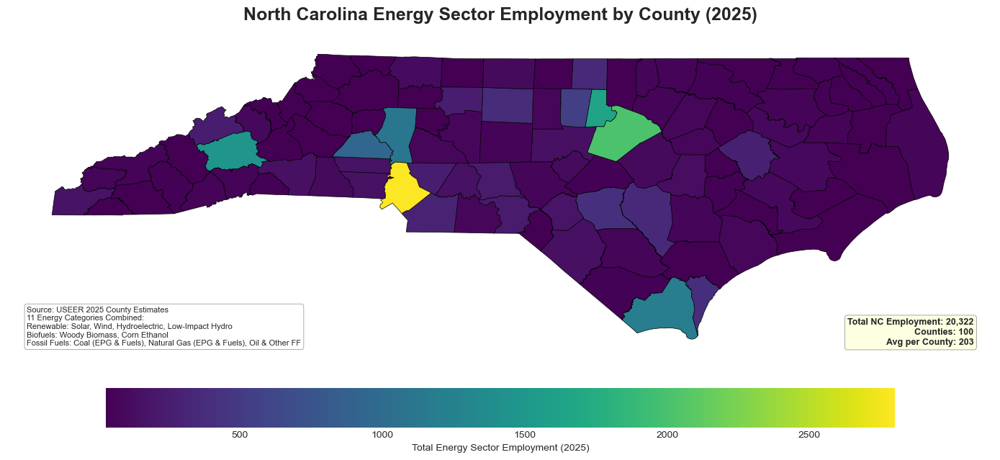


NC EMPLOYMENT SUMMARY (2025)

Total Employment:           20,322
Average per County:            203
Median per County:              63
Std Deviation:                 427
Min Employment:                 29
Max Employment:              2,799

------------------------------------------------------------
TOP 10 COUNTIES BY EMPLOYMENT:
------------------------------------------------------------
 1. Mecklenburg                    2,799
 2. Wake                           2,017
 3. Durham                         1,632
 4. Buncombe                       1,477
 5. Brunswick                      1,197
 6. Iredell                        1,119
 7. Catawba                          933
 8. Orange                           547
 9. Cumberland                       411
10. New Hanover                      395

------------------------------------------------------------
BOTTOM 10 COUNTIES BY EMPLOYMENT:
------------------------------------------------------------
 1. Caldwell                          

In [99]:
# GOAL 4: NC PROTOTYPE MAP - CORRECTED VERSION WITH ROBUST NAME MATCHING
# ============================================================================

print("GOAL 4: NORTH CAROLINA EMPLOYMENT MAP (2025 DATA)")
print("="*80)

# STEP 1: LOAD DATA

print("\n[STEP 1] Loading geographic and employment data...")

# Load NC counties from shapefile
print("  Loading NC shapefile...")


#OUTPUT_DIR = 'shapefiles'
#focus_counties = gpd.read_file(f'{OUTPUT_DIR}/Goal4_FocusStates_Detailed.shp')
#nc_counties = focus_counties[focus_counties['STATEFP'] == '37'].copy()

focus_counties, other_counties, all_counties = load_optimized_shapefiles()
nc_counties = focus_counties[focus_counties['STATEFP'] == '37'].copy()

print(f"   Loaded {len(nc_counties)} NC counties from shapefile")

# Load employment trends from Goal 1 CSV
print("  Loading employment trends from Goal 1...")
county_trends = pd.read_csv('Goal1_County_Trends_2023_2025.csv')
nc_employment = county_trends[county_trends['State'] == 'NC'].copy()
print(f"   Loaded employment data for {len(nc_employment)} NC counties")

# STEP 2: VALIDATE CATEGORIES

print("\n[STEP 2] Validating energy categories...")

target_categories = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'Woody Biomass', 'Corn Ethanol', 'EPG - Coal', 'Fuels - Coal',
    'EPG - Natural Gas', 'Fuels - Natural Gas', 'Oil & Other FF'
]

# Find which category columns exist in 2025 data (NOT 2024!)
category_2025_cols = []
missing_categories = []

for cat in target_categories:
    col_name = f'{cat}_2025'
    if col_name in nc_employment.columns:
        category_2025_cols.append(col_name)
    else:
        missing_categories.append(cat)

print(f"  Found: {len(category_2025_cols)} of {len(target_categories)} categories")
if missing_categories:
    print(f"   Missing: {missing_categories}")
else:
    print("   All categories present!")

# STEP 3: CALCULATE TOTAL EMPLOYMENT

print("\n[STEP 3] Calculating total employment across categories...")

nc_employment['Total_Employment_2025'] = nc_employment[category_2025_cols].sum(axis=1)

print(f"  Total employment range: {nc_employment['Total_Employment_2025'].min():.0f} to {nc_employment['Total_Employment_2025'].max():.0f}")
print(f"  Mean employment per county: {nc_employment['Total_Employment_2025'].mean():.0f}")
print(f"  Total NC employment: {nc_employment['Total_Employment_2025'].sum():.0f}")

# STEP 4: ROBUST COUNTY NAME NORMALIZATION

print("\n[STEP 4] Normalizing county names for reliable matching...")

def normalize_county_name(name):
    """
    Normalize county names to handle all variations:
    - Converts to lowercase
    - Removes 'county' suffix
    - Strips whitespace
    
    Examples:
    'Alamance County' → 'alamance'
    'ALAMANCE COUNTY' → 'alamance'
    'Alamance' → 'alamance'
    ' Alamance  County ' → 'alamance'
    """
    if pd.isna(name):
        return name
    name = str(name).lower().strip()
    name = name.replace(' county', '')
    return name.strip()

# Apply normalization
nc_employment['County_Normalized'] = nc_employment['County Name'].apply(normalize_county_name)
nc_counties['NAME_Normalized'] = nc_counties['NAME'].apply(normalize_county_name)

# Verify normalization
print("  Sample normalized names from employment data:")
print(f"    Original: {nc_employment['County Name'].head(3).tolist()}")
print(f"    Normalized: {nc_employment['County_Normalized'].head(3).tolist()}")
print("  Sample normalized names from shapefile:")
print(f"    Original: {nc_counties['NAME'].head(3).tolist()}")
print(f"    Normalized: {nc_counties['NAME_Normalized'].head(3).tolist()}")

# STEP 5: MERGE ON NORMALIZED NAMES

print("\n[STEP 5] Merging data using normalized county names...")

nc_map_data = nc_counties.merge(
    nc_employment[['County_Normalized', 'County Name', 'Total_Employment_2025']],
    left_on='NAME_Normalized',
    right_on='County_Normalized',
    how='left'
)

# Verify merge
counties_with_data = nc_map_data['Total_Employment_2025'].notna().sum()
counties_missing_data = nc_map_data['Total_Employment_2025'].isna().sum()

print(f"  Counties in shapefile: {len(nc_counties)}")
print(f"  Counties with employment data: {counties_with_data}")
print(f"  Counties missing data: {counties_missing_data}")

if counties_missing_data > 0:
    print("\n   WARNING: Some counties missing data!")
    missing = nc_map_data[nc_map_data['Total_Employment_2025'].isna()][['NAME', 'NAME_Normalized', 'GEOID']].head(10)
    print(missing.to_string(index=False))
elif counties_with_data == 100:
    print("   SUCCESS: All 100 NC counties matched!")
else:
    print(f"  Note: Found {counties_with_data} counties with data")

# STEP 6: CREATE CHOROPLETH MAP

print("\n[STEP 6] Creating choropleth map...")

final_image8, ax = plt.subplots(1, 1, figsize=(14, 10))

nc_map_data.plot(
    column='Total_Employment_2025',
    cmap='viridis',
    legend=True,
    legend_kwds={
        'label': "Total Energy Sector Employment (2025)",
        'orientation': "horizontal",
        'shrink': 0.8,
        'pad': 0.05,
        'format': '%.0f'
    },
    edgecolor='black',
    linewidth=0.5,
    ax=ax,
    missing_kwds={
        'color': 'lightgrey',
        'edgecolor': 'black',
        'hatch': '///',
        'label': 'No Data'
    }
)

ax.set_title('North Carolina Energy Sector Employment by County (2025)', 
             fontsize=18, fontweight='bold', pad=20)
ax.axis('off')
ax.set_aspect('equal')

# Source annotation
ax.text(0.02, 0.02, 
        'Source: USEER 2025 County Estimates\n'
        f'{len(category_2025_cols)} Energy Categories Combined:\n'
        'Renewable: Solar, Wind, Hydroelectric, Low-Impact Hydro\n'
        'Biofuels: Woody Biomass, Corn Ethanol\n'
        'Fossil Fuels: Coal (EPG & Fuels), Natural Gas (EPG & Fuels), Oil & Other FF',
        transform=ax.transAxes,
        fontsize=8, 
        verticalalignment='bottom',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, 
                 edgecolor='gray', linewidth=0.5))

# Summary statistics box
total_emp = nc_map_data['Total_Employment_2025'].sum()
avg_emp = nc_map_data['Total_Employment_2025'].mean()
counties_counted = nc_map_data['Total_Employment_2025'].notna().sum()

ax.text(0.98, 0.02,
        f'Total NC Employment: {total_emp:,.0f}\n'
        f'Counties: {counties_counted}\n'
        f'Avg per County: {avg_emp:,.0f}',
        transform=ax.transAxes,
        fontsize=9,
        fontweight='bold',
        horizontalalignment='right',
        verticalalignment='bottom',
        bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.95, 
                 edgecolor='gray', linewidth=0.5))

plt.tight_layout()

# STEP 7: SAVE OUTPUTS

print("\n[STEP 7] Saving map outputs...")

output_path = 'Goal4_NC_Total_Employment_2025.png'
plt.savefig(output_path, dpi=300, bbox_inches='tight', facecolor='white')
print(f"   High-res map saved: {output_path}")

preview_path = 'Goal4_NC_Total_Employment_2025_preview.png'
plt.savefig(preview_path, dpi=150, bbox_inches='tight', facecolor='white')
print(f"   Preview saved: {preview_path}")

plt.show()

# STEP 8: SUMMARY STATISTICS

print("\n" + "="*80)
print("NC EMPLOYMENT SUMMARY (2025)")
print("="*80)

print(f"\nTotal Employment:     {nc_map_data['Total_Employment_2025'].sum():>12,.0f}")
print(f"Average per County:   {nc_map_data['Total_Employment_2025'].mean():>12,.0f}")
print(f"Median per County:    {nc_map_data['Total_Employment_2025'].median():>12,.0f}")
print(f"Std Deviation:        {nc_map_data['Total_Employment_2025'].std():>12,.0f}")
print(f"Min Employment:       {nc_map_data['Total_Employment_2025'].min():>12,.0f}")
print(f"Max Employment:       {nc_map_data['Total_Employment_2025'].max():>12,.0f}")

print("\n" + "-"*60)
print("TOP 10 COUNTIES BY EMPLOYMENT:")
print("-" * 60)
top_10 = nc_map_data.nlargest(10, 'Total_Employment_2025')[['NAME', 'Total_Employment_2025']]
for idx, (_, row) in enumerate(top_10.iterrows(), 1):
    print(f"{idx:2d}. {row['NAME']:<25s} {row['Total_Employment_2025']:>10,.0f}")

print("\n" + "-"*60)
print("BOTTOM 10 COUNTIES BY EMPLOYMENT:")
print("-" * 60)
bottom_10 = nc_map_data.nsmallest(10, 'Total_Employment_2025')[['NAME', 'Total_Employment_2025']]
for idx, (_, row) in enumerate(bottom_10.iterrows(), 1):
    print(f"{idx:2d}. {row['NAME']:<25s} {row['Total_Employment_2025']:>10,.0f}")

print("\n" + "="*80)
print(" NORTH CAROLINA MAP COMPLETE!")
print("="*80)

In [56]:
# Category groupings
RENEWABLE_CATEGORIES = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'Woody Biomass', 'Corn Ethanol'
]

FOSSIL_CATEGORIES = [
    'EPG - Coal', 'Fuels - Coal',
    'EPG - Natural Gas', 'Fuels - Natural Gas',
    'Oil & Other FF'
]
ALL_CATEGORIES = RENEWABLE_CATEGORIES + FOSSIL_CATEGORIES
YEAR = 2025

## Helper functions (will work for any state)

In [111]:
def load_focus_shapefile():
    """
    Load the pre-optimized focus-state counties shapefile.
    Assumes Goal4_FocusStates_Detailed.shp already exists in OUTPUT_DIR.
    """
    focus_path = f"{OUTPUT_DIR}/Goal4_FocusStates_Detailed.shp"
    return gpd.read_file(focus_path)


def normalize_county_name(name):
    """
    Normalize county names for reliable matching.
    Handles: 'Alamance County', 'ALAMANCE', 'alamance county', etc.
    """
    if pd.isna(name):
        return name
    name = str(name).lower().strip()
    name = name.replace(' county', '')
    return name.strip()

from matplotlib.colors import TwoSlopeNorm
def add_change_columns(df, category_list, category_type='Total'):
    """
    Given a dataframe with Category_2023 and Category_2025 columns,
    add AbsChange and PctChange columns for specified categories.
    
    Parameters:
    -----------
    df : pd.DataFrame
        County-level employment data with _2023 and _2025 columns
    category_list : list
        List of category names (e.g., RENEWABLE_CATEGORIES)
    category_type : str
        'Total', 'Renewable', or 'Fossil' - used for column naming
    
    Returns:
    --------
    pd.DataFrame with added columns:
        - {category_type}_Employment_2023
        - {category_type}_Employment_2025
        - {category_type}_AbsChange
        - {category_type}_PctChange
    """
    # Build column lists for 2023 and 2025
    cols_2023 = [f"{cat}_2023" for cat in category_list if f"{cat}_2023" in df.columns]
    cols_2025 = [f"{cat}_2025" for cat in category_list if f"{cat}_2025" in df.columns]
    
    # Check for missing columns
    missing_2023 = [cat for cat in category_list if f"{cat}_2023" not in df.columns]
    missing_2025 = [cat for cat in category_list if f"{cat}_2025" not in df.columns]
    
    if missing_2023 or missing_2025:
        print(f"\n[WARNING] Missing columns for {category_type}:")
        if missing_2023:
            print(f"  2023: {missing_2023}")
        if missing_2025:
            print(f"  2025: {missing_2025}")
    
    # Calculate totals
    emp_2023_col = f"{category_type}_Employment_2023"
    emp_2025_col = f"{category_type}_Employment_2025"
    abs_change_col = f"{category_type}_AbsChange"
    pct_change_col = f"{category_type}_PctChange"
    
    df[emp_2023_col] = df[cols_2023].sum(axis=1)
    df[emp_2025_col] = df[cols_2025].sum(axis=1)
    
    # Absolute change
    df[abs_change_col] = df[emp_2025_col] - df[emp_2023_col]
    
    # Percentage change (handle division by zero)
    df[pct_change_col] = np.where(
        df[emp_2023_col] > 0,
        ((df[emp_2025_col] - df[emp_2023_col]) / df[emp_2023_col]) * 100,
        np.nan  # Counties with 0 jobs in 2023 get NaN
    )
    
    print(f"\n[Change Calculation] {category_type}:")
    print(f"  Using {len(cols_2023)} categories")
    print(f"  Absolute change range: {df[abs_change_col].min():.1f} to {df[abs_change_col].max():.1f}")
    print(f"  Percentage change range: {df[pct_change_col].min():.1f}% to {df[pct_change_col].max():.1f}%")
    print(f"  Counties with growth: {(df[abs_change_col] > 0).sum()}")
    print(f"  Counties with decline: {(df[abs_change_col] < 0).sum()}")
    print(f"  Counties unchanged: {(df[abs_change_col] == 0).sum()}")
    
    return df


def build_change_map_df(state_abbrev, county_trends, focus_counties, 
                        include_total=True, include_splits=True):
    """
    Build a GeoDataFrame for a state with change calculations.
    
    Parameters:
    -----------
    state_abbrev : str
        Two-letter state code (e.g., 'NC')
    county_trends : pd.DataFrame
        Full county trends from Goal 1
    focus_counties : gpd.GeoDataFrame
        Geographic boundaries
    include_total : bool
        Calculate change for all categories combined
    include_splits : bool
        Calculate change separately for renewable and fossil
    
    Returns:
    --------
    gpd.GeoDataFrame with geometry and change columns
    """
    state_fips = FOCUS_STATE_FIPS[state_abbrev]
    
    # Filter to this state
    state_counties = focus_counties[focus_counties['STATEFP'] == state_fips].copy()
    state_emp = county_trends[county_trends['State'] == state_abbrev].copy()
    
    print(f"\n{'='*80}")
    print(f"BUILDING CHANGE MAP FOR {state_abbrev}")
    print(f"{'='*80}")
    print(f"Counties in shapefile: {len(state_counties)}")
    print(f"Counties in employment data: {len(state_emp)}")
    
    # Add change calculations
    if include_total:
        state_emp = add_change_columns(state_emp, ALL_CATEGORIES, 'Total')
    
    if include_splits:
        state_emp = add_change_columns(state_emp, RENEWABLE_CATEGORIES, 'Renewable')
        state_emp = add_change_columns(state_emp, FOSSIL_CATEGORIES, 'Fossil')
    
    # Normalize county names for matching
    state_emp['County_Normalized'] = state_emp['County Name'].apply(normalize_county_name)
    state_counties['NAME_Normalized'] = state_counties['NAME'].apply(normalize_county_name)
    
    # Merge - include all change columns
    change_cols = [col for col in state_emp.columns 
                   if 'AbsChange' in col or 'PctChange' in col or 'Employment_' in col]
    
    map_df = state_counties.merge(
        state_emp[['County_Normalized', 'County Name'] + change_cols],
        left_on='NAME_Normalized',
        right_on='County_Normalized',
        how='left'
    )
    
    # Verify merge
    print(f"\n[Merge Verification]")
    for col in change_cols[:4]:  # Show first 4 columns
        has_data = map_df[col].notna().sum()
        missing = map_df[col].isna().sum()
        print(f"  {col}: {has_data} counties with data, {missing} missing")
    
    return map_df


def plot_change_maps(map_df, state_abbrev, change_type='Total',
                     save_prefix='Goal4_NC_Change'):
    """
    Create side-by-side maps showing absolute and percentage change.
    
    Parameters:
    -----------
    map_df : gpd.GeoDataFrame
        Data with change columns
    state_abbrev : str
        State code for titles
    change_type : str
        'Total', 'Renewable', or 'Fossil'
    save_prefix : str
        Prefix for saved filenames
    """
    abs_col = f"{change_type}_AbsChange"
    pct_col = f"{change_type}_PctChange"
    
    # Check columns exist
    if abs_col not in map_df.columns or pct_col not in map_df.columns:
        print(f"[ERROR] Change columns not found: {abs_col}, {pct_col}")
        return
    
    print(f"\n{'='*80}")
    print(f"CREATING CHANGE MAPS: {state_abbrev} - {change_type}")
    print(f"{'='*80}")
    
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(20, 9))
    
    # ========== ABSOLUTE CHANGE MAP ==========
    abs_data = map_df[abs_col].dropna()
    abs_max = max(abs(abs_data.min()), abs(abs_data.max()))
    
    # Create symmetric colormap centered at 0
    norm_abs = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    
    map_df.plot(
        column=abs_col,
        cmap='RdYlGn',  # Red=decline, Yellow=stable, Green=growth
        norm=norm_abs,
        legend=True,
        legend_kwds={
            'label': "Absolute Job Change (2025 - 2023)",
            'orientation': "horizontal",
            'shrink': 0.8,
            'pad': 0.05,
            'format': '%+.0f'  # Show + for positive
        },
        edgecolor='black',
        linewidth=0.5,
        ax=axes[0],
        missing_kwds={
            'color': 'lightgrey',
            'edgecolor': 'black',
            'hatch': '///',
            'label': 'No Data'
        }
    )
    
    axes[0].set_title(
        f'{state_abbrev} {change_type} Employment\nAbsolute Change (2025 - 2023)',
        fontsize=16, fontweight='bold', pad=15
    )
    axes[0].axis('off')
    
    # Add summary statistics to absolute map
    total_change = map_df[abs_col].sum()
    counties_growth = (map_df[abs_col] > 0).sum()
    counties_decline = (map_df[abs_col] < 0).sum()
    
    axes[0].text(0.02, 0.98,
                f'Net Change: {total_change:+,.0f} jobs\n'
                f'Counties Growing: {counties_growth}\n'
                f'Counties Declining: {counties_decline}',
                transform=axes[0].transAxes,
                fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', 
                         alpha=0.9, edgecolor='gray'))
    
    # ========== PERCENTAGE CHANGE MAP ==========
    pct_data = map_df[pct_col].dropna()
    
    # For percentage, use symmetric scale but cap extremes for better visualization
    pct_95 = np.percentile(abs(pct_data), 95)  # Use 95th percentile to avoid outliers
    pct_max = min(pct_95, 100)  # Cap at 100% for readability
    
    norm_pct = TwoSlopeNorm(vmin=-pct_max, vcenter=0, vmax=pct_max)
    
    map_df.plot(
        column=pct_col,
        cmap='RdYlGn',
        norm=norm_pct,
        legend=True,
        legend_kwds={
            'label': "Percentage Change (2025 vs 2023)",
            'orientation': "horizontal",
            'shrink': 0.8,
            'pad': 0.05,
            'format': '%+.0f%%'  # Show + and %
        },
        edgecolor='black',
        linewidth=0.5,
        ax=axes[1],
        missing_kwds={
            'color': 'lightgrey',
            'edgecolor': 'black',
            'hatch': '///',
            'label': 'No Data'
        }
    )
    
    axes[1].set_title(
        f'{state_abbrev} {change_type} Employment\nPercentage Change (2025 vs 2023)',
        fontsize=16, fontweight='bold', pad=15
    )
    axes[1].axis('off')
    
    # Add summary statistics to percentage map
    mean_pct = map_df[pct_col].mean()
    median_pct = map_df[pct_col].median()
    
    axes[1].text(0.02, 0.98,
                f'Mean Change: {mean_pct:+.1f}%\n'
                f'Median Change: {median_pct:+.1f}%\n'
                f'Range: {pct_data.min():.1f}% to {pct_data.max():.1f}%',
                transform=axes[1].transAxes,
                fontsize=10,
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', 
                         alpha=0.9, edgecolor='gray'))
    
    # Overall title
    fig.suptitle(
        f'{state_abbrev} Energy Sector Employment Growth (2023 → 2025)',
        fontsize=18, fontweight='bold', y=0.98
    )
    
    plt.tight_layout()
    plt.savefig(output_path, dpi=300, bbox_inches="tight")

    # Capture the figure so we can reuse it later
    fig = plt.gcf()

    plt.show()

    # Return the figure object
    return fig


def print_change_summary(map_df, state_abbrev, change_type='Total'):
    """
    Print detailed statistics about employment changes.
    """
    abs_col = f"{change_type}_AbsChange"
    pct_col = f"{change_type}_PctChange"
    emp_2023_col = f"{change_type}_Employment_2023"
    emp_2025_col = f"{change_type}_Employment_2025"
    
    print(f"\n{'='*80}")
    print(f"{state_abbrev} {change_type.upper()} EMPLOYMENT CHANGE SUMMARY (2023 → 2025)")
    print(f"{'='*80}")
    
    # Overall statistics
    total_2023 = map_df[emp_2023_col].sum()
    total_2025 = map_df[emp_2025_col].sum()
    net_change = map_df[abs_col].sum()
    overall_pct = (net_change / total_2023 * 100) if total_2023 > 0 else 0
    
    print(f"\n STATEWIDE TOTALS:")
    print(f"  2023 Employment: {total_2023:>12,.0f}")
    print(f"  2025 Employment: {total_2025:>12,.0f}")
    print(f"  Net Change:      {net_change:+12,.0f} ({overall_pct:+.1f}%)")
    
    # County-level statistics
    growth_counties = map_df[map_df[abs_col] > 0]
    decline_counties = map_df[map_df[abs_col] < 0]
    stable_counties = map_df[map_df[abs_col] == 0]
    
    print(f"\n COUNTY BREAKDOWN:")
    print(f"  Growing:   {len(growth_counties):>3} counties (+{growth_counties[abs_col].sum():,.0f} jobs)")
    print(f"  Declining: {len(decline_counties):>3} counties ({decline_counties[abs_col].sum():,.0f} jobs)")
    print(f"  Stable:    {len(stable_counties):>3} counties")
    
    # Top gainers
    print(f"\n TOP 5 GROWING COUNTIES:")
    top_growth = map_df.nlargest(5, abs_col)[['NAME', abs_col, pct_col]]
    for idx, (_, row) in enumerate(top_growth.iterrows(), 1):
        print(f"  {idx}. {row['NAME']:<20s} {row[abs_col]:>+8,.0f} ({row[pct_col]:>+6.1f}%)")
    
    # Top decliners
    print(f"\n TOP 5 DECLINING COUNTIES:")
    top_decline = map_df.nsmallest(5, abs_col)[['NAME', abs_col, pct_col]]
    for idx, (_, row) in enumerate(top_decline.iterrows(), 1):
        print(f"  {idx}. {row['NAME']:<20s} {row[abs_col]:>+8,.0f} ({row[pct_col]:>+6.1f}%)")
    
    print(f"\n{'='*80}\n")

def build_state_map_df(state_abbrev, year, county_trends, focus_counties):
    """
    Build a GeoDataFrame for a state for a single YEAR with
    renewable and fossil employment totals.

    Creates:
        - Renewable_Employment_{year}
        - NonRenewable_Employment_{year}
        - Total_Employment_{year}
    """
    state_fips = FOCUS_STATE_FIPS[state_abbrev]

    # Filter geographic data
    state_counties = focus_counties[focus_counties["STATEFP"] == state_fips].copy()

    # Filter employment data
    state_emp = county_trends[county_trends["State"] == state_abbrev].copy()
    print(f"\n[build_state_map_df] {state_abbrev}")
    print(f"  Counties in shapefile:      {len(state_counties)}")
    print(f"  Counties in employment data: {len(state_emp)}")

    # --- Aggregate by category type for the requested year ---
    year_suffix = f"_{year}"

    # Build column lists
    renew_cols = [f"{cat}{year_suffix}" for cat in RENEWABLE_CATEGORIES
                  if f"{cat}{year_suffix}" in state_emp.columns]
    fossil_cols = [f"{cat}{year_suffix}" for cat in FOSSIL_CATEGORIES
                   if f"{cat}{year_suffix}" in state_emp.columns]

    missing_renew = [cat for cat in RENEWABLE_CATEGORIES
                     if f"{cat}{year_suffix}" not in state_emp.columns]
    missing_fossil = [cat for cat in FOSSIL_CATEGORIES
                      if f"{cat}{year_suffix}" not in state_emp.columns]

    if missing_renew or missing_fossil:
        print("\n[WARNING] Missing category columns for static maps:")
        if missing_renew:
            print(f"  Renewable missing: {missing_renew}")
        if missing_fossil:
            print(f"  Fossil missing:    {missing_fossil}")

    # Compute totals
    renew_col = f"Renewable_Employment_{year}"
    fossil_col = f"NonRenewable_Employment_{year}"
    total_col = f"Total_Employment_{year}"

    state_emp[renew_col] = state_emp[renew_cols].sum(axis=1)
    state_emp[fossil_col] = state_emp[fossil_cols].sum(axis=1)
    state_emp[total_col] = state_emp[renew_col] + state_emp[fossil_col]

    print(f"  {renew_col} range: {state_emp[renew_col].min():.1f} to {state_emp[renew_col].max():.1f}")
    print(f"  {fossil_col} range: {state_emp[fossil_col].min():.1f} to {state_emp[fossil_col].max():.1f}")

    # --- Normalize county names and merge ---
    state_emp["County_Normalized"] = state_emp["County Name"].apply(normalize_county_name)
    state_counties["NAME_Normalized"] = state_counties["NAME"].apply(normalize_county_name)

    map_df = state_counties.merge(
        state_emp[["County_Normalized", "County Name", renew_col, fossil_col, total_col]],
        left_on="NAME_Normalized",
        right_on="County_Normalized",
        how="left"
    )

    print("\n[build_state_map_df] Merge verification:")
    for col in [renew_col, fossil_col, total_col]:
        has_data = map_df[col].notna().sum()
        missing = map_df[col].isna().sum()
        print(f"  {col}: {has_data} with data, {missing} missing")

    return map_df

GOAL 4 TEST: NC RENEWABLE VS FOSSIL EMPLOYMENT MAPS (2025)

Loaded 100 NC counties from shapefile.
Loaded county_trends with shape (3142, 116)

[build_state_map_df] NC
  Counties in shapefile:      100
  Counties in employment data: 100
  Renewable_Employment_2025 range: 19.4 to 2406.6
  NonRenewable_Employment_2025 range: 9.2 to 1022.7

[build_state_map_df] Merge verification:
  Renewable_Employment_2025: 100 with data, 0 missing
  NonRenewable_Employment_2025: 100 with data, 0 missing
  Total_Employment_2025: 100 with data, 0 missing

[build_state_map_df] NC
  Counties in shapefile:      100
  Counties in employment data: 100
  Renewable_Employment_2025 range: 19.4 to 2406.6
  NonRenewable_Employment_2025 range: 9.2 to 1022.7

[build_state_map_df] Merge verification:
  Renewable_Employment_2025: 100 with data, 0 missing
  NonRenewable_Employment_2025: 100 with data, 0 missing
  Total_Employment_2025: 100 with data, 0 missing

Creating NC renewable vs fossil employment maps...


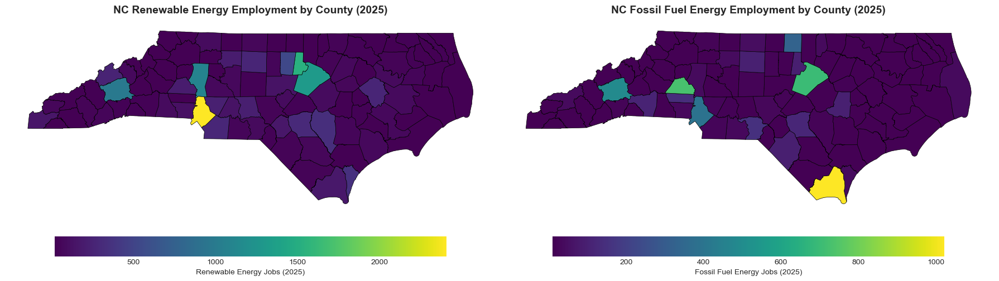


NC EMPLOYMENT SPLIT SUMMARY
Year: 2025
Total renewable jobs:      14,603
Total fossil-fuel jobs:    5,719
Average renewable per county:   146
Average fossil per county:      57

Top 5 counties by renewable jobs:
         County  Renewable_Jobs
75  Mecklenburg     2406.619585
7        Durham     1537.209059
82         Wake     1315.186552
50      Iredell     1085.469480
86     Buncombe      986.256369

Top 5 counties by fossil-fuel jobs:
         County  Fossil_Jobs
92    Brunswick  1022.709589
58      Catawba   726.950163
82         Wake   701.525792
86     Buncombe   491.216712
75  Mecklenburg   392.879358


In [58]:
# Load data and build NC map dataframe =====
print(f"GOAL 4 TEST: NC RENEWABLE VS FOSSIL EMPLOYMENT MAPS ({YEAR})")
print("="*80)

# Load geographic data
focus_counties = load_focus_shapefile()
nc_counties = focus_counties[focus_counties['STATEFP'] == FOCUS_STATE_FIPS['NC']].copy()
print(f"\nLoaded {len(nc_counties)} NC counties from shapefile.")

# Load employment data from your Goal 1 output
county_trends = pd.read_csv("Goal1_County_Trends_2023_2025.csv")
print(f"Loaded county_trends with shape {county_trends.shape}")

# Build NC map dataframe with both splits
nc_map_data = build_state_map_df('NC', YEAR, county_trends, focus_counties)


# Plot two NC maps side by side (renewable vs fossil)
YEAR = 2025  # make sure this is defined

focus_counties = load_focus_shapefile()
county_trends = pd.read_csv("Goal1_County_Trends_2023_2025.csv")

nc_map_data = build_state_map_df("NC", YEAR, county_trends, focus_counties)

renew_col = f"Renewable_Employment_{YEAR}"
fossil_col = f"NonRenewable_Employment_{YEAR}"


print("\nCreating NC renewable vs fossil employment maps...")

fig, axes = plt.subplots(1, 2, figsize=(18, 9))

# Common plotting kwargs
common_kwargs = dict(
    cmap='viridis',
    edgecolor='black',
    linewidth=0.5,
    missing_kwds={
        'color': 'lightgrey',
        'edgecolor': 'black',
        'hatch': '///',
        'label': 'No Data'
    }
)

# Renewable map
nc_map_data.plot(
    column=renew_col,
    legend=True,
    legend_kwds={
        'label': f"Renewable Energy Jobs ({YEAR})",
        'orientation': "horizontal",
        'shrink': 0.8,
        'pad': 0.05,
        'format': '%.0f'
    },
    ax=axes[0],
    **common_kwargs
)
axes[0].set_title(f"NC Renewable Energy Employment by County ({YEAR})",
                  fontsize=14, fontweight='bold', pad=12)
axes[0].axis('off')

# Fossil / non-renewable map
nc_map_data.plot(
    column=fossil_col,
    legend=True,
    legend_kwds={
        'label': f"Fossil Fuel Energy Jobs ({YEAR})",
        'orientation': "horizontal",
        'shrink': 0.8,
        'pad': 0.05,
        'format': '%.0f'
    },
    ax=axes[1],
    **common_kwargs
)
axes[1].set_title(f"NC Fossil Fuel Energy Employment by County ({YEAR})",
                  fontsize=14, fontweight='bold', pad=12)
axes[1].axis('off')

plt.tight_layout()
plt.savefig(f"Goal4_NC_Renewable_vs_Fossil_{YEAR}.png", dpi=300, bbox_inches='tight')
plt.show()

# Quick numeric summary for NC =====
print("\nNC EMPLOYMENT SPLIT SUMMARY")
print("="*80)
print(f"Year: {YEAR}")
print(f"Total renewable jobs:      {nc_map_data[renew_col].sum():,.0f}")
print(f"Total fossil-fuel jobs:    {nc_map_data[fossil_col].sum():,.0f}")
print(f"Average renewable per county:   {nc_map_data[renew_col].mean():,.0f}")
print(f"Average fossil per county:      {nc_map_data[fossil_col].mean():,.0f}")

print("\nTop 5 counties by renewable jobs:")
print(
    nc_map_data.nlargest(5, renew_col)[['NAME', renew_col]]
    .rename(columns={'NAME': 'County', renew_col: 'Renewable_Jobs'})
)

print("\nTop 5 counties by fossil-fuel jobs:")
print(
    nc_map_data.nlargest(5, fossil_col)[['NAME', fossil_col]]
    .rename(columns={'NAME': 'County', fossil_col: 'Fossil_Jobs'})
)

## GOAL 4: PERCENTAGE CHANGE VISUALIZATIONS (2025 vs 2023)
# This code creates two types of change maps:
###   1. Absolute Change: Raw job difference (2025 - 2023)
###   2. Percentage Change: Relative growth ((2025-2023)/2023 * 100)
### Uses RdYlGn diverging colormap: Green = growth, Red = decline
### Built to be robust and easily adaptable to other states

GOAL 4: NORTH CAROLINA EMPLOYMENT CHANGE ANALYSIS (2023 → 2025)

[1/4] Loading data...
   Loaded 566 focus counties
   Loaded county trends: (3142, 116)

[2/4] Calculating employment changes for NC...

BUILDING CHANGE MAP FOR NC
Counties in shapefile: 100
Counties in employment data: 100

[Change Calculation] Total:
  Using 11 categories
  Absolute change range: -113.5 to 324.8
  Percentage change range: -24.7% to 377.0%
  Counties with growth: 69
  Counties with decline: 31
  Counties unchanged: 0

[Change Calculation] Renewable:
  Using 6 categories
  Absolute change range: -60.2 to 254.3
  Percentage change range: -16.6% to 392.7%
  Counties with growth: 72
  Counties with decline: 28
  Counties unchanged: 0

[Change Calculation] Fossil:
  Using 5 categories
  Absolute change range: -198.9 to 204.2
  Percentage change range: -68.9% to 342.4%
  Counties with growth: 15
  Counties with decline: 85
  Counties unchanged: 0

[Merge Verification]
  Solar_AbsChange: 100 counties with data,

<Figure size 640x480 with 0 Axes>

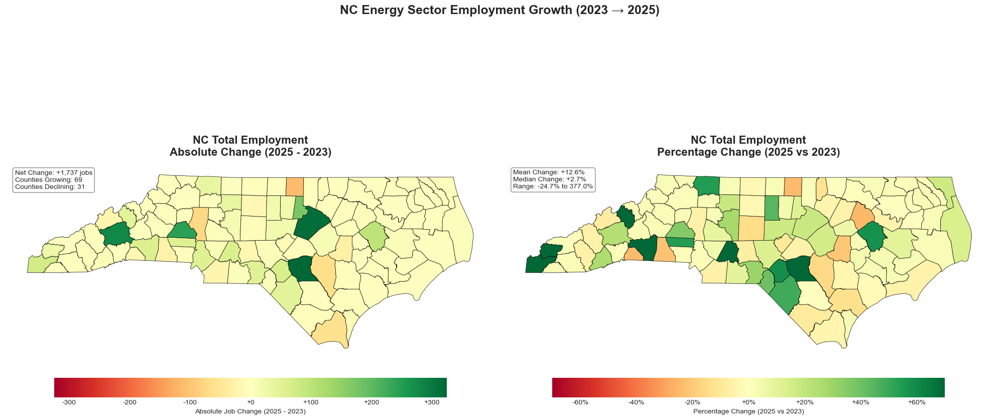


CREATING CHANGE MAPS: NC - Renewable


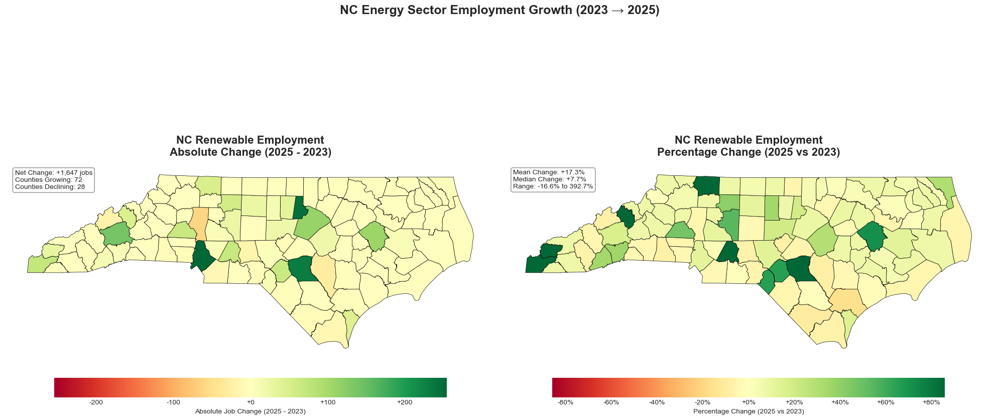


CREATING CHANGE MAPS: NC - Fossil


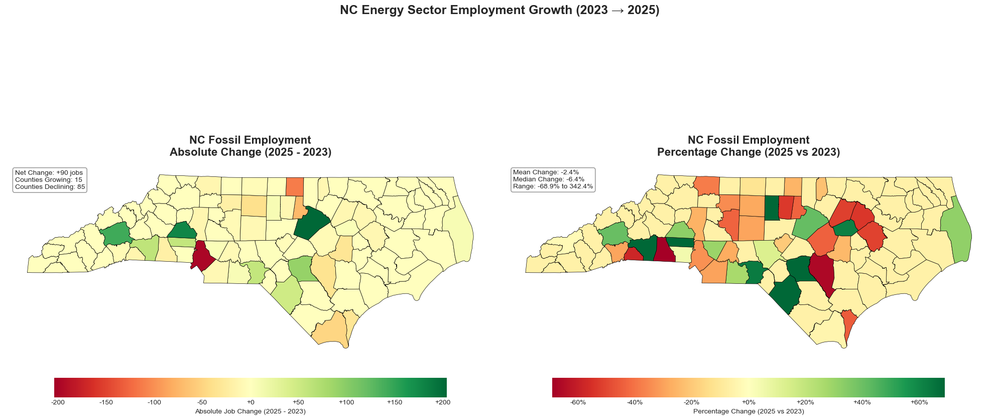


[4/4] Generating summary statistics...

NC TOTAL EMPLOYMENT CHANGE SUMMARY (2023 → 2025)

 STATEWIDE TOTALS:
  2023 Employment:       18,585
  2025 Employment:       20,322
  Net Change:            +1,737 (+9.3%)

 COUNTY BREAKDOWN:
  Growing:    69 counties (+2,276 jobs)
  Declining:  31 counties (-539 jobs)
  Stable:      0 counties

 TOP 5 GROWING COUNTIES:
  1. Cumberland               +325 (+377.0%)
  2. Wake                     +316 ( +18.6%)
  3. Buncombe                 +282 ( +23.6%)
  4. Catawba                  +245 ( +35.5%)
  5. Durham                   +173 ( +11.8%)

 TOP 5 DECLINING COUNTIES:
  1. Person                   -114 ( -24.4%)
  2. Iredell                   -72 (  -6.1%)
  3. Sampson                   -64 ( -15.5%)
  4. Brunswick                 -60 (  -4.8%)
  5. Wayne                     -31 ( -20.8%)



NC RENEWABLE EMPLOYMENT CHANGE SUMMARY (2023 → 2025)

 STATEWIDE TOTALS:
  2023 Employment:       12,956
  2025 Employment:       14,603
  Net Change:     

In [112]:
print("GOAL 4: NORTH CAROLINA EMPLOYMENT CHANGE ANALYSIS (2023 → 2025)")
print("="*80)

# [1/4] Load data
print("\n[1/4] Loading data...")
focus_counties = gpd.read_file(f"{OUTPUT_DIR}/Goal4_FocusStates_Detailed.shp")
county_trends = pd.read_csv("Goal1_County_Trends_2023_2025.csv")
print(f"   Loaded {len(focus_counties)} focus counties")
print(f"   Loaded county trends: {county_trends.shape}")

# [2/4] Build NC change dataframe
print("\n[2/4] Calculating employment changes for NC...")
nc_map_data = build_change_map_df(
    "NC",
    county_trends,
    focus_counties,
    include_total=True,
    include_splits=True
)

# [3/4] Create maps
print("\n[3/4] Creating visualization maps...")

# Each call now RETURNS a figure object
nc_total_fig = plot_change_maps(
    nc_map_data,
    "NC",
    change_type="Total",
    save_prefix="Goal4_NC_TotalChange"
)

nc_renew_fig = plot_change_maps(
    nc_map_data,
    "NC",
    change_type="Renewable",
    save_prefix="Goal4_NC_RenewableChange"
)

nc_fossil_fig = plot_change_maps(
    nc_map_data,
    "NC",
    change_type="Fossil",
    save_prefix="Goal4_NC_FossilChange"
)

# 🌟 Master handle for all NC change figures
final_image9 = [nc_total_fig, nc_renew_fig, nc_fossil_fig]

# [4/4] Print summaries
print("\n[4/4] Generating summary statistics...")
print_change_summary(nc_map_data, "NC", "Total")
print_change_summary(nc_map_data, "NC", "Renewable")
print_change_summary(nc_map_data, "NC", "Fossil")

print("\n" + "="*80)
print(" ALL NC CHANGE MAPS COMPLETED SUCCESSFULLY!")
print("="*80)
print("\nFiles created:")
print("  • Goal4_NC_TotalChange_Total_2023_2025.png")
print("  • Goal4_NC_RenewableChange_Renewable_2023_2025.png")
print("  • Goal4_NC_FossilChange_Fossil_2023_2025.png")
print("\n" + "="*80)

# Now, I Will Extend What I've Learned And Tested On North Carolina to the Remaining Four States (Indiana, New York, California, and Texas). 

GOAL 4: MULTI-STATE EMPLOYMENT CHANGE ANALYSIS (2023-2025)

[LOADING DATA]
  Loading shapefiles...
  Loading optimized shapefiles...
 Loaded 566 detailed counties (NC, IN, NY, CA, TX)
 Loaded 2669 simplified counties (other states)
 Combined: 3235 total counties
   Loaded 566 counties from focus states
  Loading employment trends...
   Loaded 3142 county records

PROCESSING: INDIANA (IN)
[1/7] Loading Indiana data...
   Shapefile counties: 92
   Employment records: 92
[2/7] Calculating employment by type...
[3/7] Calculating absolute and percentage changes...
[4/7] Normalizing county names and merging data...
   Matched: 91/92 counties
     Saved: Goal4_IN_Total_Absolute_Change.png


<Figure size 640x480 with 0 Axes>

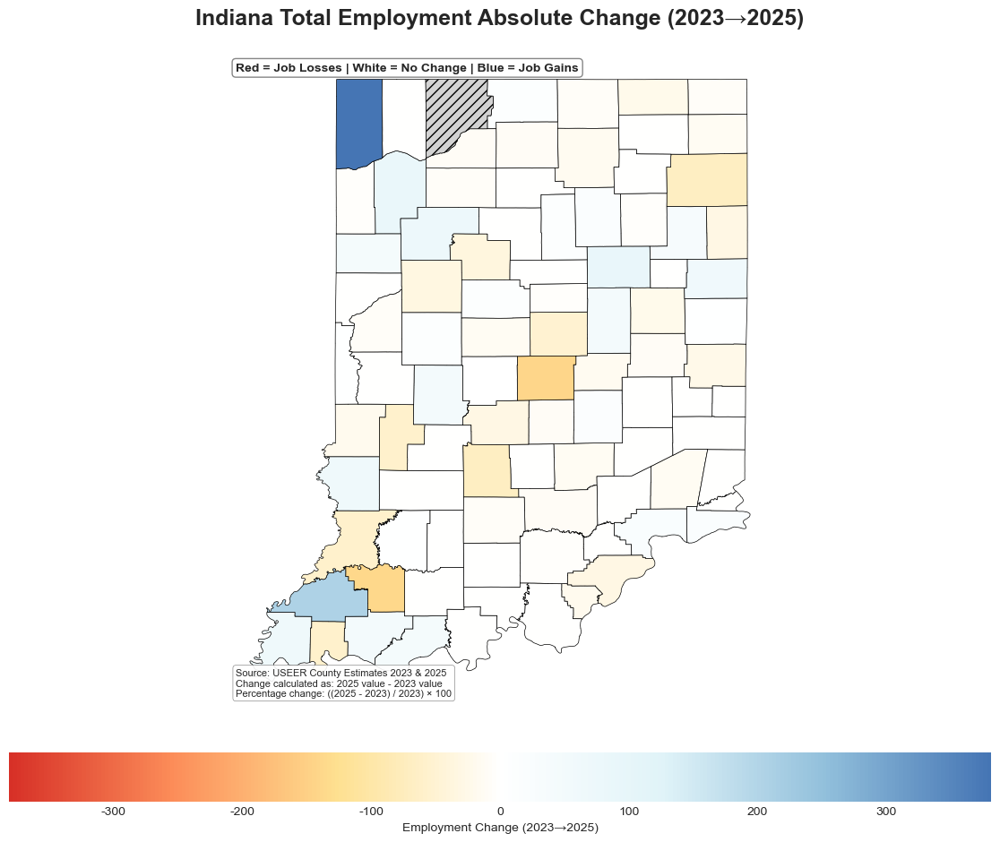

     Saved: Goal4_IN_Total_Percent_Change.png


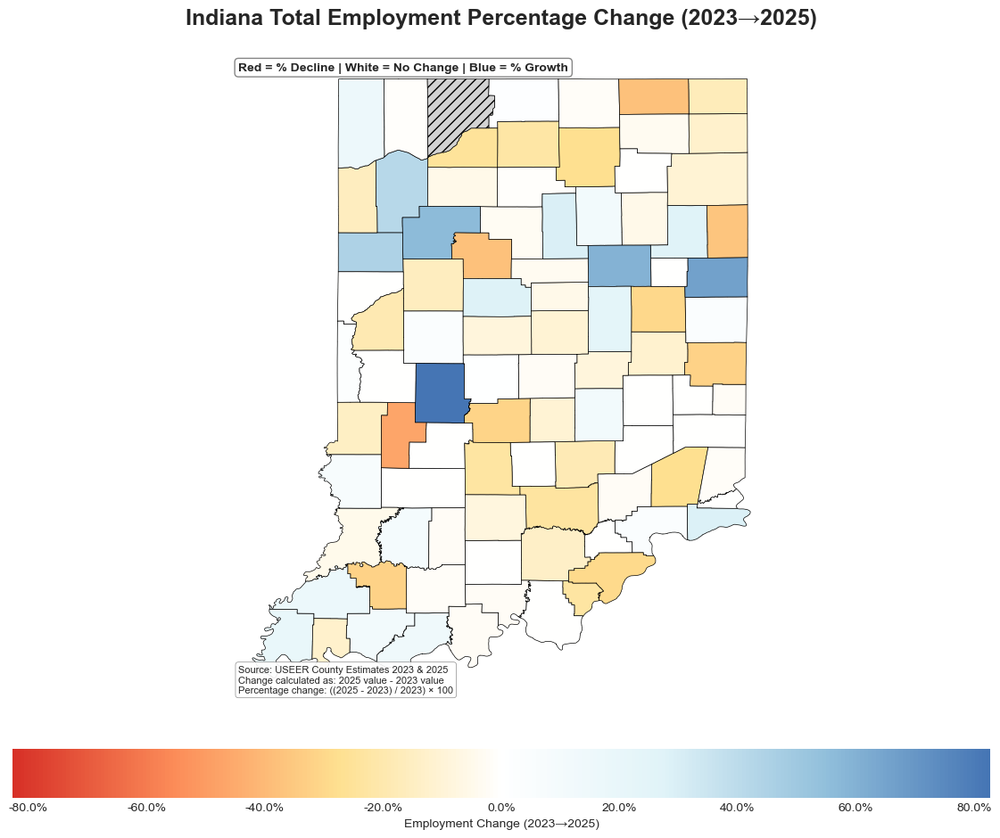

     Saved: Goal4_IN_Renewable_Absolute_Change.png


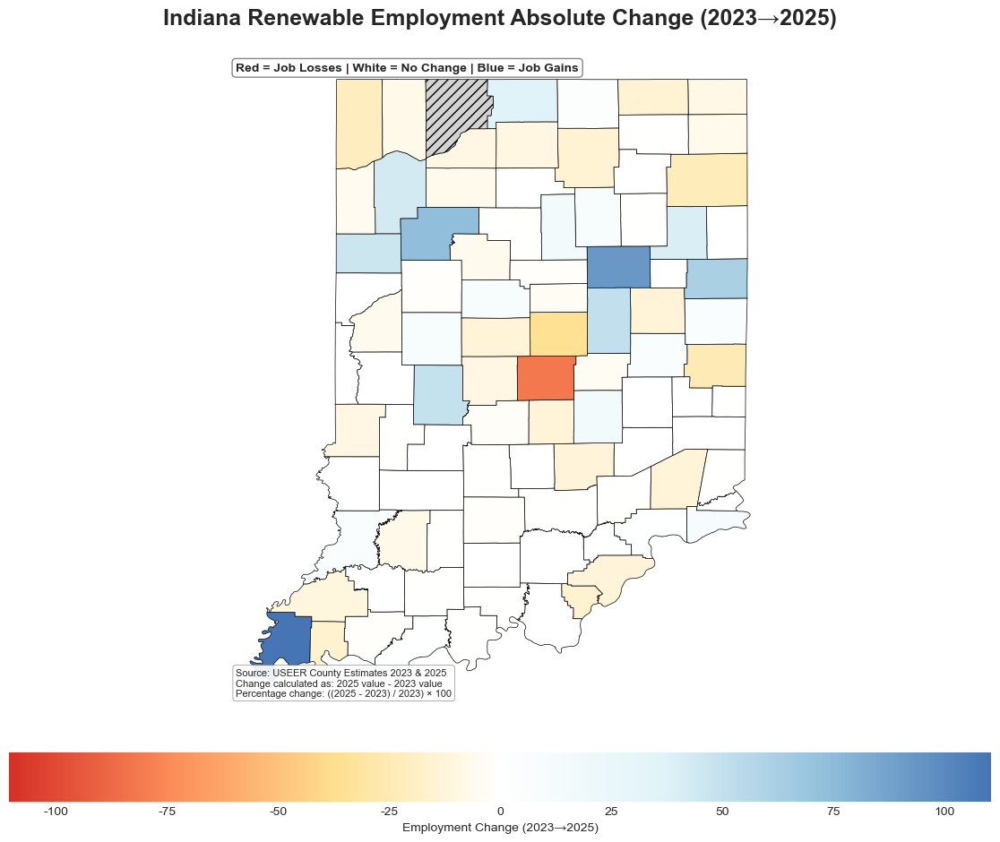

     Saved: Goal4_IN_Renewable_Percent_Change.png


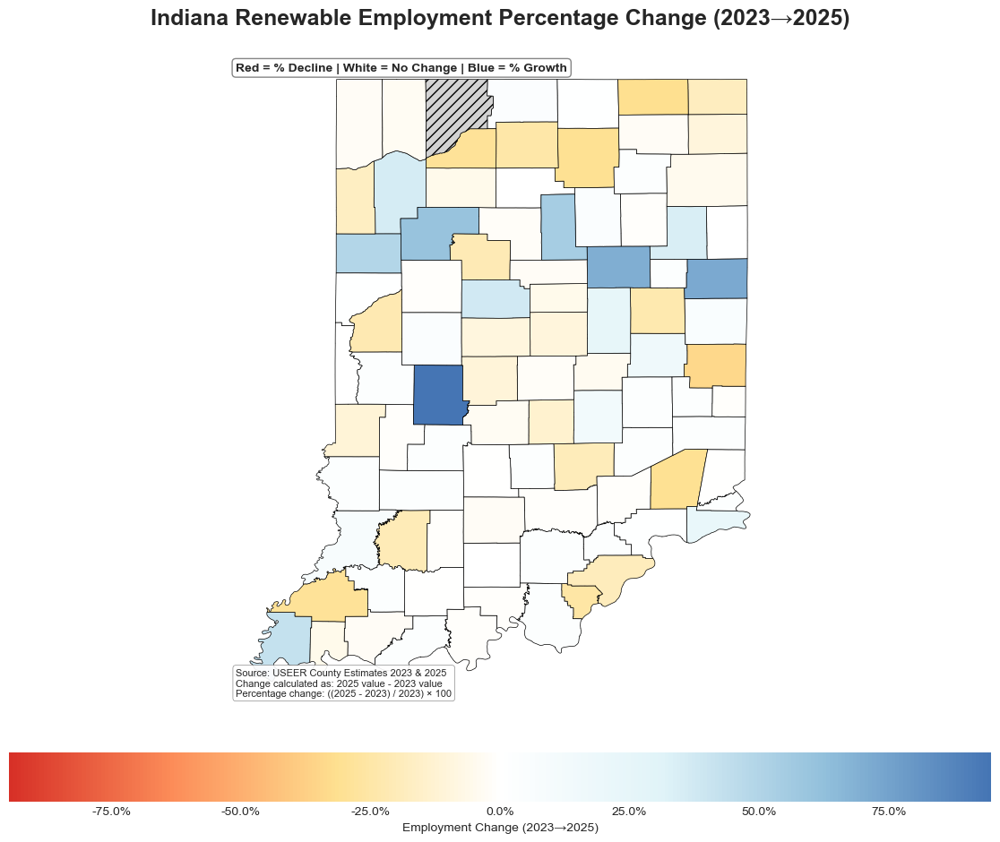

     Saved: Goal4_IN_Fossil_Absolute_Change.png


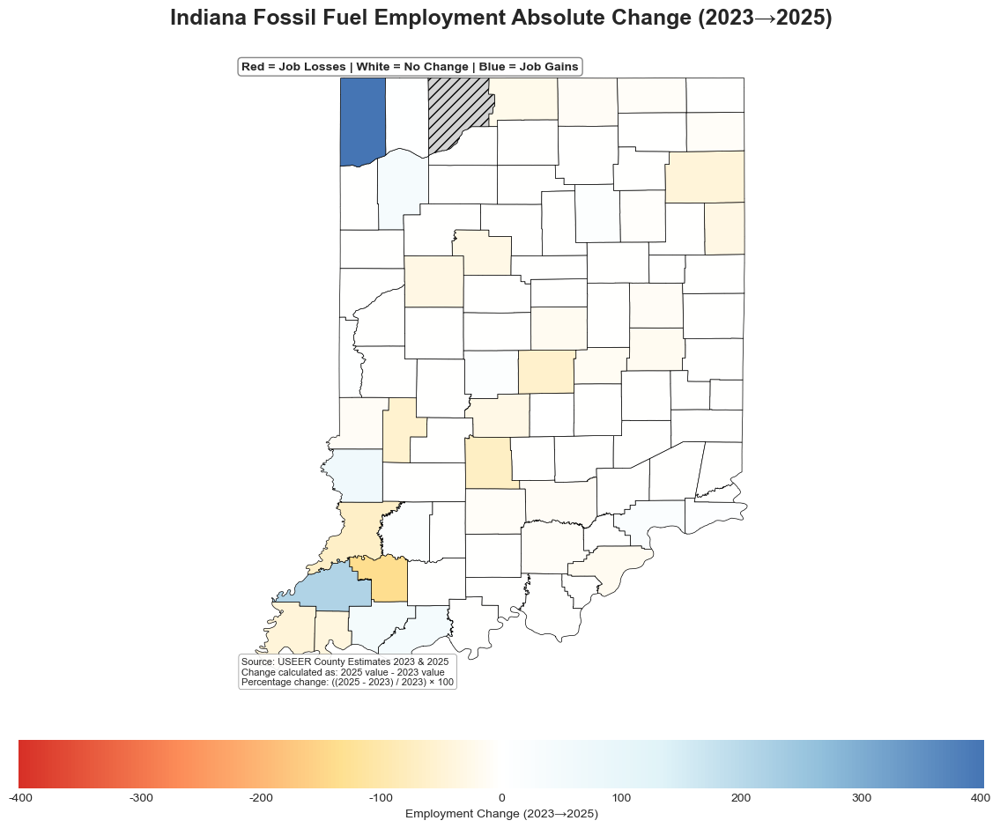

     Saved: Goal4_IN_Fossil_Percent_Change.png


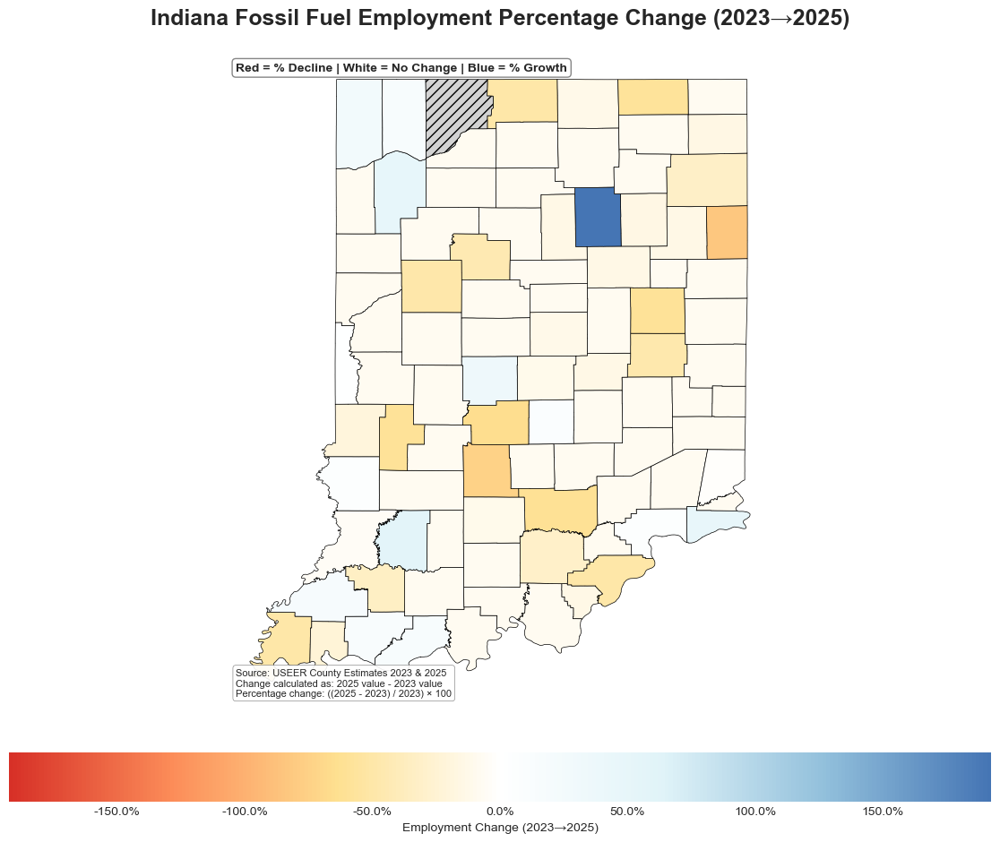

[6/7] All 6 maps created for Indiana
[7/7] INDIANA COMPLETE!

PROCESSING: NEW YORK (NY)
[1/7] Loading New York data...
   Shapefile counties: 62
   Employment records: 62
[2/7] Calculating employment by type...
[3/7] Calculating absolute and percentage changes...
[4/7] Normalizing county names and merging data...
   Matched: 62/62 counties
     Saved: Goal4_NY_Total_Absolute_Change.png


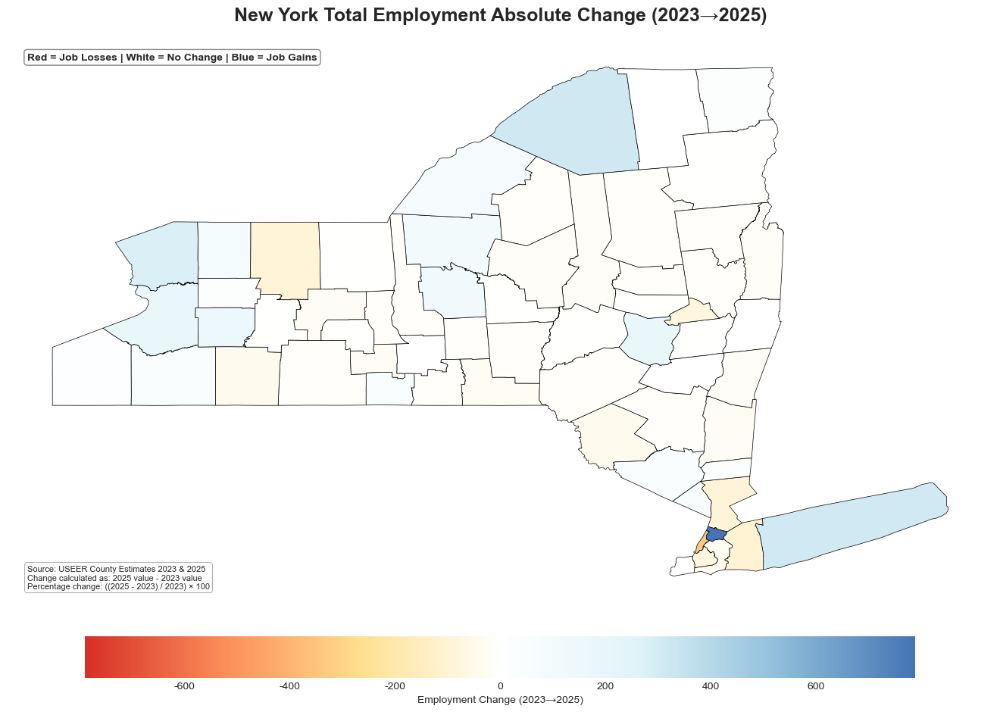

     Saved: Goal4_NY_Total_Percent_Change.png


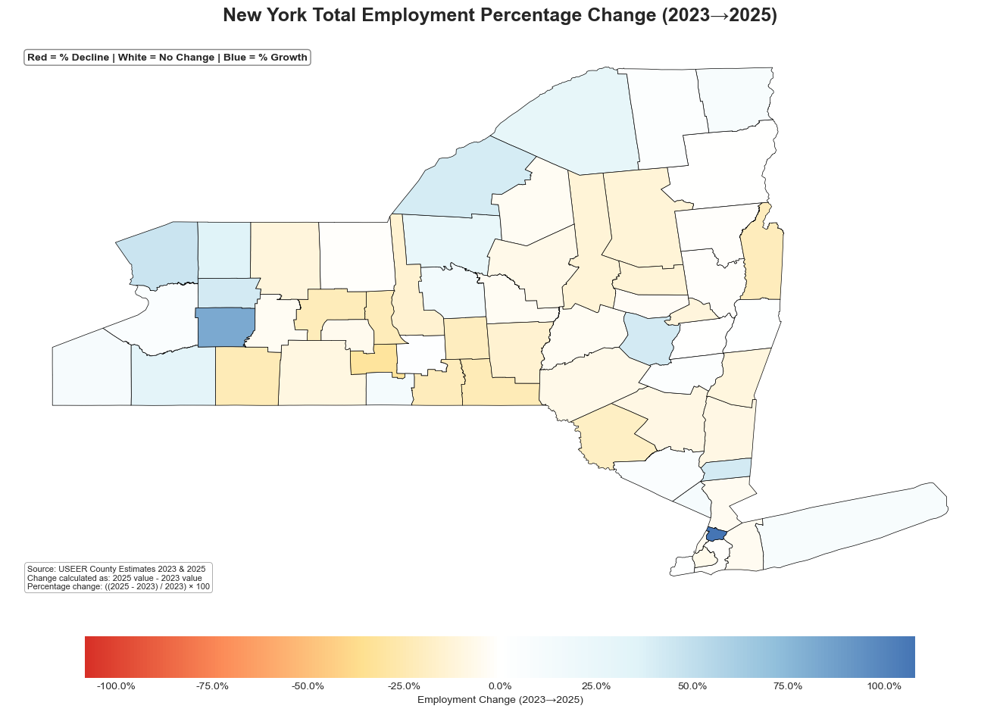

     Saved: Goal4_NY_Renewable_Absolute_Change.png


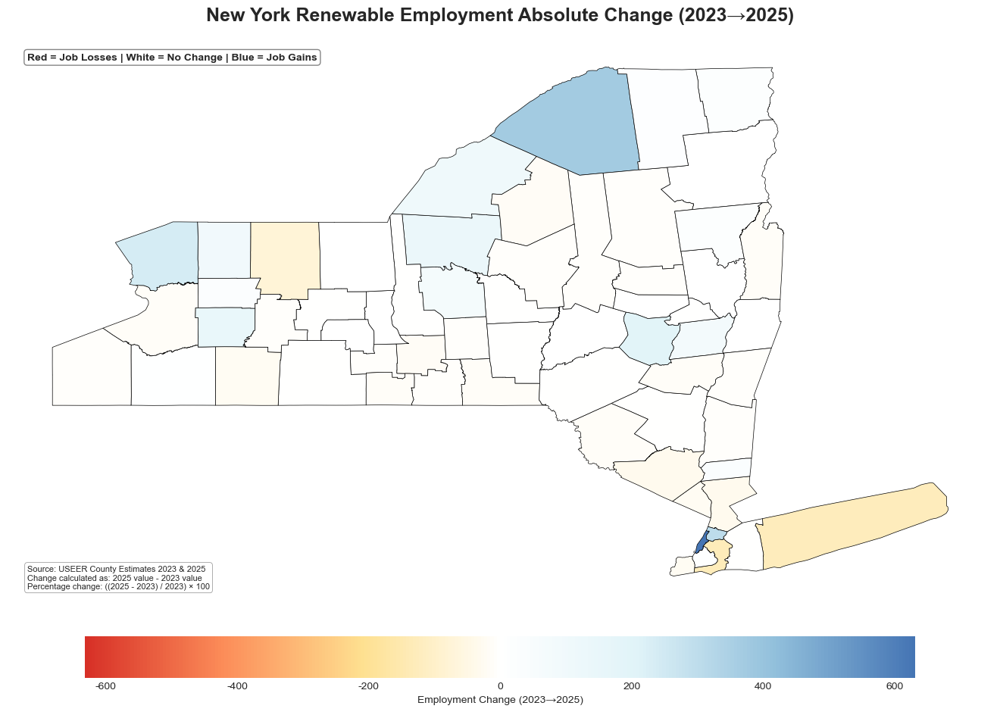

     Saved: Goal4_NY_Renewable_Percent_Change.png


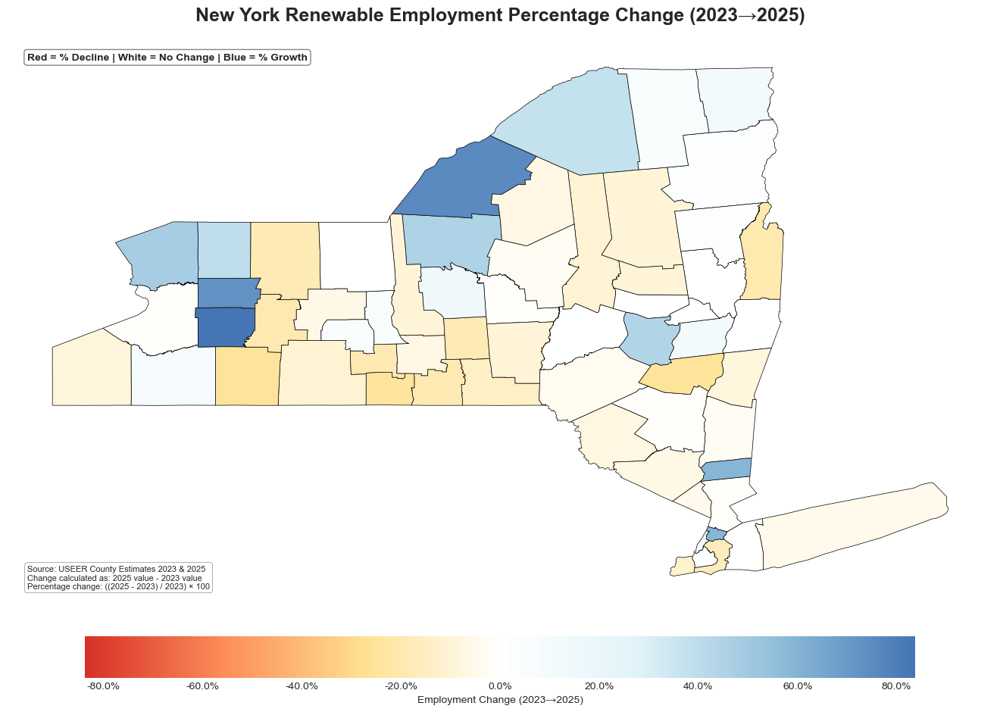

     Saved: Goal4_NY_Fossil_Absolute_Change.png


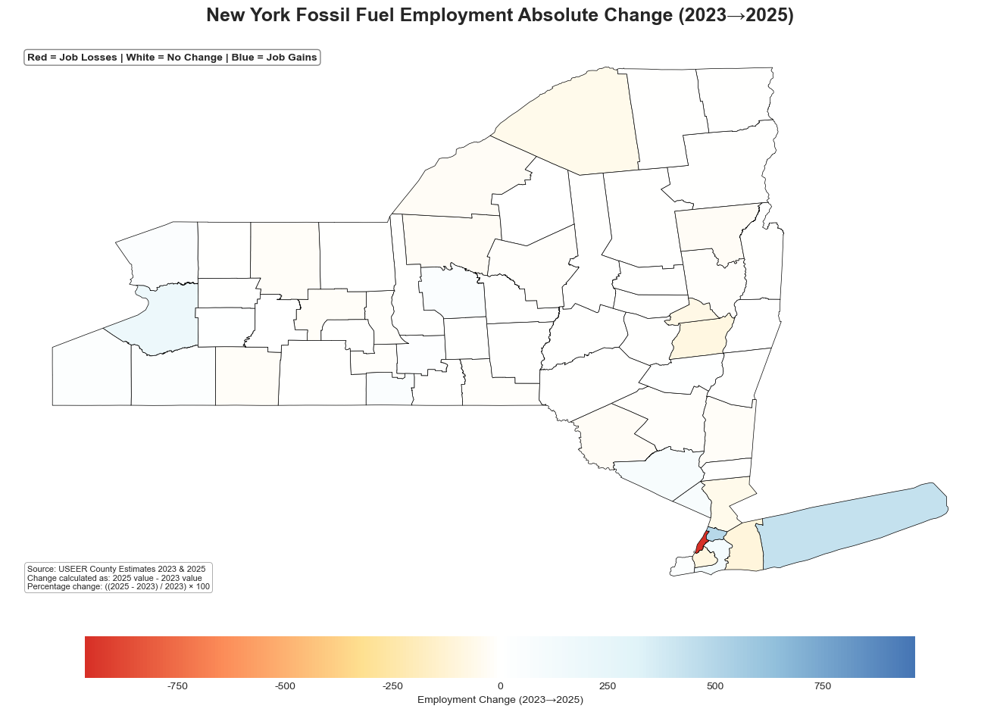

     Saved: Goal4_NY_Fossil_Percent_Change.png


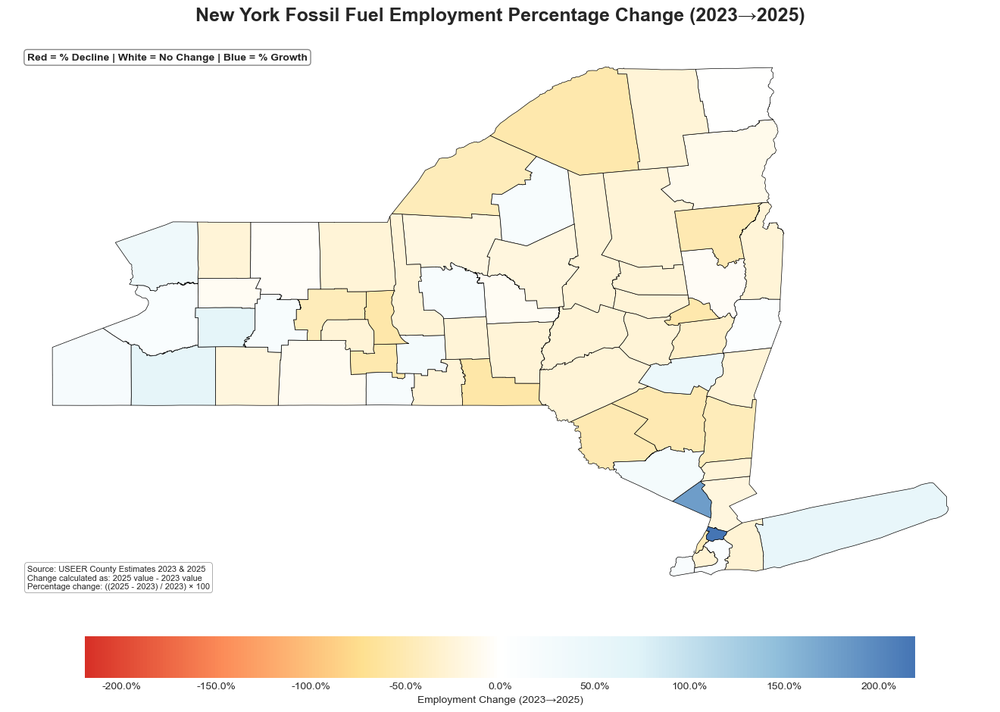

[6/7] All 6 maps created for New York
[7/7] NEW YORK COMPLETE!

PROCESSING: CALIFORNIA (CA)
[1/7] Loading California data...
   Shapefile counties: 58
   Employment records: 58
[2/7] Calculating employment by type...
[3/7] Calculating absolute and percentage changes...
[4/7] Normalizing county names and merging data...
   Matched: 58/58 counties
     Saved: Goal4_CA_Total_Absolute_Change.png


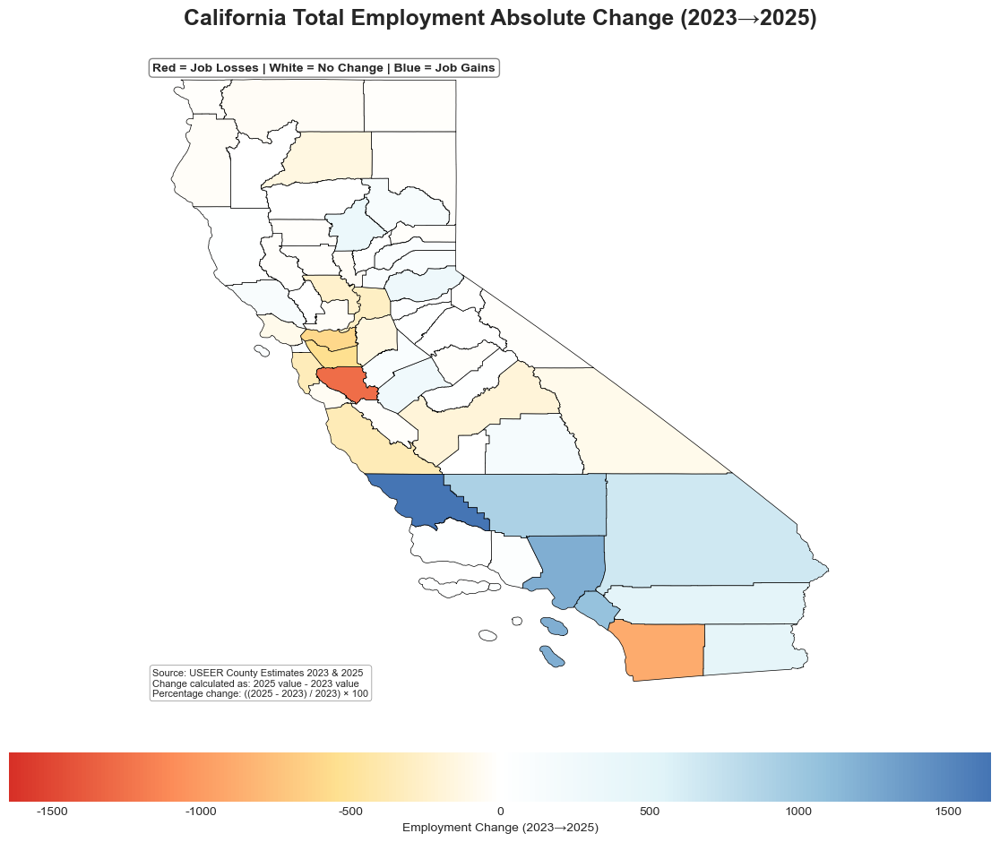

     Saved: Goal4_CA_Total_Percent_Change.png


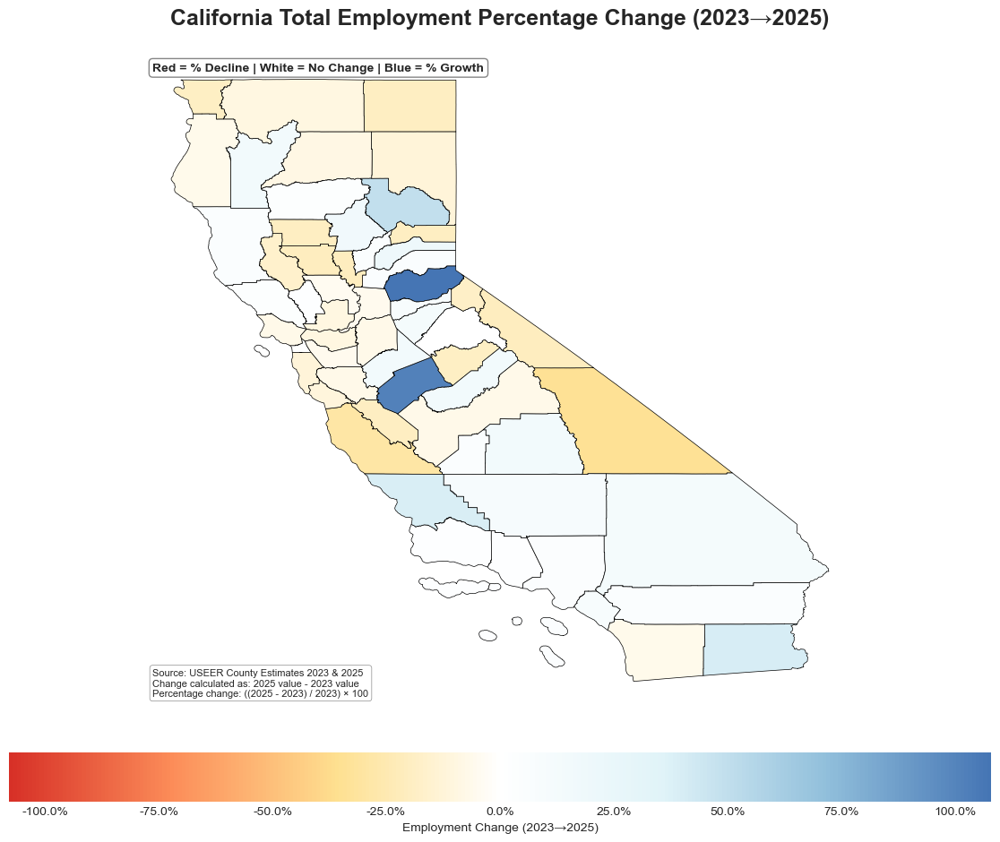

     Saved: Goal4_CA_Renewable_Absolute_Change.png


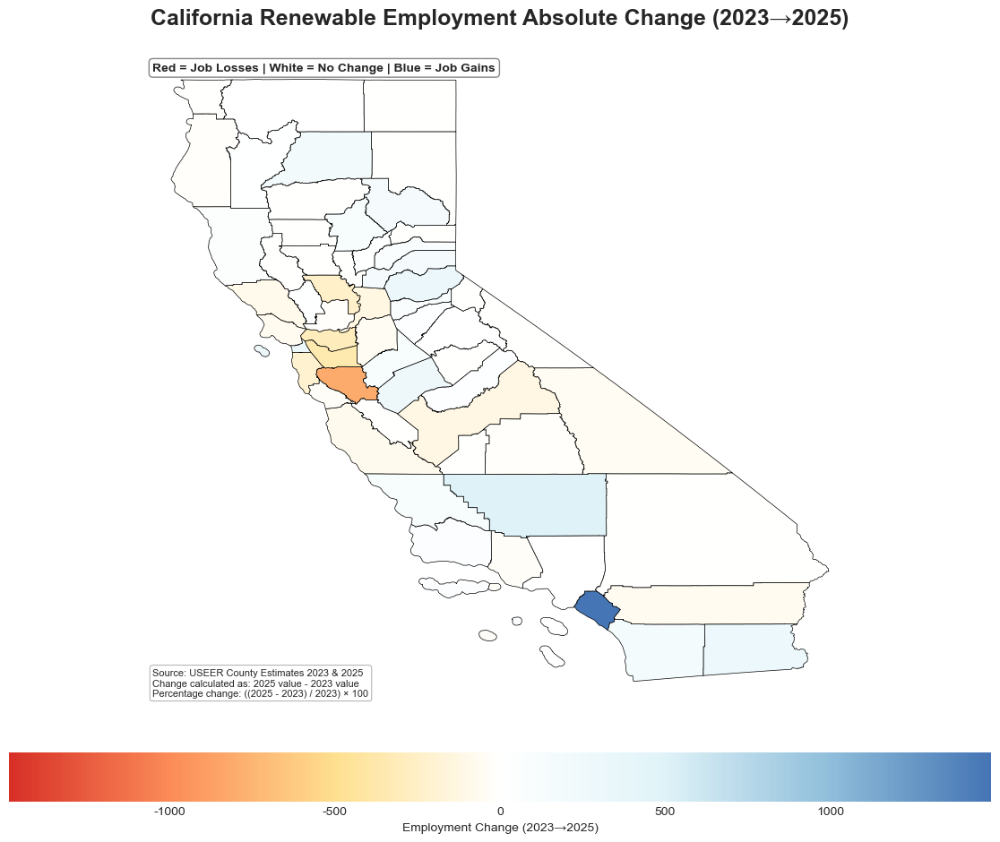

     Saved: Goal4_CA_Renewable_Percent_Change.png


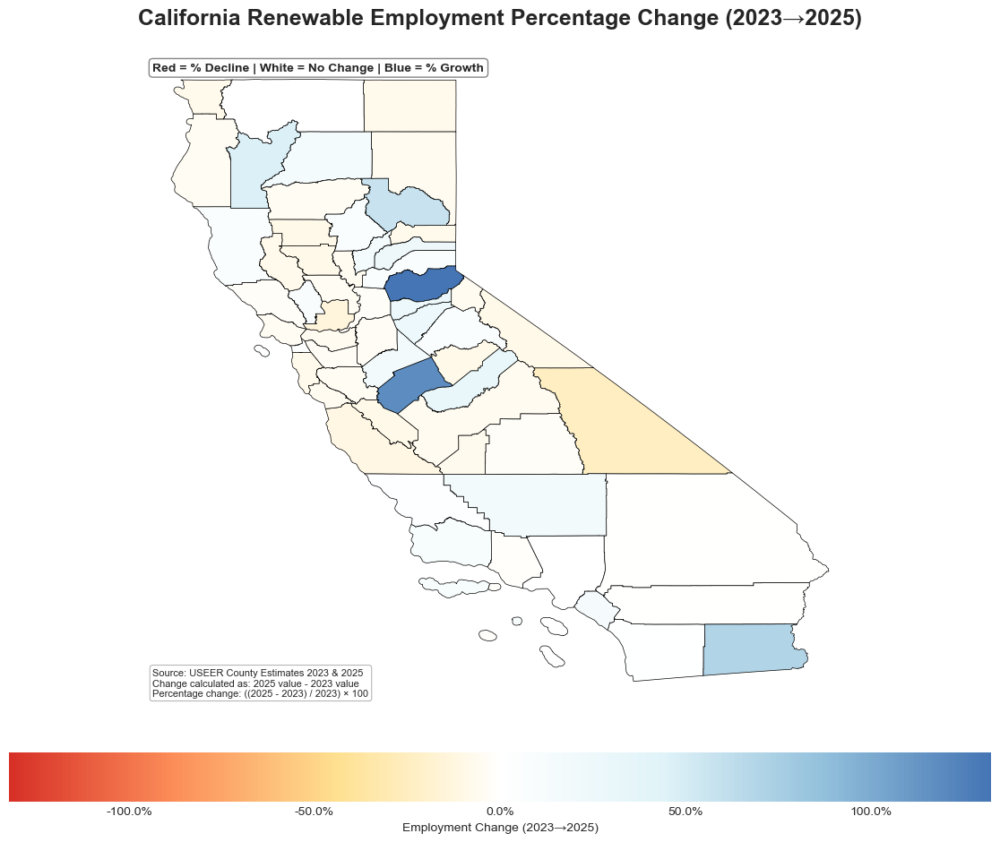

     Saved: Goal4_CA_Fossil_Absolute_Change.png


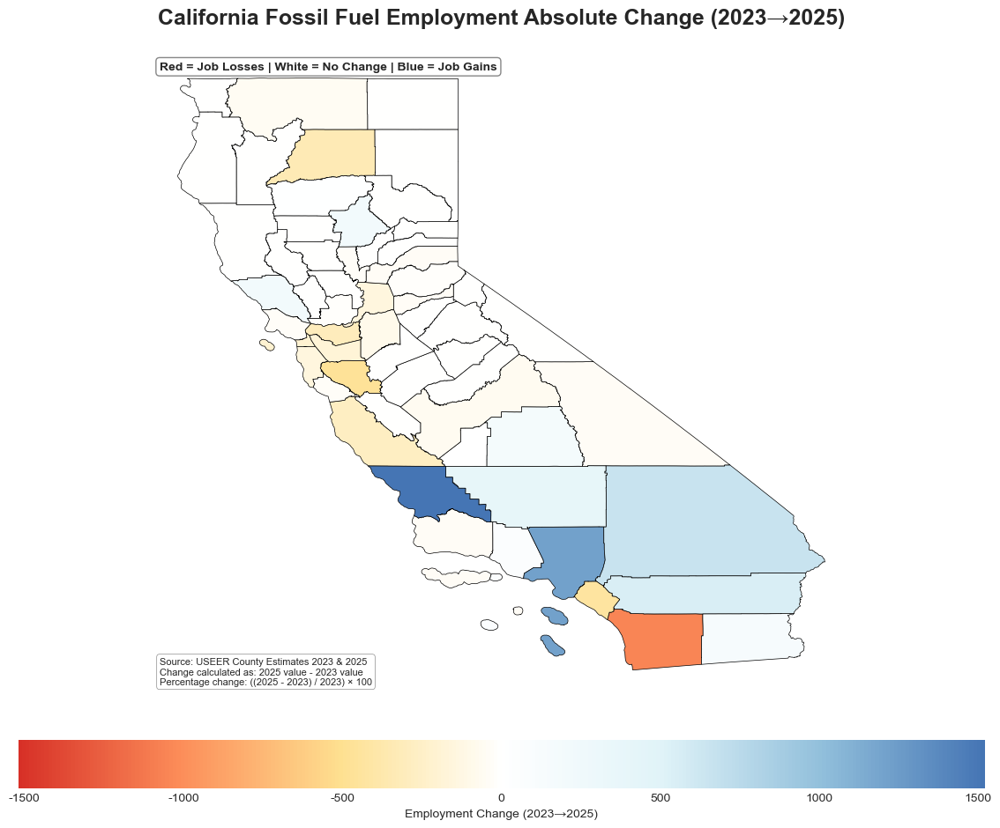

     Saved: Goal4_CA_Fossil_Percent_Change.png


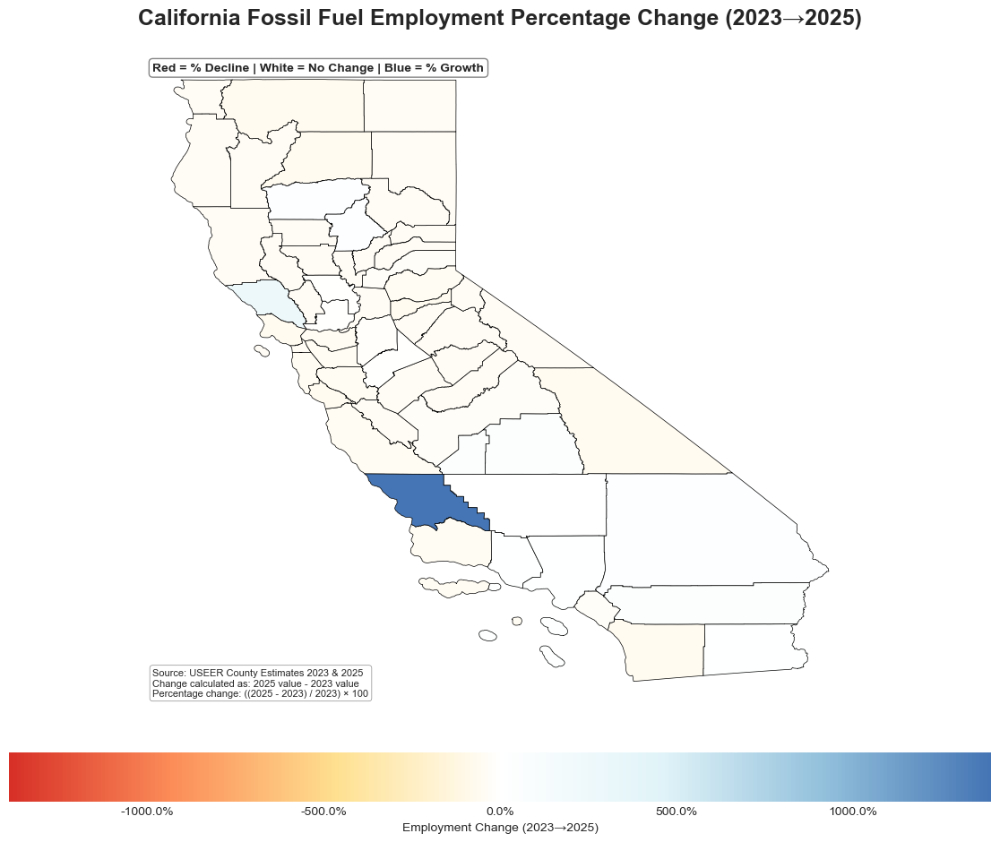

[6/7] All 6 maps created for California
[7/7] CALIFORNIA COMPLETE!

PROCESSING: TEXAS (TX)
[1/7] Loading Texas data...
   Shapefile counties: 254
   Employment records: 254
[2/7] Calculating employment by type...
[3/7] Calculating absolute and percentage changes...
[4/7] Normalizing county names and merging data...
   Matched: 254/254 counties
     Saved: Goal4_TX_Total_Absolute_Change.png


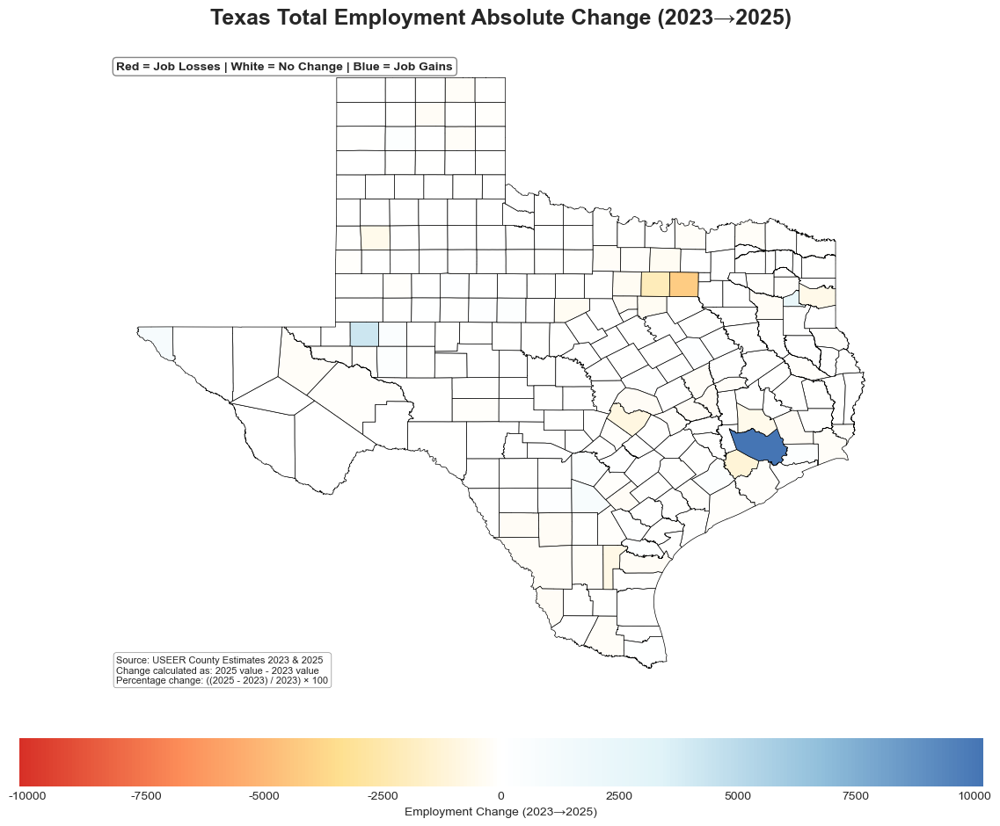

     Saved: Goal4_TX_Total_Percent_Change.png


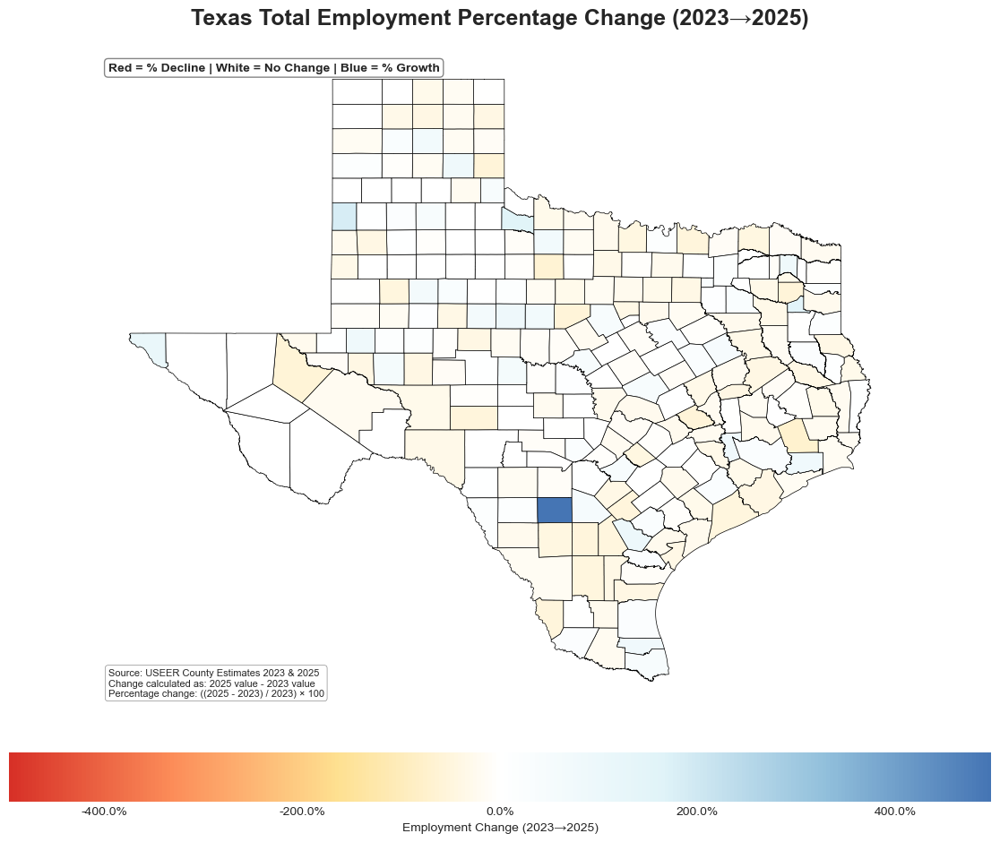

     Saved: Goal4_TX_Renewable_Absolute_Change.png


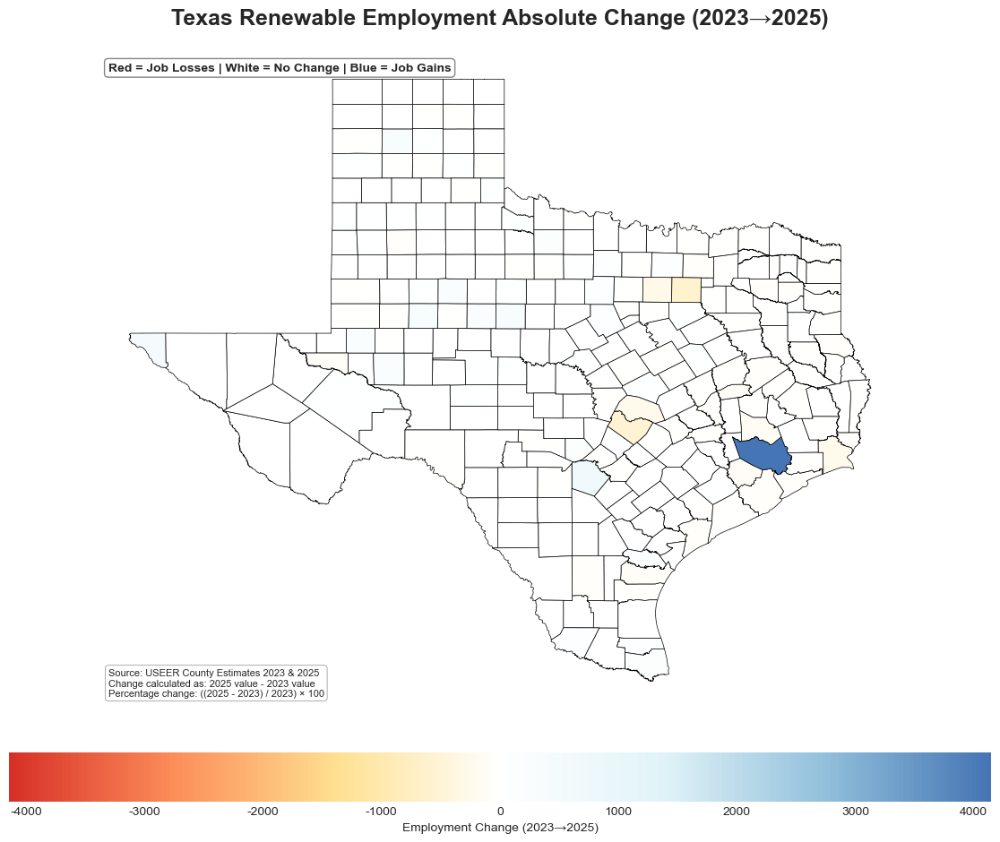

     Saved: Goal4_TX_Renewable_Percent_Change.png


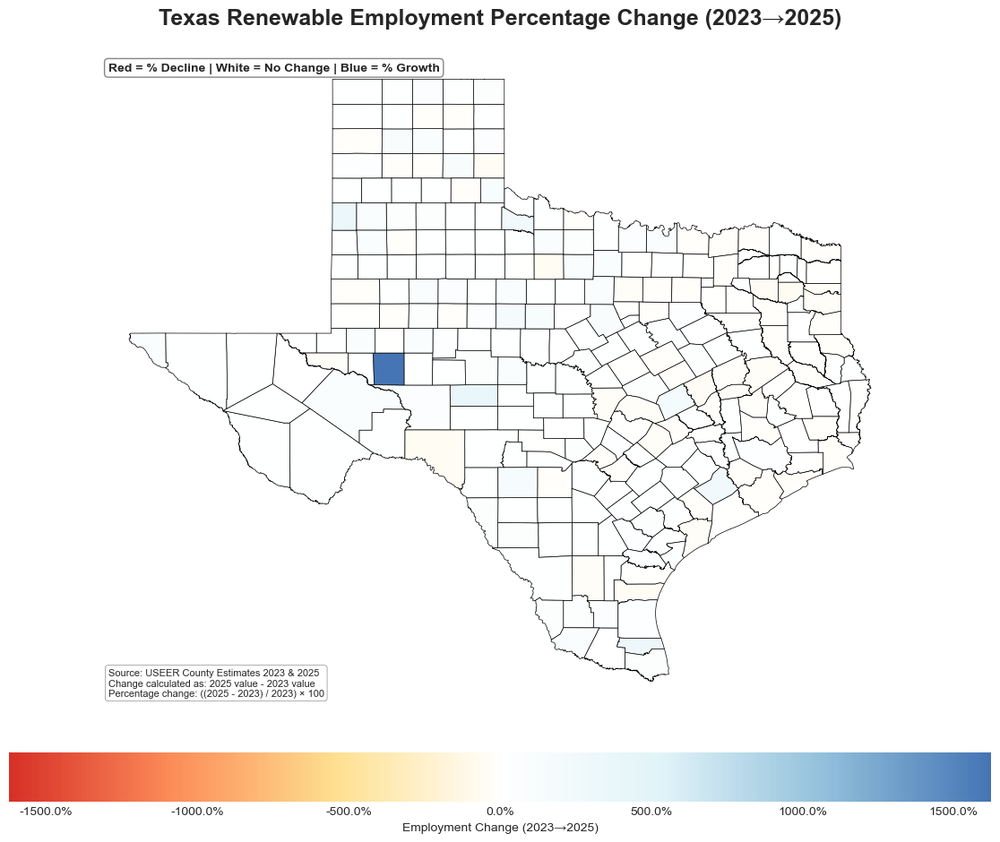

     Saved: Goal4_TX_Fossil_Absolute_Change.png


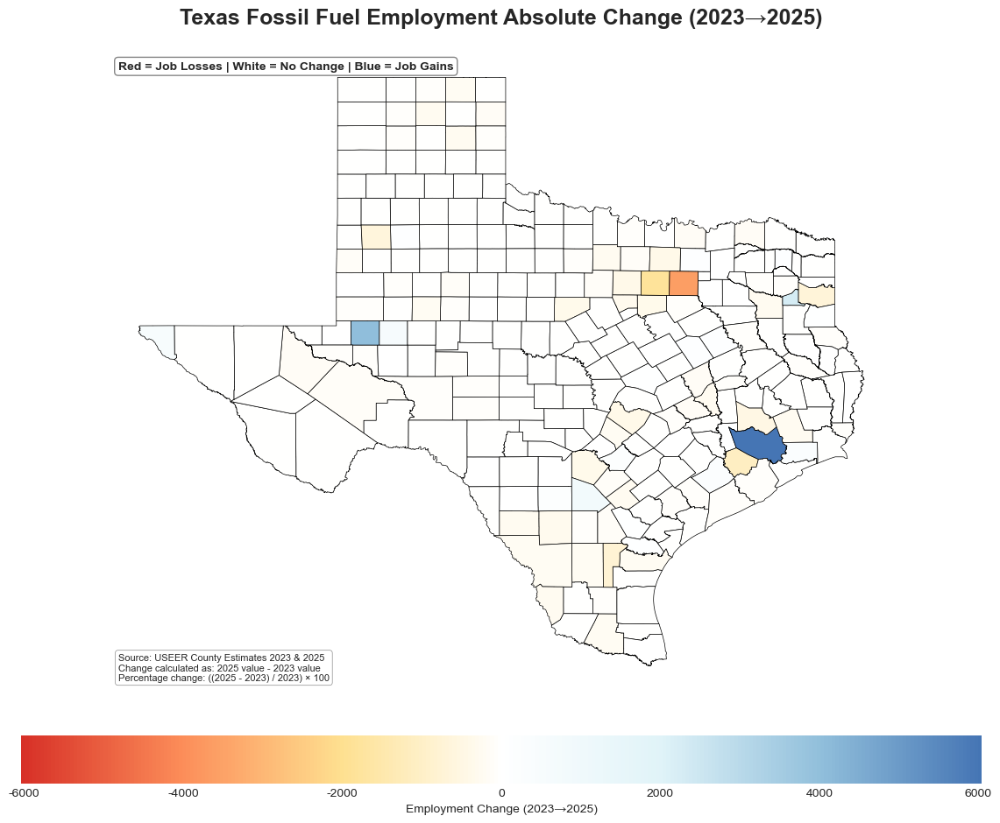

     Saved: Goal4_TX_Fossil_Percent_Change.png


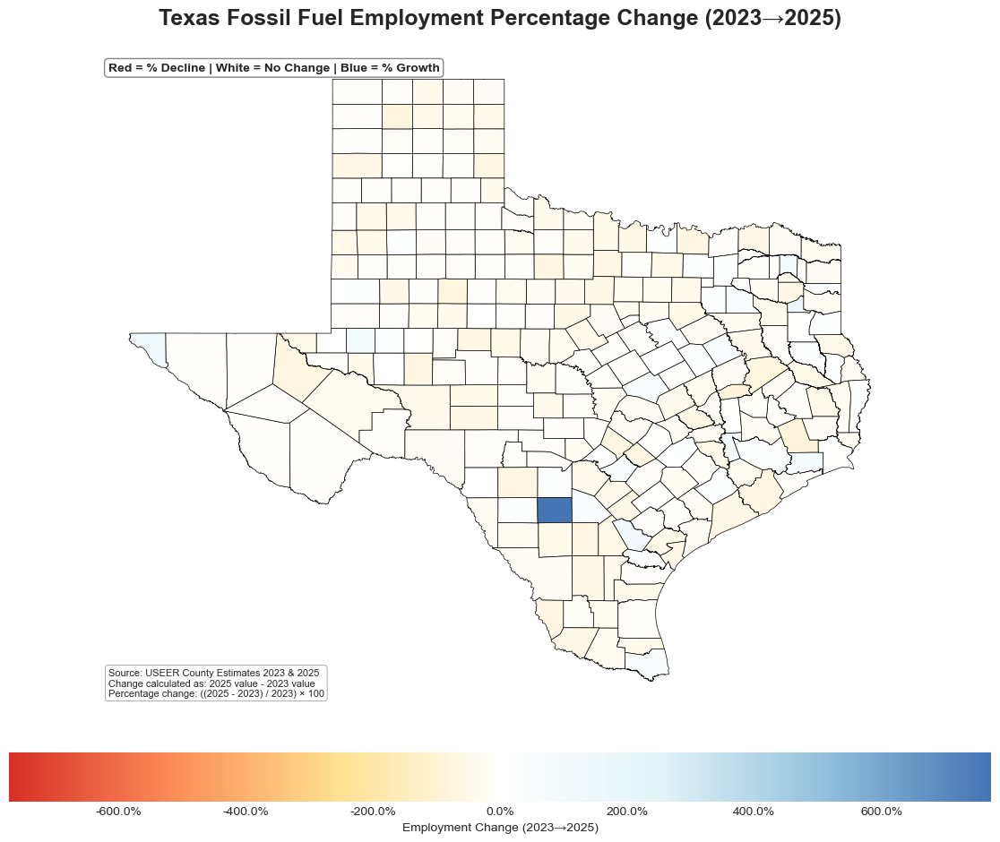

[6/7] All 6 maps created for Texas
[7/7] TEXAS COMPLETE!

CREATING FIVE-STATE COMPARISON MAP

Five way comparison between the states NC, IN, NY, CA, and TX
Map type: Total Employment Percentage Change (2025 vs 2023)

[1/3] Calculating global color scale...
   Global color scale: -89.7% to 89.7%
[2/3] Creating individual state maps...
   Processing North Carolina...
   Processing Indiana...
   Processing New York...
   Processing California...
   Processing Texas...
[3/3] Saving comparison map...
   Saved: Goal4_Five_State_Comparison_Total_Percent_Change.png


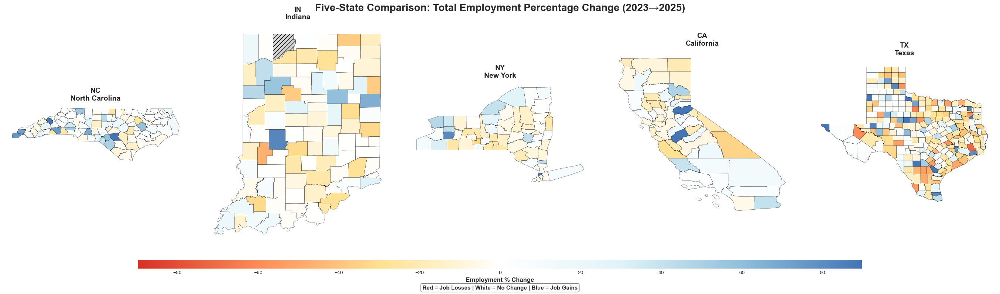


All maps stored in final_image10!

GOAL 4 MULTI-STATE ANALYSIS COMPLETE!

Generated files:
  - 24 individual state maps (6 maps × 4 states)
  - 1 five-state comparison map
  Total: 25 high-resolution maps

All maps saved to current directory with 300 DPI resolution.



In [134]:
# GOAL 4: COMPLETE STATE-BY-STATE EMPLOYMENT CHANGE ANALYSIS
# ============================================================================
# Creates 6 maps per state (IN, NY, CA, TX) showing:
# 1. Total Employment Absolute Change (2023->2025)
# 2. Total Employment Percentage Change (2023->2025)
# 3. Renewable Employment Absolute Change (2023->2025)
# 4. Renewable Employment Percentage Change (2023->2025)
# 5. Fossil Employment Absolute Change (2023->2025)
# 6. Fossil Employment Percentage Change (2023->2025)
#
# Plus final 5-way comparison map (NC, IN, NY, CA, TX) showing Total % Change
# ============================================================================

from matplotlib.colors import LinearSegmentedColormap

print("GOAL 4: MULTI-STATE EMPLOYMENT CHANGE ANALYSIS (2023-2025)")
print("=" * 80)

# CONFIGURATION

# State configurations: State name, abbreviation, FIPS code
STATES_CONFIG = {
    'NC': {'name': 'North Carolina', 'fips': '37', 'processed': True},  # Already done
    'IN': {'name': 'Indiana', 'fips': '18', 'processed': False},
    'NY': {'name': 'New York', 'fips': '36', 'processed': False},
    'CA': {'name': 'California', 'fips': '06', 'processed': False},
    'TX': {'name': 'Texas', 'fips': '48', 'processed': False}
}

# Category groupings (already defined in your notebook)
RENEWABLE_CATEGORIES = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'Woody Biomass', 'Corn Ethanol'
]

FOSSIL_CATEGORIES = [
    'EPG - Coal', 'Fuels - Coal',
    'EPG - Natural Gas', 'Fuels - Natural Gas',
    'Oil & Other FF'
]

ALL_CATEGORIES = RENEWABLE_CATEGORIES + FOSSIL_CATEGORIES

# HELPER FUNCTIONS

def normalize_county_name(name):
    """
    Normalize county names for consistent matching.
    Examples: 'Alamance County' -> 'alamance', 'ALAMANCE' -> 'alamance'
    """
    if pd.isna(name):
        return name
    name = str(name).lower().strip()
    name = name.replace(' county', '')
    return name.strip()


def calculate_employment_by_type(df, categories, year_suffix):
    """
    Calculate total employment for specified categories in a given year.
    
    Parameters:
    - df: DataFrame with employment data
    - categories: List of category names (e.g., RENEWABLE_CATEGORIES)
    - year_suffix: Year suffix like '2023' or '2025'
    
    Returns:
    - Series with total employment for those categories
    """
    category_cols = [f'{cat}_{year_suffix}' for cat in categories 
                     if f'{cat}_{year_suffix}' in df.columns]
    
    if not category_cols:
        return pd.Series(0, index=df.index)
    
    return df[category_cols].sum(axis=1)


def create_diverging_colormap():
    """
    Create a diverging colormap for change visualization:
    - Red (negative) -> White (zero) -> Green (positive)
    """
    colors = ['#d73027', '#fc8d59', '#fee090', '#ffffff', 
              '#e0f3f8', '#91bfdb', '#4575b4']
    return LinearSegmentedColormap.from_list('change', colors)


def create_change_map(state_abbrev, state_name, map_data, value_column, 
                      title, output_filename, is_percentage=False, vmin=None, vmax=None):
    """
    Create a choropleth map showing employment change.
    
    Parameters:
    - state_abbrev: Two-letter state code (e.g., 'IN')
    - state_name: Full state name (e.g., 'Indiana')
    - map_data: GeoDataFrame with merged geographic and employment data
    - value_column: Column name to visualize
    - title: Map title
    - output_filename: Output filename (without extension)
    - is_percentage: If True, format as percentage; else as absolute numbers
    - vmin, vmax: Manual color scale bounds (optional)
    """
    
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))
    
    # Determine color scale bounds
    if vmin is None or vmax is None:
        abs_max = map_data[value_column].abs().max()
        vmin = -abs_max
        vmax = abs_max
    
    # Create map
    map_data.plot(
        column=value_column,
        cmap=create_diverging_colormap(),
        legend=True,
        vmin=vmin,
        vmax=vmax,
        legend_kwds={
            'label': f"Employment Change ({title.split('(')[1].split(')')[0]})",
            'orientation': "horizontal",
            'shrink': 0.8,
            'pad': 0.05,
            'format': '%.1f%%' if is_percentage else '%.0f'
        },
        edgecolor='black',
        linewidth=0.5,
        ax=ax,
        missing_kwds={
            'color': 'lightgrey',
            'edgecolor': 'black',
            'hatch': '///',
            'label': 'No Data'
        }
    )
    
    ax.set_title(title, fontsize=18, fontweight='bold', pad=20)
    ax.axis('off')
    ax.set_aspect('equal')
    
    # Add color interpretation guide
    guide_text = (
        'Red = Job Losses | White = No Change | Blue = Job Gains'
        if not is_percentage else
        'Red = % Decline | White = No Change | Blue = % Growth'
    )
    
    ax.text(0.02, 0.98, guide_text,
            transform=ax.transAxes,
            fontsize=10, 
            fontweight='bold',
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.95, 
                     edgecolor='gray', linewidth=1.0))
    
    # Source annotation
    ax.text(0.02, 0.02,
            'Source: USEER County Estimates 2023 & 2025\n'
            'Change calculated as: 2025 value - 2023 value\n'
            f'Percentage change: ((2025 - 2023) / 2023) × 100',
            transform=ax.transAxes,
            fontsize=8,
            verticalalignment='bottom',
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9,
                     edgecolor='gray', linewidth=0.5))
    
    plt.tight_layout()
    
    # Save outputs
    output_path_high = f'{output_filename}.png'
    plt.savefig(output_path_high, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"     Saved: {output_path_high}")
    
    plt.show()

    # ✅ Just return the fig we created at the top
    return fig


def process_state(state_abbrev, state_config, county_trends, focus_counties):
    """
    Process a single state: calculate changes and create all 6 maps.
    
    Parameters:
    - state_abbrev: Two-letter state code (e.g., 'IN')
    - state_config: Dictionary with state info (name, fips)
    - county_trends: Full county trends DataFrame
    - focus_counties: GeoDataFrame with all focus state counties
    """
    
    state_name = state_config['name']
    state_fips = state_config['fips']
    
    print(f"\n{'=' * 80}")
    print(f"PROCESSING: {state_name.upper()} ({state_abbrev})")
    print(f"{'=' * 80}")
    
    # Filter data for this state
    print(f"[1/7] Loading {state_name} data...")
    state_counties = focus_counties[focus_counties['STATEFP'] == state_fips].copy()
    state_employment = county_trends[county_trends['State'] == state_abbrev].copy()
    
    print(f"   Shapefile counties: {len(state_counties)}")
    print(f"   Employment records: {len(state_employment)}")
    
    # Calculate employment totals for each category group
    print(f"[2/7] Calculating employment by type...")
    
    # Total employment
    state_employment['Total_2023'] = calculate_employment_by_type(
        state_employment, ALL_CATEGORIES, '2023')
    state_employment['Total_2025'] = calculate_employment_by_type(
        state_employment, ALL_CATEGORIES, '2025')
    
    # Renewable employment
    state_employment['Renewable_2023'] = calculate_employment_by_type(
        state_employment, RENEWABLE_CATEGORIES, '2023')
    state_employment['Renewable_2025'] = calculate_employment_by_type(
        state_employment, RENEWABLE_CATEGORIES, '2025')
    
    # Fossil employment
    state_employment['Fossil_2023'] = calculate_employment_by_type(
        state_employment, FOSSIL_CATEGORIES, '2023')
    state_employment['Fossil_2025'] = calculate_employment_by_type(
        state_employment, FOSSIL_CATEGORIES, '2025')
    
    # Calculate changes
    print(f"[3/7] Calculating absolute and percentage changes...")
    
    # Total changes
    state_employment['Total_Absolute_Change'] = (
        state_employment['Total_2025'] - state_employment['Total_2023'])
    state_employment['Total_Percent_Change'] = (
        (state_employment['Total_2025'] - state_employment['Total_2023']) / 
        state_employment['Total_2023'].replace(0, np.nan) * 100
    )
    
    # Renewable changes
    state_employment['Renewable_Absolute_Change'] = (
        state_employment['Renewable_2025'] - state_employment['Renewable_2023'])
    state_employment['Renewable_Percent_Change'] = (
        (state_employment['Renewable_2025'] - state_employment['Renewable_2023']) / 
        state_employment['Renewable_2023'].replace(0, np.nan) * 100
    )
    
    # Fossil changes
    state_employment['Fossil_Absolute_Change'] = (
        state_employment['Fossil_2025'] - state_employment['Fossil_2023'])
    state_employment['Fossil_Percent_Change'] = (
        (state_employment['Fossil_2025'] - state_employment['Fossil_2023']) / 
        state_employment['Fossil_2023'].replace(0, np.nan) * 100
    )
    
    # Normalize county names and merge
    print(f"[4/7] Normalizing county names and merging data...")
    state_employment['County_Normalized'] = state_employment['County Name'].apply(
        normalize_county_name)
    state_counties['NAME_Normalized'] = state_counties['NAME'].apply(
        normalize_county_name)
    
    state_map_data = state_counties.merge(
        state_employment[[
            'County_Normalized', 'County Name',
            'Total_Absolute_Change', 'Total_Percent_Change',
            'Renewable_Absolute_Change', 'Renewable_Percent_Change',
            'Fossil_Absolute_Change', 'Fossil_Percent_Change'
        ]],
        left_on='NAME_Normalized',
        right_on='County_Normalized',
        how='left'
    )
    
    # Verify merge
    counties_with_data = state_map_data['Total_Absolute_Change'].notna().sum()
    print(f"   Matched: {counties_with_data}/{len(state_counties)} counties")
    
    # [5/7] Creating maps...
    figs = []
    
    # Map 1: Total Absolute Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Total_Absolute_Change',
            f'{state_name} Total Employment Absolute Change (2023→2025)',
            f'Goal4_{state_abbrev}_Total_Absolute_Change',
            is_percentage=False
        )
    )
    
    # Map 2: Total Percentage Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Total_Percent_Change',
            f'{state_name} Total Employment Percentage Change (2023→2025)',
            f'Goal4_{state_abbrev}_Total_Percent_Change',
            is_percentage=True
        )
    )
    
    # Map 3: Renewable Absolute Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Renewable_Absolute_Change',
            f'{state_name} Renewable Employment Absolute Change (2023→2025)',
            f'Goal4_{state_abbrev}_Renewable_Absolute_Change',
            is_percentage=False
        )
    )
    
    # Map 4: Renewable Percentage Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Renewable_Percent_Change',
            f'{state_name} Renewable Employment Percentage Change (2023→2025)',
            f'Goal4_{state_abbrev}_Renewable_Percent_Change',
            is_percentage=True
        )
    )
    
    # Map 5: Fossil Absolute Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Fossil_Absolute_Change',
            f'{state_name} Fossil Fuel Employment Absolute Change (2023→2025)',
            f'Goal4_{state_abbrev}_Fossil_Absolute_Change',
            is_percentage=False
        )
    )
    
    # Map 6: Fossil Percentage Change
    figs.append(
        create_change_map(
            state_abbrev, state_name, state_map_data,
            'Fossil_Percent_Change',
            f'{state_name} Fossil Fuel Employment Percentage Change (2023→2025)',
            f'Goal4_{state_abbrev}_Fossil_Percent_Change',
            is_percentage=True
        )
    )
    
    print(f"[6/7] All 6 maps created for {state_name}")
    print(f"[7/7] {state_name.upper()} COMPLETE!")
    
    # ✅ Return the list of 6 figure objects
    return figs



def create_five_state_comparison(county_trends, focus_counties, states_config):
    """
    Create a 5-panel comparison map showing Total Employment % Change
    for NC, IN, NY, CA, and TX side-by-side.
    """
    
    print(f"\n{'=' * 80}")
    print("CREATING FIVE-STATE COMPARISON MAP")
    print(f"{'=' * 80}")
    
    print("\nFive way comparison between the states NC, IN, NY, CA, and TX")
    print("Map type: Total Employment Percentage Change (2025 vs 2023)\n")
    
    # Create figure with 5 subplots
    fig, axes = plt.subplots(1, 5, figsize=(28, 8))
    
    # Determine global color scale across all 5 states
    print("[1/3] Calculating global color scale...")
    all_pct_changes = []
    
    for state_abbrev in ['NC', 'IN', 'NY', 'CA', 'TX']:
        state_config = states_config[state_abbrev]
        state_fips = state_config['fips']
        
        state_counties = focus_counties[focus_counties['STATEFP'] == state_fips].copy()
        state_employment = county_trends[county_trends['State'] == state_abbrev].copy()
        
        state_employment['Total_2023'] = calculate_employment_by_type(
            state_employment, ALL_CATEGORIES, '2023')
        state_employment['Total_2025'] = calculate_employment_by_type(
            state_employment, ALL_CATEGORIES, '2025')
        state_employment['Total_Percent_Change'] = (
            (state_employment['Total_2025'] - state_employment['Total_2023']) / 
            state_employment['Total_2023'].replace(0, np.nan) * 100
        )
        
        all_pct_changes.extend(state_employment['Total_Percent_Change'].dropna().tolist())
    
    abs_max = np.percentile(np.abs(all_pct_changes), 98)  # Use 98th percentile to avoid outliers
    vmin = -abs_max
    vmax = abs_max
    
    print(f"   Global color scale: {vmin:.1f}% to {vmax:.1f}%")
    
    # Create map for each state
    print("[2/3] Creating individual state maps...")
    
    for idx, state_abbrev in enumerate(['NC', 'IN', 'NY', 'CA', 'TX']):
        state_config = states_config[state_abbrev]
        state_name = state_config['name']
        state_fips = state_config['fips']
        
        print(f"   Processing {state_name}...")
        
        # Prepare data
        state_counties = focus_counties[focus_counties['STATEFP'] == state_fips].copy()
        state_employment = county_trends[county_trends['State'] == state_abbrev].copy()
        
        state_employment['Total_2023'] = calculate_employment_by_type(
            state_employment, ALL_CATEGORIES, '2023')
        state_employment['Total_2025'] = calculate_employment_by_type(
            state_employment, ALL_CATEGORIES, '2025')
        state_employment['Total_Percent_Change'] = (
            (state_employment['Total_2025'] - state_employment['Total_2023']) / 
            state_employment['Total_2023'].replace(0, np.nan) * 100
        )
        
        state_employment['County_Normalized'] = state_employment['County Name'].apply(
            normalize_county_name)
        state_counties['NAME_Normalized'] = state_counties['NAME'].apply(
            normalize_county_name)
        
        state_map_data = state_counties.merge(
            state_employment[['County_Normalized', 'Total_Percent_Change']],
            left_on='NAME_Normalized',
            right_on='County_Normalized',
            how='left'
        )
        
        # Plot on subplot
        ax = axes[idx]
        
        state_map_data.plot(
            column='Total_Percent_Change',
            cmap=create_diverging_colormap(),
            vmin=vmin,
            vmax=vmax,
            edgecolor='black',
            linewidth=0.3,
            ax=ax,
            legend=False,
            missing_kwds={
                'color': 'lightgrey',
                'edgecolor': 'black',
                'hatch': '///'
            }
        )
        
        ax.set_title(f'{state_abbrev}\n{state_name}', 
                     fontsize=14, fontweight='bold', pad=10)
        ax.axis('off')
        ax.set_aspect('equal')
    
    # Add overall title
    fig.suptitle('Five-State Comparison: Total Employment Percentage Change (2023→2025)',
                 fontsize=20, fontweight='bold', y=0.98)
    
    # Add unified colorbar
    from matplotlib.cm import ScalarMappable
    from matplotlib.colors import Normalize
    
    norm = Normalize(vmin=vmin, vmax=vmax)
    sm = ScalarMappable(cmap=create_diverging_colormap(), norm=norm)
    sm.set_array([])
    
    cbar_ax = fig.add_axes([0.15, 0.08, 0.7, 0.03])
    cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Employment % Change', fontsize=12, fontweight='bold')
    cbar.ax.tick_params(labelsize=10)
    
    # Add interpretation text
    fig.text(0.5, 0.01, 
             'Red = Job Losses | White = No Change | Blue = Job Gains',
             ha='center', fontsize=11, fontweight='bold',
             bbox=dict(boxstyle='round', facecolor='white', 
                      edgecolor='gray', linewidth=1.0))
    
    plt.subplots_adjust(top=0.92, bottom=0.15, left=0.02, right=0.98, wspace=0.1)
    
    # Save
    print("[3/3] Saving comparison map...")
    output_path = 'Goal4_Five_State_Comparison_Total_Percent_Change.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"   Saved: {output_path}")
    
    plt.show()
    fig = plt.gcf()
    print("\nFIVE-STATE COMPARISON COMPLETE!")
    return fig
    
    

    # Load data
print("\n[LOADING DATA]")
print("  Loading shapefiles...")
focus_counties, other_counties, all_counties = load_optimized_shapefiles()
print(f"   Loaded {len(focus_counties)} counties from focus states")

print("  Loading employment trends...")
county_trends = pd.read_csv('Goal1_County_Trends_2023_2025.csv')
print(f"   Loaded {len(county_trends)} county records")

# 🌟 Master list to store ALL 30 figures
final_image10 = []

# Process each state (skip NC)
for state_abbrev, config in STATES_CONFIG.items():
    if state_abbrev == 'NC':
        continue
    
    figs_for_state = process_state(state_abbrev, config, county_trends, focus_counties)
    final_image10.extend(figs_for_state)

five_state_fig = create_five_state_comparison(county_trends, focus_counties, STATES_CONFIG)
final_image10.append(five_state_fig)

print("\nAll maps stored in final_image10!")


# Final summary
print(f"\n{'=' * 80}")
print("GOAL 4 MULTI-STATE ANALYSIS COMPLETE!")
print(f"{'=' * 80}")
print("\nGenerated files:")
print("  - 24 individual state maps (6 maps × 4 states)")
print("  - 1 five-state comparison map")
print("  Total: 25 high-resolution maps\n")
print("All maps saved to current directory with 300 DPI resolution.")
print(f"{'=' * 80}\n")

# **Now Let's Create A Highly Interactive Map of the USA**

In [61]:
import geopandas as gpd
import pandas as pd
from pathlib import Path
import zipfile
import requests
from io import BytesIO

# CONFIGURATION
# 5 focus states for detailed county-level maps
FOCUS_STATE_FIPS = {
    'NC': '37',  # North Carolina
    'IN': '18',  # Indiana  
    'NY': '36',  # New York
    'CA': '06',  # California
    'TX': '48'   # Texas
}

OUTPUT_DIR = 'shapefiles'

In [62]:
# LOAD FUNCTION (for future sessions)

def load_optimized_shapefiles():
    """
    Load the optimized shapefiles created by download_and_optimize_shapefile().
    
    Use this in future sessions instead of downloading again.
    
    Returns:
    --------
    tuple: (focus_counties_gdf, other_counties_gdf, all_counties_gdf)
    """
    
    focus_path = f"{OUTPUT_DIR}/Goal4_FocusStates_Detailed.shp"
    other_path = f"{OUTPUT_DIR}/Goal4_OtherStates_Simplified.shp"
    
    if not Path(focus_path).exists() or not Path(other_path).exists():
        print(" Optimized shapefiles not found!")
        print(f"   Expected: {focus_path}")
        print(f"   Expected: {other_path}")
        print("\n Run download_and_optimize_shapefile() first")
        return None, None, None
    
    print("  Loading optimized shapefiles...")
    
    focus_counties = gpd.read_file(focus_path)
    other_counties = gpd.read_file(other_path)
    
    all_counties = gpd.GeoDataFrame(
        pd.concat([focus_counties, other_counties], ignore_index=True),
        crs=focus_counties.crs
    )
    
    print(f" Loaded {len(focus_counties)} detailed counties (NC, IN, NY, CA, TX)")
    print(f" Loaded {len(other_counties)} simplified counties (other states)")
    print(f" Combined: {len(all_counties)} total counties")
    
    return focus_counties, other_counties, all_counties

# PART 1: INTERACTIVE EMPLOYMENT MAP
==========================================================================================================

## Development History and AI Collaboration

 AI USAGE NOTE
1. **Interactive HTML/JavaScript Framework**: AI assisted in the Plotly.js implementation

2. **County-Level GeoJSON Integration**: AI guided the approach to embed county boundaries as inline GeoJSON
   rather than external files, solving deployment complexity and ensuring the HTML file is fully standalone.

## Technical Implementation Notes

**Geographic Hierarchy**:
- **National**: Single aggregated value applied uniformly across all states
- **Regional**: Census 4-region system (Northeast, South, Midwest, West) with thick borders
- **State**: Individual state-level values with standard chloropleth coloring
- **County**: Focus on NC, IN, NY, CA, TX with detailed boundaries (mapbox rendering)

**Data Processing Pipeline**:
1. Load Goal 1 county-level employment trends (2023-2025)
2. Normalize county names for reliable shapefile merging
3. Aggregate to renewable/fossil/total employment categories
4. Calculate both absolute and percentage changes
5. Roll up to state, regional, and national levels
6. Generate inline JSON data structures for JavaScript consumption

In [63]:
# ============================================================================
# GOAL 4: INTERACTIVE US EMPLOYMENT MAP
# ============================================================================
# Creates an interactive HTML map with:
# - 4 geographic levels: National, Regional, State, County (5 focus states)
# - 6 employment types: Total/Renewable/Fossil × Absolute/Percentage
# - Dynamic toggles and dropdowns
# - Diverging colormap (red-white-blue for changes)
# ============================================================================

print("GOAL 4: CREATING INTERACTIVE US EMPLOYMENT MAP")
print("=" * 80)

# ============================================================================
# STEP 1: LOAD AND PREPARE DATA
# ============================================================================

print("\n[1/8] Loading data...")

# Load county trends
county_trends = pd.read_csv('Goal1_County_Trends_2023_2025.csv')
print(f"   Loaded {len(county_trends)} county records")

# Load shapefiles
focus_counties, other_counties, all_counties = load_optimized_shapefiles()
print(f"   Loaded {len(all_counties)} total counties")

# Category definitions
RENEWABLE_CATEGORIES = [
    'Solar', 'Wind', 'Hydroelectric', 'Low-Impact Hydroelectric',
    'Woody Biomass', 'Corn Ethanol'
]

FOSSIL_CATEGORIES = [
    'EPG - Coal', 'Fuels - Coal',
    'EPG - Natural Gas', 'Fuels - Natural Gas',
    'Oil & Other FF'
]

ALL_CATEGORIES = RENEWABLE_CATEGORIES + FOSSIL_CATEGORIES

# Focus states configuration
FOCUS_STATES = ['NC', 'IN', 'NY', 'CA', 'TX']
STATE_FIPS = {
    'NC': '37', 'IN': '18', 'NY': '36', 'CA': '06', 'TX': '48'
}

# Census regions mapping
CENSUS_REGIONS = {
    'Northeast': ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NJ', 'NY', 'PA'],
    'Midwest': ['IL', 'IN', 'MI', 'OH', 'WI', 'IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD'],
    'South': ['DE', 'FL', 'GA', 'MD', 'NC', 'SC', 'VA', 'WV', 'AL', 'KY', 'MS', 
              'TN', 'AR', 'LA', 'OK', 'TX', 'DC'],
    'West': ['AZ', 'CO', 'ID', 'MT', 'NV', 'NM', 'UT', 'WY', 'AK', 'CA', 'HI', 'OR', 'WA']
}

# Reverse mapping: state -> region
STATE_TO_REGION = {}
for region, states in CENSUS_REGIONS.items():
    for state in states:
        STATE_TO_REGION[state] = region

# ============================================================================
# STEP 2: HELPER FUNCTIONS
# ============================================================================

def calculate_employment_by_type(df, categories, year_suffix):
    """Calculate total employment for specified categories in a given year."""
    category_cols = [f'{cat}_{year_suffix}' for cat in categories 
                     if f'{cat}_{year_suffix}' in df.columns]
    if not category_cols:
        return pd.Series(0, index=df.index)
    return df[category_cols].sum(axis=1)


def calculate_changes(df):
    """Calculate all employment changes for a dataframe."""
    # Total
    df['Total_2023'] = calculate_employment_by_type(df, ALL_CATEGORIES, '2023')
    df['Total_2025'] = calculate_employment_by_type(df, ALL_CATEGORIES, '2025')
    df['Total_Absolute'] = df['Total_2025'] - df['Total_2023']
    df['Total_Percentage'] = ((df['Total_2025'] - df['Total_2023']) / 
                              df['Total_2023'].replace(0, np.nan) * 100)
    
    # Renewable
    df['Renewable_2023'] = calculate_employment_by_type(df, RENEWABLE_CATEGORIES, '2023')
    df['Renewable_2025'] = calculate_employment_by_type(df, RENEWABLE_CATEGORIES, '2025')
    df['Renewable_Absolute'] = df['Renewable_2025'] - df['Renewable_2023']
    df['Renewable_Percentage'] = ((df['Renewable_2025'] - df['Renewable_2023']) / 
                                  df['Renewable_2023'].replace(0, np.nan) * 100)
    
    # Fossil
    df['Fossil_2023'] = calculate_employment_by_type(df, FOSSIL_CATEGORIES, '2023')
    df['Fossil_2025'] = calculate_employment_by_type(df, FOSSIL_CATEGORIES, '2025')
    df['Fossil_Absolute'] = df['Fossil_2025'] - df['Fossil_2023']
    df['Fossil_Percentage'] = ((df['Fossil_2025'] - df['Fossil_2023']) / 
                               df['Fossil_2023'].replace(0, np.nan) * 100)
    
    return df


def normalize_county_name(name):
    """Normalize county names for matching."""
    if pd.isna(name):
        return name
    name = str(name).lower().strip()
    name = name.replace(' county', '')
    return name.strip()


# ============================================================================
# STEP 3: PREPARE COUNTY-LEVEL DATA (FOCUS STATES ONLY)
# ============================================================================

print("\n[2/8] Preparing county-level data for focus states...")

# Calculate changes for county data
county_trends = calculate_changes(county_trends)

# Filter for focus states only
focus_county_data = county_trends[county_trends['State'].isin(FOCUS_STATES)].copy()

# Normalize county names in the trends table
focus_county_data['County_Normalized'] = focus_county_data['County Name'].apply(normalize_county_name)

# --- NEW: add state abbreviation to the shapefile and normalize names there too ---

# Reverse mapping: FIPS -> state abbreviation (only for your 5 focus states)
FIPS_TO_STATE = {v: k for k, v in STATE_FIPS.items()}

# Keep only focus-state counties in the shapefile (defensive, in case load_optimized_shapefiles
# ever returns more than those 5 states)
focus_counties = focus_counties[focus_counties['STATEFP'].isin(STATE_FIPS.values())].copy()

# Add state abbreviation and normalized county names to the shapefile
focus_counties['State'] = focus_counties['STATEFP'].map(FIPS_TO_STATE)
focus_counties['County_Normalized'] = focus_counties['NAME'].apply(normalize_county_name)

# Merge on BOTH state and normalized county name
county_map_data = focus_counties.merge(
    focus_county_data[[
        'State', 'County_Normalized', 'County Name',
        'Total_Absolute', 'Total_Percentage',
        'Renewable_Absolute', 'Renewable_Percentage',
        'Fossil_Absolute', 'Fossil_Percentage'
    ]],
    on=['State', 'County_Normalized'],
    how='left'
)

# Add FIPS for matching
county_map_data['GEOID'] = county_map_data['GEOID'].astype(str)

print(f"   Prepared {len(county_map_data)} focus state counties")

# ============================================================================
# STEP 4: PREPARE STATE-LEVEL DATA (ALL STATES)
# ============================================================================

print("\n[3/8] Aggregating to state level...")

# Group by state and sum
state_data = county_trends.groupby('State').agg({
    'Total_2023': 'sum',
    'Total_2025': 'sum',
    'Renewable_2023': 'sum',
    'Renewable_2025': 'sum',
    'Fossil_2023': 'sum',
    'Fossil_2025': 'sum'
}).reset_index()

# Calculate changes
state_data['Total_Absolute'] = state_data['Total_2025'] - state_data['Total_2023']
state_data['Total_Percentage'] = ((state_data['Total_2025'] - state_data['Total_2023']) / 
                                   state_data['Total_2023'].replace(0, np.nan) * 100)

state_data['Renewable_Absolute'] = state_data['Renewable_2025'] - state_data['Renewable_2023']
state_data['Renewable_Percentage'] = ((state_data['Renewable_2025'] - state_data['Renewable_2023']) / 
                                       state_data['Renewable_2023'].replace(0, np.nan) * 100)

state_data['Fossil_Absolute'] = state_data['Fossil_2025'] - state_data['Fossil_2023']
state_data['Fossil_Percentage'] = ((state_data['Fossil_2025'] - state_data['Fossil_2023']) / 
                                    state_data['Fossil_2023'].replace(0, np.nan) * 100)

print(f"   Aggregated {len(state_data)} states")

# ============================================================================
# STEP 5: PREPARE REGIONAL DATA (4 CENSUS REGIONS)
# ============================================================================

print("\n[4/8] Aggregating to regional level...")

# Add region to county data
county_trends['Region'] = county_trends['State'].map(STATE_TO_REGION)

# Group by region
regional_data = county_trends.groupby('Region').agg({
    'Total_2023': 'sum',
    'Total_2025': 'sum',
    'Renewable_2023': 'sum',
    'Renewable_2025': 'sum',
    'Fossil_2023': 'sum',
    'Fossil_2025': 'sum'
}).reset_index()

# Calculate changes
regional_data['Total_Absolute'] = regional_data['Total_2025'] - regional_data['Total_2023']
regional_data['Total_Percentage'] = ((regional_data['Total_2025'] - regional_data['Total_2023']) / 
                                      regional_data['Total_2023'].replace(0, np.nan) * 100)

regional_data['Renewable_Absolute'] = regional_data['Renewable_2025'] - regional_data['Renewable_2023']
regional_data['Renewable_Percentage'] = ((regional_data['Renewable_2025'] - regional_data['Renewable_2023']) / 
                                          regional_data['Renewable_2023'].replace(0, np.nan) * 100)

regional_data['Fossil_Absolute'] = regional_data['Fossil_2025'] - regional_data['Fossil_2023']
regional_data['Fossil_Percentage'] = ((regional_data['Fossil_2025'] - regional_data['Fossil_2023']) / 
                                       regional_data['Fossil_2023'].replace(0, np.nan) * 100)

print(f"   Aggregated {len(regional_data)} regions")

# ============================================================================
# STEP 6: PREPARE NATIONAL DATA
# ============================================================================

print("\n[5/8] Calculating national totals...")

national_data = pd.DataFrame({
    'Level': ['National'],
    'Total_2023': [county_trends['Total_2023'].sum()],
    'Total_2025': [county_trends['Total_2025'].sum()],
    'Renewable_2023': [county_trends['Renewable_2023'].sum()],
    'Renewable_2025': [county_trends['Renewable_2025'].sum()],
    'Fossil_2023': [county_trends['Fossil_2023'].sum()],
    'Fossil_2025': [county_trends['Fossil_2025'].sum()]
})

national_data['Total_Absolute'] = national_data['Total_2025'] - national_data['Total_2023']
national_data['Total_Percentage'] = ((national_data['Total_2025'] - national_data['Total_2023']) / 
                                      national_data['Total_2023'] * 100)

national_data['Renewable_Absolute'] = national_data['Renewable_2025'] - national_data['Renewable_2023']
national_data['Renewable_Percentage'] = ((national_data['Renewable_2025'] - national_data['Renewable_2023']) / 
                                          national_data['Renewable_2023'] * 100)

national_data['Fossil_Absolute'] = national_data['Fossil_2025'] - national_data['Fossil_2023']
national_data['Fossil_Percentage'] = ((national_data['Fossil_2025'] - national_data['Fossil_2023']) / 
                                       national_data['Fossil_2023'] * 100)

print(f"   National totals calculated")

# ============================================================================
# STEP 7: EXPORT DATA FOR INTERACTIVE MAP
# ============================================================================

print("\n[6/8] Exporting data for interactive visualization...")

# Convert geodataframes to GeoJSON **strings** (valid JSON)
county_geojson = county_map_data.to_json()
state_boundaries = all_counties.dissolve(by='STATEFP').to_json()

# Export data tables as JSON
state_data_json = state_data.to_json(orient='records')
regional_data_json = regional_data.to_json(orient='records')
national_data_json = national_data.to_json(orient='records')

print("   Data exported to JSON format")

# ============================================================================
# STEP 8: CREATE INTERACTIVE HTML
# ============================================================================

print("\n[7/8] Generating interactive HTML map...")

html_content = f"""<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Interactive US Energy Employment Map (2023-2025)</title>
    <script src="https://cdn.plot.ly/plotly-2.27.0.min.js"></script>
    <style>
        body {{
            font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
            margin: 0;
            padding: 20px;
            background-color: #f5f5f5;
        }}
        
        .container {{
            max-width: 1400px;
            margin: 0 auto;
            background-color: white;
            padding: 30px;
            border-radius: 10px;
            box-shadow: 0 2px 10px rgba(0,0,0,0.1);
        }}
        
        h1 {{
            text-align: center;
            color: #2c3e50;
            margin-bottom: 10px;
        }}
        
        .subtitle {{
            text-align: center;
            color: #7f8c8d;
            margin-bottom: 30px;
            font-size: 14px;
        }}
        
        .controls {{
            display: grid;
            grid-template-columns: repeat(auto-fit, minmax(200px, 1fr));
            gap: 20px;
            margin-bottom: 30px;
            padding: 20px;
            background-color: #ecf0f1;
            border-radius: 8px;
        }}
        
        .control-group {{
            display: flex;
            flex-direction: column;
        }}
        
        label {{
            font-weight: 600;
            margin-bottom: 8px;
            color: #34495e;
            font-size: 14px;
        }}
        
        select, button {{
            padding: 10px;
            border: 2px solid #bdc3c7;
            border-radius: 5px;
            font-size: 14px;
            background-color: white;
            cursor: pointer;
            transition: all 0.3s;
        }}
        
        select:hover, select:focus {{
            border-color: #3498db;
            outline: none;
        }}
        
        button {{
            background-color: #3498db;
            color: white;
            border: none;
            font-weight: 600;
            margin-top: auto;
        }}
        
        button:hover {{
            background-color: #2980b9;
        }}
        
        button:disabled {{
            background-color: #95a5a6;
            cursor: not-allowed;
        }}
        
        #countyStates {{
            display: none;
        }}
        
        #map {{
            width: 100%;
            height: 700px;
            margin-top: 20px;
            border-radius: 8px;
            overflow: hidden;
        }}
        
        .info-box {{
            background-color: #e8f4f8;
            padding: 15px;
            border-radius: 8px;
            margin-top: 20px;
            border-left: 4px solid #3498db;
        }}
        
        .info-box h3 {{
            margin-top: 0;
            color: #2c3e50;
        }}
        
        .checkbox-group {{
            display: flex;
            flex-wrap: wrap;
            gap: 15px;
            margin-top: 10px;
        }}
        
        .checkbox-group label {{
            display: flex;
            align-items: center;
            font-weight: normal;
            cursor: pointer;
        }}
        
        .checkbox-group input[type="checkbox"] {{
            margin-right: 5px;
            width: 18px;
            height: 18px;
            cursor: pointer;
        }}
    </style>
</head>
<body>
    <div class="container">
        <h1>Interactive US Energy Employment Map</h1>
        <p class="subtitle">Employment Change Analysis: 2023 → 2025</p>
        
        <div class="controls">
            <div class="control-group">
                <label for="employmentType">Employment Type:</label>
                <select id="employmentType">
                    <option value="Total">Total Employment</option>
                    <option value="Renewable">Renewable Employment</option>
                    <option value="Fossil">Fossil Fuel Employment</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="metricType">Metric Type:</label>
                <select id="metricType">
                    <option value="Absolute">Absolute Change (Jobs)</option>
                    <option value="Percentage">Percentage Change (%)</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="geoLevel">Geographic Level:</label>
                <select id="geoLevel">
                    <option value="State">State Level</option>
                    <option value="Regional">Regional Level (4 Regions)</option>
                    <option value="National">National Level</option>
                    <option value="County">County Level (Focus States)</option>
                </select>
            </div>
            
            <div class="control-group">
                <button id="updateBtn" onclick="updateMap()">Update Map</button>
            </div>
        </div>
        
        <div id="countyStates" class="info-box">
            <h3>Select Focus States (County Level):</h3>
            <div class="checkbox-group">
                <label><input type="checkbox" value="NC" checked> North Carolina (NC)</label>
                <label><input type="checkbox" value="IN" checked> Indiana (IN)</label>
                <label><input type="checkbox" value="NY" checked> New York (NY)</label>
                <label><input type="checkbox" value="CA" checked> California (CA)</label>
                <label><input type="checkbox" value="TX" checked> Texas (TX)</label>
            </div>
        </div>
        
        <div id="map"></div>
        
        <div class="info-box">
            <h3>Color Scale Guide:</h3>
            <p><strong>Red shades:</strong> Job losses / Employment decline</p>
            <p><strong>White:</strong> No change or minimal change</p>
            <p><strong>Blue shades:</strong> Job gains / Employment growth</p>
        </div>
    </div>

        <script>
        // Embedded data
        const countyGeoJSON = {county_geojson};
        const stateBoundaries = {state_boundaries};
        const stateData = {state_data_json};
        const regionalData = {regional_data_json};
        const nationalData = {national_data_json};
        
        const stateFIPS = {json.dumps(STATE_FIPS)};
        const stateToRegion = {json.dumps(STATE_TO_REGION)};
        const censusRegions = {json.dumps(CENSUS_REGIONS)};
        
        // Show/hide county state selector
        document.getElementById('geoLevel').addEventListener('change', function() {{
            const countyStatesDiv = document.getElementById('countyStates');
            countyStatesDiv.style.display = this.value === 'County' ? 'block' : 'none';
        }});
        
        // Get selected focus states for county view
        function getSelectedStates() {{
            const checkboxes = document.querySelectorAll('#countyStates input[type="checkbox"]:checked');
            return Array.from(checkboxes).map(cb => cb.value);
        }}
        
        // Update map function
        function updateMap() {{
            const employmentType = document.getElementById('employmentType').value;
            const metricType = document.getElementById('metricType').value;
            const geoLevel = document.getElementById('geoLevel').value;
            const metric = employmentType + '_' + metricType;
            
            let data, layout;
            
            if (geoLevel === 'County') {{
                const selectedStates = getSelectedStates();
                data = createCountyMap(metric, selectedStates);
                layout = createLayout(employmentType, metricType, 'County', selectedStates);
            }} else if (geoLevel === 'State') {{
                data = createStateMap(metric);
                layout = createLayout(employmentType, metricType, 'State');
            }} else if (geoLevel === 'Regional') {{
                data = createRegionalMap(metric);
                layout = createLayout(employmentType, metricType, 'Regional');
            }} else {{
                data = createNationalMap(metric);
                layout = createLayout(employmentType, metricType, 'National');
            }}
            
            Plotly.newPlot('map', data, layout, {{responsive: true}});
        }}
        
        // Create county-level choropleth (filter by state abbreviation)
        function createCountyMap(metric, selectedStates) {{
            // If nothing selected, return empty map
            if (!selectedStates || selectedStates.length === 0) {{
                return [{{
                    type: 'choroplethmapbox',
                    geojson: {{ type: 'FeatureCollection', features: [] }},
                    locations: [],
                    z: [],
                    hoverinfo: 'skip',
                    showscale: false
                }}];
            }}
            
            // Filter counties for selected state abbreviations
            const filteredFeatures = countyGeoJSON.features.filter(feature => {{
                const state = feature.properties.State;  // from merged county_trends
                return state && selectedStates.includes(state);
            }});
            
            if (filteredFeatures.length === 0) {{
                return [{{
                    type: 'choroplethmapbox',
                    geojson: {{ type: 'FeatureCollection', features: [] }},
                    locations: [],
                    z: [],
                    hoverinfo: 'skip',
                    showscale: false
                }}];
            }}
            
            // Extract values
            const locations = filteredFeatures.map(f => f.properties.GEOID);
            const values = filteredFeatures.map(f => f.properties[metric]);
            const text = filteredFeatures.map(f => 
                `${{f.properties.NAME}}, ${{f.properties.State}}<br>` +
                `Change: ${{formatValue(f.properties[metric], metric)}}`
            );
            
            // Calculate color scale bounds safely
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choroplethmapbox',
                geojson: {{ type: 'FeatureCollection', features: filteredFeatures }},
                locations: locations,
                z: values,
                featureidkey: 'properties.GEOID',
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Jobs)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 0.75
                    }}
                }}
            }}];
        }}
        
        // Create state-level choropleth
        function createStateMap(metric) {{
            const locations = stateData.map(d => d.State);
            const values = stateData.map(d => d[metric]);
            const text = stateData.map(d => 
                `${{d.State}}<br>Change: ${{formatValue(d[metric], metric)}}`
            );
            
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Jobs)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Create regional map (strong borders)
        function createRegionalMap(metric) {{
            const locations = [];
            const values = [];
            const text = [];
            
            // For each state, assign its regional value
            stateData.forEach(state => {{
                const region = stateToRegion[state.State];
                const regionalValue = regionalData.find(r => r.Region === region);
                
                if (regionalValue) {{
                    locations.push(state.State);
                    values.push(regionalValue[metric]);
                    text.push(`${{state.State}} (${{region}})<br>Regional Change: ${{formatValue(regionalValue[metric], metric)}}`);
                }}
            }});
            
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Jobs)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 4   // stronger borders for regions
                    }}
                }}
            }}];
        }}
        
        // Create national map (single color)
        function createNationalMap(metric) {{
            const value = nationalData[0][metric];
            
            // Show all states with same color
            const allStates = stateData.map(d => d.State);
            const values = allStates.map(() => value);
            const text = allStates.map(s => 
                `${{s}}<br>National Change: ${{formatValue(value, metric)}}`
            );
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: allStates,
                z: values,
                colorscale: [
                    [0, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)'],
                    [1, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)']
                ],
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                showscale: false,
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Format value for display
        function formatValue(value, metric) {{
            if (value === null || isNaN(value)) return 'No data';
            if (metric.includes('Percentage')) {{
                return value.toFixed(1) + '%';
            }} else {{
                return value.toLocaleString('en-US', {{maximumFractionDigits: 0}}) + ' jobs';
            }}
        }}
        
        // Create layout
        function createLayout(employmentType, metricType, geoLevel, selectedStates = []) {{
            let title = `${{employmentType}} Employment ${{metricType}} Change (2023-2025)<br>`;
            
            if (geoLevel === 'County') {{
                title += `<sub>County Level: ${{selectedStates.join(', ')}}</sub>`;
            }} else {{
                title += `<sub>${{geoLevel}} Level</sub>`;
            }}
            
            const layout = {{
                title: {{
                    text: title,
                    x: 0.5,
                    xanchor: 'center'
                }},
                geo: {{
                    scope: 'usa',
                    showlakes: true,
                    lakecolor: 'rgb(230, 240, 255)'
                }},
                margin: {{t: 100, r: 0, b: 0, l: 0}},
                paper_bgcolor: 'white',
                plot_bgcolor: 'white'
            }};
            
            // For county level, use mapbox
            if (geoLevel === 'County') {{
                delete layout.geo;
                layout.mapbox = {{
                    style: 'carto-positron',
                    center: {{lon: -95, lat: 38}},
                    zoom: 3
                }};
            }}
            
            return layout;
        }}
        
        // Initialize map on page load
        updateMap();
    </script>

</body>
</html>
"""

# ============================================================================
# STEP 9: SAVE HTML FILE
# ============================================================================

print("\n[8/8] Saving interactive HTML map...")

output_file = 'Goal4_Interactive_US_Employment_Map.html'
with open(output_file, 'w', encoding='utf-8') as f:
    f.write(html_content)

print(f"   Saved: {output_file}")

print("\n" + "=" * 80)
print("INTERACTIVE MAP COMPLETE!")
print("=" * 80)
print(f"\nOpen '{output_file}' in your web browser to explore the interactive map.")
print("\nFeatures:")
print("  - Toggle between Total, Renewable, and Fossil employment")
print("  - Switch between Absolute change (jobs) and Percentage change (%)")
print("  - View at National, Regional, State, or County level")
print("  - For County level: Select which of the 5 focus states to display")
print("  - Interactive hover tooltips showing exact values")
print("  - Diverging red-white-blue colormap (losses → no change → gains)")
print("\n" + "=" * 80)

GOAL 4: CREATING INTERACTIVE US EMPLOYMENT MAP

[1/8] Loading data...
   Loaded 3142 county records
  Loading optimized shapefiles...
 Loaded 566 detailed counties (NC, IN, NY, CA, TX)
 Loaded 2669 simplified counties (other states)
 Combined: 3235 total counties
   Loaded 3235 total counties

[2/8] Preparing county-level data for focus states...
   Prepared 566 focus state counties

[3/8] Aggregating to state level...
   Aggregated 51 states

[4/8] Aggregating to regional level...
   Aggregated 4 regions

[5/8] Calculating national totals...
   National totals calculated

[6/8] Exporting data for interactive visualization...
   Data exported to JSON format

[7/8] Generating interactive HTML map...

[8/8] Saving interactive HTML map...
   Saved: Goal4_Interactive_US_Employment_Map.html

INTERACTIVE MAP COMPLETE!

Open 'Goal4_Interactive_US_Employment_Map.html' in your web browser to explore the interactive map.

Features:
  - Toggle between Total, Renewable, and Fossil employment
  - S

# PART 2: INTERACTIVE CONSUMPTION MAP
==========================================================================================================

## Development History and AI Collaboration

AI USAGE NOTE
**Challenge**: Integrate SEDS (State Energy Data System) consumption data into an interactive map
similar to the employment map, supporting the same 4 geographic levels but for energy consumption
metrics (2021-2023) instead of employment metrics (2023-2025).

**AI Assistance (Claude Sonnet 4.5)**:
1. **Data Integration Strategy**: AI helped identify the relevant SEDS consumption data sections
   from the Final_Project file and extract the MSN code mappings that align energy consumption
   categories with the employment categories used in Goals 1-3.

2. **HTML Template Reuse**: AI adapted the employment map's HTML/JavaScript framework to work
   with consumption data, maintaining the same user interface design for consistency while
   updating labels, units (Billion Btu instead of jobs), and time periods (2021-2023 instead
   of 2023-2025).

**Key Limitation**: SEDS data availability extends only through 2023, limiting the consumption
analysis to 2021-2023 while employment data covers 2023-2025. This temporal misalignment is
documented in the map subtitle and info box.

## Technical Implementation Notes

**Data Sources**:
- SEDS_Energy_2021_2023_Wide_Format.csv (processed via EIA API in earlier notebook)
- Employment data used for county-level proportional allocation

**Geographic Levels** (Same as employment map):
- **National**: U.S. total consumption aggregated across all states
- **Regional**: Census 4-region aggregation (Northeast, South, Midwest, West)
- **State**: Individual state consumption values from SEDS
- **County**: Estimated by proportional allocation based on employment shares (NC, IN, NY, CA, TX)

**Consumption Categories**:
- **Renewable**: Solar + Wind + Hydroelectric + Woody Biomass + Corn Ethanol
- **Fossil**: EPG - Natural Gas + EPG - Coal + Oil & Other FF + Fuels - Coal + Petroleum + Fuels - Natural Gas
- **Total**: Sum of all 11 energy categories from SEDS

**Metrics**:
- **Absolute Change**: Difference in Billion Btu between 2023 and 2021
- **Percentage Change**: (2023 - 2021) / 2021 * 100

In [68]:
# STEP 0: PREPARE COUNTY SHAPEFILE FOR CONSUMPTION MAP
# This creates `focus_counties_filtered` for the 5 focus states and
# normalizes county names so the later merge with county_with_consumption works.

print("\n[STEP 0/8] Preparing county shapefile for consumption map...")

# Load optimized shapefiles if not already in memory
try:
    focus_counties
except NameError:
    # Uses the helper you defined earlier in the notebook
    focus_counties, other_counties, all_counties = load_optimized_shapefiles()

# Focus states (same as employment map)
FOCUS_STATES = ['NC', 'IN', 'NY', 'CA', 'TX']
STATE_FIPS = {
    'NC': '37',
    'IN': '18',
    'NY': '36',
    'CA': '06',
    'TX': '48'
}

# Limit shapefile to the focus states used in the interactive map
focus_state_fips = list(STATE_FIPS.values())

focus_counties_filtered = focus_counties[
    focus_counties['STATEFP'].isin(focus_state_fips)
].copy()

print(f"   Filtered to {len(focus_counties_filtered)} counties in focus states")

# Normalize county names for matching with county_with_consumption
# (normalize_county_name is already defined earlier in Goal 4)
focus_counties_filtered['County_Normalized'] = (
    focus_counties_filtered['NAME'].apply(normalize_county_name)
)

print("   Added County_Normalized column for shapefile counties")



[STEP 0/8] Preparing county shapefile for consumption map...
   Filtered to 566 counties in focus states
   Added County_Normalized column for shapefile counties


In [71]:
# CONSUMPTION MAP: DATA PREPARATION

print("GOAL 4: INTERACTIVE U.S. ENERGY CONSUMPTION MAP (2021-2023)")
print("="*80)

# STEP 1: LOAD SEDS CONSUMPTION DATA

print("\n[STEP 1/8] Loading SEDS consumption data...")

# Load SEDS wide format data 
seds_wide = pd.read_csv('SEDS_Energy_2021_2023_Wide_Format.csv')
print(f"   Loaded SEDS data: {len(seds_wide)} state-year records")
print(f"   Years: {seds_wide['Year'].unique()}")
print(f"   States: {len(seds_wide['State'].unique())}")

# STEP 2: DEFINE CONSUMPTION CATEGORIES

print("\n[STEP 2/8] Defining renewable and fossil fuel consumption categories...")

# Renewable categories (match employment classification)
renewable_consumption_cats = ['Solar', 'Wind', 'Hydroelectric', 'Woody Biomass', 'Corn Ethanol']

# Fossil fuel categories (match employment classification)
fossil_consumption_cats = ['EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 
                          'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas']

# All categories for total
all_consumption_cats = renewable_consumption_cats + fossil_consumption_cats

print(f"   Renewable categories: {len(renewable_consumption_cats)}")
print(f"   Fossil fuel categories: {len(fossil_consumption_cats)}")
print(f"   Total categories: {len(all_consumption_cats)}")

# STEP 3: CALCULATE CONSUMPTION AGGREGATES

print("\n[STEP 3/8] Calculating consumption aggregates...")

# Calculate aggregated consumption for each year
for year in ['2021', '2023']:
    year_data = seds_wide[seds_wide['Year'] == year].copy()
    
    # Sum renewable categories
    year_data['Renewable'] = year_data[renewable_consumption_cats].sum(axis=1)
    
    # Sum fossil categories
    year_data['Fossil'] = year_data[fossil_consumption_cats].sum(axis=1)
    
    # Sum all categories
    year_data['Total'] = year_data[all_consumption_cats].sum(axis=1)
    
    # Store back with year suffix
    if year == '2021':
        consumption_2021 = year_data[['State', 'Renewable', 'Fossil', 'Total']].copy()
        consumption_2021.columns = ['State', 'Renewable_2021', 'Fossil_2021', 'Total_2021']
    else:
        consumption_2023 = year_data[['State', 'Renewable', 'Fossil', 'Total']].copy()
        consumption_2023.columns = ['State', 'Renewable_2023', 'Fossil_2023', 'Total_2023']

# Merge 2021 and 2023 data
consumption_changes = consumption_2021.merge(consumption_2023, on='State')

# Calculate changes
for cons_type in ['Renewable', 'Fossil', 'Total']:
    consumption_changes[f'{cons_type}_Absolute_Change'] = (
        consumption_changes[f'{cons_type}_2023'] - consumption_changes[f'{cons_type}_2021']
    )
    consumption_changes[f'{cons_type}_Percentage_Change'] = (
        (consumption_changes[f'{cons_type}_2023'] - consumption_changes[f'{cons_type}_2021']) / 
        consumption_changes[f'{cons_type}_2021'] * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   State-level consumption changes calculated: {len(consumption_changes)} states")
print(f"   Total consumption change (national): {consumption_changes['Total_Absolute_Change'].sum():,.0f} Billion Btu")

# STEP 4: REGIONAL AGGREGATION

print("\n[STEP 4/8] Aggregating consumption to regional level...")

consumption_changes['Region'] = consumption_changes['State'].map(STATE_TO_REGION)

regional_consumption = consumption_changes.groupby('Region').agg({
    'Renewable_2021': 'sum',
    'Renewable_2023': 'sum',
    'Fossil_2021': 'sum',
    'Fossil_2023': 'sum',
    'Total_2021': 'sum',
    'Total_2023': 'sum'
}).reset_index()

# Recalculate changes at regional level
for cons_type in ['Renewable', 'Fossil', 'Total']:
    regional_consumption[f'{cons_type}_Absolute_Change'] = (
        regional_consumption[f'{cons_type}_2023'] - regional_consumption[f'{cons_type}_2021']
    )
    regional_consumption[f'{cons_type}_Percentage_Change'] = (
        (regional_consumption[f'{cons_type}_2023'] - regional_consumption[f'{cons_type}_2021']) / 
        regional_consumption[f'{cons_type}_2021'] * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   Regional consumption aggregated: {len(regional_consumption)} regions")

# STEP 5: NATIONAL AGGREGATION

print("\n[STEP 5/8] Calculating national consumption totals...")

national_consumption = pd.DataFrame([{
    'Level': 'National',
    'Renewable_2021': consumption_changes['Renewable_2021'].sum(),
    'Renewable_2023': consumption_changes['Renewable_2023'].sum(),
    'Fossil_2021': consumption_changes['Fossil_2021'].sum(),
    'Fossil_2023': consumption_changes['Fossil_2023'].sum(),
    'Total_2021': consumption_changes['Total_2021'].sum(),
    'Total_2023': consumption_changes['Total_2023'].sum()
}])

# Calculate changes at national level
for cons_type in ['Renewable', 'Fossil', 'Total']:
    national_consumption[f'{cons_type}_Absolute_Change'] = (
        national_consumption[f'{cons_type}_2023'] - national_consumption[f'{cons_type}_2021']
    )
    national_consumption[f'{cons_type}_Percentage_Change'] = (
        (national_consumption[f'{cons_type}_2023'] - national_consumption[f'{cons_type}_2021']) / 
        national_consumption[f'{cons_type}_2021'] * 100
    )

print(f"   National Total Change: {national_consumption['Total_Absolute_Change'].iloc[0]:,.0f} Billion Btu")
print(f"   National Percentage Change: {national_consumption['Total_Percentage_Change'].iloc[0]:.2f}%")

# STEP 6: COUNTY-LEVEL ESTIMATION (Proportional Allocation)

print("\n[STEP 6/8] Estimating county-level consumption via proportional allocation...")
print("   NOTE: SEDS provides state-level data only. County estimates are based on")
print("   employment share within each state as a proxy for consumption distribution.")

# Filter county employment data for focus states
focus_state_abbrev = list(FOCUS_STATE_FIPS.keys())
county_employment_focus = county_trends[county_trends['State'].isin(focus_state_abbrev)].copy()

# Calculate state totals for proportional allocation
state_totals = county_employment_focus.groupby('State').agg({
    'Renewable_2023': 'sum',
    'Fossil_2023': 'sum',
    'Total_2023': 'sum'
}).reset_index()
state_totals.columns = ['State', 'State_Renewable_Total', 'State_Fossil_Total', 'State_Total_Total']

# Merge state totals with county data
county_with_state_totals = county_employment_focus.merge(state_totals, on='State')

# Merge state consumption data
county_with_consumption = county_with_state_totals.merge(
    consumption_changes[['State', 'Renewable_2021', 'Renewable_2023', 'Renewable_Absolute_Change', 'Renewable_Percentage_Change',
                         'Fossil_2021', 'Fossil_2023', 'Fossil_Absolute_Change', 'Fossil_Percentage_Change',
                         'Total_2021', 'Total_2023', 'Total_Absolute_Change', 'Total_Percentage_Change']],
    on='State',
    suffixes=('', '_State')
)

# Calculate county proportions and allocate consumption
for cons_type in ['Renewable', 'Fossil', 'Total']:
    # Calculate county proportion of state employment
    county_with_consumption[f'{cons_type}_Proportion'] = (
        county_with_consumption[f'{cons_type}_2023'] / 
        county_with_consumption[f'State_{cons_type}_Total']
    ).fillna(0)
    
    # Allocate state consumption to counties proportionally
    for year in ['2021', '2023']:
        county_with_consumption[f'{cons_type}_{year}_County'] = (
            county_with_consumption[f'{cons_type}_Proportion'] * 
            county_with_consumption[f'{cons_type}_{year}']
        )
    
    # Calculate county-level changes
    county_with_consumption[f'{cons_type}_County_Absolute_Change'] = (
        county_with_consumption[f'{cons_type}_2023_County'] - 
        county_with_consumption[f'{cons_type}_2021_County']
    )
    county_with_consumption[f'{cons_type}_County_Percentage_Change'] = (
        (county_with_consumption[f'{cons_type}_2023_County'] - 
         county_with_consumption[f'{cons_type}_2021_County']) / 
        county_with_consumption[f'{cons_type}_2021_County'] * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   County-level consumption estimated for {len(county_with_consumption)} counties")

# STEP 7: PREPARE COUNTY GEOJSON WITH CONSUMPTION DATA

print("\n[STEP 7/8] Preparing county GeoJSON with consumption data...")

# Normalize county names for matching
county_with_consumption['County_Normalized'] = county_with_consumption['County Name'].apply(normalize_county_name)

# Add FIPS code to county_with_consumption using state abbreviation
county_with_consumption['State_FIPS'] = county_with_consumption['State'].map(FOCUS_STATE_FIPS)

# Merge with shapefile
county_consumption_geo = focus_counties_filtered.merge(
    county_with_consumption,
    left_on=['STATEFP', 'County_Normalized'],
    right_on=['State_FIPS', 'County_Normalized'],
    how='left'
)

# After merge, clean up State column (handle State_x / State_y)
if 'State_x' in county_consumption_geo.columns and 'State_y' in county_consumption_geo.columns:
    # Prefer the State from the consumption/employment table (right side)
    county_consumption_geo['State'] = county_consumption_geo['State_y'].fillna(county_consumption_geo['State_x'])
elif 'State_y' in county_consumption_geo.columns:
    county_consumption_geo = county_consumption_geo.rename(columns={'State_y': 'State'})
elif 'State_x' in county_consumption_geo.columns:
    county_consumption_geo = county_consumption_geo.rename(columns={'State_x': 'State'})
# If neither exists, State will just be missing and we’ll see it, but in your case
# one or both definitely exist.

# Filter to matched counties
county_consumption_geojson_data = county_consumption_geo[county_consumption_geo['State'].notna()].copy()

# Create GeoJSON for consumption map
consumption_county_geojson = {
    "type": "FeatureCollection",
    "features": []
}

for idx, row in county_consumption_geojson_data.iterrows():
    feature = {
        "type": "Feature",
        "properties": {
            "state": row['State'],
            "county": row['County Name'],
            "Renewable_Absolute_Change": float(row['Renewable_County_Absolute_Change']) if pd.notna(row['Renewable_County_Absolute_Change']) else 0,
            "Renewable_Percentage_Change": float(row['Renewable_County_Percentage_Change']) if pd.notna(row['Renewable_County_Percentage_Change']) else 0,
            "Fossil_Absolute_Change": float(row['Fossil_County_Absolute_Change']) if pd.notna(row['Fossil_County_Absolute_Change']) else 0,
            "Fossil_Percentage_Change": float(row['Fossil_County_Percentage_Change']) if pd.notna(row['Fossil_County_Percentage_Change']) else 0,
            "Total_Absolute_Change": float(row['Total_County_Absolute_Change']) if pd.notna(row['Total_County_Absolute_Change']) else 0,
            "Total_Percentage_Change": float(row['Total_County_Percentage_Change']) if pd.notna(row['Total_County_Percentage_Change']) else 0
        },
        "geometry": row['geometry'].__geo_interface__
    }
    consumption_county_geojson["features"].append(feature)

print(f"   Created consumption GeoJSON with {len(consumption_county_geojson['features'])} county features")

# STEP 8: GENERATE INTERACTIVE CONSUMPTION HTML

print("\n[STEP 8/8] Generating interactive consumption HTML map...")

# Prepare metrics list for consumption
consumption_metrics = ['Renewable_Absolute_Change', 'Renewable_Percentage_Change',
                       'Fossil_Absolute_Change', 'Fossil_Percentage_Change',
                       'Total_Absolute_Change', 'Total_Percentage_Change']

# Convert consumption data to JSON
state_consumption_json = consumption_changes[['State'] + consumption_metrics].to_json(orient='records')
regional_consumption_json = regional_consumption[['Region'] + consumption_metrics].to_json(orient='records')
national_consumption_json = national_consumption[['Level'] + consumption_metrics].to_json(orient='records')
consumption_county_geojson_json = json.dumps(consumption_county_geojson)

consumption_html_content = f"""
<!DOCTYPE html>
<html>
<head>
    <meta charset="utf-8">
    <title>Interactive U.S. Energy Consumption Map</title>
    <script src="https://cdn.plot.ly/plotly-2.26.0.min.js"></script>
    <style>
        body {{
            font-family: Arial, sans-serif;
            margin: 20px;
            background: #f5f5f5;
        }}
        .container {{
            max-width: 1400px;
            margin: 0 auto;
            background: white;
            padding: 20px;
            border-radius: 8px;
            box-shadow: 0 2px 4px rgba(0,0,0,0.1);
        }}
        h1 {{
            text-align: center;
            color: #2c3e50;
            margin-bottom: 10px;
        }}
        .subtitle {{
            text-align: center;
            color: #7f8c8d;
            margin-bottom: 30px;
        }}
        .controls {{
            display: grid;
            grid-template-columns: repeat(auto-fit, minmax(250px, 1fr));
            gap: 20px;
            margin-bottom: 30px;
            padding: 20px;
            background: #ecf0f1;
            border-radius: 8px;
        }}
        .control-group {{
            display: flex;
            flex-direction: column;
        }}
        label {{
            font-weight: bold;
            margin-bottom: 8px;
            color: #34495e;
        }}
        select {{
            padding: 10px;
            border: 2px solid #bdc3c7;
            border-radius: 4px;
            font-size: 14px;
            background: white;
            cursor: pointer;
        }}
        select:hover {{
            border-color: #27ae60;
        }}
        #map {{
            width: 100%;
            height: 700px;
        }}
        .info-box {{
            margin-top: 20px;
            padding: 15px;
            background: #e8f8f5;
            border-left: 4px solid #27ae60;
            border-radius: 4px;
        }}
        .warning-box {{
            margin-top: 10px;
            padding: 15px;
            background: #fef5e7;
            border-left: 4px solid #f39c12;
            border-radius: 4px;
        }}
        .checkbox-group {{
            display: flex;
            flex-wrap: wrap;
            gap: 15px;
        }}
        .checkbox-group label {{
            display: flex;
            align-items: center;
            font-weight: normal;
        }}
        .checkbox-group input {{
            margin-right: 5px;
        }}
    </style>
</head>
<body>
    <div class="container">
        <h1>Interactive U.S. Energy Consumption Map (2021-2023)</h1>
        <div class="subtitle">Explore consumption changes across National, Regional, State, and County levels</div>
        
        <div class="controls">
            <div class="control-group">
                <label for="consumptionType">Consumption Type:</label>
                <select id="consumptionType" onchange="updateMap()">
                    <option value="Total">Total Energy</option>
                    <option value="Renewable">Renewable Energy</option>
                    <option value="Fossil">Fossil Fuel Energy</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="metricType">Metric Type:</label>
                <select id="metricType" onchange="updateMap()">
                    <option value="Absolute">Absolute Change (Billion Btu)</option>
                    <option value="Percentage">Percentage Change (%)</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="geoLevel">Geographic Level:</label>
                <select id="geoLevel" onchange="updateMap()">
                    <option value="State">State</option>
                    <option value="Regional">Regional (Census 4-region)</option>
                    <option value="National">National</option>
                    <option value="County">County (NC, IN, NY, CA, TX)</option>
                </select>
            </div>
            
            <div class="control-group" id="stateSelector" style="display:none;">
                <label>Select States (County Level):</label>
                <div class="checkbox-group">
                    <label><input type="checkbox" value="NC" checked onchange="updateMap()"> NC</label>
                    <label><input type="checkbox" value="IN" checked onchange="updateMap()"> IN</label>
                    <label><input type="checkbox" value="NY" checked onchange="updateMap()"> NY</label>
                    <label><input type="checkbox" value="CA" checked onchange="updateMap()"> CA</label>
                    <label><input type="checkbox" value="TX" checked onchange="updateMap()"> TX</label>
                </div>
            </div>
        </div>
        
        <div id="map"></div>
        
        <div class="info-box">
            <strong>Data Sources:</strong> EIA State Energy Data System (SEDS) via API (2021-2023)<br>
            <strong>Note:</strong> Consumption changes represent net energy consumption growth/decline between 2021 and 2023.
            County-level data is estimated via proportional allocation based on employment shares for NC, IN, NY, CA, and TX.
        </div>
        
        <div class="warning-box">
            <strong>⚠ Data Limitation:</strong> SEDS consumption data is only available through 2023, while employment data
            covers 2023-2025. This temporal misalignment limits direct correlation analysis between consumption and
            employment changes for years 2024-2025.
        </div>
    </div>

    <script>
        // Load consumption data
        const stateData = {state_consumption_json};
        const regionalData = {regional_consumption_json};
        const nationalData = {national_consumption_json};
        const stateToRegion = {state_to_region_json};
        const countyGeoJSON = {consumption_county_geojson_json};
        
        // Main update function
        function updateMap() {{
            const consumptionType = document.getElementById('consumptionType').value;
            const metricType = document.getElementById('metricType').value;
            const geoLevel = document.getElementById('geoLevel').value;
            
            // Show/hide state selector
            document.getElementById('stateSelector').style.display = 
                geoLevel === 'County' ? 'block' : 'none';
            
            const metric = `${{consumptionType}}_${{metricType}}_Change`;
            
            let data, layout;
            
            if (geoLevel === 'County') {{
                const selectedStates = Array.from(
                    document.querySelectorAll('#stateSelector input:checked')
                ).map(cb => cb.value);
                
                [data, layout] = createCountyMap(metric, consumptionType, metricType, selectedStates);
            }} else if (geoLevel === 'State') {{
                data = createStateMap(metric);
                layout = createLayout(consumptionType, metricType, 'State');
            }} else if (geoLevel === 'Regional') {{
                data = createRegionalMap(metric);
                layout = createLayout(consumptionType, metricType, 'Regional');
            }} else {{
                data = createNationalMap(metric);
                layout = createLayout(consumptionType, metricType, 'National');
            }}
            
            Plotly.newPlot('map', data, layout, {{responsive: true}});
        }}
        
        // Create county map
        function createCountyMap(metric, consumptionType, metricType, selectedStates) {{
            const filteredFeatures = countyGeoJSON.features.filter(
                f => selectedStates.includes(f.properties.state)
            );
            
            const values = filteredFeatures.map(f => f.properties[metric]);
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            const data = [{{
                type: 'choroplethmapbox',
                geojson: {{
                    type: 'FeatureCollection',
                    features: filteredFeatures
                }},
                locations: filteredFeatures.map((_, i) => i),
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: filteredFeatures.map(f => 
                    `${{f.properties.county}}, ${{f.properties.state}}<br>Change: ${{formatValue(f.properties[metric], metric)}}`
                ),
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 0.5
                    }}
                }}
            }}];
            
            const layout = {{
                title: {{
                    text: `${{consumptionType}} Energy Consumption ${{metricType}} Change (2021-2023)<br><sub>County Level (Estimated): ${{selectedStates.join(', ')}}</sub>`,
                    x: 0.5,
                    xanchor: 'center'
                }},
                mapbox: {{
                    style: 'carto-positron',
                    center: {{lon: -95, lat: 38}},
                    zoom: 3
                }},
                margin: {{t: 100, r: 0, b: 0, l: 0}},
                paper_bgcolor: 'white'
            }};
            
            return [data, layout];
        }}
        
        // Create state map
        function createStateMap(metric) {{
            const locations = stateData.map(d => d.State);
            const values = stateData.map(d => d[metric]);
            const text = stateData.map(d => 
                `${{d.State}}<br>Change: ${{formatValue(d[metric], metric)}}`
            );
            
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Create regional map
        function createRegionalMap(metric) {{
            const locations = [];
            const values = [];
            const text = [];
            
            stateData.forEach(state => {{
                const region = stateToRegion[state.State];
                const regionalValue = regionalData.find(r => r.Region === region);
                
                if (regionalValue) {{
                    locations.push(state.State);
                    values.push(regionalValue[metric]);
                    text.push(`${{state.State}} (${{region}})<br>Regional Change: ${{formatValue(regionalValue[metric], metric)}}`);
                }}
            }});
            
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 4
                    }}
                }}
            }}];
        }}
        
        // Create national map
        function createNationalMap(metric) {{
            const value = nationalData[0][metric];
            const allStates = stateData.map(d => d.State);
            const values = allStates.map(() => value);
            const text = allStates.map(s => 
                `${{s}}<br>National Change: ${{formatValue(value, metric)}}`
            );
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: allStates,
                z: values,
                colorscale: [
                    [0, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)'],
                    [1, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)']
                ],
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                showscale: false,
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Format value for display
        function formatValue(value, metric) {{
            if (value === null || isNaN(value)) return 'No data';
            if (metric.includes('Percentage')) {{
                return value.toFixed(1) + '%';
            }} else {{
                return value.toLocaleString('en-US', {{maximumFractionDigits: 0}}) + ' Billion Btu';
            }}
        }}
        
        // Create layout
        function createLayout(consumptionType, metricType, geoLevel) {{
            return {{
                title: {{
                    text: `${{consumptionType}} Energy Consumption ${{metricType}} Change (2021-2023)<br><sub>${{geoLevel}} Level</sub>`,
                    x: 0.5,
                    xanchor: 'center'
                }},
                geo: {{
                    scope: 'usa',
                    showlakes: true,
                    lakecolor: 'rgb(230, 240, 255)'
                }},
                margin: {{t: 100, r: 0, b: 0, l: 0}},
                paper_bgcolor: 'white',
                plot_bgcolor: 'white'
            }};
        }}
        
        // Initialize map
        updateMap();
    </script>
</body>
</html>
"""

# Save consumption HTML file
consumption_output_file = 'Goal4_Interactive_US_Consumption_Map.html'
with open(consumption_output_file, 'w', encoding='utf-8') as f:
    f.write(consumption_html_content)

print(f"   Saved: {consumption_output_file}")
print("\n" + "="*80)
print("CONSUMPTION MAP COMPLETE!")
print("="*80)
print("\n** GOAL 4 COMPLETE **")
print("\nTwo interactive HTML maps created:")
print(f"  1. {output_file} - Employment changes (2023-2025)")
print(f"  2. {consumption_output_file} - Consumption changes (2021-2023)")
print("\nBoth maps support:")
print("  - 4 Geographic levels: National, Regional, State, County")
print("  - 3 Energy types: Total, Renewable, Fossil")
print("  - 2 Metrics: Absolute change and Percentage change")
print("  - Interactive hover tooltips and dynamic coloring")

GOAL 4: INTERACTIVE U.S. ENERGY CONSUMPTION MAP (2021-2023)

[STEP 1/8] Loading SEDS consumption data...
   Loaded SEDS data: 153 state-year records
   Years: [2021 2022 2023]
   States: 51

[STEP 2/8] Defining renewable and fossil fuel consumption categories...
   Renewable categories: 5
   Fossil fuel categories: 6
   Total categories: 11

[STEP 3/8] Calculating consumption aggregates...
   State-level consumption changes calculated: 0 states
   Total consumption change (national): 0 Billion Btu

[STEP 4/8] Aggregating consumption to regional level...
   Regional consumption aggregated: 0 regions

[STEP 5/8] Calculating national consumption totals...
   National Total Change: 0 Billion Btu
   National Percentage Change: nan%

[STEP 6/8] Estimating county-level consumption via proportional allocation...
   NOTE: SEDS provides state-level data only. County estimates are based on
   employment share within each state as a proxy for consumption distribution.
   County-level consumption e

In [70]:
# GOAL 4 - PART 2: INTERACTIVE CONSUMPTION MAP (2021-2023) - Final Version 10:49
# FINAL FIXED VERSION - Matches Employment Map Structure
# ==============================================================================

print("="*80)
print("GOAL 4 - PART 2: INTERACTIVE U.S. ENERGY CONSUMPTION MAP")
print("="*80)

# ==============================================================================
# STEP 1: LOAD SEDS CONSUMPTION DATA
# ==============================================================================

print("\n[STEP 1/8] Loading SEDS consumption data...")

# Load SEDS wide format data (should already exist from earlier cells)
seds_wide = pd.read_csv('SEDS_Energy_2021_2023_Wide_Format.csv')
print(f"   Loaded SEDS data: {len(seds_wide)} state-year records")
print(f"   Years: {sorted(seds_wide['Year'].unique())}")
print(f"   States: {len(seds_wide['State'].unique())}")

# ==============================================================================
# STEP 2: DEFINE CONSUMPTION CATEGORIES
# ==============================================================================

print("\n[STEP 2/8] Defining renewable and fossil fuel consumption categories...")

# Renewable categories (match employment classification)
renewable_consumption_cats = ['Solar', 'Wind', 'Hydroelectric', 'Woody Biomass', 'Corn Ethanol']

# Fossil fuel categories (match employment classification)
fossil_consumption_cats = ['EPG - Natural Gas', 'EPG - Coal', 'Oil & Other FF', 
                          'Fuels - Coal', 'Petroleum', 'Fuels - Natural Gas']

# All categories for total
all_consumption_cats = renewable_consumption_cats + fossil_consumption_cats

print(f"   Renewable: {len(renewable_consumption_cats)} categories")
print(f"   Fossil: {len(fossil_consumption_cats)} categories")
print(f"   Total: {len(all_consumption_cats)} categories")

# ==============================================================================
# STEP 3: CALCULATE STATE-LEVEL CONSUMPTION AGGREGATES
# ==============================================================================

print("\n[STEP 3/8] Calculating state-level consumption aggregates...")

# Calculate aggregated consumption for each year
for year in [2021, 2023]:
    year_data = seds_wide[seds_wide['Year'] == year].copy()
    
    # Sum renewable categories
    year_data['Renewable'] = year_data[renewable_consumption_cats].sum(axis=1)
    
    # Sum fossil categories
    year_data['Fossil'] = year_data[fossil_consumption_cats].sum(axis=1)
    
    # Sum all categories
    year_data['Total'] = year_data[all_consumption_cats].sum(axis=1)
    
    # Store with year suffix
    if year == 2021:
        consumption_2021 = year_data[['State', 'Renewable', 'Fossil', 'Total']].copy()
        consumption_2021.columns = ['State', 'Renewable_2021', 'Fossil_2021', 'Total_2021']
    else:
        consumption_2023 = year_data[['State', 'Renewable', 'Fossil', 'Total']].copy()
        consumption_2023.columns = ['State', 'Renewable_2023', 'Fossil_2023', 'Total_2023']

# Merge 2021 and 2023 data
consumption_changes = consumption_2021.merge(consumption_2023, on='State')

# Calculate changes
for cons_type in ['Renewable', 'Fossil', 'Total']:
    diff = consumption_changes[f'{cons_type}_2023'] - consumption_changes[f'{cons_type}_2021']
    base = consumption_changes[f'{cons_type}_2021'].replace(0, np.nan)
    
    consumption_changes[f'{cons_type}_Absolute_Change'] = diff
    consumption_changes[f'{cons_type}_Percentage_Change'] = (
        (diff / base) * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   State-level consumption changes calculated: {len(consumption_changes)} states")
print(f"   Total consumption change (national): {consumption_changes['Total_Absolute_Change'].sum():,.0f} Billion Btu")

# ==============================================================================
# STEP 4: REGIONAL AGGREGATION
# ==============================================================================

print("\n[STEP 4/8] Aggregating consumption to regional level...")

consumption_changes['Region'] = consumption_changes['State'].map(STATE_TO_REGION)

regional_consumption = consumption_changes.groupby('Region').agg({
    'Renewable_2021': 'sum',
    'Renewable_2023': 'sum',
    'Fossil_2021': 'sum',
    'Fossil_2023': 'sum',
    'Total_2021': 'sum',
    'Total_2023': 'sum'
}).reset_index()

# Calculate changes at regional level
for cons_type in ['Renewable', 'Fossil', 'Total']:
    diff = regional_consumption[f'{cons_type}_2023'] - regional_consumption[f'{cons_type}_2021']
    base = regional_consumption[f'{cons_type}_2021'].replace(0, np.nan)
    
    regional_consumption[f'{cons_type}_Absolute_Change'] = diff
    regional_consumption[f'{cons_type}_Percentage_Change'] = (
        (diff / base) * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   Regional consumption aggregated: {len(regional_consumption)} regions")

# ==============================================================================
# STEP 5: NATIONAL AGGREGATION
# ==============================================================================

print("\n[STEP 5/8] Calculating national consumption totals...")

national_consumption = pd.DataFrame([{
    'Level': 'National',
    'Renewable_2021': consumption_changes['Renewable_2021'].sum(),
    'Renewable_2023': consumption_changes['Renewable_2023'].sum(),
    'Fossil_2021': consumption_changes['Fossil_2021'].sum(),
    'Fossil_2023': consumption_changes['Fossil_2023'].sum(),
    'Total_2021': consumption_changes['Total_2021'].sum(),
    'Total_2023': consumption_changes['Total_2023'].sum()
}])

# Calculate changes at national level
for cons_type in ['Renewable', 'Fossil', 'Total']:
    diff = national_consumption[f'{cons_type}_2023'] - national_consumption[f'{cons_type}_2021']
    base = national_consumption[f'{cons_type}_2021']
    
    national_consumption[f'{cons_type}_Absolute_Change'] = diff
    national_consumption[f'{cons_type}_Percentage_Change'] = (diff / base) * 100

print(f"   National Total Change: {national_consumption['Total_Absolute_Change'].iloc[0]:,.0f} Billion Btu")
print(f"   National Percentage Change: {national_consumption['Total_Percentage_Change'].iloc[0]:.2f}%")

# ==============================================================================
# STEP 6: COUNTY-LEVEL ESTIMATION (FIXED VERSION)
# ==============================================================================

print("\n[STEP 6/8] Estimating county-level consumption via proportional allocation...")
print("   NOTE: SEDS is state-level. County estimates use employment shares as proxy.")

# Focus on the same 5 states used in employment maps
focus_state_abbrev = list(FOCUS_STATE_FIPS.keys())
county_employment_focus = county_trends[county_trends["State"].isin(focus_state_abbrev)].copy()

# Ensure employment totals exist
if not {"Renewable_2023", "Fossil_2023", "Total_2023"}.issubset(county_employment_focus.columns):
    print("   [INFO] Computing county employment totals for 2023...")
    
    # Calculate renewable employment
    county_employment_focus["Renewable_2023"] = county_employment_focus[
        [c for c in county_employment_focus.columns 
         if c.endswith("_2023") and any(cat in c for cat in RENEWABLE_CATEGORIES)]
    ].sum(axis=1)
    
    # Calculate fossil employment
    county_employment_focus["Fossil_2023"] = county_employment_focus[
        [c for c in county_employment_focus.columns 
         if c.endswith("_2023") and any(cat in c for cat in FOSSIL_CATEGORIES)]
    ].sum(axis=1)
    
    # Total employment
    county_employment_focus["Total_2023"] = (
        county_employment_focus["Renewable_2023"] + county_employment_focus["Fossil_2023"]
    )

# Calculate state employment totals
state_totals = county_employment_focus.groupby("State").agg({
    "Renewable_2023": "sum",
    "Fossil_2023": "sum",
    "Total_2023": "sum",
}).reset_index()

state_totals.columns = [
    "State",
    "State_Renewable_Total",
    "State_Fossil_Total",
    "State_Total_Total",
]

# Merge county employment with state totals
county_with_state_totals = county_employment_focus.merge(state_totals, on="State")

# Prepare consumption data for merge (rename to avoid conflicts)
cols_for_merge = [
    "State",
    "Renewable_2021", "Renewable_2023", "Renewable_Absolute_Change", "Renewable_Percentage_Change",
    "Fossil_2021", "Fossil_2023", "Fossil_Absolute_Change", "Fossil_Percentage_Change",
    "Total_2021", "Total_2023", "Total_Absolute_Change", "Total_Percentage_Change",
]

cons_for_merge = consumption_changes[cols_for_merge].rename(columns={
    "Renewable_2021": "Cons_Renewable_2021",
    "Renewable_2023": "Cons_Renewable_2023",
    "Renewable_Absolute_Change": "Cons_Renewable_Absolute_Change",
    "Renewable_Percentage_Change": "Cons_Renewable_Percentage_Change",
    "Fossil_2021": "Cons_Fossil_2021",
    "Fossil_2023": "Cons_Fossil_2023",
    "Fossil_Absolute_Change": "Cons_Fossil_Absolute_Change",
    "Fossil_Percentage_Change": "Cons_Fossil_Percentage_Change",
    "Total_2021": "Cons_Total_2021",
    "Total_2023": "Cons_Total_2023",
    "Total_Absolute_Change": "Cons_Total_Absolute_Change",
    "Total_Percentage_Change": "Cons_Total_Percentage_Change",
})

# Merge county employment with state consumption
county_with_consumption = county_with_state_totals.merge(cons_for_merge, on="State")

# Allocate state consumption to counties using employment proportions
for cons_type in ["Renewable", "Fossil", "Total"]:
    # Calculate county share of state employment (2023)
    county_with_consumption[f"{cons_type}_Proportion"] = (
        county_with_consumption[f"{cons_type}_2023"] /
        county_with_consumption[f"State_{cons_type}_Total"]
    ).replace([np.inf, -np.inf], 0).fillna(0)
    
    # Allocate consumption based on employment share
    for year in ["2021", "2023"]:
        county_with_consumption[f"{cons_type}_{year}_County"] = (
            county_with_consumption[f"{cons_type}_Proportion"] *
            county_with_consumption[f"Cons_{cons_type}_{year}"]
        )
    
    # Calculate county-level consumption change
    diff = (
        county_with_consumption[f"{cons_type}_2023_County"] -
        county_with_consumption[f"{cons_type}_2021_County"]
    )
    base = county_with_consumption[f"{cons_type}_2021_County"].replace(0, np.nan)
    
    county_with_consumption[f"{cons_type}_County_Absolute_Change"] = diff
    county_with_consumption[f"{cons_type}_County_Percentage_Change"] = (
        (diff / base) * 100
    ).replace([np.inf, -np.inf], 0).fillna(0)

print(f"   County-level consumption estimated for {len(county_with_consumption)} counties")

# ==============================================================================
# STEP 7: PREPARE COUNTY GEOJSON (FIXED VERSION)
# ==============================================================================

print("\n[STEP 7/8] Preparing county GeoJSON with consumption data...")

def normalize_county_name(name):
    """Normalize county names for matching"""
    if pd.isna(name):
        return name
    name = str(name).lower().strip()
    name = name.replace(" county", "").replace(" parish", "")
    return name.strip()

# *** CRITICAL FIX: Create State_FIPS BEFORE the merge ***
county_with_consumption["State_FIPS"] = county_with_consumption["State"].map(FOCUS_STATE_FIPS)
county_with_consumption["State_FIPS"] = (
    county_with_consumption["State_FIPS"].astype(str).str.zfill(2)
)

# Prepare shapefile copy
focus_counties_consumption = focus_counties.copy()
focus_counties_consumption["County_Normalized"] = focus_counties_consumption["NAME"].apply(
    normalize_county_name
)

# Normalize county names in consumption data
county_with_consumption["County_Normalized"] = county_with_consumption["County Name"].apply(
    normalize_county_name
)

# Merge shapefile with consumption data
county_consumption_geo = focus_counties_consumption.merge(
    county_with_consumption,
    left_on=["STATEFP", "County_Normalized"],
    right_on=["State_FIPS", "County_Normalized"],
    how="left",
)

# Handle State column after merge (in case of conflicts)
if "State_x" in county_consumption_geo.columns:
    # If merge created State_x and State_y, reconstruct from STATEFP
    inv_fips = {v: k for k, v in FOCUS_STATE_FIPS.items()}
    county_consumption_geo["State"] = county_consumption_geo["STATEFP"].map(inv_fips)
elif "State" not in county_consumption_geo.columns:
    # If no State column at all, create it from STATEFP
    inv_fips = {v: k for k, v in FOCUS_STATE_FIPS.items()}
    county_consumption_geo["State"] = county_consumption_geo["STATEFP"].map(inv_fips)

# Drop counties without valid state
county_consumption_geo = county_consumption_geo[county_consumption_geo["State"].notna()].copy()
county_consumption_geo["GEOID"] = county_consumption_geo["GEOID"].astype(str)

# Determine which column to use for county name
county_name_col = "County Name" if "County Name" in county_consumption_geo.columns else "NAME"

# Convert to GeoJSON string (for embedding in HTML)
consumption_county_geojson_str = county_consumption_geo.to_json()

print(f"   Created consumption GeoJSON with {len(county_consumption_geo)} county features")

# ==============================================================================
# STEP 8: BUILD INTERACTIVE HTML (MATCHING EMPLOYMENT MAP STRUCTURE)
# ==============================================================================

print("\n[STEP 8/8] Generating interactive consumption HTML map...")

# Convert data to JSON
import json

state_data_json = consumption_changes.to_json(orient='records')
regional_data_json = regional_consumption.to_json(orient='records')
national_data_json = national_consumption.to_json(orient='records')
state_to_region_json = json.dumps(STATE_TO_REGION)

# Create HTML content (MATCHING EMPLOYMENT MAP STRUCTURE)
consumption_html_content = f"""<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <title>Interactive US Energy Consumption Map (2021-2023)</title>
    <script src="https://cdn.plot.ly/plotly-2.27.0.min.js"></script>
    <style>
        body {{
            font-family: 'Segoe UI', Tahoma, Geneva, Verdana, sans-serif;
            margin: 0;
            padding: 20px;
            background-color: #f5f5f5;
        }}
        
        .container {{
            max-width: 1400px;
            margin: 0 auto;
            background-color: white;
            padding: 30px;
            border-radius: 10px;
            box-shadow: 0 2px 10px rgba(0,0,0,0.1);
        }}
        
        h1 {{
            text-align: center;
            color: #2c3e50;
            margin-bottom: 10px;
        }}
        
        .subtitle {{
            text-align: center;
            color: #7f8c8d;
            margin-bottom: 30px;
            font-size: 14px;
        }}
        
        .controls {{
            display: grid;
            grid-template-columns: repeat(auto-fit, minmax(200px, 1fr));
            gap: 20px;
            margin-bottom: 30px;
            padding: 20px;
            background-color: #ecf0f1;
            border-radius: 8px;
        }}
        
        .control-group {{
            display: flex;
            flex-direction: column;
        }}
        
        label {{
            font-weight: 600;
            margin-bottom: 8px;
            color: #34495e;
            font-size: 14px;
        }}
        
        select, button {{
            padding: 10px;
            border: 2px solid #bdc3c7;
            border-radius: 5px;
            font-size: 14px;
            background-color: white;
            cursor: pointer;
            transition: all 0.3s;
        }}
        
        select:hover, select:focus {{
            border-color: #3498db;
            outline: none;
        }}
        
        button {{
            background-color: #3498db;
            color: white;
            border: none;
            font-weight: 600;
            margin-top: auto;
        }}
        
        button:hover {{
            background-color: #2980b9;
        }}
        
        button:disabled {{
            background-color: #95a5a6;
            cursor: not-allowed;
        }}
        
        #countyStates {{
            display: none;
        }}
        
        .info-box {{
            background-color: #e8f4f8;
            padding: 15px;
            border-radius: 8px;
            margin-top: 20px;
            border-left: 4px solid #3498db;
        }}
        
        .info-box h3 {{
            margin-top: 0;
            color: #2c3e50;
        }}
        
        .checkbox-group {{
            display: flex;
            flex-wrap: wrap;
            gap: 15px;
            margin-top: 10px;
        }}
        
        .checkbox-group label {{
            display: flex;
            align-items: center;
            font-weight: normal;
            cursor: pointer;
        }}
        
        .checkbox-group input[type="checkbox"] {{
            margin-right: 5px;
            width: 18px;
            height: 18px;
            cursor: pointer;
        }}
        
        #map {{
            width: 100%;
            height: 700px;
            margin-top: 20px;
            border-radius: 8px;
            overflow: hidden;
        }}
    </style>
</head>
<body>
    <div class="container">
        <h1>Interactive US Energy Consumption Map</h1>
        <p class="subtitle">Consumption Change Analysis: 2021 → 2023</p>
        
        <div class="controls">
            <div class="control-group">
                <label for="consumptionType">Consumption Type:</label>
                <select id="consumptionType">
                    <option value="Total">Total Consumption</option>
                    <option value="Renewable">Renewable Consumption</option>
                    <option value="Fossil">Fossil Fuel Consumption</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="metricType">Metric Type:</label>
                <select id="metricType">
                    <option value="Absolute">Absolute Change (Billion Btu)</option>
                    <option value="Percentage">Percentage Change (%)</option>
                </select>
            </div>
            
            <div class="control-group">
                <label for="geoLevel">Geographic Level:</label>
                <select id="geoLevel" onchange="toggleCountyStates()">
                    <option value="State">State Level</option>
                    <option value="Regional">Regional Level (4 Regions)</option>
                    <option value="National">National Level</option>
                    <option value="County">County Level (Focus States)</option>
                </select>
            </div>
            
            <div class="control-group">
                <button id="updateBtn" onclick="updateMap()">Update Map</button>
            </div>
        </div>
        
        <div id="countyStates" class="info-box">
            <h3>Select Focus States (County Level):</h3>
            <div class="checkbox-group">
                <label><input type="checkbox" value="NC" checked> NC (North Carolina)</label>
                <label><input type="checkbox" value="IN" checked> IN (Indiana)</label>
                <label><input type="checkbox" value="NY" checked> NY (New York)</label>
                <label><input type="checkbox" value="CA" checked> CA (California)</label>
                <label><input type="checkbox" value="TX" checked> TX (Texas)</label>
            </div>
        </div>
        
        <div id="map"></div>
    </div>
    
    <script>
        // Embedded data
        const stateData = {state_data_json};
        const regionalData = {regional_data_json};
        const nationalData = {national_data_json};
        const countyGeoJSON = {consumption_county_geojson_str};
        const stateToRegion = {state_to_region_json};
        
        // Toggle county state selection visibility
        function toggleCountyStates() {{
            const geoLevel = document.getElementById('geoLevel').value;
            const countyStatesDiv = document.getElementById('countyStates');
            
            if (geoLevel === 'County') {{
                countyStatesDiv.style.display = 'block';
            }} else {{
                countyStatesDiv.style.display = 'none';
            }}
        }}
        
        // Get selected states for county view
        function getSelectedStates() {{
            const checkboxes = document.querySelectorAll('#countyStates input[type="checkbox"]');
            const selected = [];
            checkboxes.forEach(cb => {{
                if (cb.checked) {{
                    selected.push(cb.value);
                }}
            }});
            return selected;
        }}
        
        // Update map based on selections
        function updateMap() {{
            const consumptionType = document.getElementById('consumptionType').value;
            const metricType = document.getElementById('metricType').value;
            const geoLevel = document.getElementById('geoLevel').value;
            
            // State / regional / national columns: e.g. "Total_Absolute_Change"
            const baseMetric = `${{consumptionType}}_${{metricType}}_Change`;
            // County columns: e.g. "Total_County_Absolute_Change"
            const countyMetric = `${{consumptionType}}_County_${{metricType}}_Change`;
            
            let data, layout;
            
            if (geoLevel === 'County') {{
                const selectedStates = getSelectedStates();
                if (selectedStates.length === 0) {{
                    alert('Please select at least one state for county-level view');
                    return;
                }}
                [data, layout] = createCountyMap(countyMetric, consumptionType, metricType, selectedStates);
            }} else if (geoLevel === 'State') {{
                data = createStateMap(baseMetric);
                layout = createLayout(consumptionType, metricType, geoLevel);
            }} else if (geoLevel === 'Regional') {{
                data = createRegionalMap(baseMetric);
                layout = createLayout(consumptionType, metricType, geoLevel);
            }} else {{
                data = createNationalMap(baseMetric);
                layout = createLayout(consumptionType, metricType, geoLevel);
            }}
            
            Plotly.newPlot('map', data, layout, {{responsive: true}});
        }}

        
                // Create county-level choropleth map
        function createCountyMap(metric, consumptionType, metricType, selectedStates) {{
            // Filter features by selected states (NC, IN, NY, CA, TX, etc.)
            const filteredFeatures = countyGeoJSON.features.filter(feature => {{
                return selectedStates.includes(feature.properties.State || feature.properties.state);
            }});
        
            // Extract values for color scale
            const values = filteredFeatures.map(f => f.properties[metric] || 0);
            const validValues = values.filter(v => v !== null && !isNaN(v) && isFinite(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
        
            // Build locations, z values, and hover text
            const locations = [];
            const zValues = [];
            const hoverText = [];
        
            filteredFeatures.forEach(feature => {{
                const geoid = feature.properties.GEOID;
                const countyName = feature.properties["County Name"] || feature.properties.NAME;
                const stateName = feature.properties.State || feature.properties.state;
                const value = feature.properties[metric] || 0;
        
                locations.push(geoid);
                zValues.push(value);
                hoverText.push(
                    `${{countyName}}, ${{stateName}}<br>` +
                    `Change: ${{formatValue(value, metric)}}`
                );
            }});
        
            const data = [{{
                type: 'choroplethmapbox',
                geojson: {{
                    type: 'FeatureCollection',
                    features: filteredFeatures
                }},
                // Tells Plotly to match locations to properties.GEOID
                featureidkey: 'properties.GEOID',
                locations: locations,
                z: zValues,
                text: hoverText,
                hovertemplate: '%{{text}}<extra></extra>',
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 0.75
                    }}
                }}
            }}];
        
            const layout = {{
                title: {{
                    text: `${{consumptionType}} Energy Consumption ${{metricType}} Change (2021-2023)<br><sub>County Level: ${{selectedStates.join(', ')}}</sub>`,
                    x: 0.5,
                    xanchor: 'center'
                }},
                mapbox: {{
                    style: 'carto-positron',
                    center: {{ lon: -95, lat: 38 }},
                    zoom: 3
                }},
                margin: {{ t: 100, r: 0, b: 0, l: 0 }},
                paper_bgcolor: 'white',
                plot_bgcolor: 'white'
            }};
        
            return [data, layout];
        }}
        
        // Create state map
        function createStateMap(metric) {{
            const locations = stateData.map(d => d.State);
            const values = stateData.map(d => d[metric]);
            const text = stateData.map(d => 
                `${{d.State}}<br>Change: ${{formatValue(d[metric], metric)}}`
            );
            
            const validValues = values.filter(v => v !== null && !isNaN(v) && isFinite(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Create regional map
        function createRegionalMap(metric) {{
            const locations = [];
            const values = [];
            const text = [];
            
            stateData.forEach(state => {{
                const region = stateToRegion[state.State];
                const regionalValue = regionalData.find(r => r.Region === region);
                
                if (regionalValue) {{
                    locations.push(state.State);
                    values.push(regionalValue[metric]);
                    text.push(`${{state.State}} (${{region}})<br>Regional Change: ${{formatValue(regionalValue[metric], metric)}}`);
                }}
            }});
            
            const validValues = values.filter(v => v !== null && !isNaN(v));
            const absMax = validValues.length ? Math.max(...validValues.map(Math.abs)) : 1;
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: locations,
                z: values,
                colorscale: [
                    [0, 'rgb(215, 48, 39)'],
                    [0.25, 'rgb(252, 141, 89)'],
                    [0.5, 'rgb(255, 255, 255)'],
                    [0.75, 'rgb(145, 191, 219)'],
                    [1, 'rgb(69, 117, 180)']
                ],
                zmid: 0,
                zmin: -absMax,
                zmax: absMax,
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                colorbar: {{
                    title: metric.includes('Percentage') ? 'Change (%)' : 'Change (Billion Btu)',
                    thickness: 20,
                    len: 0.7
                }},
                marker: {{
                    line: {{
                        color: 'black',
                        width: 4
                    }}
                }}
            }}];
        }}
        
        // Create national map
        function createNationalMap(metric) {{
            const value = nationalData[0][metric];
            const allStates = stateData.map(d => d.State);
            const values = allStates.map(() => value);
            const text = allStates.map(s => 
                `${{s}}<br>National Change: ${{formatValue(value, metric)}}`
            );
            
            return [{{
                type: 'choropleth',
                locationmode: 'USA-states',
                locations: allStates,
                z: values,
                colorscale: [
                    [0, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)'],
                    [1, value < 0 ? 'rgb(215, 48, 39)' : 'rgb(69, 117, 180)']
                ],
                text: text,
                hovertemplate: '%{{text}}<extra></extra>',
                showscale: false,
                marker: {{
                    line: {{
                        color: 'black',
                        width: 2
                    }}
                }}
            }}];
        }}
        
        // Format value for display
        function formatValue(value, metric) {{
            if (value === null || isNaN(value)) return 'No data';
            if (metric.includes('Percentage')) {{
                return value.toFixed(1) + '%';
            }} else {{
                return value.toLocaleString('en-US', {{maximumFractionDigits: 0}}) + ' Billion Btu';
            }}
        }}
        
        // Create layout
        function createLayout(consumptionType, metricType, geoLevel) {{
            return {{
                title: {{
                    text: `${{consumptionType}} Energy Consumption ${{metricType}} Change (2021-2023)<br><sub>${{geoLevel}} Level</sub>`,
                    x: 0.5,
                    xanchor: 'center'
                }},
                geo: {{
                    scope: 'usa',
                    showlakes: true,
                    lakecolor: 'rgb(230, 240, 255)'
                }},
                margin: {{t: 100, r: 0, b: 0, l: 0}},
                paper_bgcolor: 'white',
                plot_bgcolor: 'white'
            }};
        }}
        
        // Initialize map
        updateMap();
    </script>
</body>
</html>
"""

# Save consumption HTML file
consumption_output_file = 'Goal4_Interactive_US_Consumption_Map.html'
with open(consumption_output_file, 'w', encoding='utf-8') as f:
    f.write(consumption_html_content)

print(f"   Saved: {consumption_output_file}")
print("\n" + "="*80)
print("CONSUMPTION MAP COMPLETE!")
print("="*80)
print(f"\nOpen '{consumption_output_file}' in your web browser to explore the interactive map.")
print("\nFeatures:")
print("  - Toggle between Total, Renewable, and Fossil consumption")
print("  - Switch between Absolute change (Billion Btu) and Percentage change (%)")
print("  - View at National, Regional, State, or County level")
print("  - County level: Select which focus states to display (NC, IN, NY, CA, TX)")
print("  - Interactive hover tooltips showing exact values")
print("  - Diverging red-white-blue colormap (losses → no change → gains)")
print("  - County-level shows proper polygons matching employment map")
print("\n" + "="*80)

GOAL 4 - PART 2: INTERACTIVE U.S. ENERGY CONSUMPTION MAP

[STEP 1/8] Loading SEDS consumption data...
   Loaded SEDS data: 153 state-year records
   Years: [np.int64(2021), np.int64(2022), np.int64(2023)]
   States: 51

[STEP 2/8] Defining renewable and fossil fuel consumption categories...
   Renewable: 5 categories
   Fossil: 6 categories
   Total: 11 categories

[STEP 3/8] Calculating state-level consumption aggregates...
   State-level consumption changes calculated: 51 states
   Total consumption change (national): -213,283 Billion Btu

[STEP 4/8] Aggregating consumption to regional level...
   Regional consumption aggregated: 4 regions

[STEP 5/8] Calculating national consumption totals...
   National Total Change: -213,283 Billion Btu
   National Percentage Change: -0.20%

[STEP 6/8] Estimating county-level consumption via proportional allocation...
   NOTE: SEDS is state-level. County estimates use employment shares as proxy.
   County-level consumption estimated for 566 counti